In [85]:
import pandas as pd
import numpy as np
import sys 
sys.path.append('/utils/')
from connection import get_connection
conn = get_connection()
sql_cont1 = '''

'''

def get_data(sql_cont):
    data = pd.read_sql(sql_cont, con = conn)
    return data
sql_cont1 = '''
select * from `nft_transactions` where  lower(`nft_transactions`.`collection_contract_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258')
'''
sql_cont2 = '''
select * from `nft_transfers` where lower(`nft_transfers`.`token_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258') 
'''

print("get_data(sql_cont1)")
nft_tra_data = get_data(sql_cont1)
print("get_data(sql_cont2)")
nft_tsf_data = get_data(sql_cont2)
col1 = ['transaction_hash','log_index','nft_token_id', 'block_number','block_date','block_timestamp','seller_address','buyer_address','amount']
col2 = ['transaction_hash','log_index','nft_token_id','block_number','block_date','block_timestamp','from_address','to_address']
nft_tsf_data_new = nft_tsf_data[col2]
nft_tsf_data_new = nft_tsf_data_new.rename(columns={'from_address':'seller_address',
                                                   'to_address':'buyer_address'})



# tra_hash = nft_tra_data['transaction_hash'].unique().tolist()
# nft_tsf_data_new = nft_tsf_data_new[~nft_tsf_data_new['transaction_hash'].isin(tra_hash)]
nft_tsf_data_new['amount'] = 0
nft_tra_data_new = nft_tra_data[col1]
nft_data = pd.concat([nft_tsf_data_new,nft_tra_data_new],ignore_index=True)
print("开始排序")
nft_data['rank11'] = nft_data.groupby(['seller_address','buyer_address','nft_token_id','block_timestamp']).amount.transform(lambda x:x.rank(ascending=False))
nft_data = nft_data[nft_data['rank11']==1]

nft_data_count = nft_data.groupby(['transaction_hash']).agg({'log_index':'count'}).rename(columns={'log_index':'hash_count'}).reset_index()
nft_data_count = nft_data_count[nft_data_count['hash_count'] == 1]

nft_data_count[['transaction_hash','hash_count']]








nft_data = 
print("排序完成")

nft_data = nft_data.sort_values(by=['block_timestamp','block_number'])
nft_data = nft_data.drop_duplicates()
nft_data['rank1'] = nft_data.groupby(['nft_token_id','block_timestamp']).log_index.transform(lambda x:x.rank())
nft_data_cp = nft_data[['nft_token_id','block_timestamp']].drop_duplicates()

nft_data_cp['rank2'] = nft_data_cp.groupby(['nft_token_id']).block_timestamp.transform(lambda x:x.rank())
nft_data = nft_data.merge(nft_data_cp,how='left',on=['nft_token_id','block_timestamp'])
nft_data['rank_final'] = nft_data['rank1'] + nft_data['rank2']*0.1
nft_data['rank3'] = nft_data.groupby(['nft_token_id']).rank_final.transform(lambda x:x.rank())
print("rank finish")

gap_v = 2
save_cols = ['nft_token_id','seller_address', 'buyer_address','amount','rank_gap','block_timestamp']
save_cols_or = ['nft_token_id','seller_address', 'buyer_address','amount','rank3','block_timestamp']

def merge_gap_data(nft_data,gap_v):

    nft_data['rank_gap'] = nft_data['rank3'] + gap_v
    sv_nft_data = nft_data[save_cols_or]
    sv_nft_data_new = nft_data[save_cols]
    rename_col = {}
    for col in ['seller_address', 'buyer_address','amount','block_timestamp']:
        rename_col[col] = "%s_%s"%(col,gap_v)
    rename_col['rank_gap'] = 'rank3'
    sv_nft_data_new = sv_nft_data_new.rename(columns=rename_col)
#     sv_nft_data = sv_nft_data.merge(sv_nft_data_new,how='left',on=['nft_token_id','rank3'])
    return sv_nft_data_new

# range_num = 11
# half_v = int(range_num/2)
# gap_list = [i-half_v for i in range(range_num)]
# gap_list.remove(0)

# nft_data_merge = nft_data[save_cols_or+['transaction_hash']]


# for i in gap_list:
#     print("="*30)
#     print(i)
#     new_nft_data = merge_gap_data(nft_data,i)
#     nft_data_merge = nft_data_merge.merge(new_nft_data,how='left',on=['nft_token_id','rank3'])

# nft_data_merge.head()
# print("merge finish")




get_data(sql_cont1)
get_data(sql_cont2)
开始排序
排序完成
rank finish
-3
-2
-1
1
2
3
merge finish


In [202]:
#nft 当前卖家 的交易次数（amount > 0）
#nft 当前买家 的交易次数（amount > 0）

range_num = 10
half_v = int(range_num/2)
# gap_list = [i-half_v for i in range(range_num)]
gap_list = [i for i in range(1,range_num)]
# gap_list.remove(0)

nft_data_merge = nft_data[save_cols_or+['transaction_hash']]


for i in gap_list:
    print("="*30)
    print(i)
    new_nft_data = merge_gap_data(nft_data,i)
    nft_data_merge = nft_data_merge.merge(new_nft_data,how='left',on=['nft_token_id','rank3'])

nft_data_merge.head()
print("merge finish")
nft_data_merge.head()

1
2
3
4
5
6
7
8
9
merge finish


,nft_token_id,seller_address,buyer_address,amount,rank3,block_timestamp,transaction_hash,seller_address_1,buyer_address_1,amount_1,...,amount_7,block_timestamp_7,seller_address_8,buyer_address_8,amount_8,block_timestamp_8,seller_address_9,buyer_address_9,amount_9,block_timestamp_9
0,30000,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
1,30001,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
2,30002,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
3,30003,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
4,30004,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT


In [203]:
# nft_data_merge = nft_data[save_cols_or+['transaction_hash']]


# for i in gap_list:
#     print("="*30)
#     print(i)
#     new_nft_data = merge_gap_data(nft_data,i)
#     nft_data_merge = nft_data_merge.merge(new_nft_data,how='left',on=['nft_token_id','rank3'])

# nft_data_merge.head()
# print("merge finish")

col_sell = [col for col in nft_data_merge.columns.tolist() if 'seller' in col]
col_buy = [col for col in nft_data_merge.columns.tolist() if 'buyer' in col]
col_amount = [col for col in nft_data_merge.columns.tolist() if 'amount' in col]

def get_sell_len(df):
    sell_list = [df[col] for col in col_sell]
    return len(set(sell_list))


def get_buy_len(df):
    buy_list = [df[col] for col in col_buy]
    return len(set(buy_list))



def get_buyNsell_len(df):
    sell_list = [df[col] for col in col_sell]
    buy_list = [df[col] for col in col_buy]
    return len(set(sell_list) & set(buy_list))


def get_sell_ratio(df):
    sell_list = [df[col] for col in col_sell]
    return len(set(sell_list))/len(sell_list)


def get_buy_ratio(df):
    buy_list = [df[col] for col in col_buy]
    return len(set(buy_list))/len(buy_list)


def get_buyNsell_ratio(df):
    sell_list = [df[col] for col in col_sell]
    buy_list = [df[col] for col in col_buy]
    return len(set(sell_list) & set(buy_list))/len(sell_list+buy_list)



def get_sell_cnt(df):
    add_list = [df[col] for col in col_sell]
    amount_list = [df[col] for col in col_amount]
    tg_address = df['seller_address']
    s_cnt = 0
    for b,a in zip(add_list,amount_list):
        if (b==tg_address) & (a > 0):
            s_cnt +=1
    return s_cnt


def get_buy_cnt(df):
    add_list = [df[col] for col in col_buy]
    amount_list = [df[col] for col in col_amount]
    tg_address = df['buyer_address']
    s_cnt = 0
    for b,a in zip(add_list,amount_list):
        if (b==tg_address) & (a > 0):
            s_cnt +=1
    return s_cnt





col_time = [col for col in nft_data_merge.columns.tolist() if 'block_timestamp' in col]
col_time.remove("block_timestamp")
nft_data_merge['block_timestamp'] = pd.to_datetime(nft_data_merge['block_timestamp'])
for i,_ in enumerate(col_time):
    
    nft_data_merge[col_time[i]] = pd.to_datetime(nft_data_merge[col_time[i]])
    nft_data_merge['gap_time_%s'%(i)] = (nft_data_merge['block_timestamp'] - nft_data_merge[col_time[i]]).dt.seconds

gap_time = [col for col in nft_data_merge.columns.tolist() if 'gap_time' in col]
nft_data_merge['sell_len'] = nft_data_merge.apply(get_sell_len,axis=1)
nft_data_merge['buy_len'] = nft_data_merge.apply(get_buy_len,axis=1)
nft_data_merge['buy_sell_len'] = nft_data_merge.apply(get_buyNsell_len,axis=1)

nft_data_merge['sell_ratio'] = nft_data_merge.apply(get_sell_ratio,axis=1)
nft_data_merge['buy_ratio'] = nft_data_merge.apply(get_buy_ratio,axis=1)
nft_data_merge['buy_sell_ratio'] = nft_data_merge.apply(get_buyNsell_ratio,axis=1)




nft_data_merge['sell_cnt'] = nft_data_merge.apply(get_sell_cnt,axis=1)
nft_data_merge['buy_cnt'] = nft_data_merge.apply(get_buy_cnt,axis=1)



nft_data_merge['s/bs'] = nft_data_merge['sell_len'] / nft_data_merge['buy_sell_len']
nft_data_merge['b/bs'] = nft_data_merge['buy_len'] / nft_data_merge['buy_sell_len']


nft_data_merge['amount_num'] = (nft_data_merge[col_amount] > 0).sum(axis=1)
nft_data_merge['amount_mean'] = nft_data_merge[col_amount].mean(axis=1)
nft_data_merge['amount_std'] = nft_data_merge[col_amount].std(axis=1)
# nft_data_merge['amount_num'] = (nft_data_merge[col_amount] > 0).sum(axis=1)
nft_data_merge['gap_time_mean'] = nft_data_merge[gap_time].mean(axis=1)
nft_data_merge['gap_time_std'] = nft_data_merge[gap_time].std(axis=1)



zero_nft = '0x0000000000000000000000000000000000000000'
# nft_data_merge = nft_data_merge[nft_data_merge['seller_address'] != zero_nft]
# nft_data_merge = nft_data_merge[nft_data_merge['amount_num'] >= 5]
# nft_data_merge = nft_data_merge[nft_data_merge['buy_sell_len'] <= 5]
# nft_data_merge.head()

print("feature finish")
# col_sell = [for col in nft_data_merge.columns.tolist() if 'seller' in col]
print(nft_data_merge.shape)

feature finish
(248703, 67)


In [204]:
# nft_data_merge.columns
from sklearn.preprocessing import StandardScaler
feat_cols = [
    'sell_len', 'buy_len', 'buy_sell_len', 
    'sell_cnt','buy_cnt'
#     'sell_ratio','buy_ratio','buy_sell_ratio','s/bs','b/bs',
#              'amount_num',
#              'gap_time_mean',
#              'gap_time_std'
            ]


sle = StandardScaler()
feat_v = sle.fit_transform(nft_data_merge[feat_cols].fillna(0))
feat_v = pd.DataFrame(feat_v)
feat_v.columns = feat_cols
feat_v.describe()

,sell_len,buy_len,buy_sell_len,sell_cnt,buy_cnt
count,2.487030e+05,2.487030e+05,2.487030e+05,2.487030e+05,2.487030e+05
mean,1.170224e-16,-3.291256e-16,1.901615e-16,-3.656951e-18,-5.485427e-17
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00
min,-8.287910e-01,-8.303864e-01,-8.352169e-01,-5.503313e-01,-5.557412e-01
25%,-8.287910e-01,-8.303864e-01,-8.352169e-01,-5.503313e-01,-5.557412e-01
50%,-2.364347e-01,-2.222658e-01,-2.204050e-01,-5.503313e-01,-5.557412e-01
75%,3.559215e-01,3.858548e-01,3.944068e-01,-5.503313e-01,1.601602e+00
max,3.910059e+00,4.034578e+00,4.698090e+00,1.059808e+01,1.238832e+01


In [205]:
feat_v.shape

(248703, 5)

k 1
k 2
k 3
k 4
k 5
k 6
k 7
k 8
k 9


Text(0.5, 0, 'k')

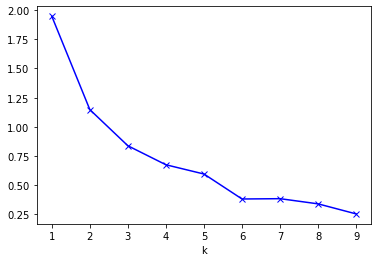

In [206]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
K = range(1, 10)
mean_distortions = []
for k in K:
    print("k",k)
    kmeans = KMeans(n_clusters=k,random_state=2022)
    kmeans.fit(feat_v)
    mean_distortions.append(
        sum(
            np.min(
                cdist(feat_v, kmeans.cluster_centers_, metric='euclidean'), axis=1))
        / feat_v.shape[0])
plt.plot(K, mean_distortions, 'bx-')
plt.xlabel('k')
# font = FontProperties(fname=r'c:\windows\fonts\msyh.ttc', size=20)
# plt.ylabel(u'平均畸变程度')



In [207]:
kmeans = KMeans(n_clusters=5,random_state=2022)
kmeans.fit(feat_v)
label_cluster = kmeans.predict(feat_v)
feat_v_cp = feat_v.copy(deep=True)
feat_v_cp['label'] = label_cluster
feat_v_cp.head()

,sell_len,buy_len,buy_sell_len,sell_cnt,buy_cnt,label
0,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0
1,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0
2,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0
3,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0
4,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0


In [208]:
def kmeans_outliers(data, clusters, is_scale = True):
    # 指定聚类个数，准备进行数据聚类
    kmeans = KMeans(n_clusters=clusters)
    # 用于存储聚类相关的结果
    cluster_res = []

    # 判断是否需要对数据做标准化处理
    if is_scale:
        std_data = scale(data) # 标准化
        kmeans.fit(std_data)  # 聚类拟合
        # 返回簇标签
        labels = kmeans.labels_
        # 返回簇中心
        centers = kmeans.cluster_centers_

        for label in set(labels):
            # 计算簇内样本点与簇中心的距离
            diff = std_data[np.array(labels) == label,] - \
                   - np.array(centers[label])
            dist = np.sum(np.square(diff), axis=1)
            # 计算判断异常的阈值
            UL = dist.mean() + 3*dist.std()
            # 识别异常值，1表示异常，0表示正常
            OutLine = np.where(dist > UL, 1, 0) 
            raw_data = data.loc[np.array(labels) == label,]
            new_data = pd.DataFrame({'Label':label,'Dist':dist,'OutLier':OutLine})
            # 重新修正两个数据框的行编号
            raw_data.index = new_data.index = range(raw_data.shape[0])
            # 数据的列合并
            cluster_res.append(pd.concat([raw_data,new_data], axis = 1))
    else:
        kmeans.fit(data)  # 聚类拟合
        # 返回簇标签
        labels = kmeans.labels_
        # 返回簇中心
        centers = kmeans.cluster_centers_

        for label in set(labels):
            # 计算簇内样本点与簇中心的距离
            diff = np.array(data.loc[np.array(labels) == label,]) - \
                   - np.array(centers[label])

            dist = np.sum(np.square(diff), axis=1)
            UL = dist.mean() + 3*dist.std()
            OutLine = np.where(dist > UL, 1, 0)
            raw_data = data.loc[np.array(labels) == label,]
            new_data = pd.DataFrame({
#                 'Label':label,
                'Dist':dist,'OutLier':OutLine})
            raw_data.index = new_data.index = range(raw_data.shape[0])
            cluster_res.append(pd.concat([raw_data,new_data], axis = 1))
    # 返回数据的行合并结果    
    return pd.concat(cluster_res)

cluster_res_new = kmeans_outliers(feat_v_cp[feat_cols],5,False)
cluster_res_new = cluster_res_new.drop_duplicates()
cluster_res_new.head()


,sell_len,buy_len,buy_sell_len,sell_cnt,buy_cnt,Dist,OutLier
0,0.948278,0.385855,0.394407,-0.550331,-0.555741,8.158575,0
1,1.540634,1.602096,1.624030,-0.550331,-0.555741,19.291981,0
2,0.355922,0.385855,0.394407,-0.550331,-0.555741,6.448471,0
4,0.948278,0.993975,1.009219,-0.550331,-0.555741,11.771536,0
32,1.540634,0.385855,-0.220405,-0.550331,-0.555741,9.472172,0


In [209]:
cluster_res_new['OutLier'].shape

(394,)

In [210]:
cluster_res_new.drop_duplicates().shape

(394, 7)

In [211]:
# cols_save = []

feat_v_cp_new = feat_v_cp.merge(cluster_res_new,how='left',on=feat_cols)
feat_v_cp_new.head()

,sell_len,buy_len,buy_sell_len,sell_cnt,buy_cnt,label,Dist,OutLier
0,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0,9.055949,0
1,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0,9.055949,0
2,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0,9.055949,0
3,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0,9.055949,0
4,-0.828791,-0.830386,-0.835217,-0.550331,-0.555741,0,9.055949,0


In [212]:
feat_v_cp_new.shape

(248703, 8)

In [213]:
feat_v_cp_new['OutLier'].value_counts()

0    248126
1       577
Name: OutLier, dtype: int64

In [214]:
feat_v_cp.columns.tolist()

['sell_len', 'buy_len', 'buy_sell_len', 'sell_cnt', 'buy_cnt', 'label']

In [215]:
'done'

'done'

In [216]:
# feat_v_cp.shape

In [217]:
nft_data_merge['cluster_label'] = label_cluster
nft_data_merge['outer_label'] = feat_v_cp_new['OutLier'].tolist()
nft_data_merge.head()

,nft_token_id,seller_address,buyer_address,amount,rank3,block_timestamp,transaction_hash,seller_address_1,buyer_address_1,amount_1,...,buy_cnt,s/bs,b/bs,amount_num,amount_mean,amount_std,gap_time_mean,gap_time_std,cluster_label,outer_label
0,30000,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,0,2.0,2.0,0,0.0,NaN,NaN,NaN,0,0
1,30001,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,0,2.0,2.0,0,0.0,NaN,NaN,NaN,0,0
2,30002,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,0,2.0,2.0,0,0.0,NaN,NaN,NaN,0,0
3,30003,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,0,2.0,2.0,0,0.0,NaN,NaN,NaN,0,0
4,30004,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,0,2.0,2.0,0,0.0,NaN,NaN,NaN,0,0


In [218]:
nft_data_merge[nft_data_merge['outer_label'] == 1]['nft_token_id'].tolist()[:20]

['75311',
 '65693',
 '90951',
 '72166',
 '88458',
 '73501',
 '59490',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599',
 '78599']

In [219]:
nft_id = '47328'
nft_data_merge[nft_data_merge['nft_token_id'] == nft_id]

,nft_token_id,seller_address,buyer_address,amount,rank3,block_timestamp,transaction_hash,seller_address_1,buyer_address_1,amount_1,...,buy_cnt,s/bs,b/bs,amount_num,amount_mean,amount_std,gap_time_mean,gap_time_std,cluster_label,outer_label
17370,47328,0x0000000000000000000000000000000000000000,0x2eafccd1b84f0261c22f4d0c1e4da2985b529b54,0.000,1.0,2022-05-01 01:04:16,0x8f29884520fe829466a35576225ea4513677f641a14e...,NaN,NaN,NaN,...,0,2.000000,2.000000,0,0.000000,NaN,NaN,NaN,0,0
163005,47328,0x2eafccd1b84f0261c22f4d0c1e4da2985b529b54,0xfc0247cdaabc166423915077b666fa3bb9d1ee4d,0.000,2.0,2022-05-02 21:31:36,0x710e6739c2ac1ab8328e8d58a1576324e93440550962...,0x0000000000000000000000000000000000000000,0x2eafccd1b84f0261c22f4d0c1e4da2985b529b54,0.000,...,0,1.500000,1.500000,0,0.000000,0.000000,73640.000000,NaN,0,0
172819,47328,0xfc0247cdaabc166423915077b666fa3bb9d1ee4d,0x5c1b1c716838d999592c6ee432eddd2f4c55e33d,0.000,3.0,2022-05-04 10:35:44,0xb891216c277d70616b283318eb4d38fc1de366eecbcb...,0x2eafccd1b84f0261c22f4d0c1e4da2985b529b54,0xfc0247cdaabc166423915077b666fa3bb9d1ee4d,0.000,...,0,1.333333,1.333333,0,0.000000,0.000000,40668.000000,9022.682528,2,0
173427,47328,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x1a49fce89d020dc189979c0d5a52b59a35742fcf,0.000,12.0,2022-05-04 11:17:06,0x69ea93848ab844a768a4b0b6d462a5b8423b4f9f3a17...,0x2f57ab3ac31f4113d465379f423539441d177dd2,0xabc9af9591794e5e30acc73facfe6237ac4a06fa,2.850,...,0,1.285714,1.142857,4,1.057900,1.418344,39423.222222,30191.801026,4,0
173429,47328,0x5c1b1c716838d999592c6ee432eddd2f4c55e33d,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,3.490,4.0,2022-05-04 11:17:06,0x69ea93848ab844a768a4b0b6d462a5b8423b4f9f3a17...,0xfc0247cdaabc166423915077b666fa3bb9d1ee4d,0x5c1b1c716838d999592c6ee432eddd2f4c55e33d,0.000,...,1,1.250000,1.250000,1,0.872500,1.745000,29594.000000,24331.046176,1,0
175585,47328,0x1a49fce89d020dc189979c0d5a52b59a35742fcf,0x0792ae449a90e18d7a9bdd79abd848f3235f88ca,0.000,5.0,2022-05-05 01:04:26,0xded61b8c6d103c284beb8ecd7955f6b8c80b2ff23d2e...,0x5c1b1c716838d999592c6ee432eddd2f4c55e33d,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,3.490,...,0,1.500000,1.500000,1,0.698000,1.560775,28635.500000,26229.360413,2,0
216194,47328,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0xc5cc11a1c5c91f4dcef48ee32147945540bcf297,0.000,13.0,2022-06-14 19:35:31,0xfca1b8bd7c366be55d2e899e9b85327fc3810952cb68...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x1a49fce89d020dc189979c0d5a52b59a35742fcf,0.000,...,0,1.142857,1.142857,4,1.057900,1.418344,30652.444444,21645.862377,4,0
216198,47328,0x0792ae449a90e18d7a9bdd79abd848f3235f88ca,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,2.050,6.0,2022-06-14 19:35:31,0xfca1b8bd7c366be55d2e899e9b85327fc3810952cb68...,0x1a49fce89d020dc189979c0d5a52b59a35742fcf,0x0792ae449a90e18d7a9bdd79abd848f3235f88ca,0.000,...,2,1.400000,1.200000,2,0.923333,1.501155,55013.400000,22419.595063,1,0
218312,47328,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x2f57ab3ac31f4113d465379f423539441d177dd2,0.000,14.0,2022-06-19 03:52:19,0x5ae7e47c7045754b8f5db5caf407dfe3ab9ac4ed3e63...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0xc5cc11a1c5c91f4dcef48ee32147945540bcf297,0.000,...,0,1.000000,1.142857,3,0.708900,1.159086,37937.666667,23309.000601,4,0
218314,47328,0xc5cc11a1c5c91f4dcef48ee32147945540bcf297,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,2.189,7.0,2022-06-19 03:52:19,0x5ae7e47c7045754b8f5db5caf407dfe3ab9ac4ed3e63...,0x0792ae449a90e18d7a9bdd79abd848f3235f88ca,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,2.050,...,3,1.600000,1.200000,3,1.104143,1.451459,32452.500000,23359.467406,1,1


In [220]:
nft_data_merge['cluster_label'].value_counts()

0    143326
3     38503
2     29333
1     22340
4     15201
Name: cluster_label, dtype: int64

In [221]:
from sklearn.ensemble import IsolationForest
model=IsolationForest(n_estimators=100, max_samples='auto', contamination=float(0.05))
model.fit(feat_v)
label2 = model.predict(feat_v)
nft_data_merge['label_iso'] = label2
nft_data_merge['label_iso'].value_counts()

 1    236911
-1     11792
Name: label_iso, dtype: int64

In [222]:
nft_data_merge.groupby(['label_iso','outer_label']).agg({'nft_token_id':'count'})

nft_token_id
label_iso outer_label              
-1        0                   11232
          1                     560
 1        0                  236894
          1                      17

In [223]:
nft_data_merge[(nft_data_merge['label_iso'] == -1) & (nft_data_merge['outer_label'] == 1)]['nft_token_id'].unique().tolist()[:10]

['75311',
 '65693',
 '90951',
 '72166',
 '88458',
 '73501',
 '59490',
 '78599',
 '55228',
 '99909']

In [243]:
nft_data_merge[(nft_data_merge['label_iso'] == -1) & (nft_data_merge['outer_label'] == 1) & (nft_data_merge['seller_address'] !=zero_nft)].iloc[20:30]

,nft_token_id,seller_address,buyer_address,amount,rank3,block_timestamp,transaction_hash,seller_address_1,buyer_address_1,amount_1,...,s/bs,b/bs,amount_num,amount_mean,amount_std,gap_time_mean,gap_time_std,cluster_label,outer_label,label_iso
172204,78599,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,54.16,20.0,2022-05-04 07:21:51,0x5154267ba3ba1e7156632969082a9c9e90be8aa81fa9...,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,54.44,...,1.0,1.0,10,53.508,1.337060,17738.333333,16205.544784,3,1,-1
172219,78599,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,53.82,21.0,2022-05-04 07:24:31,0x8ed3f794d58cd72b243b7ae1f8f0ac2d9ecb5cc00748...,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,54.16,...,1.0,1.0,10,53.612,1.314397,14323.555556,16171.869853,3,1,-1
172225,78599,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,53.53,22.0,2022-05-04 07:27:15,0xac9c7449cfb81633c2913db361efda019f8dfe5e817c...,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,53.82,...,1.0,1.0,10,53.710,1.261903,10913.888889,15265.212171,3,1,-1
172249,78599,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,53.22,23.0,2022-05-04 07:34:36,0x633fa9ad52ee5473bc5fafb742c4ed46652dc600b2fc...,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,53.53,...,1.5,1.0,10,53.817,1.155836,7815.444444,13379.309839,3,1,-1
172253,78599,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,52.84,24.0,2022-05-04 07:36:47,0xe2e621c8acf1ed3ef7f987d84357d53848b509a74cab...,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,53.22,...,1.0,1.0,10,53.903,1.029002,4422.888889,10064.444004,3,1,-1
172261,78599,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,52.54,25.0,2022-05-04 07:40:44,0x915f2e6b23c92a356865f827f25020db03b69ba129c0...,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,52.84,...,1.0,1.0,10,53.957,0.927171,1191.444444,685.970683,3,1,-1
172263,78599,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,52.42,26.0,2022-05-04 07:42:29,0xd296b67383ed94a418a9da47623e467a72b87f30b0ad...,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,52.54,...,1.0,1.0,10,53.671,0.914749,1045.666667,659.788981,3,1,-1
172279,78599,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,52.27,27.0,2022-05-04 07:45:11,0x3cca01582ed7d6d273cf8f49036e310cdbc08d25bc64...,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,52.42,...,1.0,1.0,10,53.396,0.876714,974.666667,610.541563,3,1,-1
172285,78599,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,52.01,28.0,2022-05-04 07:47:53,0xb7644ea7dd9950f9341dc39ececc1ec6c32118f42b44...,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,52.27,...,1.0,1.0,10,53.125,0.840056,927.444444,582.347429,3,1,-1
172289,78599,0xbdb17158810ed728376e9e53f260e64bbad46098,0xb700823966b8b32152dd286e487483c9c4bdbe25,51.77,29.0,2022-05-04 07:49:29,0xbf5d8c9ec1cea20fc0979c468ef2cffd058149d504bc...,0xb700823966b8b32152dd286e487483c9c4bdbe25,0xbdb17158810ed728376e9e53f260e64bbad46098,52.01,...,1.0,1.0,10,52.858,0.798969,827.111111,561.405256,3,1,-1


In [225]:
zero_nft

'0x0000000000000000000000000000000000000000'

In [226]:
# nft_data_merge[ (nft_data_merge['outer_label'] == 1) & (nft_data_merge['seller_address'] !=zero_nft) ].head(10)

In [227]:
nft_data_merge.groupby(['label_iso','cluster_label']).agg({'nft_token_id':'count'})

nft_token_id
label_iso cluster_label              
-1        1                      4130
          2                       427
          3                      1017
          4                      6218
 1        0                    143326
          1                     18210
          2                     28906
          3                     37486
          4                      8983

nft-id 75311
mark_dict {'0xeb1e80d75c738763f06a9f85d97c1f8eabfa8caf': 0, '0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 1, '0x0000000000000000000000000000000000000000': 2, '0x4ddcf85d88d019cf859c5ef799e8dd7e02fad5cb': 3, '0xa7b7c0de69ed9871b15d8e91cd52f023dbf8fe92': 4, '0x7af0d3e3f5674fabc3e76f0baf71222d04ca597c': 5}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


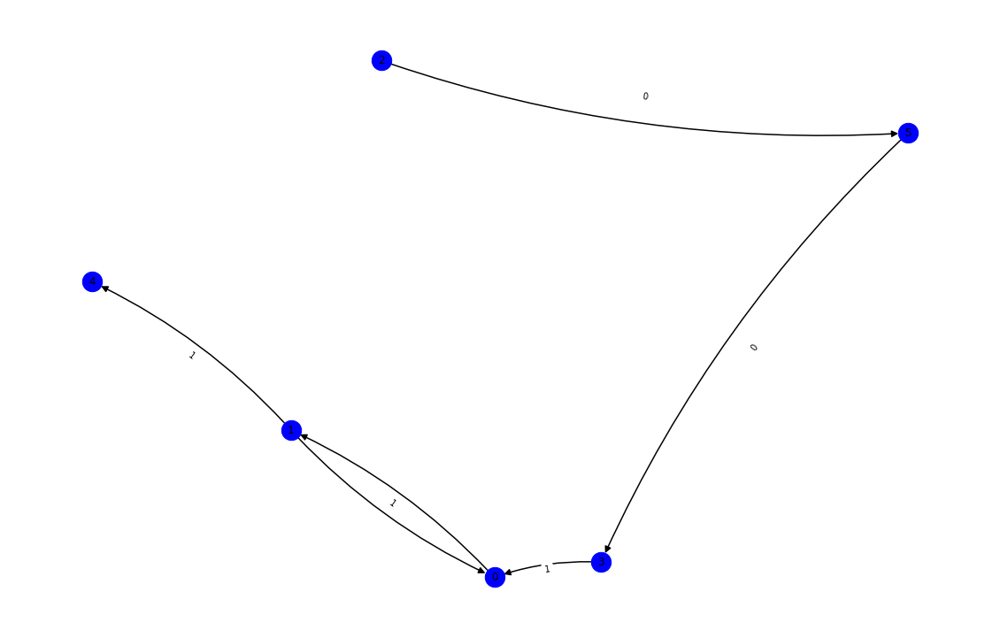

nft-id 65693
mark_dict {'0xef3ae82d5f0068fac8a1e0e4d03d8d5bba96f1be': 0, '0xd310a932cb1db29cdeff5a7b6fc34ac7b4f0ed8c': 1, '0xb00969aef4656cc53b43d6d375dcaaafeb9b0c5f': 2, '0x0000000000000000000000000000000000000000': 3, '0x727dc03c61695c07792e234b33874f5261300b08': 4, '0x1feb5b84f4e4845ff98d016fba3f00b2e19677d3': 5, '0xe42ad541de6b13fe4edf35c825c9ed5f45eecac3': 6, '0x4a9d2e2642afe722d9ea50a5559321b4ec0d45e5': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


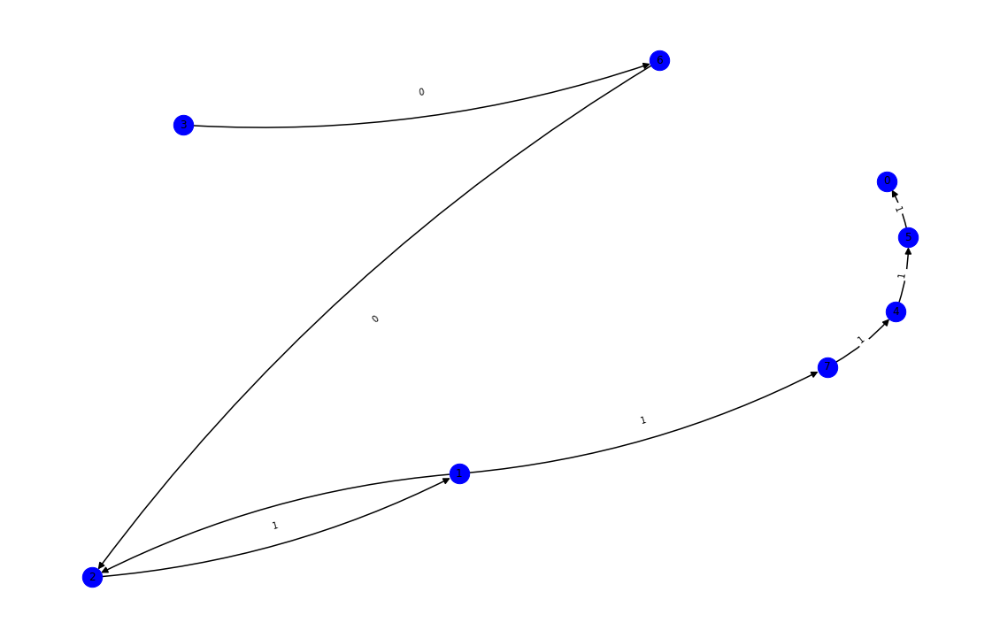

nft-id 90951
mark_dict {'0xb0de41cf75e0396f859384d5f34e8d6f0b41e994': 0, '0x9b1020ee4bfbf31706979a45e931eb7e6047303d': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x6cfdad0772edc2ea15076a9706ec7c1f0a791ac1': 3, '0x8117cd8fc64f9a408c22a1c721b3df42b85ca6ff': 4, '0x0000000000000000000000000000000000000000': 5, '0xeb0b82bb5066f329d1a449bda99ed8c8b1c857ac': 6, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 7, '0xdc3ed2238350aacb484aa6b0d17c4fc3353f0046': 8, '0xf640dec7aa512b813508f9cc82310589f6aa1eb0': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


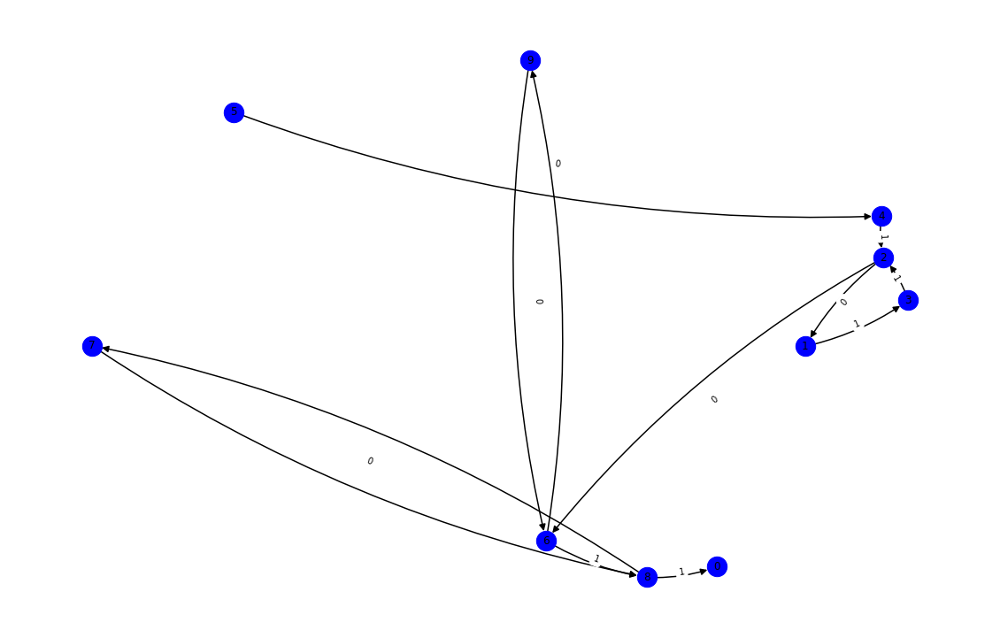

nft-id 72166
mark_dict {'0xf1ca4bf4c325c3078ec25299601a519ebc6bea6d': 0, '0x0f3e5f4d5033c8eeae3b5feac3c6c51a23c7a852': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x9e9346e082d445f08fab1758984a31648c89241a': 3, '0x1f26fb0c7a32ccfe7d89823227059c5f683aeb1d': 4, '0x769c5e2b3fbd61943be00efbfe9a94c03e0bbd2c': 5, '0xfae1301c970161f251fb5c2ac8b0cce66adf56be': 6, '0x62ad13dea5561bb80051780678c26bef1636ce4f': 7, '0x0000000000000000000000000000000000000000': 8, '0xdb912fab7ab5fd40f17fd470573b3b999c62232c': 9, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 10, '0x70f44d2068c9e130096bf3305625ecc8b1334bd1': 11, '0x277c79c8a4ac00f8bde6af6ba06ac0f2071ece90': 12, '0x8888f5b5bb7bed9beb904437c9b51fc432915888': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


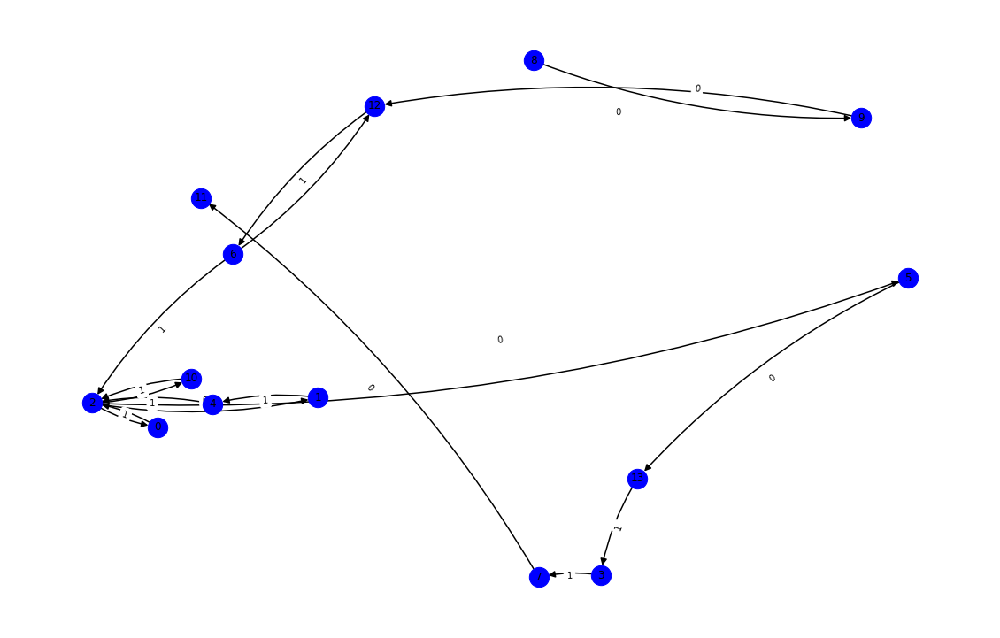

nft-id 88458
mark_dict {'0x786d0f4a0f032a3ea1ad227876ff005270d9fdda': 0, '0x2b0d3861b312b4d00f2e40d2c3fb1258a23adf25': 1, '0xc628485044d0dabded1a8e8ee83e1a9543acf401': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x8a9816193e1c84ec67db92324d7084192bf9d711': 5, '0x3055b4a85cd135728af28926a1ea2379925d90a2': 6, '0x32273f5f668e0d94ed7db7eb9908efc3a17e7483': 7, '0xbbc92cc8c8b73daaedfec30c01dad525f52b7c29': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


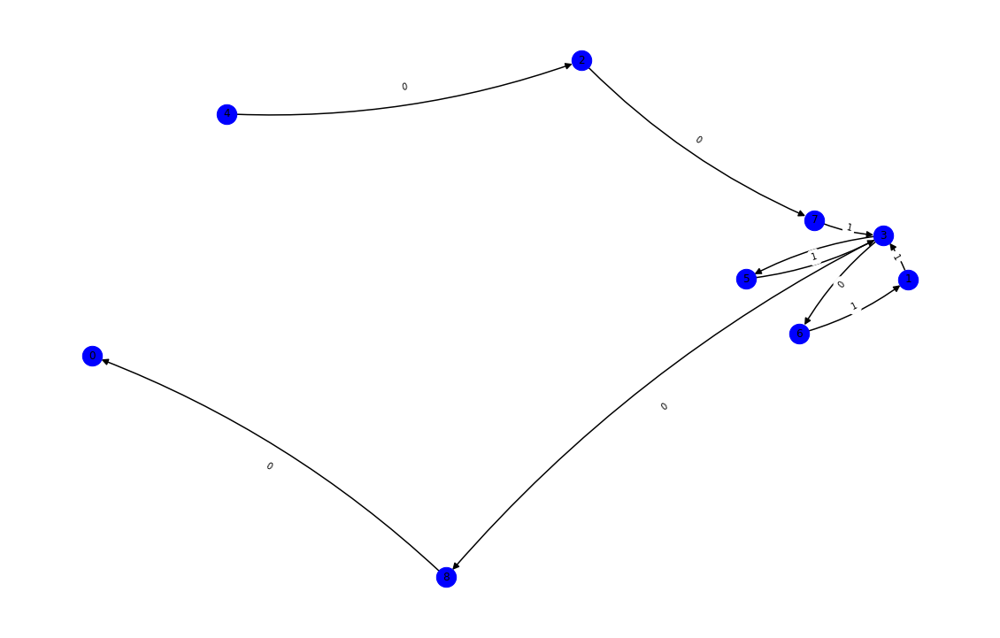

nft-id 73501
mark_dict {'0xfa3949fde585114b8ec981eb6aae3c232c832fc2': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xc4ed448e7d7bdd954e943954459017be63584f69': 3, '0x6a727064ac4cbd1f3f1286a2e2161a867c34988e': 4, '0x0000000000000000000000000000000000000000': 5, '0x3e8d3cbcc30a5ae702ac5d9537992b154151e93b': 6, '0xa15aad03a4f9c46161783398fe6d93ba18fda366': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


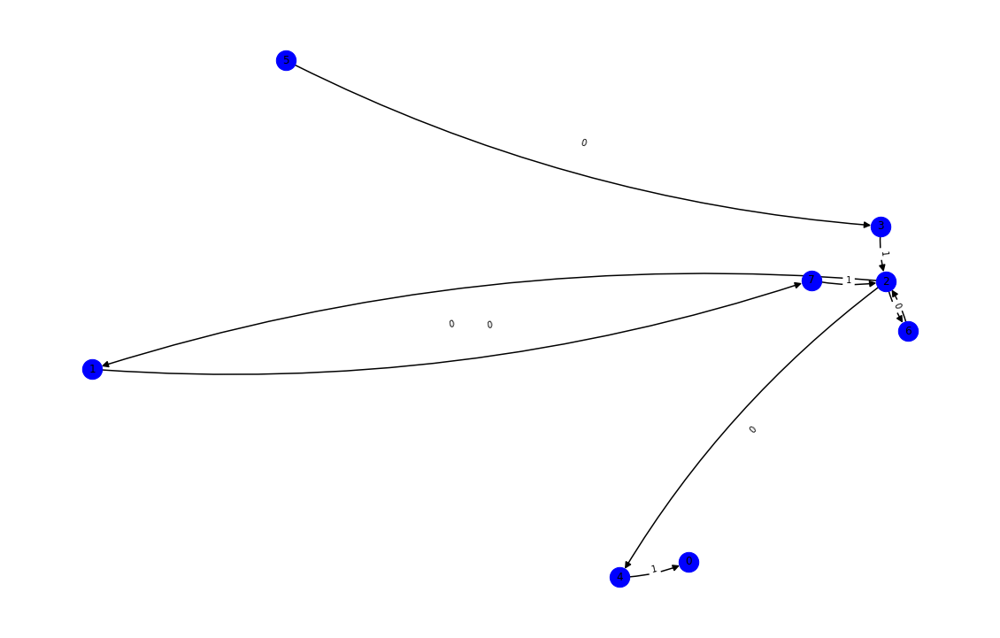

nft-id 59490
mark_dict {'0x0000000000000000000000000000000000000000': 0, '0x89d73a8f14226bad6bdfff8282f69c2b7816a57b': 1, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 2, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 3, '0x83742faddde0b5b2b307ac46f24a1c118d332549': 4, '0x7d8391a9d2199b3afa76e7824164503bb2fcc4bd': 5, '0x380ef0a3d6a9d00d623209fe130a1db08d27572d': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


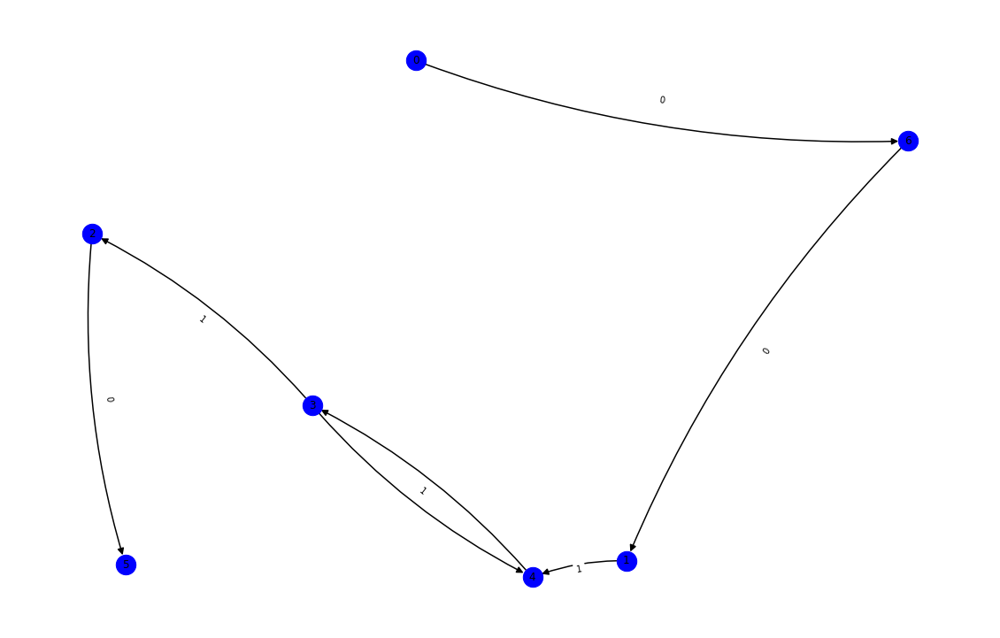

nft-id 78599
mark_dict {'0x786d0f4a0f032a3ea1ad227876ff005270d9fdda': 0, '0xbdb17158810ed728376e9e53f260e64bbad46098': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 4, '0xbbc92cc8c8b73daaedfec30c01dad525f52b7c29': 5, '0x855868513c47303287a6bf24967e0716bb419984': 6, '0x02745c2e8c9c4fa7f8994dbcfcb59c5ed70ebe4e': 7, '0x40dd8c2473eafdac3cf40c7a60d9f8ab7c07991e': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


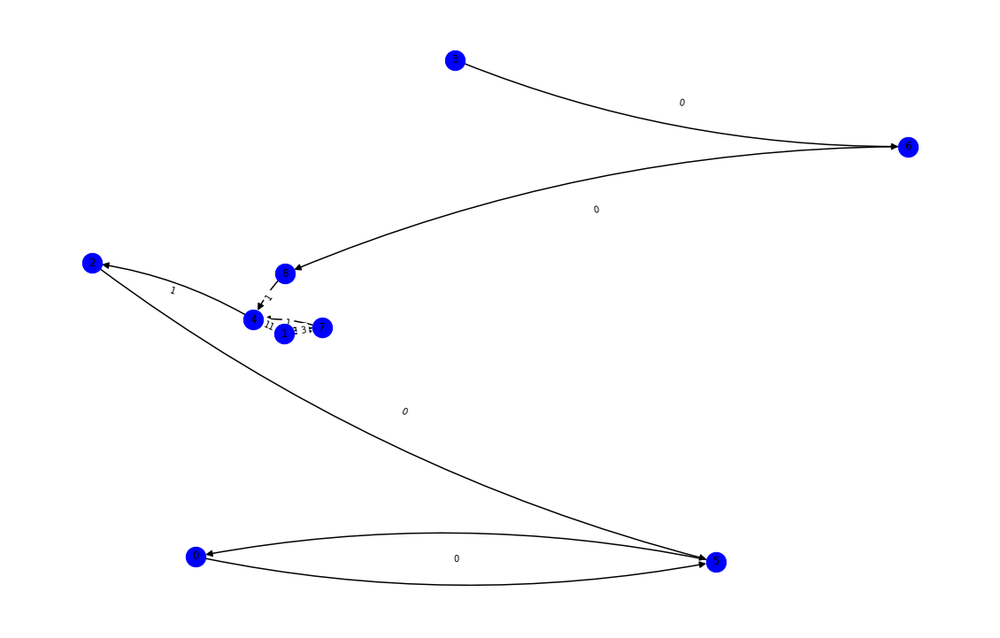

nft-id 55228
mark_dict {'0x18d82cc691754ea6db4018004de61fce8a63f392': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x5ab03eebcef1fe5877c8961c10d213eae764943b': 2, '0xfa1d0f42cc11fe624baece457360a48597c1541d': 3, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 4, '0x40dd8c2473eafdac3cf40c7a60d9f8ab7c07991e': 5, '0x9b0cdbe10802ebeafd0b4871a10d4b4763101b79': 6, '0xbdb17158810ed728376e9e53f260e64bbad46098': 7, '0x4709d9698b52a553aac67bb89e9a8d691baf136a': 8, '0x0000000000000000000000000000000000000000': 9, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 10, '0xec6286fb381761a4637305926a7ac215a2a50be8': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


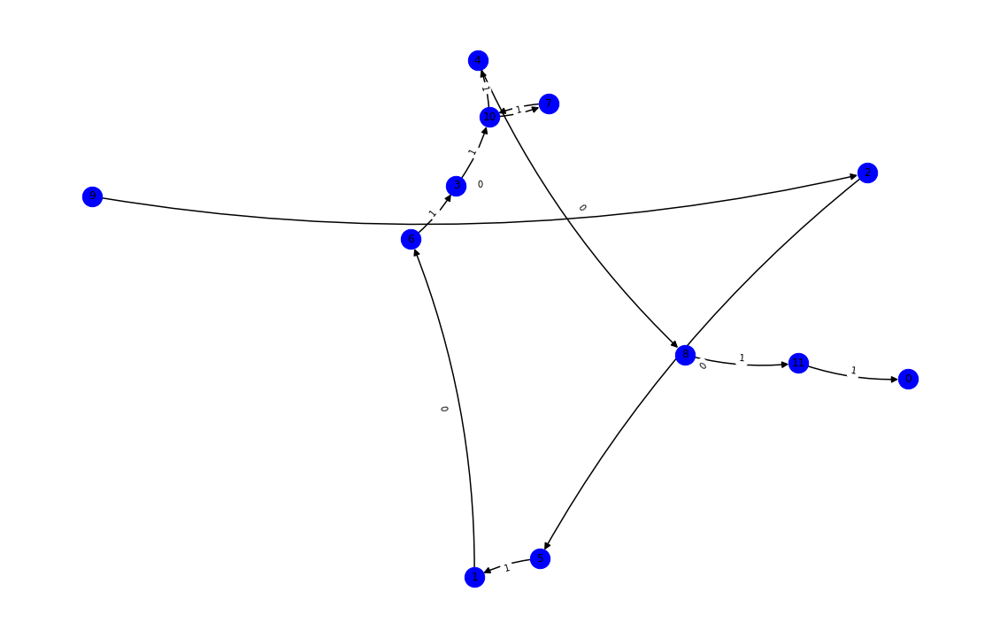

nft-id 99909
mark_dict {'0xbdb17158810ed728376e9e53f260e64bbad46098': 0, '0xec52611203ab1c98af7667299c15b4f0b69f0f4d': 1, '0x0000000000000000000000000000000000000000': 2, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 3, '0x1d8d325cc613806422f93934652496493081f999': 4, '0x85d30b5a70259923e7da4ce433985c55cd095bb9': 5, '0xdfeaad5d1bbd38e94480d34d0444f0f19ca8ebe6': 6, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


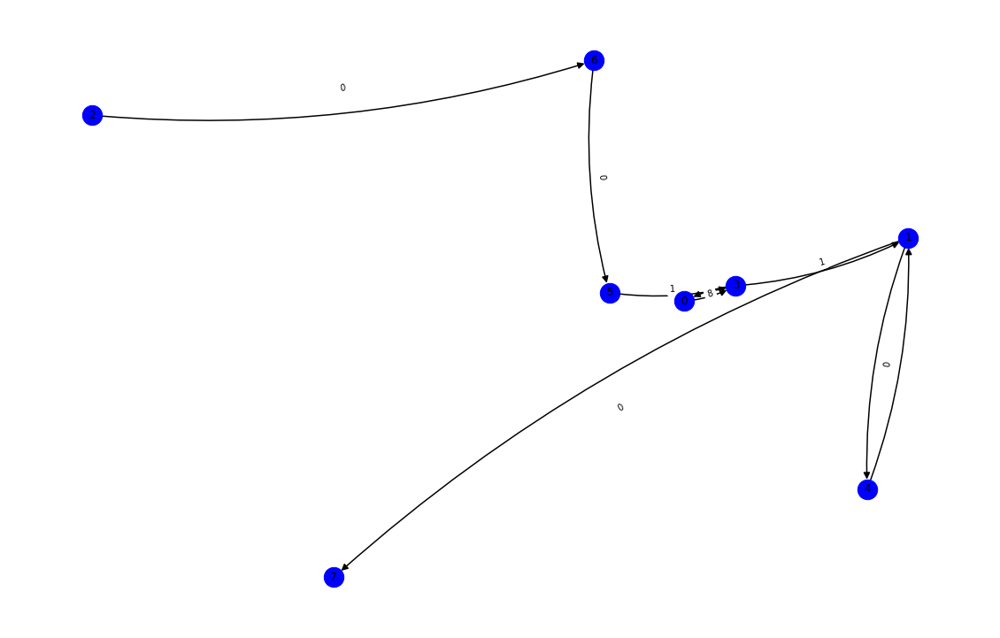

nft-id 98585
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x009e1203889e3388f0f2f8ee76c55a4393520e11': 1, '0x1bdf29506f5ff1c97055f416fcd4f8fb19fc1f64': 2, '0xfaa39bb9ec02da01292c957f486a38df9ba7093f': 3, '0xfbc42b6d570e9e9f14a1bf0a39c85ad2b8f03ba5': 4, '0x46531bed29bc6ee4b72c49e73f6376e312e54a2c': 5, '0xf195ae9369cae55d585fd839ae9255b11c06b455': 6, '0x447b2a57e78fbafff7d6e17285174524c3acdcb6': 7, '0x94e0168ee85d83aee746214c904b5628e4d83d36': 8, '0xe18b4d6ee68143973e06e84dcc4a572329eaba89': 9, '0xf386883454a570e57c16b1cc7d34e9445a28c68b': 10, '0x0000000000000000000000000000000000000000': 11, '0x2c79ac9f76c3310b59d4c5e3fd214a73aec68553': 12, '0xaf06e7ca8e77bd17dee07d7c7fcbd33d6689231a': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


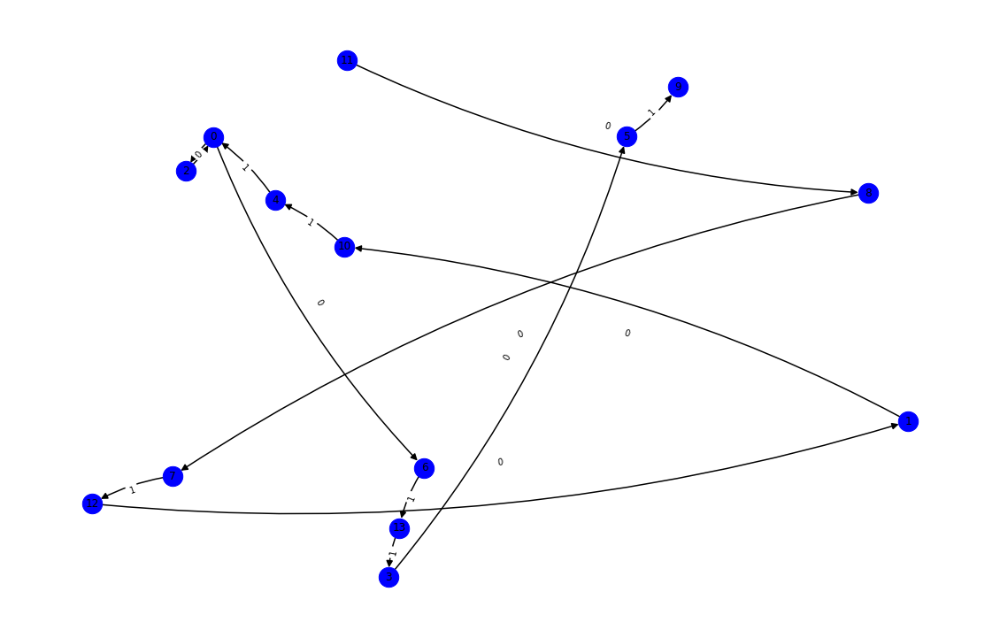

nft-id 90933
mark_dict {'0xa4963e7d8acff0b052f5b63274b7f08d0f6b0735': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x95deb63b5d3c9a193349a97e3d55b75e77b7e138': 3, '0x09adfab2635dcb681fada41ceb0bfa6f52effd97': 4, '0xf51adb1ee2a429504356ee22daf44ea4e452a1b7': 5, '0xe0c7adf301831c61b0a3fb8753cf4f2ecc5ff469': 6, '0xae9c73fd0fd237c1c6f66fe009d24ce969e98704': 7, '0x9dcb941440196fb41de694efcad4c48b9244227b': 8, '0xa79d25783244f13e3e1994b95cd1e27511becde9': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


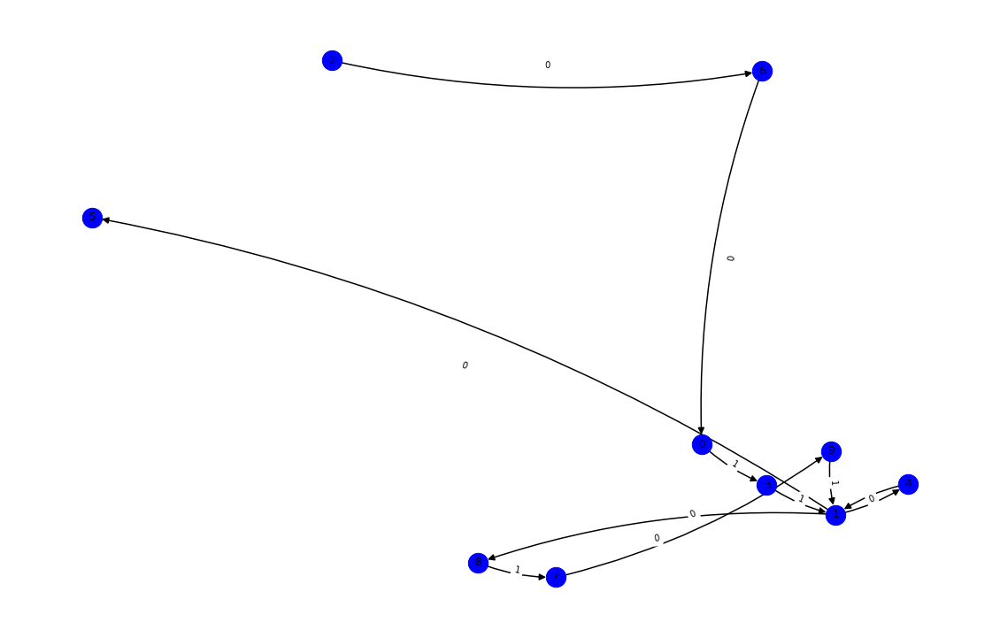

nft-id 54924
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xf726395cbdff226dba854d1bfb373210ecccbe52': 1, '0x3f703546e6af3e06d5a1653a352f0a05744d1928': 2, '0x0000000000000000000000000000000000000000': 3, '0x8285a64daa59e830bf6861f35f36e9ead2708529': 4, '0xc5ce6fea2d97622c00ce3fbf89ad4e90ca50cbed': 5, '0xa1bf766e566c06214fb47b9c904abe30241dd169': 6, '0x4c451056470da838c3a4c727931015bca23ed506': 7, '0xb1335d8283ee447f41de1dfac9c66f3384e79648': 8, '0xc7daf473c103aa2b112fe2f773e3a508a6999bb6': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


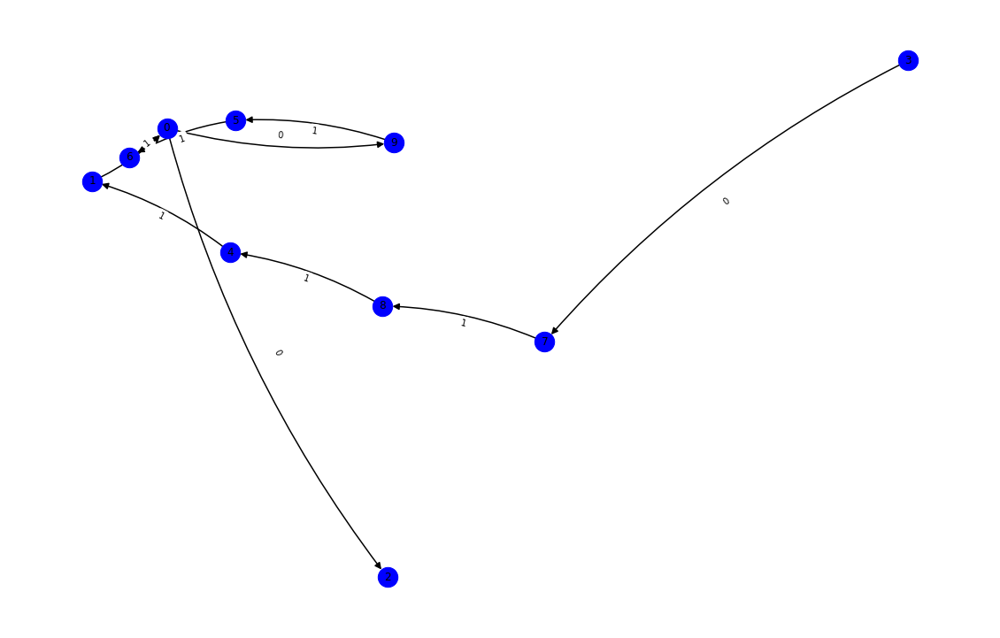

nft-id 68582
mark_dict {'0xceee247c09b2a31c2959dd22d0d3395055070874': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x864d2437ed789ccec3107727cc0cf65b0cd0a3b9': 2, '0xaa114724f2bcbd859d01585435e3076671314d2e': 3, '0xab8c9ebaa8bc5db4a3135c6ef9f24f8143108e79': 4, '0xb74cae0866ab29b1a15fad8ff942ade413fd5128': 5, '0xbdd95abe8a7694ccd77143376b0fbea183e6a740': 6, '0x0000000000000000000000000000000000000000': 7, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 8, '0xb1335d8283ee447f41de1dfac9c66f3384e79648': 9, '0x23819f5596942e3098e1f924445eabcc79f7a40b': 10, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


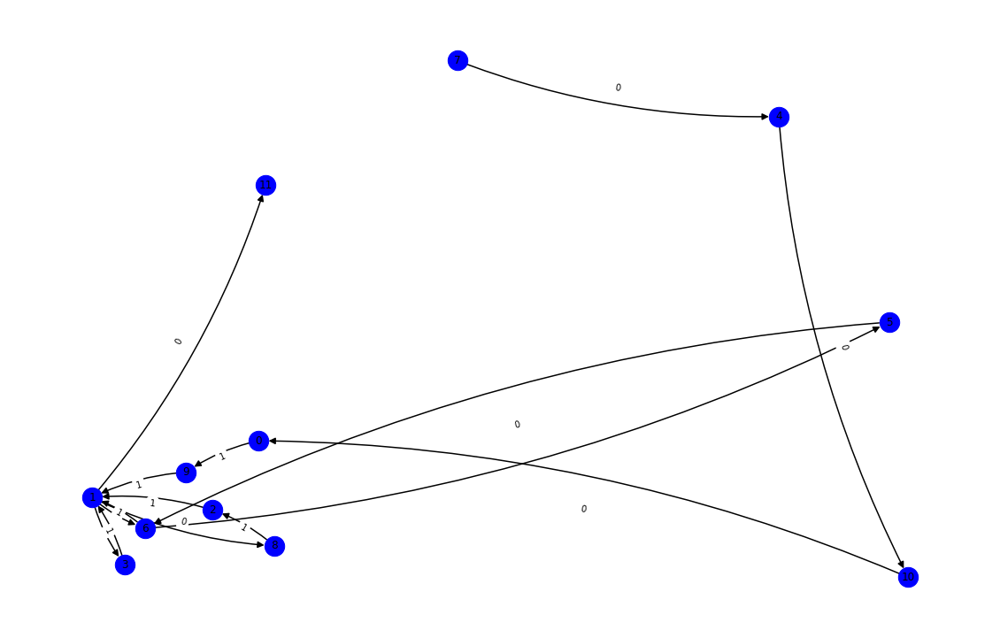

nft-id 71997
mark_dict {'0x9e6a7521ee6bf10e47d16cbd2f679624bdf24bd8': 0, '0x699fa86c16ec249334bc19bd96d672f68fdaa789': 1, '0x310174f06a941a0251f89a9ce2f8a5bfa552f74d': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0xdcd78732bdee9d16741019cdf54a34f2384333c3': 4, '0xf35e261393f9705e10b378c6785582b2a5a71094': 5, '0x4d4d5236d1160698e21b44fcf6b35797081c8fdf': 6, '0xf025642ccf12d67c06e8ede7e8d73c0677f0c190': 7, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 8, '0xcfa6a349a1e9c5f3bf109d5f00232f3855004567': 9, '0x0000000000000000000000000000000000000000': 10, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 11, '0xd87a9fc25130c68c3ea25437c34e0b9317cd7a3d': 12, '0xe0ef70fb707484e60500f0b2653b928128ac0a1b': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


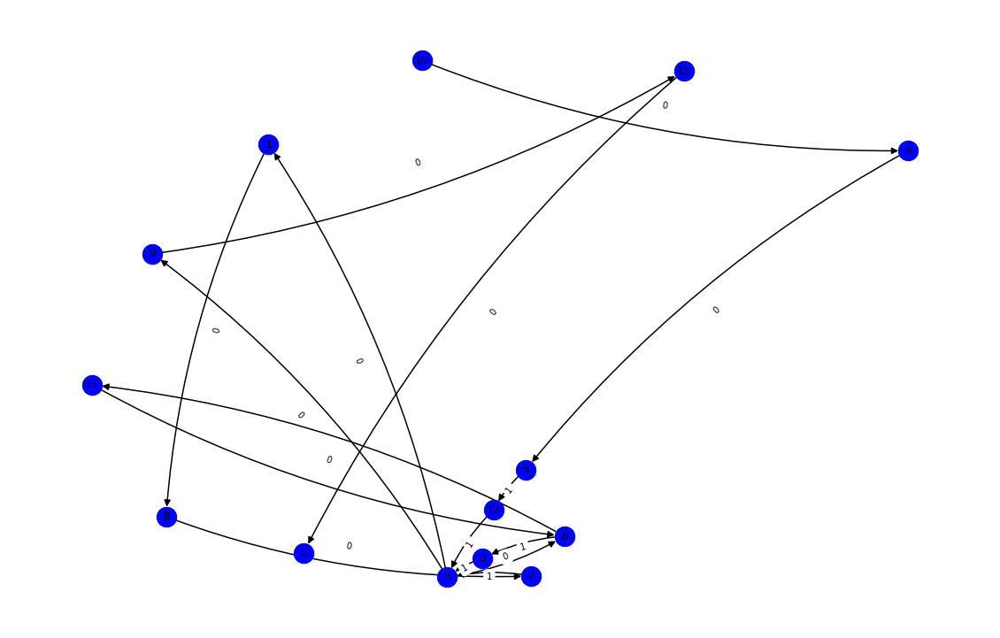

nft-id 81641
mark_dict {'0x392f863ad0a11ef222bec720b772f17e6dca3749': 0, '0xcf7820c0e830436ebb55ed051c042e5b913f8d9a': 1, '0x0000000000000000000000000000000000000000': 2, '0xf14afa6a2960a3e79a9a1d617405907f67a7f9d4': 3, '0xc105cb12f089424ec670c80c63ee01fc7da7a339': 4, '0x998463dd08ca19b52463db5f56b91a66dc7e7a3e': 5, '0x99c85e35d1a9b0fa0206db8165e8f6c150191131': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


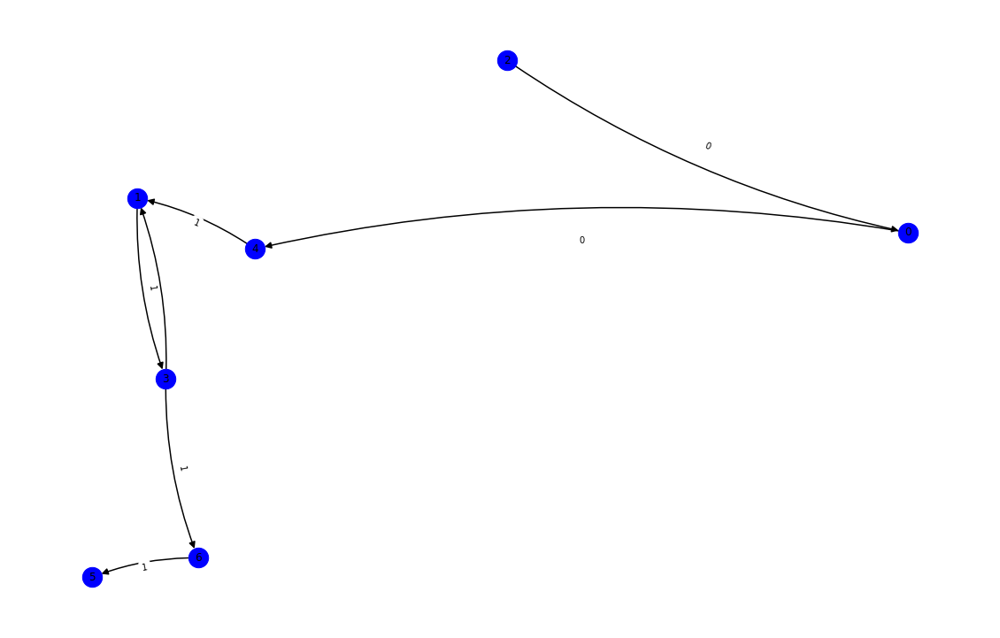

nft-id 93582
mark_dict {'0xbdb17158810ed728376e9e53f260e64bbad46098': 0, '0x06fdaa3045904d500b883fed2fa64694ed9e8aa2': 1, '0xcbf3c9b38003fa550a7bff5206366c1f62480ba7': 2, '0xf22f00d0b95b1b728078066e5f4410f6b2be8fae': 3, '0x0000000000000000000000000000000000000000': 4, '0x72774e2fe1992d5da8c6e9cef73fd2ab980c0b98': 5, '0x39f8c1f090e6739966e01a4d2fc210b110c9bf8e': 6, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 7, '0x6f0e9e8e043befcb1b802aac6bf8b854c5e14e2c': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


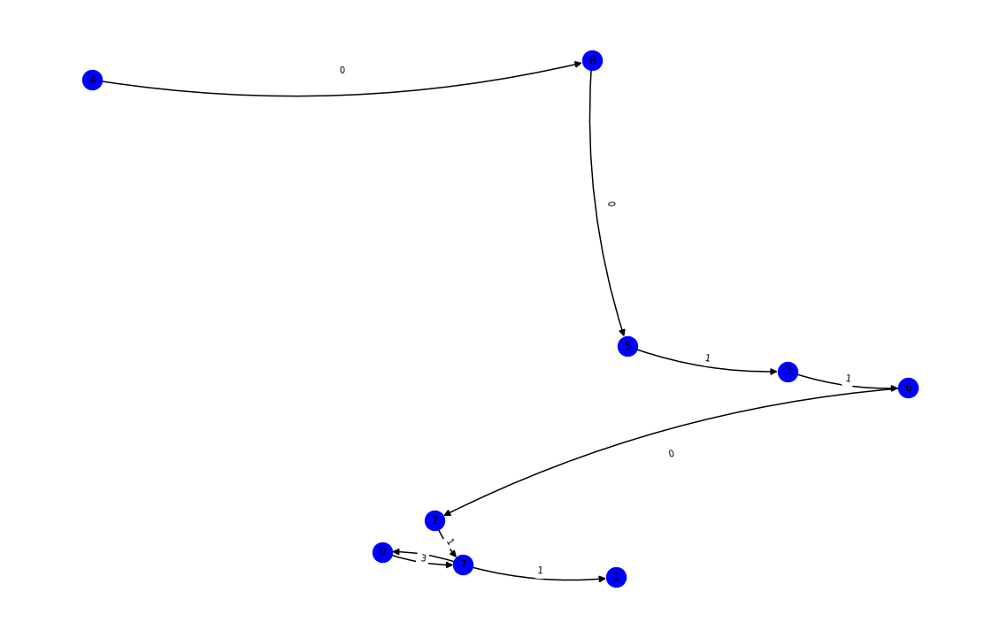

nft-id 55343
mark_dict {'0x939c076156879fafcca8c601fb4fc6f348f8c7af': 0, '0x837e6fd5d2b39b6fd2791ba8a4a364d104c18e15': 1, '0x2156001ecebe8fdcd46c0c9be0738d48b2e98d58': 2, '0x0000000000000000000000000000000000000000': 3}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


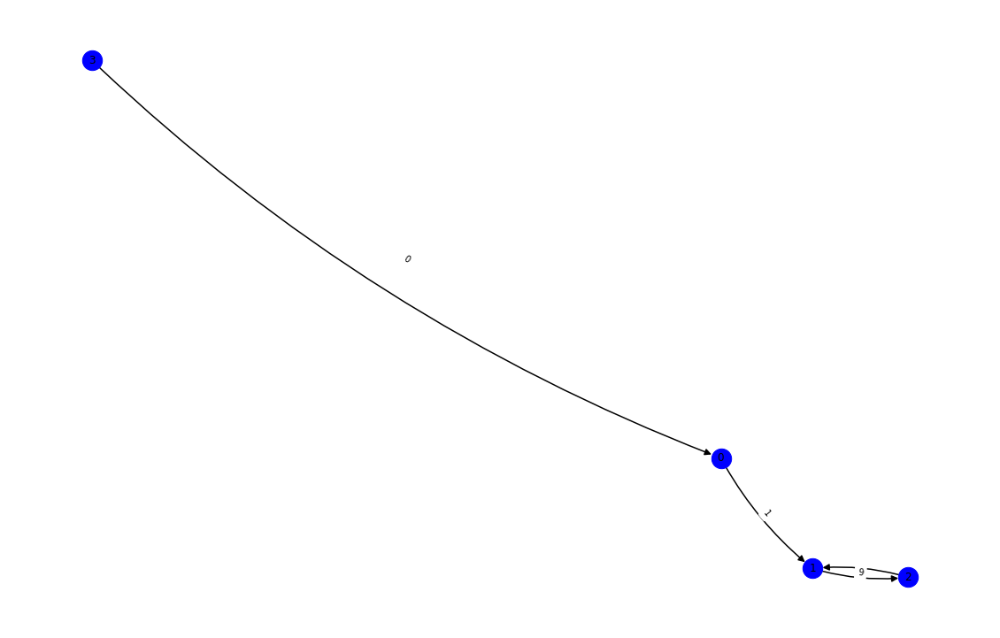

nft-id 48496
mark_dict {'0x9dbd781eeba135ad2a779926880adc89196a3265': 0, '0x90ba0908593f8f46d9e1afadeeae0b4e82042942': 1, '0xa7cf2b9d40363612891c6508cfe2db385e8633da': 2, '0x0000000000000000000000000000000000000000': 3, '0x028045c9ce959b00a0539603b492e09384fa4bae': 4, '0x128db0689c294f934df3f52e73877a78f2d783b5': 5, '0x9e523b589b08ebff834bd7cd302372a98474751a': 6, '0x2db86a59baaba8e187ba8738c7b46d43d42b776e': 7, '0xc299ad23bd6497042fe3aa3ef05883c2df30cf39': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


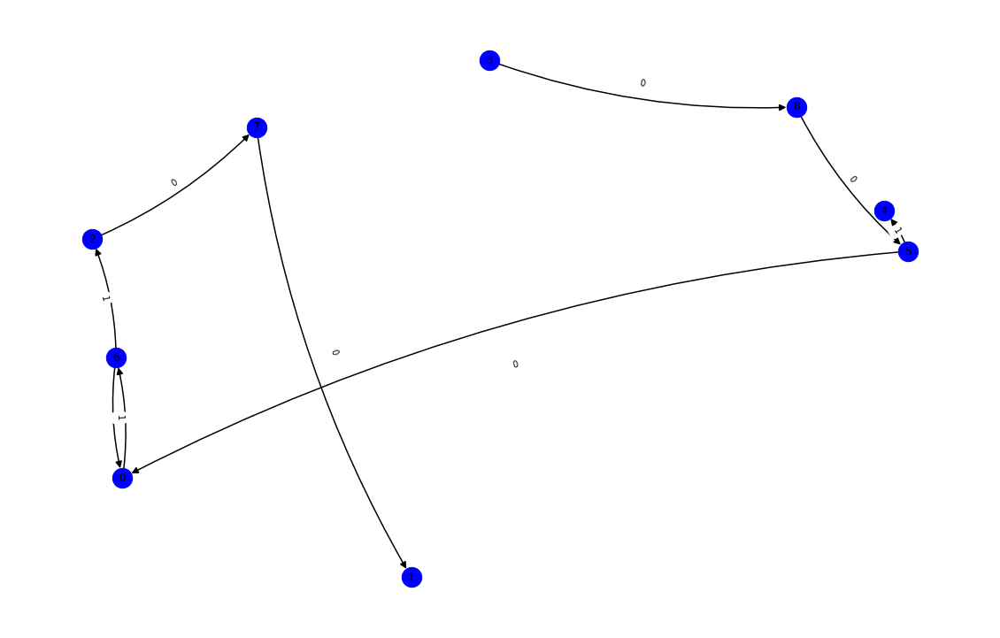

nft-id 82732
mark_dict {'0xbdb17158810ed728376e9e53f260e64bbad46098': 0, '0x4f3215bb59dbd3a868510ebc02971570778aa360': 1, '0x2af4b707e1dce8fc345f38cfeeaa2421e54976d5': 2, '0x0000000000000000000000000000000000000000': 3, '0x1cefd1809ac0c45e983a81be52e0be98fea9f653': 4, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 5, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 6, '0x4ff05543d3a53ce52da701fba2af11255f0a066c': 7, '0x853005211b719d734258155c19ef5fd59eabaf6c': 8, '0xbe7c3c0973d0c25e9e689a59ee296abd2546130d': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


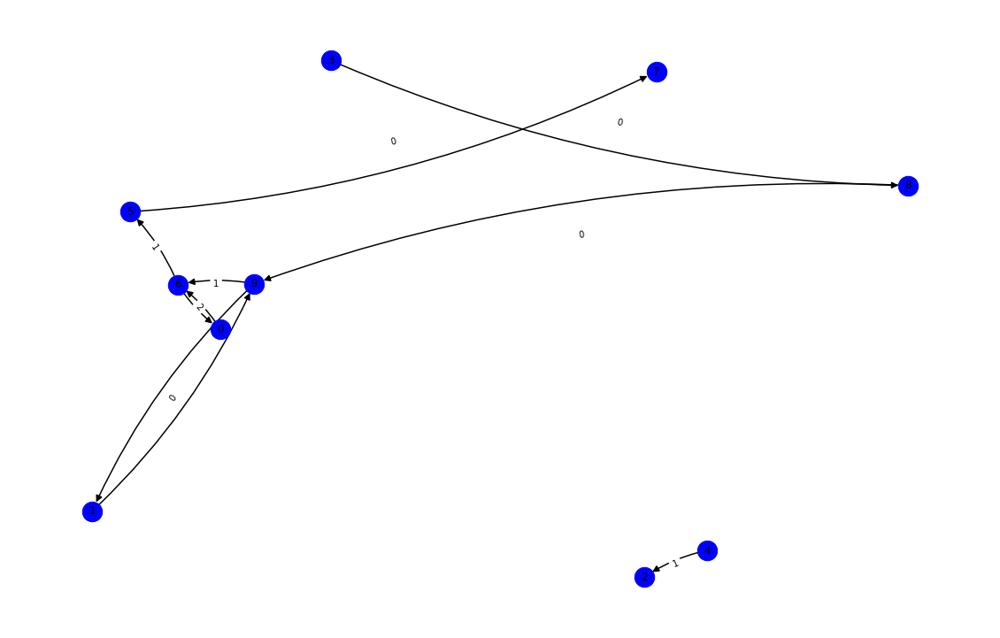

nft-id 95339
mark_dict {'0xbdb17158810ed728376e9e53f260e64bbad46098': 0, '0xa85fc696169a4e337f6102d8168a85a7162f5410': 1, '0x0000000000000000000000000000000000000000': 2, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 3, '0x0ec0b4bf33d028a0fd4777fd24bf001780bb91ff': 4, '0xdb3bd2038de441e9c7b01d02034bb99d61bcf3ad': 5, '0x545a2ed169eac188638763539d30951488a9c8f7': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


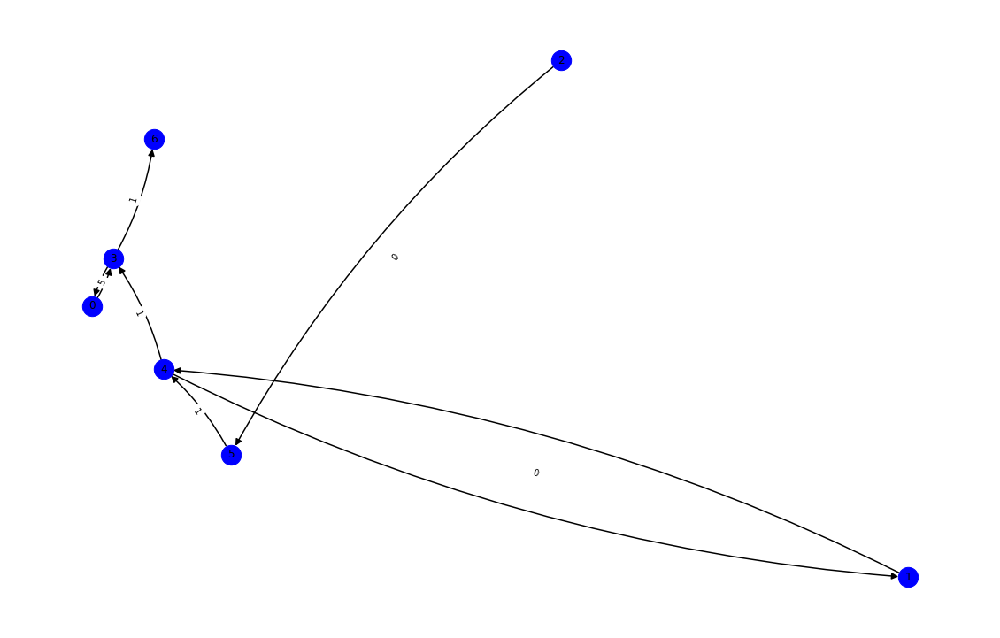

nft-id 95691
mark_dict {'0xbdb17158810ed728376e9e53f260e64bbad46098': 0, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 1, '0x0000000000000000000000000000000000000000': 2, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 3, '0xf44193629e3d1d175e6403e1f3b14d8ad05a189c': 4, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 5, '0x4682f2465436e97f25acf00484ae40eb60eb9a67': 6, '0x5197a65d2acaf35e9d197974907d48289a081a69': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


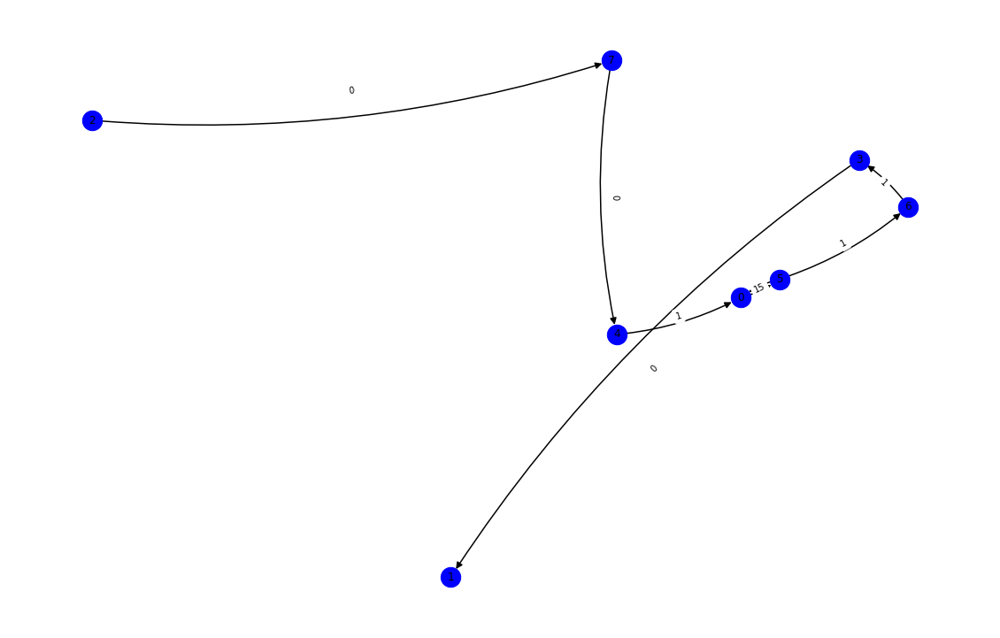

nft-id 96346
mark_dict {'0x08046e2349017615d53d3977c307d39ab4eeb3cf': 0, '0x0000000000000000000000000000000000000000': 1, '0xb23190e5e08772bbd8de4ec13b06069488522447': 2, '0xc24fc2e71eed2448b52fd7c87f0b5fb0cdb1dd4b': 3, '0x3d1bc92b1635a76193e67e86fa0b10cd8b8b1ab9': 4}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


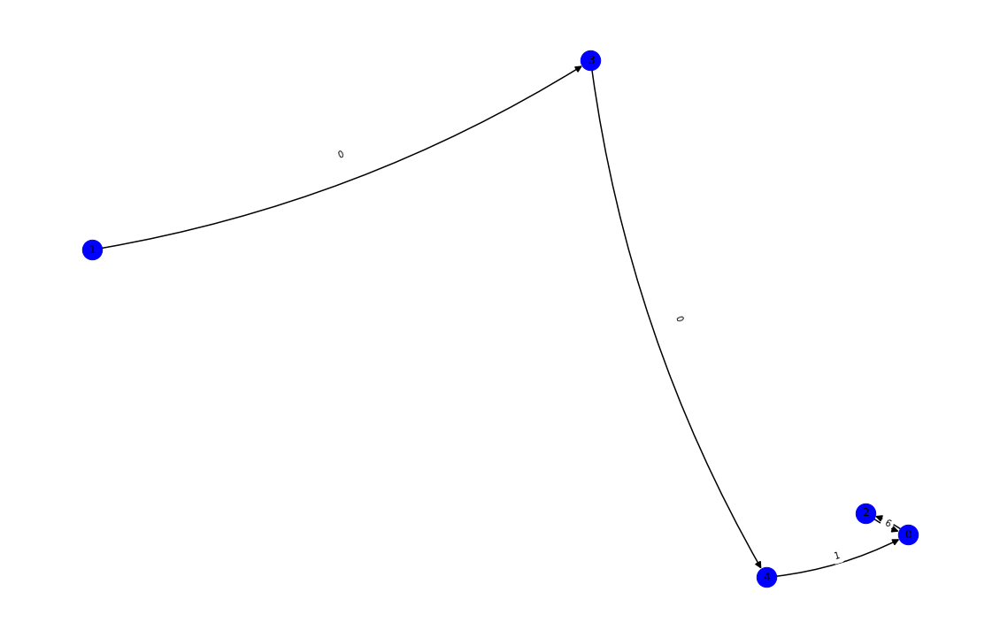

nft-id 98465
mark_dict {'0xef06ac3eb75b91adfaf7fa3eecf128f4481431f5': 0, '0x2af4b707e1dce8fc345f38cfeeaa2421e54976d5': 1, '0x0000000000000000000000000000000000000000': 2, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 3, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 4, '0x80f39690d79553951eab5c9eebeadb7cd8cd2e7a': 5, '0x3e24e8b238702fe49e58863bdeb7f9b674f47b58': 6, '0xe46e8dd7d03ec3332eb10a21b4d06fae1351c9c5': 7, '0x46438fa5c98adcd6042dbd5d40404b0dc770f573': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


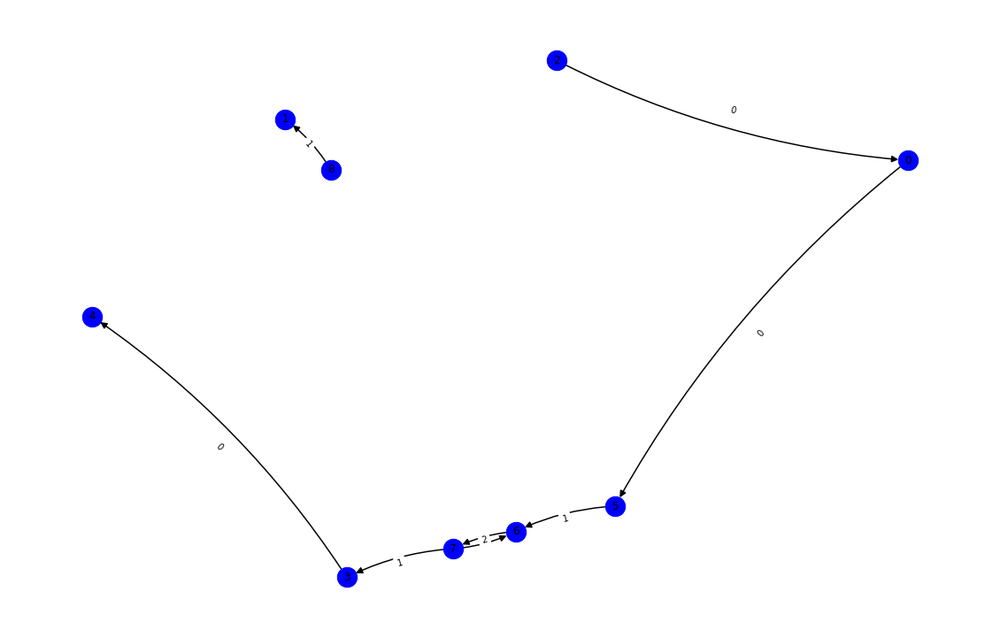

nft-id 99307
mark_dict {'0x0000000000000000000000000000000000000000': 0, '0x0cbb58cc03ee691e80bef4b0c7a4df2f505448f5': 1, '0x1e82e222564293e3507c2966b27f587ee2570671': 2, '0xb09753213524b17cf62a1306559ab50176b2683e': 3, '0x5a572141263c107b593739da5c5a452f014b1bda': 4}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


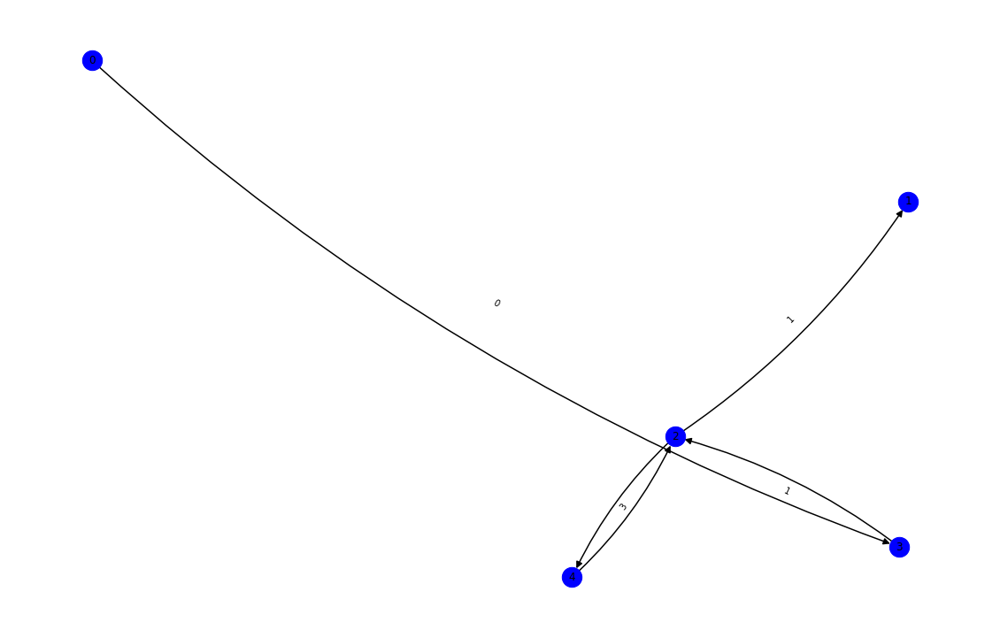

nft-id 97380
mark_dict {'0x42e78153f128697a70b8753243a12b9845ba00f1': 0, '0x0000000000000000000000000000000000000000': 1, '0x6ec4e3db71675302352a31367feedfd5c2cd0bb0': 2, '0x1e82e222564293e3507c2966b27f587ee2570671': 3, '0x3207136f3c82370b17ed87b89f91ffcd6987680c': 4, '0xbb68ed62ab365fc7bf87b4fbae4ba932c7b2bf94': 5, '0x5a572141263c107b593739da5c5a452f014b1bda': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


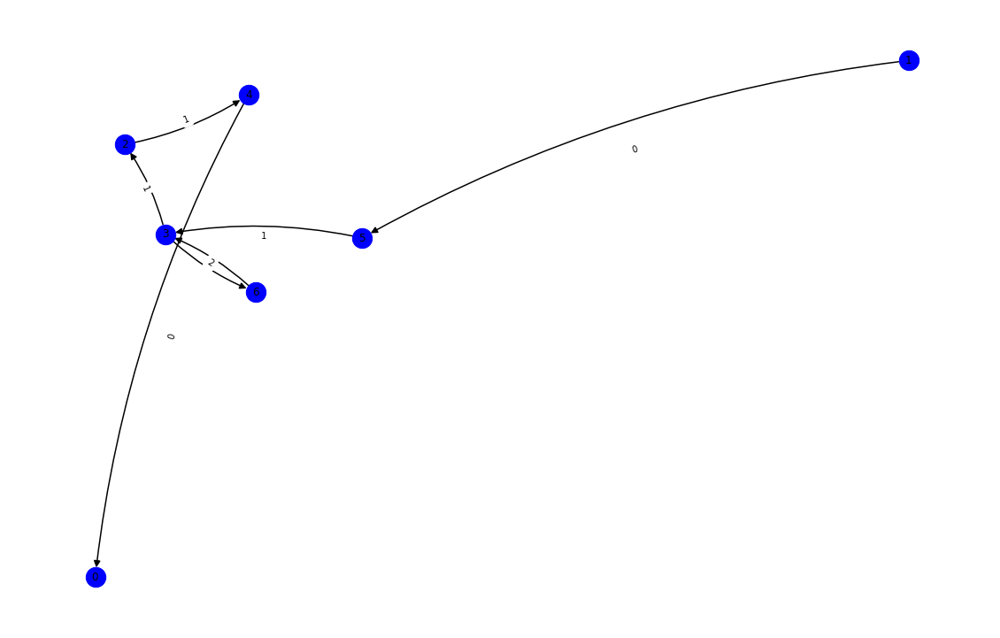

nft-id 79720
mark_dict {'0xf6b9e29b17e0049352c86d667ee6ac4b7840c2c8': 0, '0xd1db98c9ec07ed7a9cb3ec5b63520f853919e661': 1, '0x0000000000000000000000000000000000000000': 2, '0x02c75a3615b9b3c404d48bc13cba5b0ef63fed07': 3, '0x646dc7a1ede174347082a40fe99e25844598772d': 4, '0x67e606c55737ee9e24fd34e111eb0525b6f35ad7': 5, '0xb2da9d60cce0b6bfd73e55f43c0b415d00d18f03': 6, '0x655b5449066646cb4be4b161364171cdc38bc268': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


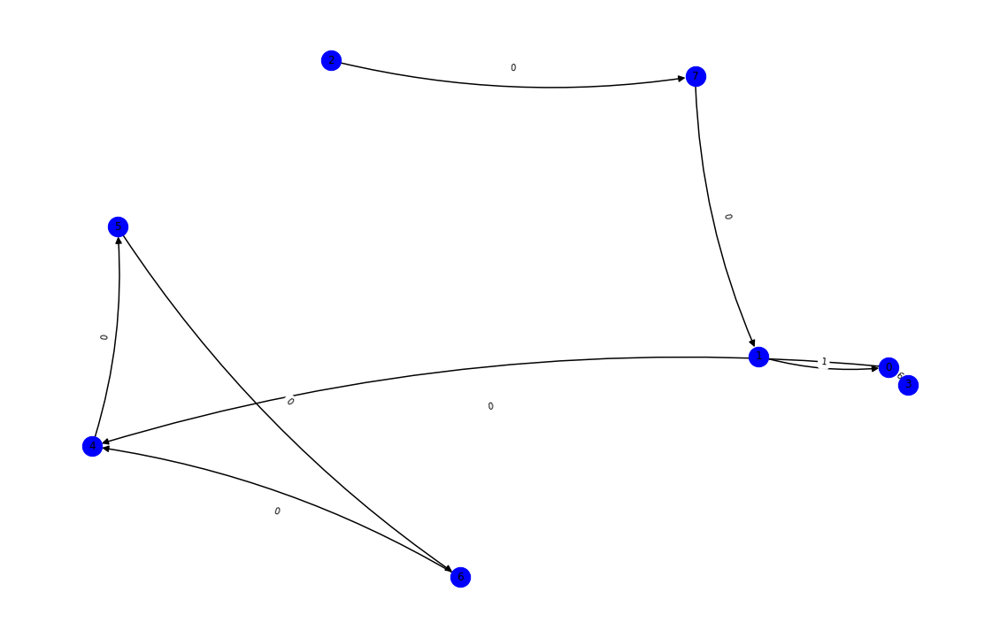

nft-id 66977
mark_dict {'0x0000000000000000000000000000000000000000': 0, '0x9a4351c4ba7ce14a6493a6a7e6faa383088f55e3': 1, '0x0fe35cb5c7d2dfd63eb4eb9e02a6f20117a3303b': 2, '0xe88572deb6d8abf31adce941d8de388a4066f666': 3, '0xadf7d77605f585e0820965f088daaf59b7900720': 4}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


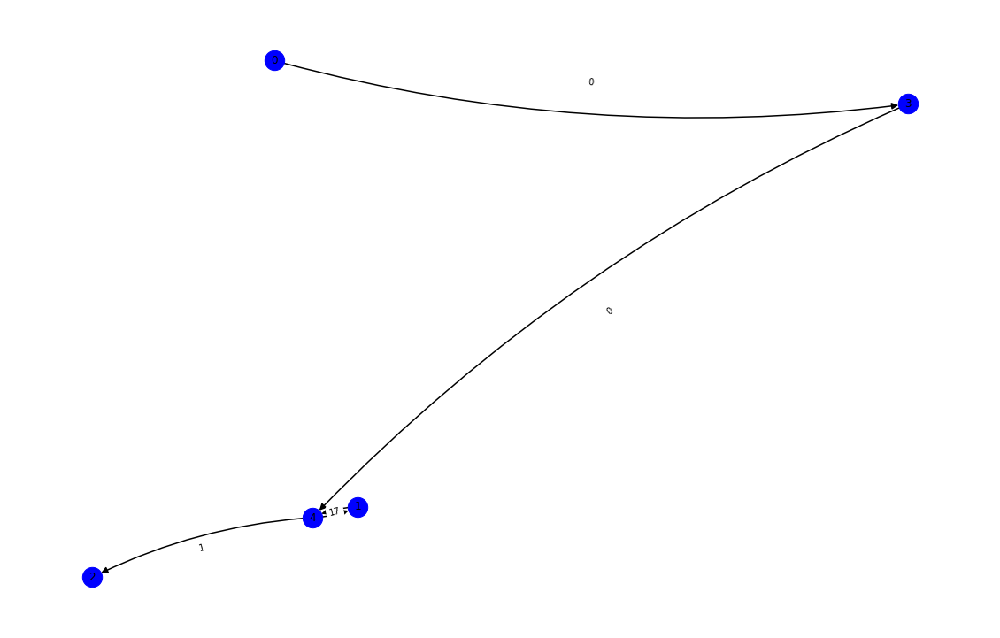

nft-id 57339
mark_dict {'0x47d84f6483b1ebc69008fafa726d1b303ec82ffd': 0, '0xa2c3189e88b83ac9d0603e8bb270fe51ec9d59d3': 1, '0x7f160403a579616fa5bbbc3789954a3822ab52fa': 2, '0x0000000000000000000000000000000000000000': 3, '0x8a0473179492147c785be2dd0b65f320aa4650ec': 4, '0xd770383c8401dcaee72829c4202477c6cb917ae9': 5}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


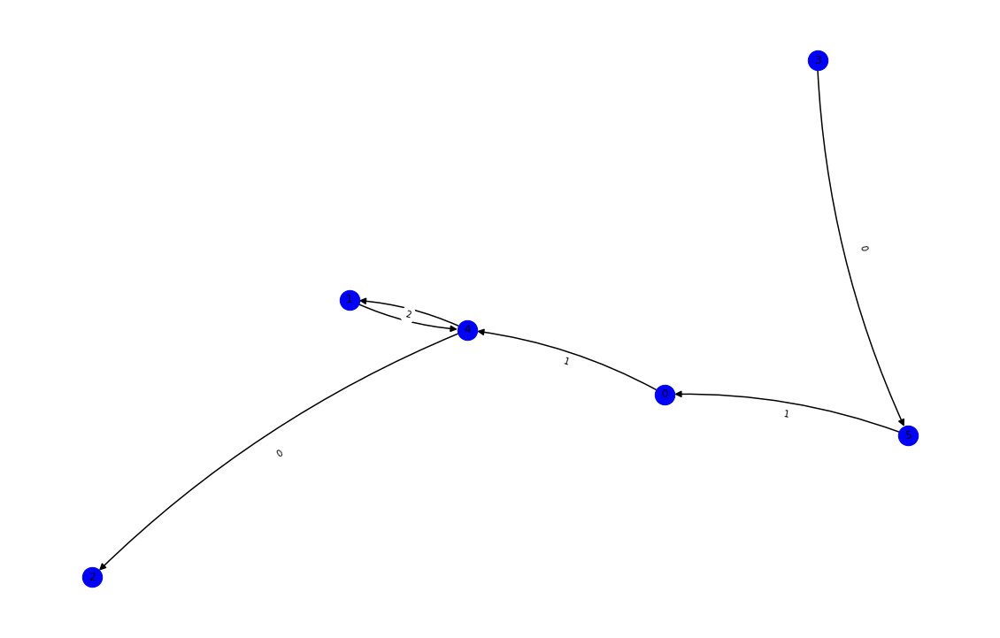

nft-id 92753
mark_dict {'0x6b5213009fd63f21c2c76030861f6c24098dcb78': 0, '0x0000000000000000000000000000000000000000': 1, '0x9d71b500199e46376adf83e53c29d07cb8d61d56': 2, '0x04a8f6ae74c582c4fd68ace2249ef8e6d88f128e': 3, '0x5e2eabfaddf49615f84734724b77eeeebc5ebd71': 4, '0x66e2c2dd9a3c1826e9f5790b2c904ea7a1865891': 5, '0x9f28152ae399a6f1b9760c04972de4f9303c0c9f': 6, '0x1a060c2d136ff30dc196d215b19d80d6e143d193': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


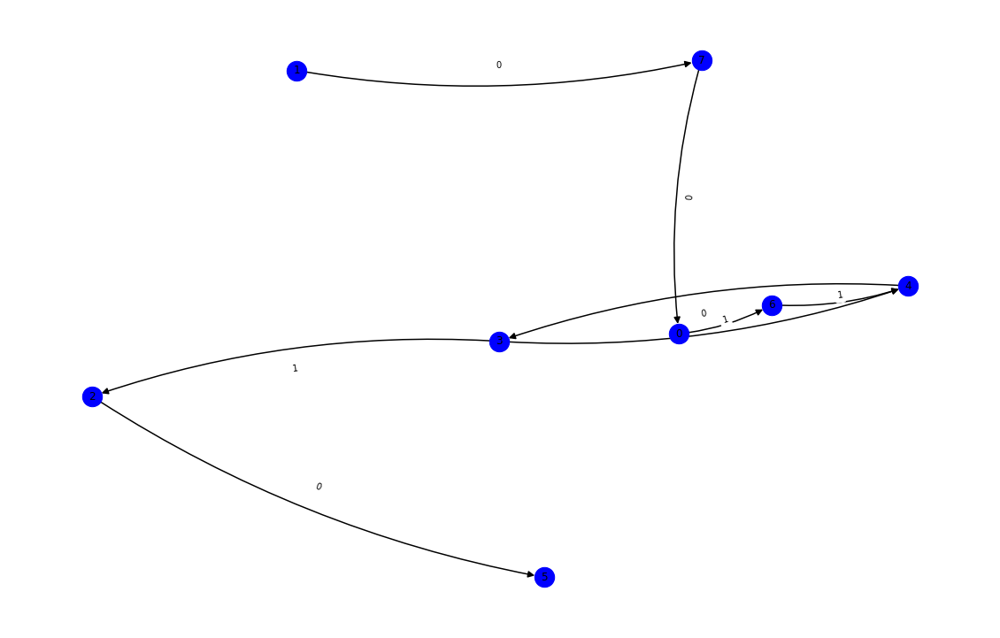

nft-id 89292
mark_dict {'0xbdb17158810ed728376e9e53f260e64bbad46098': 0, '0x0000000000000000000000000000000000000000': 1, '0x62000dac09159bcc31170d0a99b6147c2cacd7d7': 2, '0xd3dc031c58269f4f36982a6315c21cc10c162f61': 3, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 4, '0xeb77b177c76b4b18d1442a145f3fc2ca7b195b06': 5, '0x627e1f9373525663567a55c382ad442abd399d8a': 6, '0x5cfa724652cf3d6bff3a635a6c0313f6c459e546': 7, '0x065c84641ee62d032ea5f20c49d59817c87a2747': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


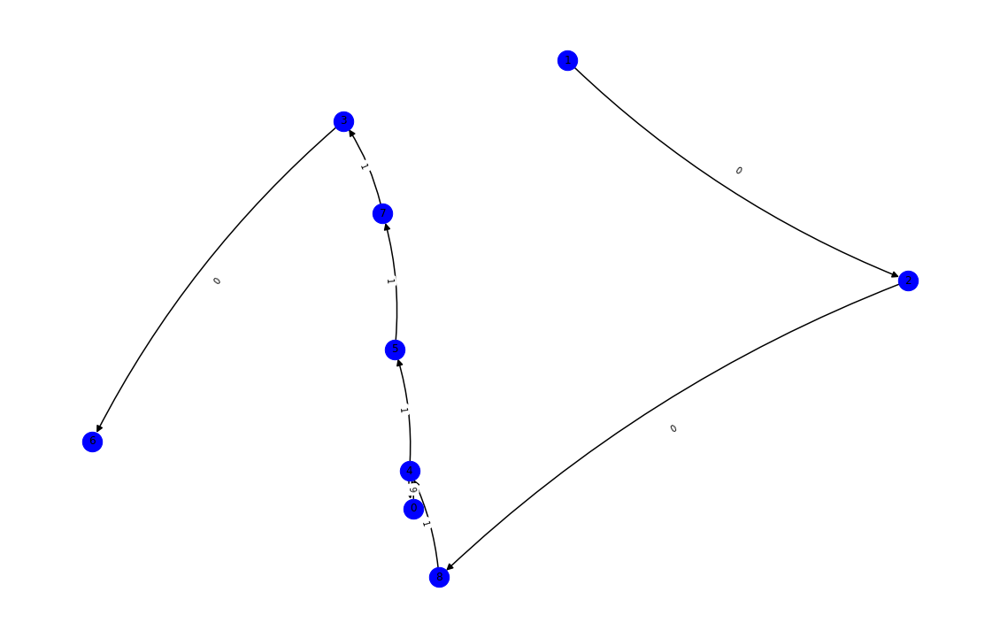

nft-id 94302
mark_dict {'0x7895e599e798a49b2839f57f44e4fd4509079f82': 0, '0x8b28bb4847b0ec8bb63140de8e5b5b707ec842d7': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x1e506e6af1dcf5633e105ad36fcfe0ac83dce013': 3, '0x0000000000000000000000000000000000000000': 4, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 5, '0x2af30a68daa1e9885d454a660d46d17975ce87c9': 6, '0xa2d76c09b86cf904f75672df51f859a876a88429': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


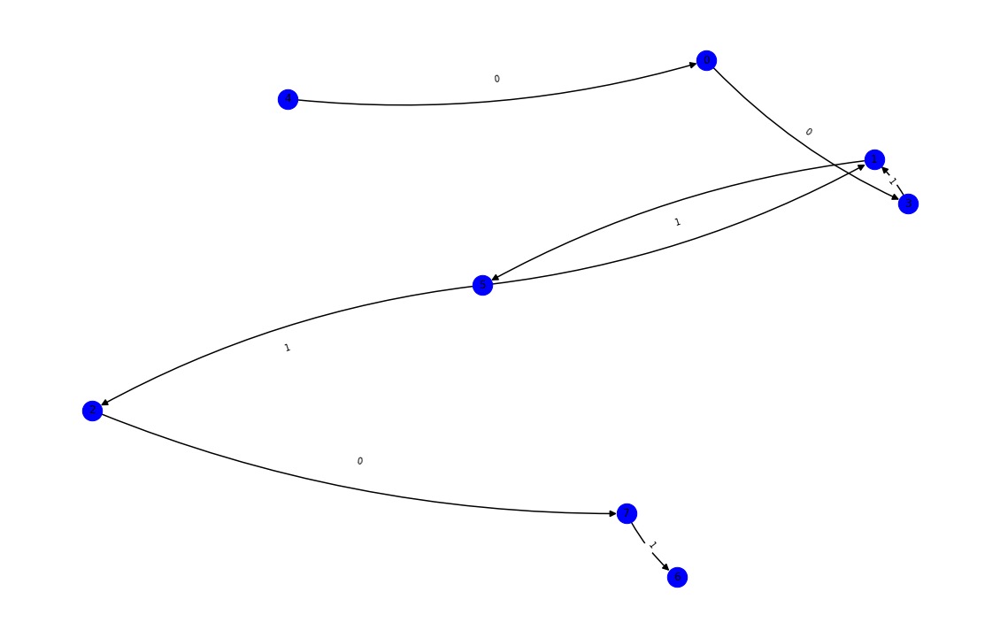

nft-id 12670
mark_dict {'0xeec4dbcecbc93ee092a9f36512d5b3f427470252': 0, '0x4f9888022d676db784e3206a46f880981522f9f4': 1, '0x0000000000000000000000000000000000000000': 2, '0xfccdcdb6ae0e5820b21c98d323c1340fcce63cae': 3, '0x3f692c26c390590bd4b2407a27e8e7806a59e0eb': 4, '0x5e2eabfaddf49615f84734724b77eeeebc5ebd71': 5}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


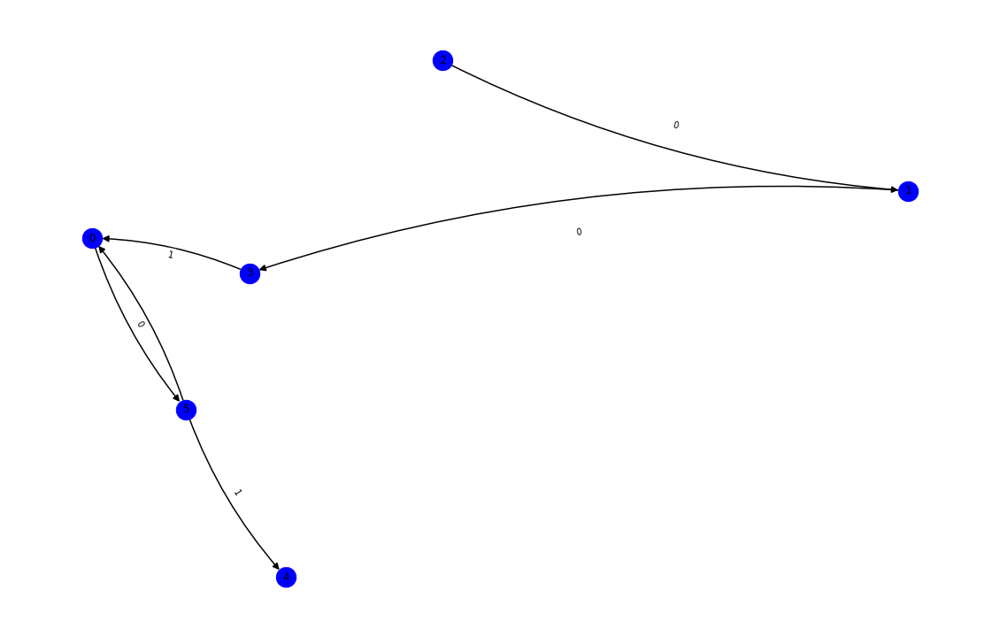

nft-id 48930
mark_dict {'0xc855d03edb308080e70f0fbc4e2f3be7c383782c': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x7011787b40a8378b1a6325f0334a15393b72c82c': 2, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 3, '0x0000000000000000000000000000000000000000': 4, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 5, '0x301cc218009608e59f9647f4b7dd8a49be8493af': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


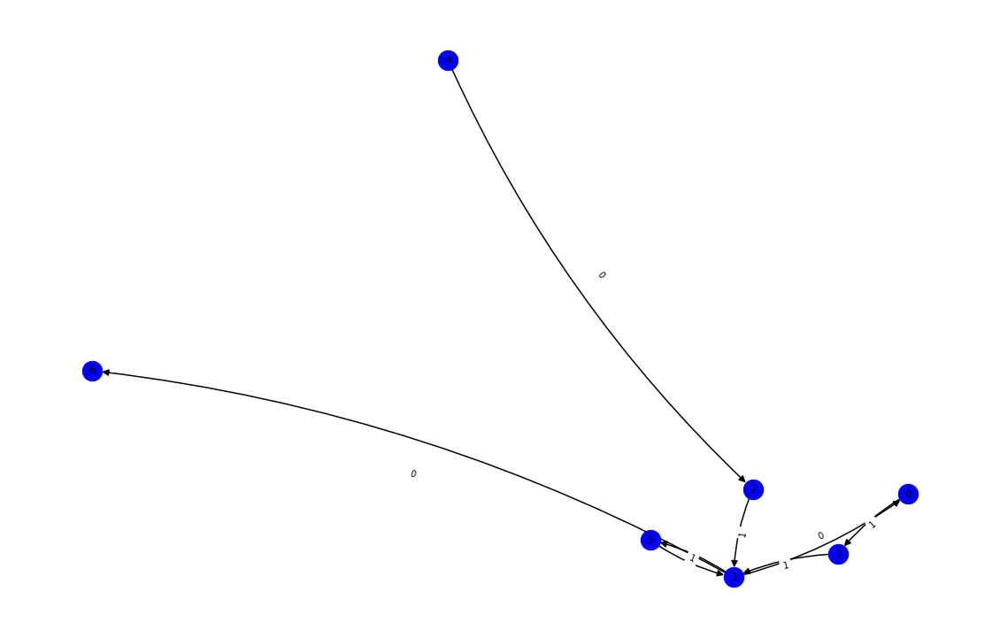

nft-id 75181
mark_dict {'0x704c1b8a91c9c2f335a2a75c635836fe6064f92c': 0, '0x23c94072f0cb7ab9f7c3681983825fc56f70959c': 1, '0x0000000000000000000000000000000000000000': 2, '0x1236afe7507777aca5326bfc92c0cc6757b4d0dc': 3, '0x347294f38ef73ed9c85698ae570dcf4cce0f0a5a': 4, '0x500f2e800003f7f33e1edc76e3ae89b591f432a6': 5, '0x15fc6728ec8d16b66e7151a4df7261b331ff8b7f': 6, '0xb5374cac6cad6b025246f19d20b0d4151b640558': 7, '0x21e10167f7e56419c763c32a070b32705f036acb': 8, '0xaf06e7ca8e77bd17dee07d7c7fcbd33d6689231a': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


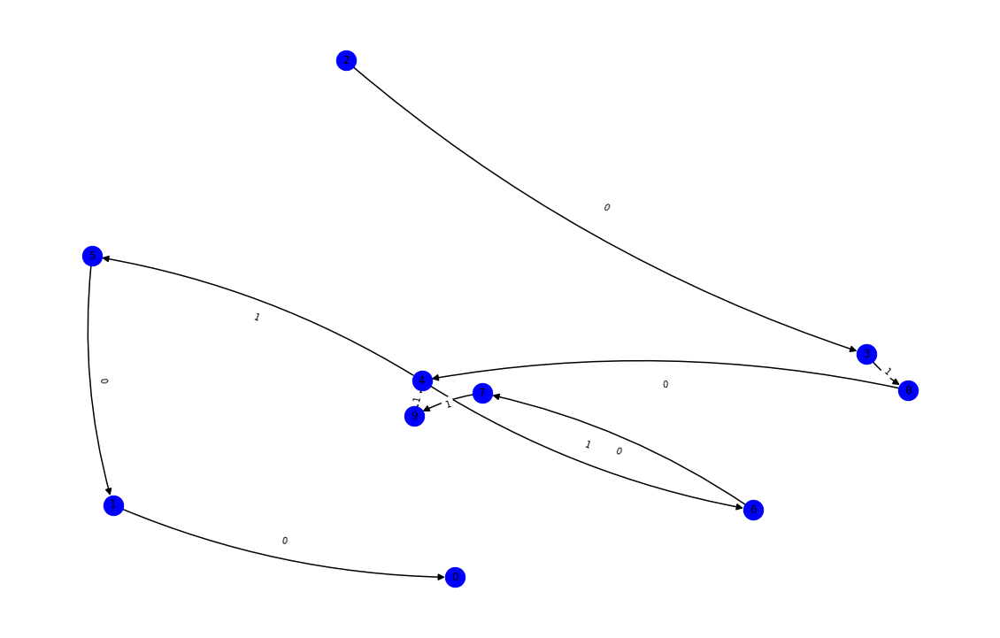

nft-id 81143
mark_dict {'0x483b613641720bdd7848f4d90a01883141b753db': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x5538c0f79de4ab77a5ead9048f99dccbdf72c945': 2, '0xa0553e045fda77dbbe741ffd5b58ae7cefdab380': 3, '0xdf503a65b1430636808d3e898c389780c66f305d': 4, '0x7878c2c25212e31a77853fdacfe0c9b846be2b5d': 5, '0x109aa5b178b8f0468b95835c7b9aeedf0535e672': 6, '0x0000000000000000000000000000000000000000': 7, '0xec38aed9505965d73b7d09e4a0535659b0ba29e0': 8, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 9, '0xab6808a6e1144ab020b4cfc38a4ef90e5565cc0f': 10, '0xbca959b141c719b5ce72d651cebf625fcba11b8d': 11, '0x5395a4e38d84cf1858bc294861635e29deac366f': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


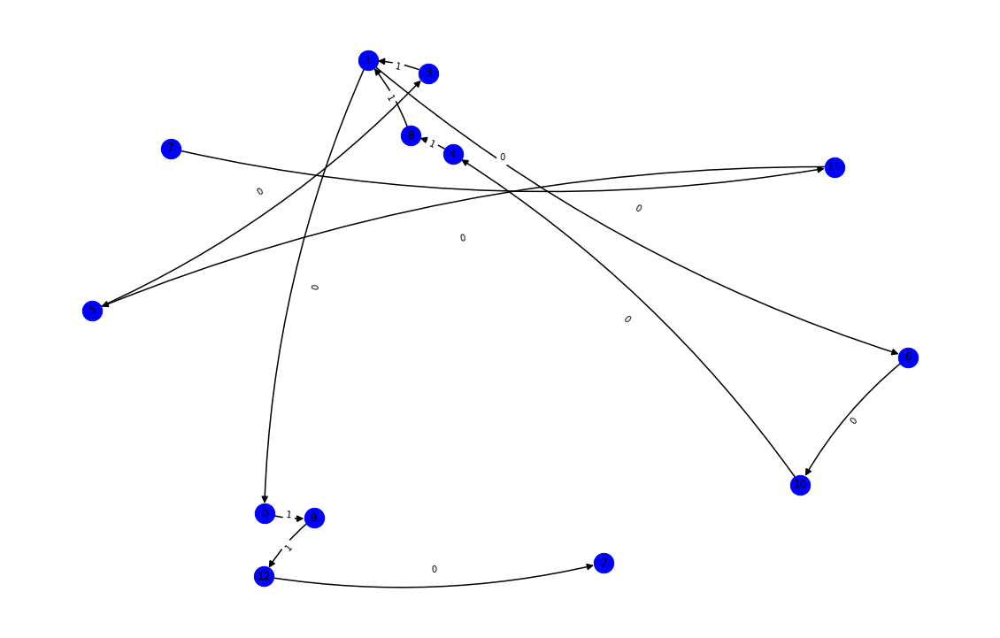

nft-id 81447
mark_dict {'0xa0acd401dde7caf2683c9bc03b0f093570d2575d': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0xcd6b0fa735fbb5eb66e8e11e7740a5921148486f': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x4cdeb56b26eab0c735e5252283dca0fed5f1ca85': 4, '0x0000000000000000000000000000000000000000': 5, '0x624ae79b0bc9a151dc95e7bbe197e63f1514c0c6': 6, '0xc888c19a101979e0c29274895a86f0c3bab6cf7b': 7, '0xe8c8e7e0e8eeb6551845e21632cef051f235587e': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


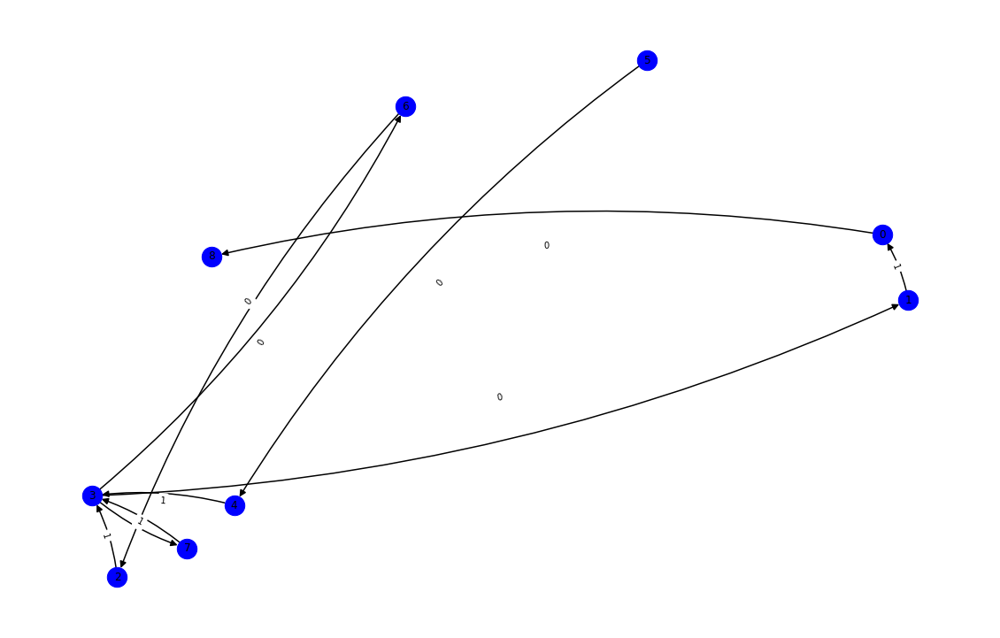

nft-id 47043
mark_dict {'0x47ebda8e95e9e4d3a7aa67c0387b38bdafd4e2da': 0, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 1, '0x42aa209d752ad365dc81a9693e2ee1e2e68e3a6a': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x64f712c17af318bfb618480e2b621ddc5eab3dab': 5, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 6, '0x0d973069308a5b8d3473fefa3cf585bb9af4d7bc': 7, '0x3e09760e1a7e7ee912307808152850e7e0620ce7': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


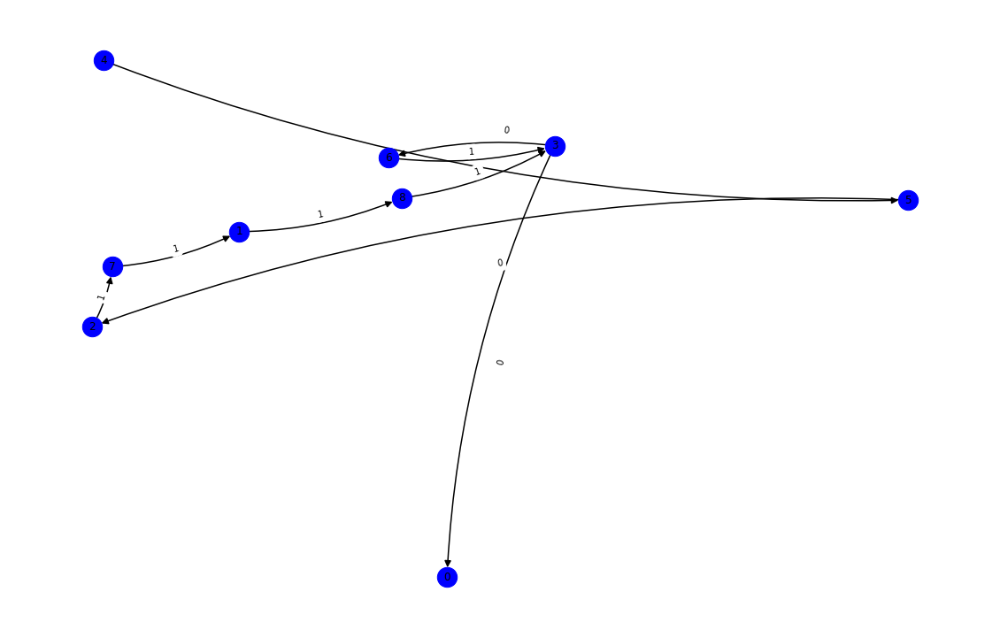

nft-id 67265
mark_dict {'0x0381048a528e80e384d5d9fd803226588b1eb65b': 0, '0x7cd8193421ed77bb07a1be4e0f1301b5bb2acb48': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0xd2125b04172c1fa29b93ee439769bec9c60d717e': 4, '0xdd2c974af40b35287359dab3c6f6c1953e160859': 5, '0xf9e3ddb8eb9320c4ca91f3d0a58476400e2c4db9': 6, '0x0544fbed9b72aa036517b21d1db50201a17d09ce': 7, '0x4e9dae28030ed2170987ee53082abc48609819a3': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


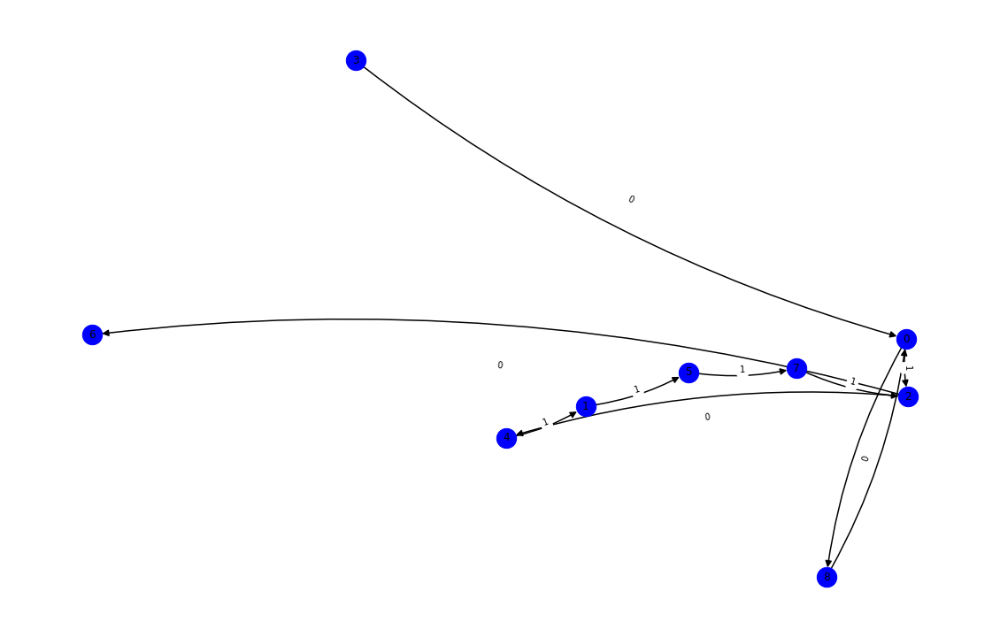

nft-id 68346
mark_dict {'0xac3588609f3b4bbabdacc7a4c79b3da8d50c954d': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x4ed175874b72fd2d6fb7ed36af9c401a27c68c8a': 2, '0x0000000000000000000000000000000000000000': 3, '0xcdd60e7b7ade44053a67349a6e856c0ae33d2b91': 4, '0xf9e3ddb8eb9320c4ca91f3d0a58476400e2c4db9': 5, '0x981b7edeae2193e321467b56cfff7f10036f8f8f': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


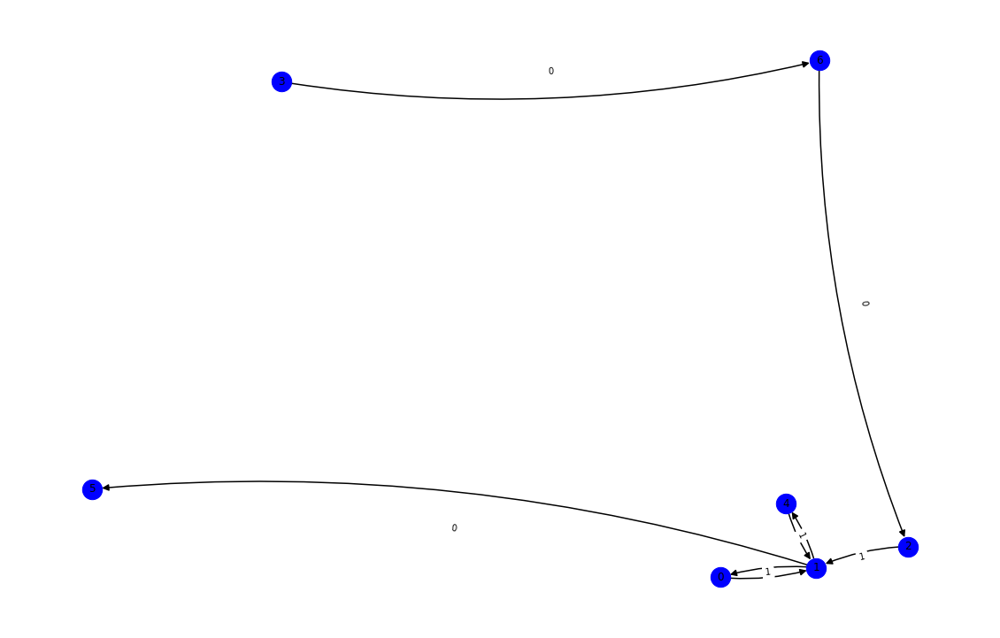

nft-id 61325
mark_dict {'0x483b613641720bdd7848f4d90a01883141b753db': 0, '0xeb4b8ecce912e40fa4877f1d5380a810c7b5036c': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x23997ef050abe0f7313f88e3f07579f0ecde98a9': 3, '0xbaa593844f49c01e42f3f691833905796c0d9565': 4, '0xc888c19a101979e0c29274895a86f0c3bab6cf7b': 5, '0x46310e23b762017e29aea12f794258828a0422ca': 6, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 7, '0x6f4f5bf7671978e219c9e1d74ae153912194cc8e': 8, '0x0000000000000000000000000000000000000000': 9, '0x8f1b33bda1097e3d265437406421ecdb9a73af0e': 10, '0xe1cdef1e0fb87ecbb4cc7b33e7c7996ae25fa262': 11, '0xf46e701ab53e18d270fb2c472f2eae275c01bddc': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


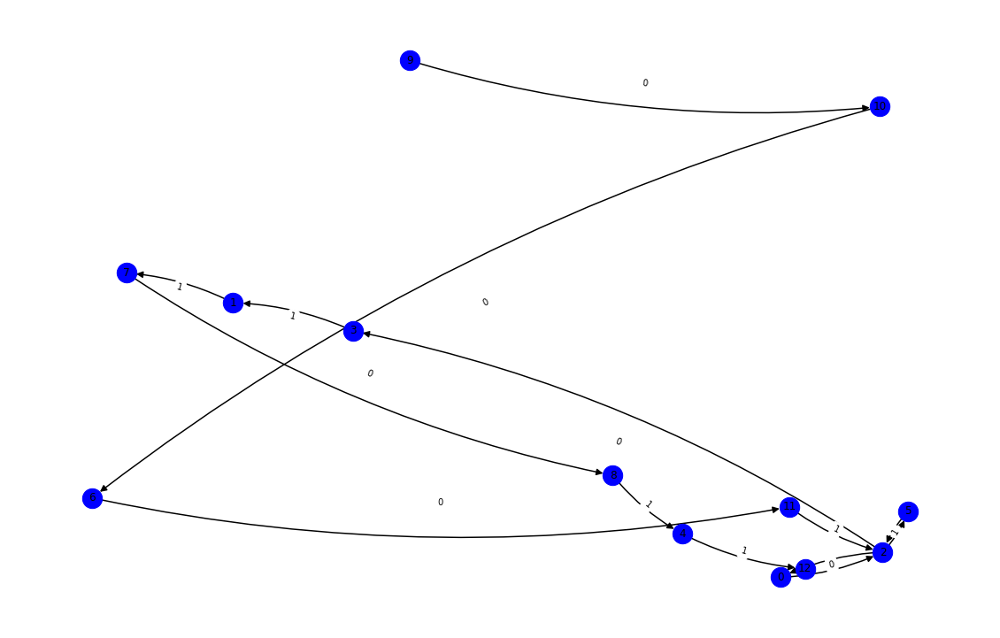

nft-id 58814
mark_dict {'0x1cf1798fa87cf3debb2ddf280dc250df4947872a': 0, '0x102c4a85e061fafdf0613893e3a83060805235e5': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x1f189d44905466e5f6302b48b7e85fea174aecad': 3, '0x0000000000000000000000000000000000000000': 4, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 5, '0x1cbabf5cae040215ab7e8204a741191c04a4a24f': 6, '0x2ea5c9f2bcc7d4d3f3616d4a11ad86b4e377f342': 7, '0xdf9cfdfb1ecb30a88e14743d90c70126fb4c00b3': 8, '0xc820b8c82699a84aa413a9cf4283d766aaece630': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


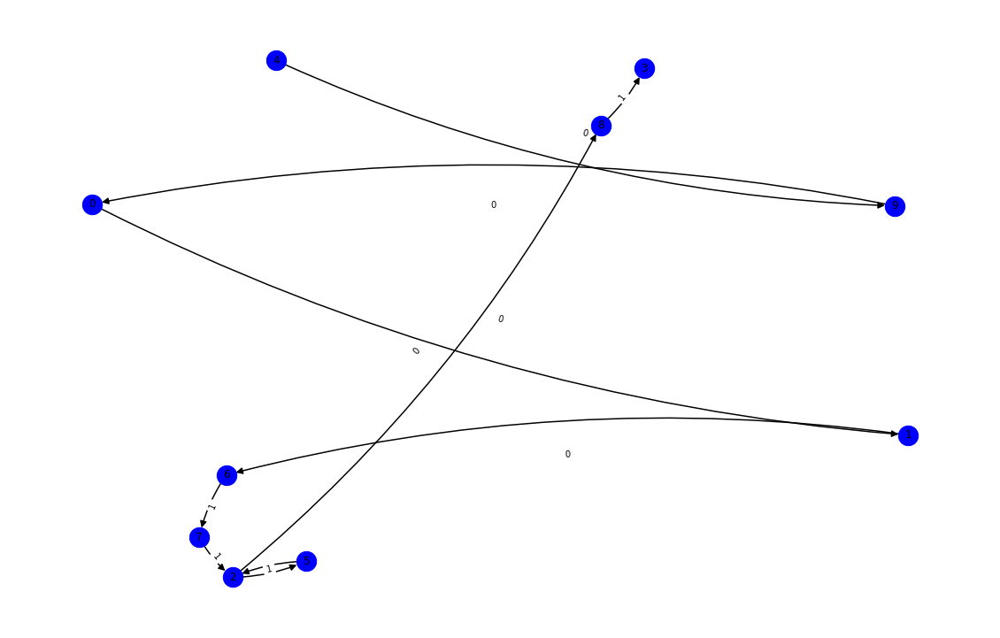

nft-id 82802
mark_dict {'0x483b613641720bdd7848f4d90a01883141b753db': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xa1c0cb79df792cbdca79997fb4dfe5f1e52e0bce': 2, '0x0f3e5f4d5033c8eeae3b5feac3c6c51a23c7a852': 3, '0x0000000000000000000000000000000000000000': 4, '0xb36a66271b2c99043fe07c93fc4bd723300d67ae': 5, '0xbe7c3c0973d0c25e9e689a59ee296abd2546130d': 6, '0xc0385c781b2f35ae0ba54c2948f4c23afa3bb954': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


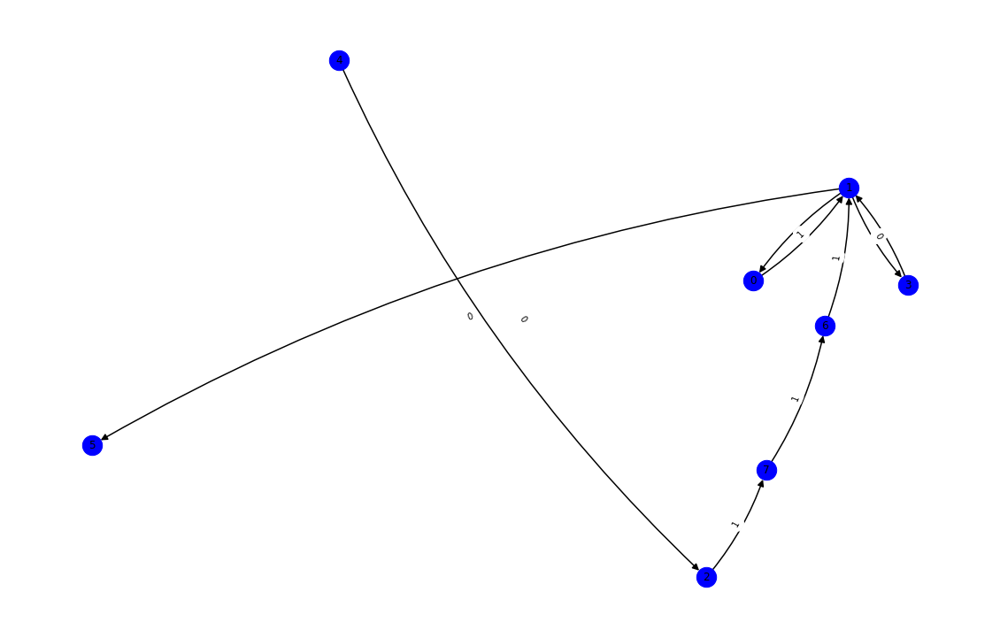

nft-id 57811
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xa01c0735c7ca5f8efc1e63efa5f2d1c4fc1a4714': 1, '0x6433eaea2580aa69f0167ec78a6cf0063d578cfe': 2, '0x6ad244466777fb941917deab621e922b1feadd85': 3, '0x674ace830867045c412cd0cb4ceb23fc0dbd6890': 4, '0x036bbcd47e8a66c4f1559674b3993df75070648b': 5, '0xd9f0a526f15912c60943f0808ea46e00b62d1eae': 6, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 7, '0x0000000000000000000000000000000000000000': 8, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 9, '0x9ce610c1bfa7e1b482301219aae342c293985fc3': 10, '0xf1b299dbefdcf8f65af04d5ddbad8f8ff7e58f14': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


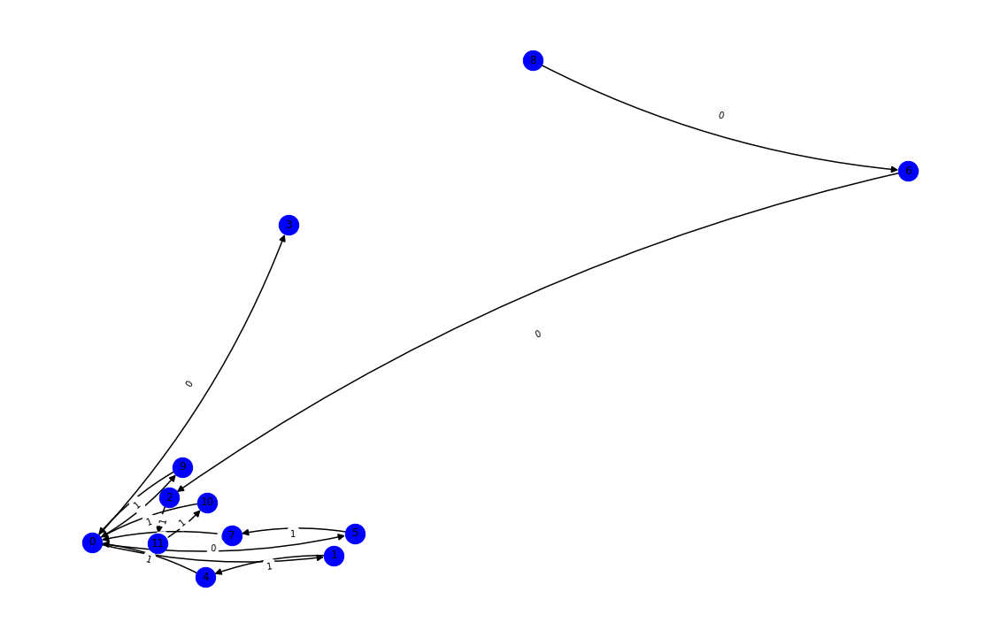

nft-id 55148
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x8951f25adcc7c3256dd9b521ed726fb587a46d52': 1, '0x4897b3cffaf0deafa5c3dc04a5a0e24bc2c9da07': 2, '0x428962848736afb8c671d3e074343b54842a1a7e': 3, '0x0af290e54582992b27f7c54acb286db9f4f24fb9': 4, '0x02f36705043df976af965d4f35f2691863683d42': 5, '0x0000000000000000000000000000000000000000': 6, '0x97da20dc2bd46174da79d71a385b7248527fbee6': 7, '0x54f77f82aafca7b0b99b417f9c11f4a0252f11d5': 8, '0xa93e87c7d026598d8706dbe46a0d949848a2dd2f': 9, '0x259dc77f8b7136be0ad32764ef04e3df7b8fbcb6': 10, '0x596736970d727752abc35e43faf1b60e4e8562da': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


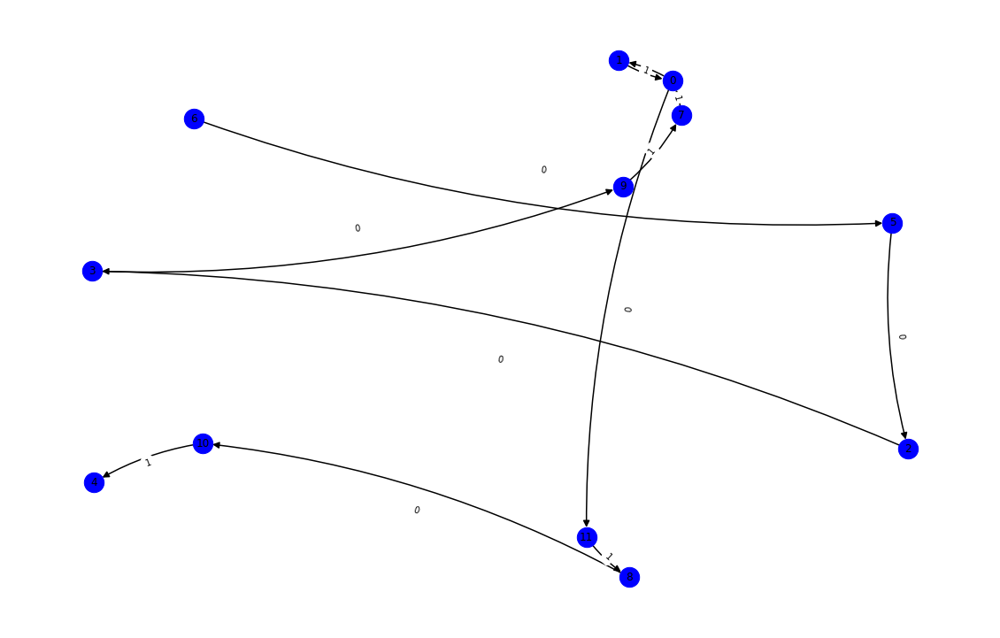

nft-id 45140
mark_dict {'0x4f3215bb59dbd3a868510ebc02971570778aa360': 0, '0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xe15dbfb9a53e4c6a7bb7f1d172fcc21acf8b8879': 3, '0xd60a1236f505f18356955fbe17b6bab0f550ff0e': 4, '0x0000000000000000000000000000000000000000': 5, '0x0e0fe5ef2e56ac7ff7112b8ed3472b33488b5e11': 6, '0x20e39f002ba523aceed5fd9cd5e738b76caf1982': 7, '0xe3b4f0a27b297246d9336151bfe3f8090533ffb3': 8, '0xf3d0cb1b3db63a5f98a0ecb05d0d9f263058b7cb': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


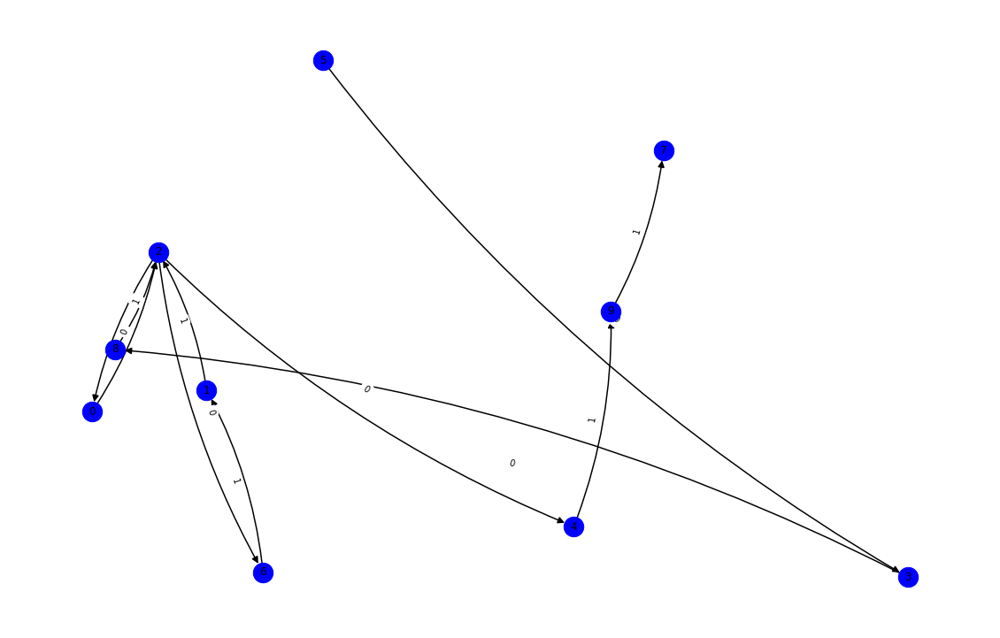

nft-id 45833
mark_dict {'0x45c1ddd5a706cca7665bc2082d5ea56082995d12': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xa1da9ed80b04d8ebe98a1de47ef343088bf02d92': 3, '0x843f2c19bc6df9e32b482e2f9ad6c078001088b1': 4, '0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 5, '0x4f3215bb59dbd3a868510ebc02971570778aa360': 6, '0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 7, '0x0000000000000000000000000000000000000000': 8, '0x48e6b9b91278a01c6b9a71458ef9ff397e4c70fc': 9, '0xb0cfcd7faa9ec34f794420549bb92f7d9bec16c7': 10, '0x82dcba7a8bf3aa462040038ecb3d5d90901676e8': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


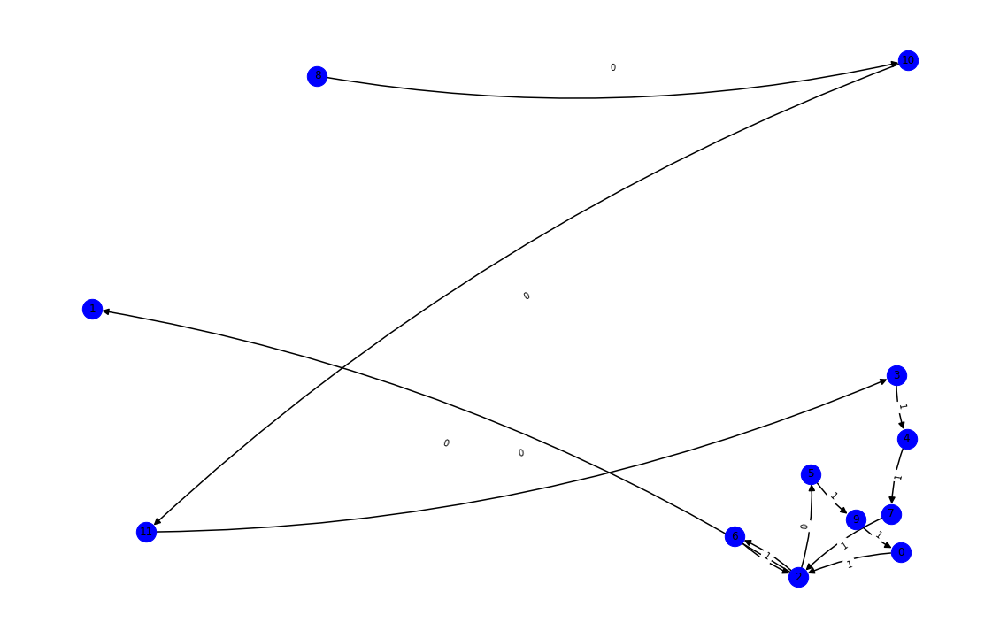

nft-id 96390
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x0f3e5f4d5033c8eeae3b5feac3c6c51a23c7a852': 1, '0x1bfbf3f8bb2dc625d569c88f5b25d907636a2c5d': 2, '0x0000000000000000000000000000000000000000': 3, '0x3c05c8c71fc3bd1e095a71f1ab58a9142b41e8ad': 4, '0xca7adc0614c3ea4dc6625e20cda60adb8ef3dfec': 5, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 6, '0xc2abdbd6ec2f1baad8e62ab7ad5d266916b2f98e': 7, '0x1a359202bfff428f17b021426d20aa01a625c071': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


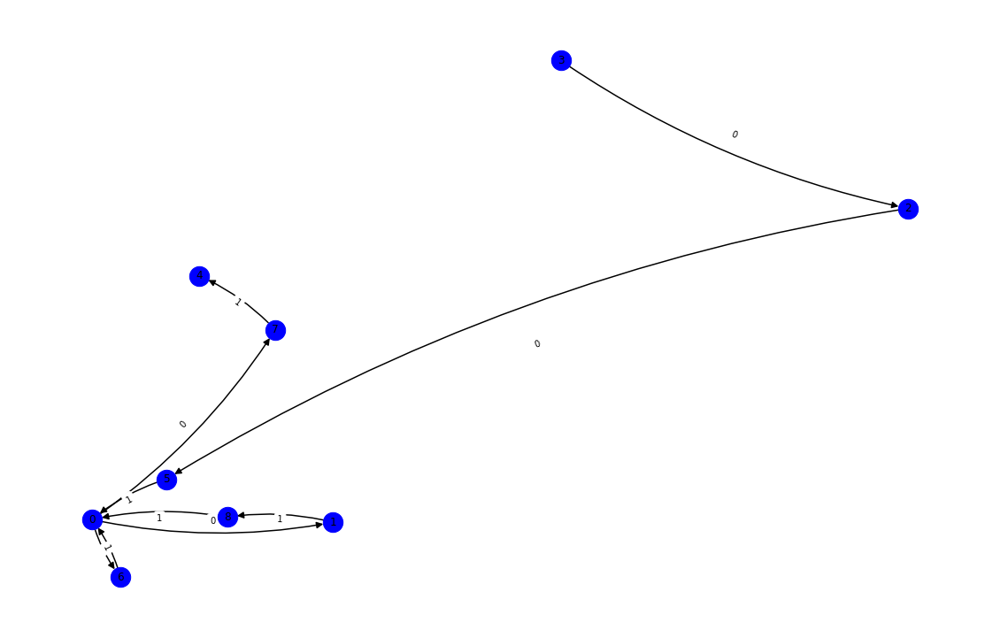

nft-id 67101
mark_dict {'0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 0, '0xcc0e2d9285e5790ea204164d982bd910cf84dd8b': 1, '0xc968eb14b3ad83cbae2f1b64d34dcbdc99543cd7': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0xa01c0735c7ca5f8efc1e63efa5f2d1c4fc1a4714': 4, '0x0000000000000000000000000000000000000000': 5, '0xc5feff1316f04eacb1839a4de1aa6c3873b3f67f': 6, '0x6c56398b111e278d2c28015ab5f5ca023cc5334c': 7, '0x17a72a2b987eccb4dcf325fddd5ad776fa2d326a': 8, '0xc806a3379e33b0b9d6efb3c36d62e0c7c71822ed': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


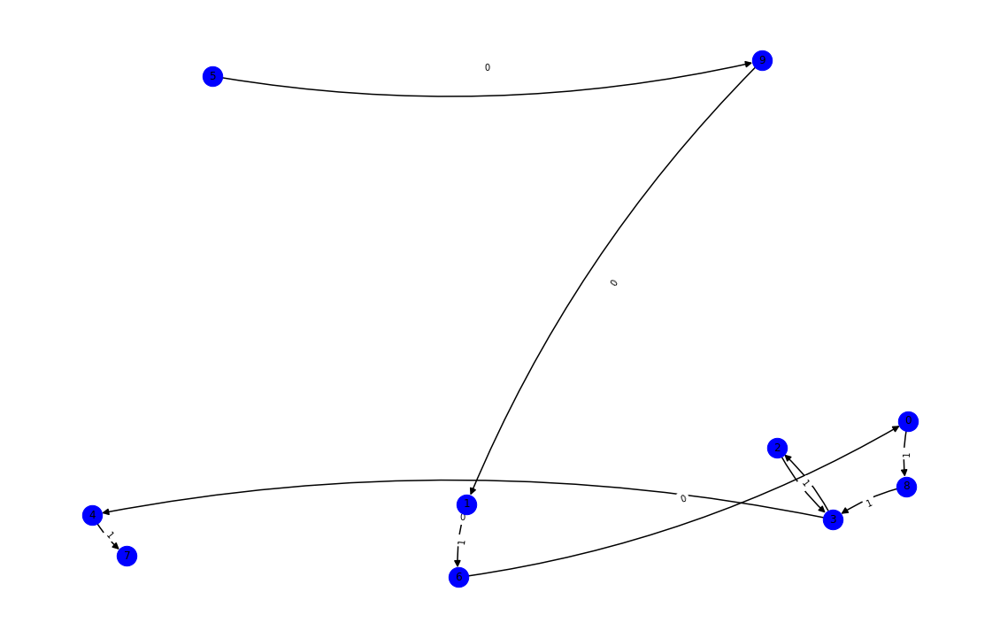

nft-id 62258
mark_dict {'0x0940b6c0d2bd85afed6c39402eca57a08c0b5aa2': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xa56009bc79a05c1a1db4275ba3cf1ee65ee6cd05': 2, '0x0000000000000000000000000000000000000000': 3, '0xc79d6201fe4b45dd3bfdeb35ae24d9a49f57b17c': 4, '0x2e92107483bb44728485162ea68ee3c812190e88': 5, '0x14d702bd1ae7a48df5d33c7f873aa353bbc7446d': 6, '0xd387a6e4e84a6c86bd90c158c6028a58cc8ac459': 7, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


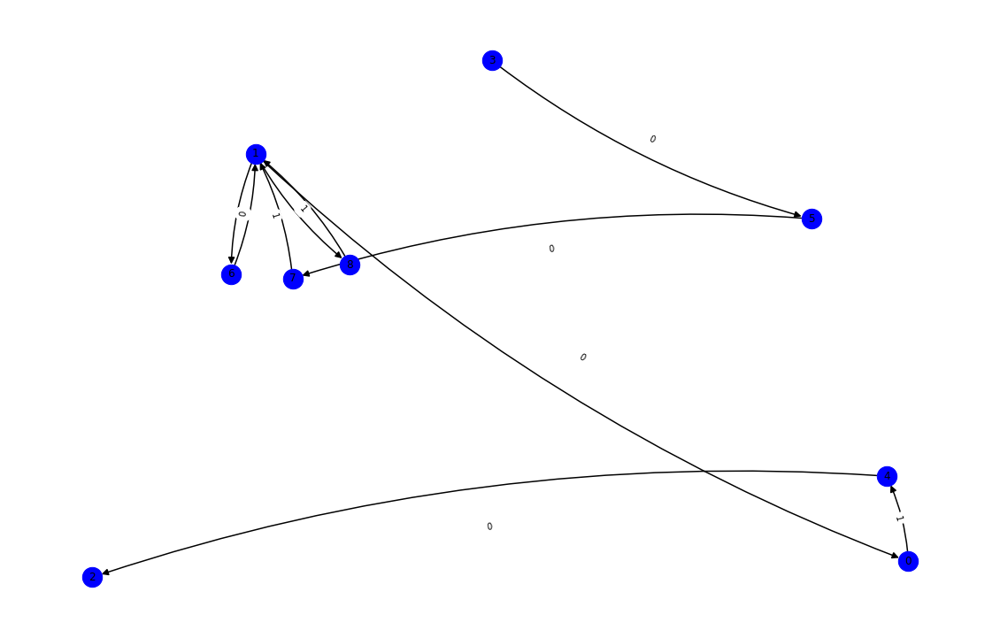

nft-id 88455
mark_dict {'0xe108f1fa7b8a3c723603e2743a1a1f80cda95de8': 0, '0xabd0829aa988e24bf1ab4c6c6d1c61fe29371a1b': 1, '0xfd9a8f979f094d33a23e5bff38765a388b55c6cd': 2, '0x3c4e6306ab172ba9d37bd4b692725454a0b39de3': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x9adcabc8dd12d9f522598ce28b4404d13ad58e91': 5, '0x0000000000000000000000000000000000000000': 6, '0x91238503399f5b221509fb3c1f163dbb63314ad3': 7, '0x32273f5f668e0d94ed7db7eb9908efc3a17e7483': 8, '0x9fb091820845dd2460083123253ff1636227cb8e': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


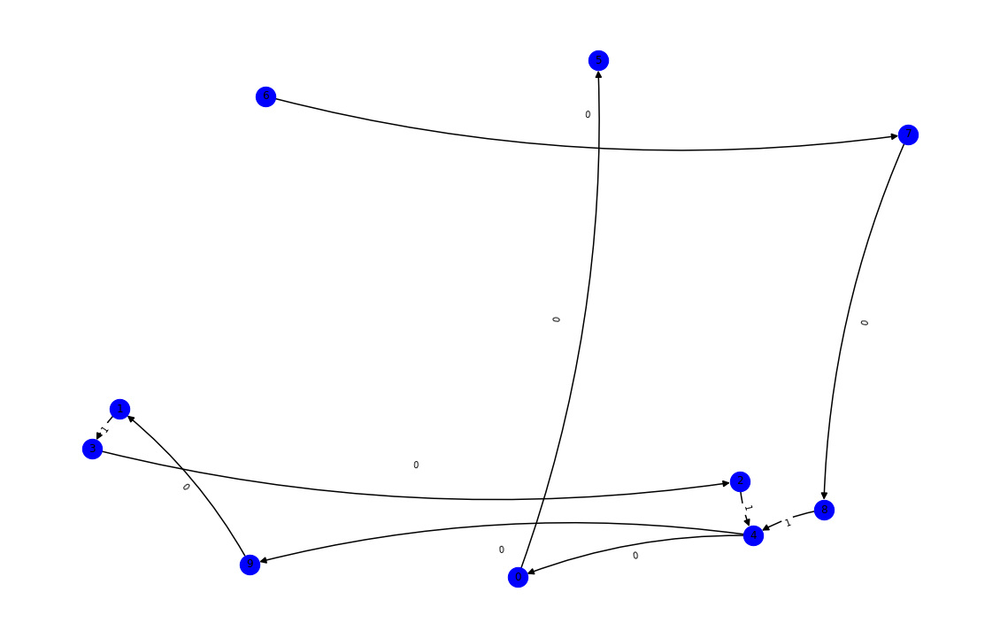

nft-id 27875
mark_dict {'0x115a6ef873726b7747e476cacfd37424982cddda': 0, '0xf9cd6908b9c7b2c28a83999399d2c7d23b552920': 1, '0x02d67af84519775431888759b4149110aaac6a0b': 2, '0xc64c29e5fffa41941d579efde8a2840ab5e05067': 3, '0x0000000000000000000000000000000000000000': 4, '0x98371cb0b3ddeeef47d0a98998fe0650b5da27a3': 5, '0x10f191c15e7aa9607dda28fabc4ca52483d85816': 6, '0xcd118a118787a66b0230f2a8545bcc3c6f988352': 7, '0x334c036e3125dcb6d93e9b998f6d9d7a1be4b17f': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


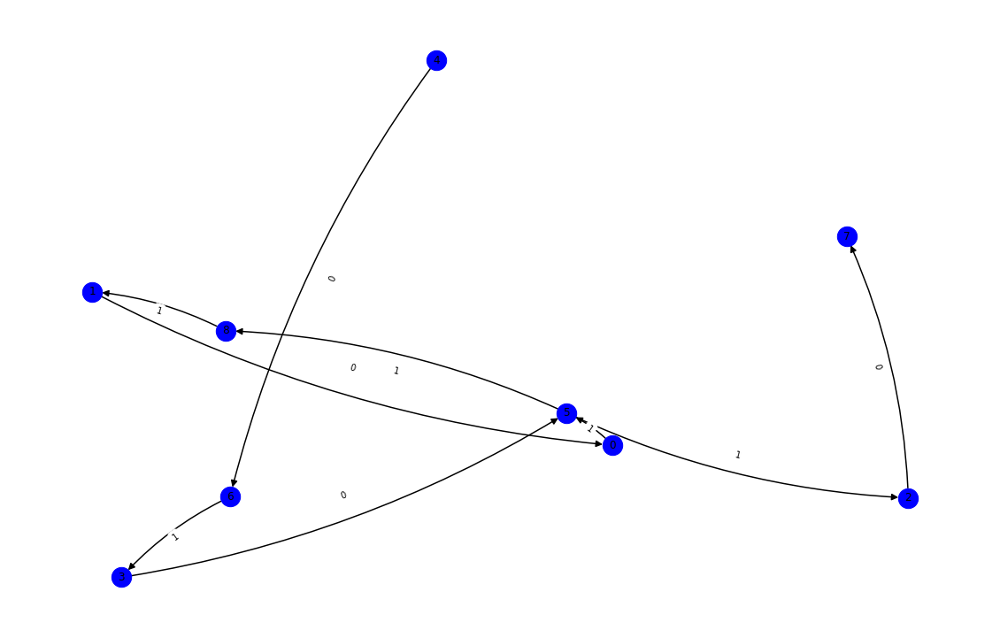

nft-id 47125
mark_dict {'0x483b613641720bdd7848f4d90a01883141b753db': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x11620e1c627f08ff1381aa89f4e24daeca1763aa': 2, '0x1fb73b6491884b665b2b54617c79a0f8a3050d41': 3, '0x86d2bc8291f5b1999c5d78957c488fa52d528f48': 4, '0xbdb17158810ed728376e9e53f260e64bbad46098': 5, '0x4c240bbd3c10093830405a5aafd1f0aaefb27378': 6, '0x7af047dc65917acd86d24f3f2033a002473bccce': 7, '0x0000000000000000000000000000000000000000': 8, '0x509b3c3e577eeb2ce3fcb523c4e0fa6fd07ddf10': 9, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


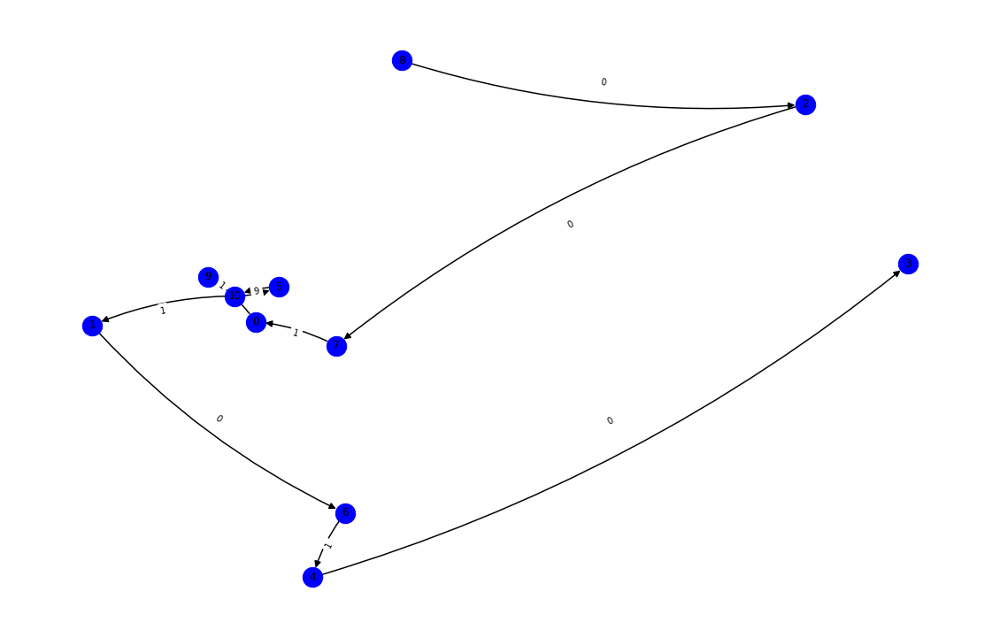

nft-id 72720
mark_dict {'0x4e882532a76450b3c8c7cb5d05ad68ee0e463bd4': 0, '0x43698a5f9589df9f507be206eec19b940ee591eb': 1, '0x9fbe1e91c77f1322935da8b3c71446a0210ac000': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0xc85b5c435d2204bfd71d28e4587aedeed432ce01': 4, '0x0000000000000000000000000000000000000000': 5, '0xce78e64593658c78372d3cedf7e9826ce2e4e69a': 6, '0x4ed9c6193ede88a5d41b2e833e46508800420780': 7, '0x9250f8149067fc068189f95e92f0eea9673f62d0': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


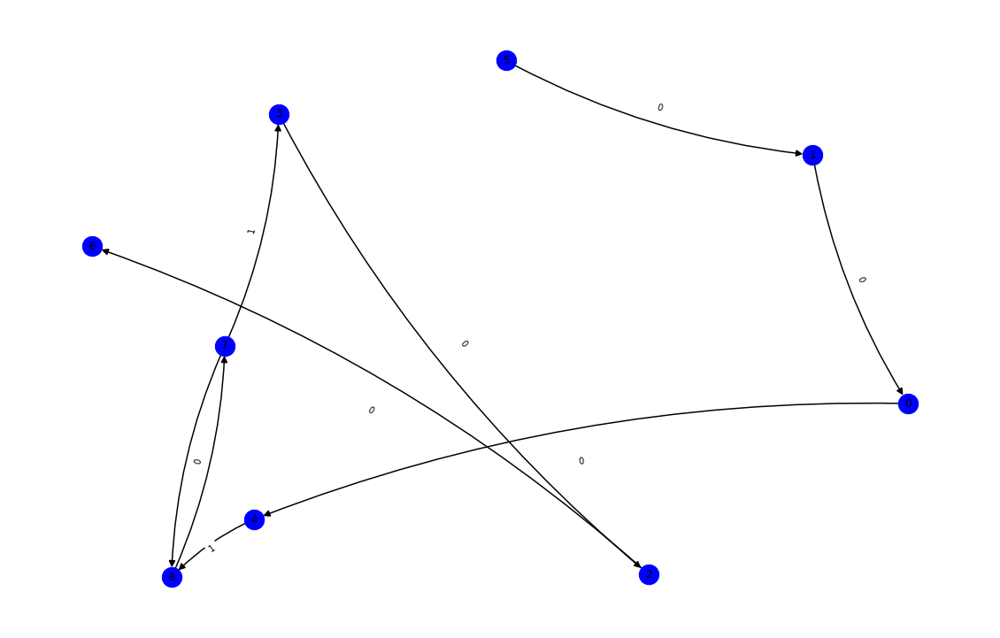

nft-id 73148
mark_dict {'0x699fa86c16ec249334bc19bd96d672f68fdaa789': 0, '0x0000000035634b55f3d99b071b5a354f48e10bef': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 3, '0x9dfaaec933c82eda41da59bce1738589306c299c': 4, '0xb9e025a1363373e48da72f7e4f6eb7cddf2f6501': 5, '0x83c3994b1f6472b84e216a66b124a93efc748678': 6, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 7, '0x0000000000000000000000000000000000000000': 8, '0xa3dfb42724734d74d1b66f6f12a4afa5d7d38df2': 9, '0x99303bd4c519115c94c080a80e3e771e503e5707': 10, '0xd42fab871e708308a178798edd7eaf63638ce519': 11, '0x1d1c9e1f974c92f00fe115f325524bc73c50f91d': 12, '0x00003183f59e825911d98fb509a157cd2abbae25': 13, '0x4eaf1f07bc7d4c7dfeb4817ec58a78a66f90b5fb': 14}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


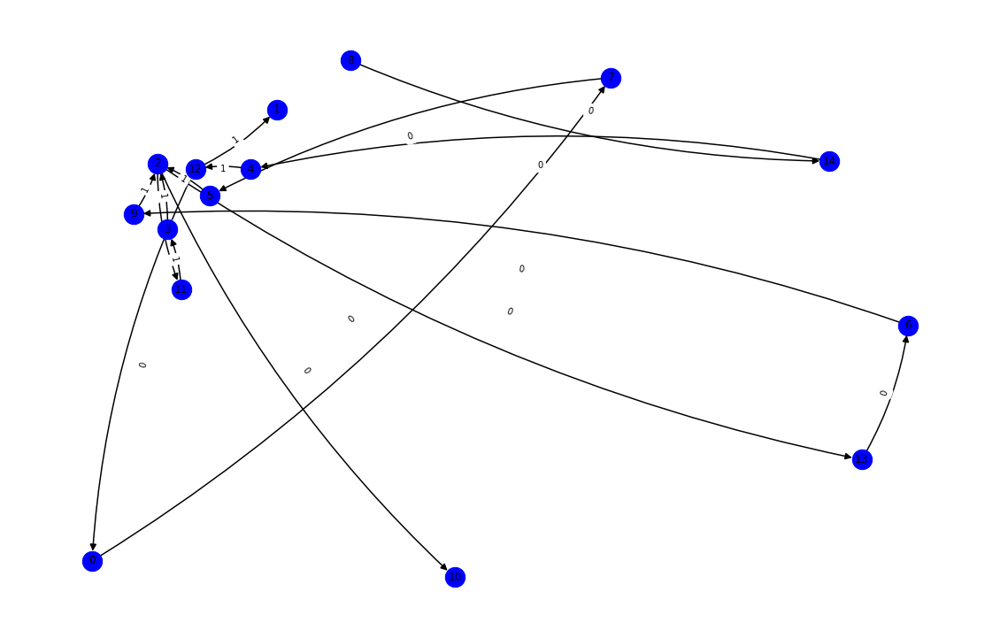

nft-id 89081
mark_dict {'0x829349792c2605465c8641f70ca33a734e8b9b12': 0, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x2f0fcc2a2f56d6aa8fd06c8be91d0a2d00d66d48': 3, '0xdde01147aac2152dd0776bc3ed84cc96474df52d': 4, '0x010d1ae300ebbfe8e31e53ef8bebd59a8169a3f5': 5, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 6, '0xb00969aef4656cc53b43d6d375dcaaafeb9b0c5f': 7, '0x0000000000000000000000000000000000000000': 8, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 9, '0xa15aad03a4f9c46161783398fe6d93ba18fda366': 10, '0xd42fab871e708308a178798edd7eaf63638ce519': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


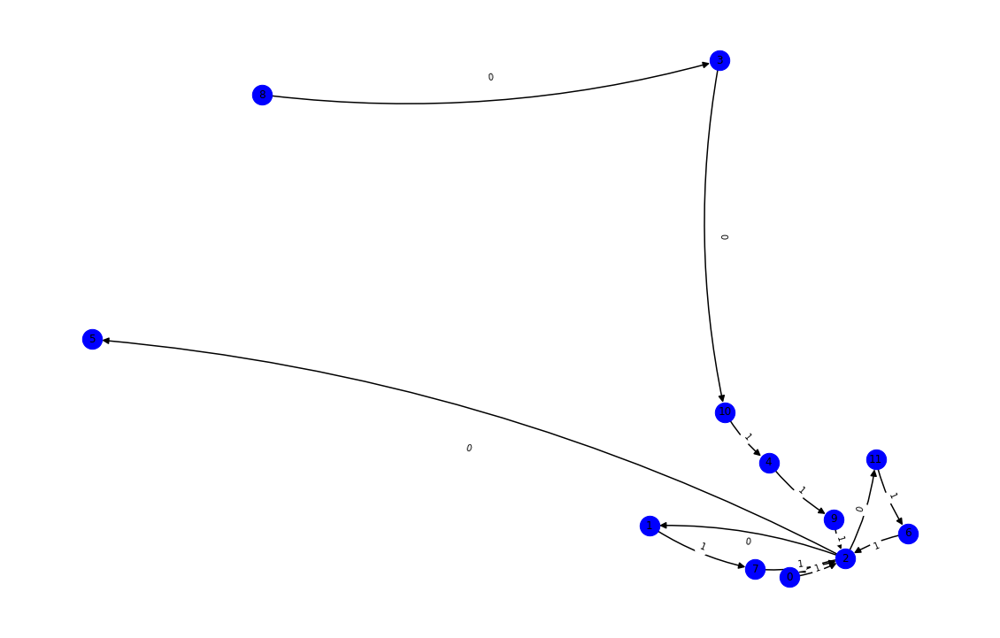

nft-id 45676
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xbe191f9bace6dc51897e2bbf1a31bfc6eef066a8': 1, '0x83ca25e2809e9dbf6d1101df37a440f2ffb46f6d': 2, '0xd59f530a4c970982097cf2cdf99e94bfd68cca12': 3, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 4, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 5, '0x0000000000000000000000000000000000000000': 6, '0xbe063b35610d72ba229687af82e60e9ba387d68f': 7, '0xd42fab871e708308a178798edd7eaf63638ce519': 8, '0xc888c19a101979e0c29274895a86f0c3bab6cf7b': 9, '0x826d8e0a4ee2107b5639be1b36eb7a214d33bc47': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


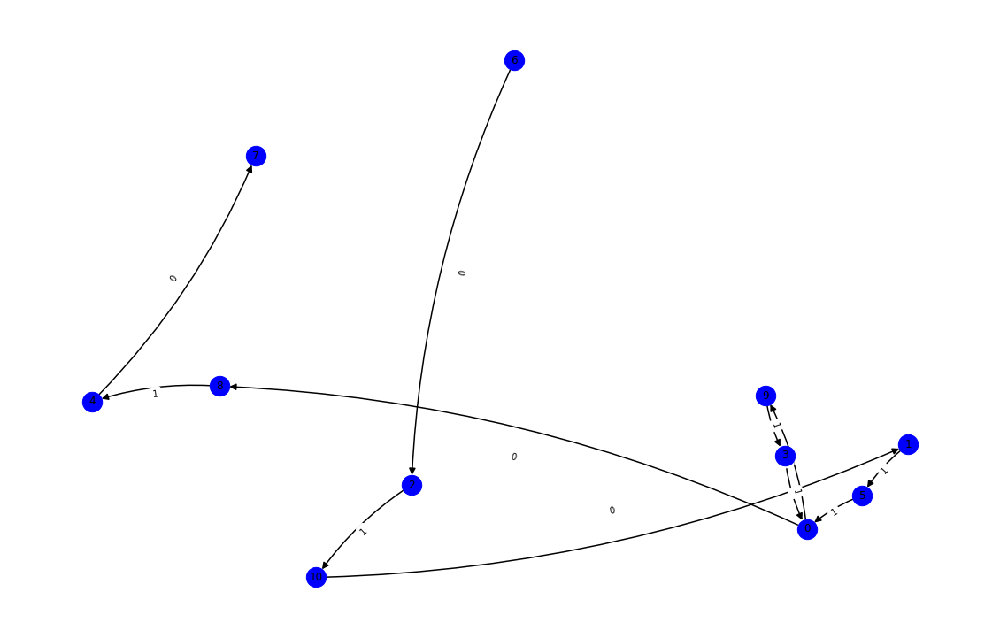

nft-id 33014
mark_dict {'0xbdb17158810ed728376e9e53f260e64bbad46098': 0, '0x0e3c1417c496c22aeefaf0004137f145b11b690b': 1, '0x483b613641720bdd7848f4d90a01883141b753db': 2, '0x7df7afc5293735b0d63844511352a67d70178476': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x6f471ecb704a38e653c839ddd7e3957e989a9d29': 5, '0x0000000000000000000000000000000000000000': 6, '0xa858ddc0445d8131dac4d1de01f834ffcba52ef1': 7, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


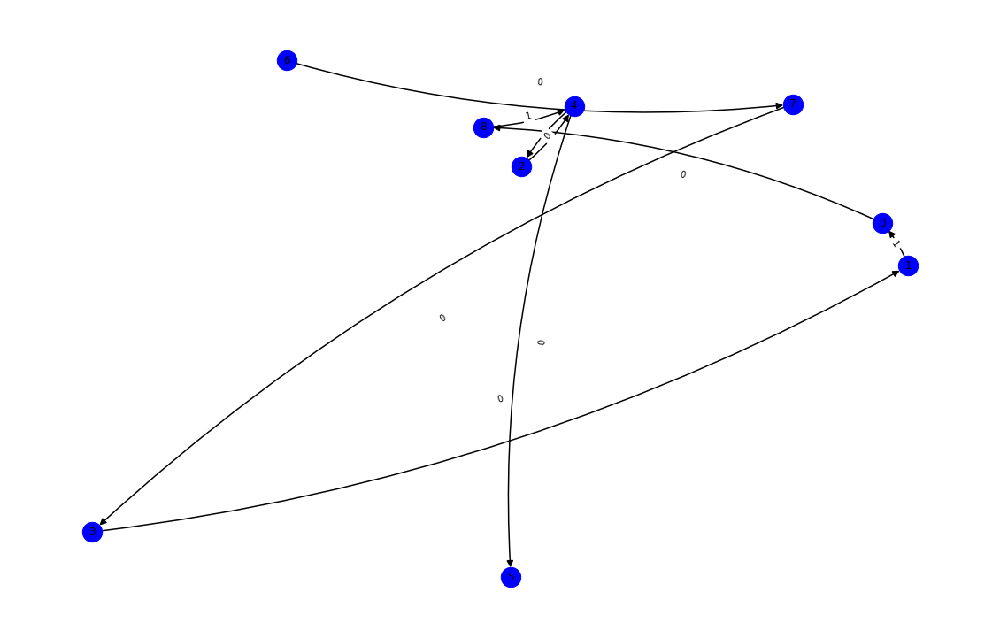

nft-id 93056
mark_dict {'0xbdb17158810ed728376e9e53f260e64bbad46098': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x5be58ac28bcbc367dc52d44ee1a878832b7cd0d0': 2, '0x8a3acc2d82c9a19efdbddb803add7bf7713c4545': 3, '0x0000000000000000000000000000000000000000': 4, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 5, '0x95deb63b5d3c9a193349a97e3d55b75e77b7e138': 6, '0xdde01147aac2152dd0776bc3ed84cc96474df52d': 7, '0x92e23d20fac1e040b665242d3fef2540a14fbbd3': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


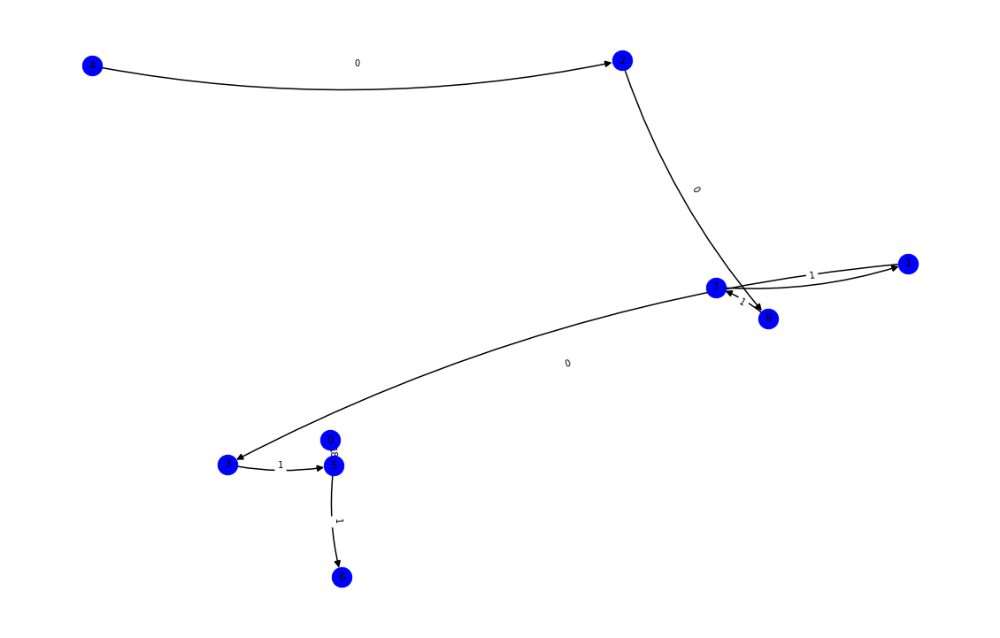

nft-id 61542
mark_dict {'0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x695fe1bb353bcfa982b4733f1fd7b6f56179e185': 3, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 4, '0x206153c003d24171702a0947ec1008f125e6f155': 5, '0xb154af72c7f5760a92c46193aeb24ff8ddd64488': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


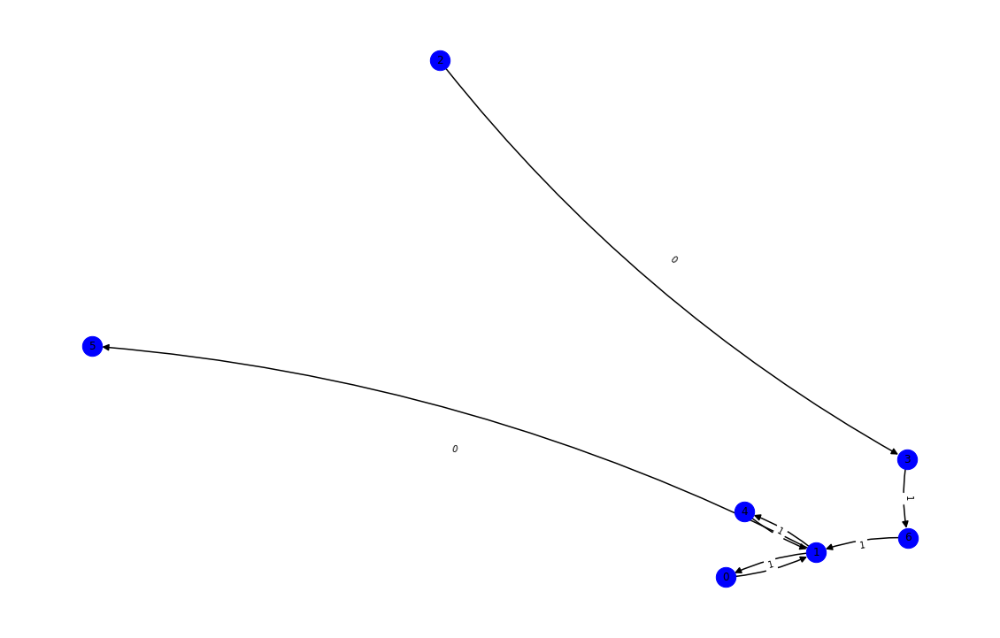

nft-id 74773
mark_dict {'0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 3, '0x206153c003d24171702a0947ec1008f125e6f155': 4, '0xd93fc91f195670c9d10a55eb0f05a0ceaddb3be8': 5, '0xce157323e7d8d40a29e9030ae6bbf8f6f1fa0896': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


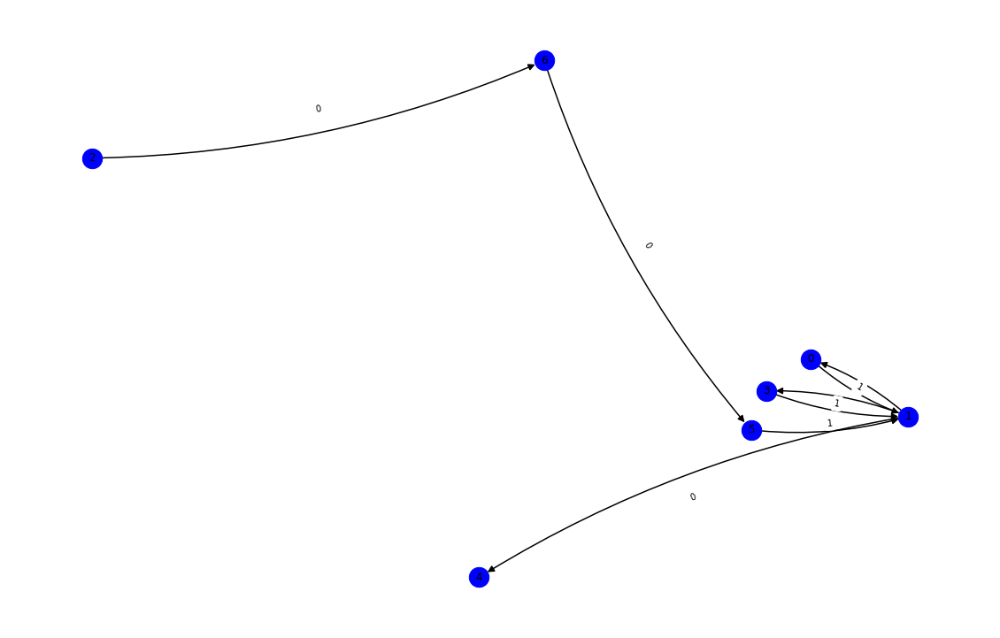

nft-id 80003
mark_dict {'0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 3, '0x206153c003d24171702a0947ec1008f125e6f155': 4, '0x59427cd74811cd0528fa8169ef553c5cf4960ef3': 5, '0x61d61ce79440c21fb0976c663eb157e6b3f305e9': 6, '0x723ea739cf0986664f555baaeb56baa08102c49a': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


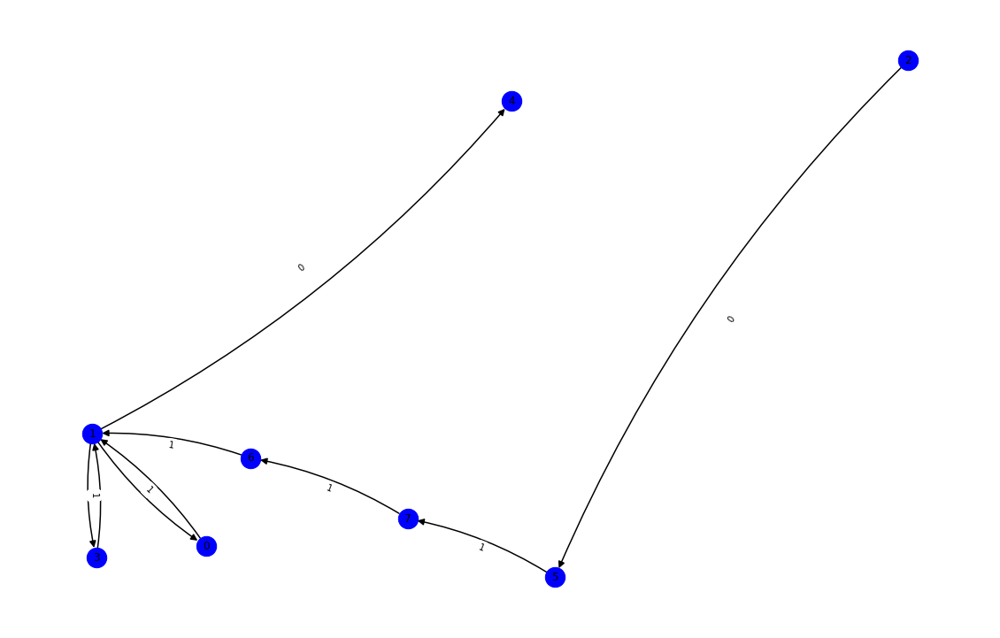

nft-id 66940
mark_dict {'0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 0, '0x4f3215bb59dbd3a868510ebc02971570778aa360': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x1a115d65d170925aa4ac72450c984dde127bf1eb': 4, '0x206153c003d24171702a0947ec1008f125e6f155': 5, '0x2232e8d705f08e29fdb837206680454ae5368e98': 6, '0x1a8b7b8c37df6f960c57a5785370eec4fcdfdbdb': 7, '0x96d86244b8259b7540e2c7ab61c337ffa222e61f': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


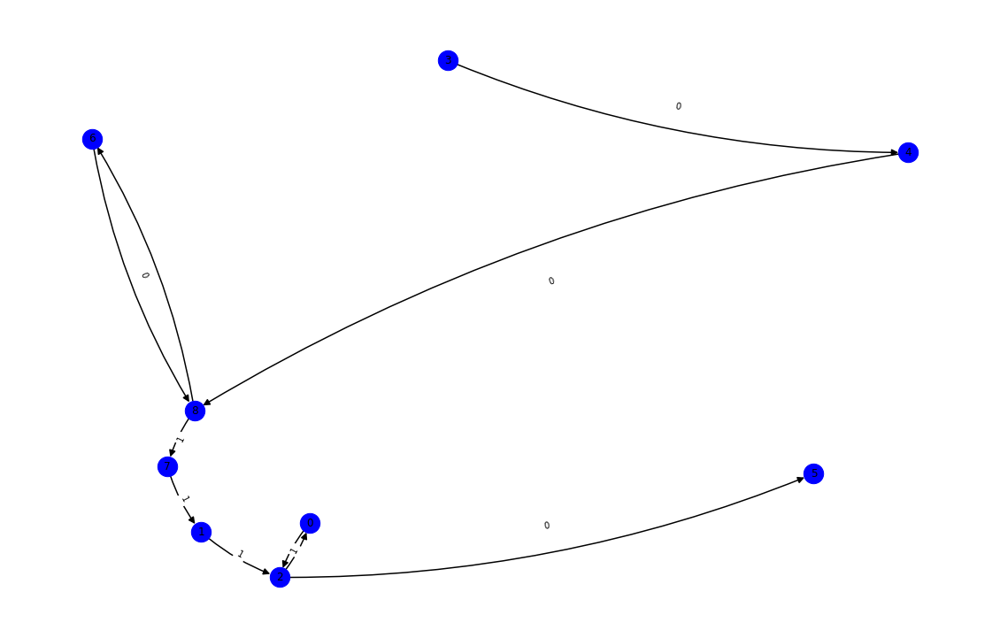

nft-id 63828
mark_dict {'0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 3, '0x206153c003d24171702a0947ec1008f125e6f155': 4, '0x28ae20a70714d7867a2bab4be275f4edc960dd85': 5, '0xd7b407bdb76ff8d4e58f6b24543716945f455bb2': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


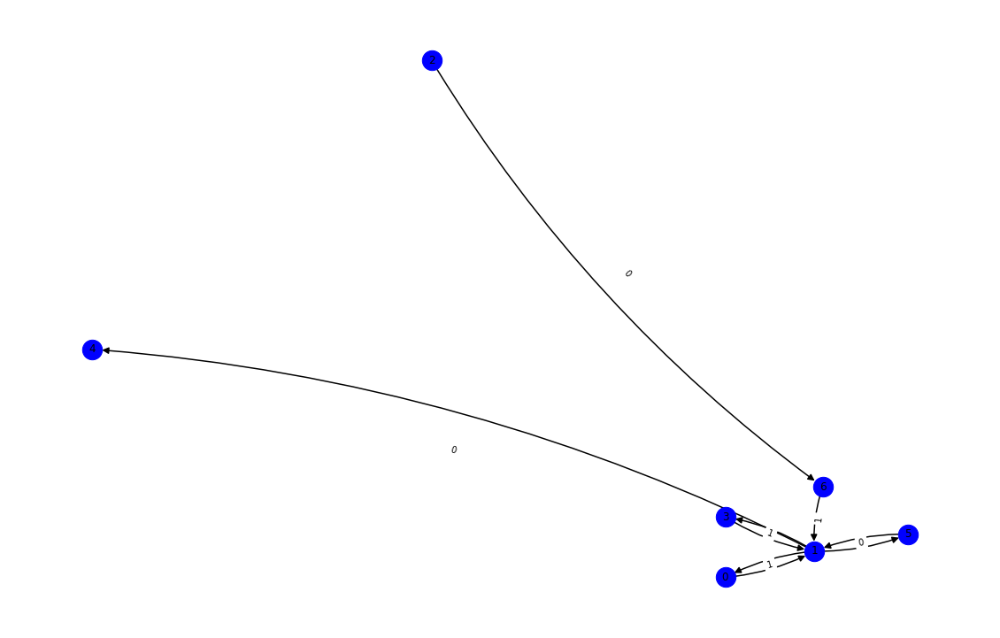

nft-id 65458
mark_dict {'0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x87e4e2733ba4e4c362027e06258988b34c1876e2': 2, '0x0000000000000000000000000000000000000000': 3, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 4, '0x206153c003d24171702a0947ec1008f125e6f155': 5, '0xaa114724f2bcbd859d01585435e3076671314d2e': 6, '0xc777c0c135b40304c315d5d072ffc24fd777e68b': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


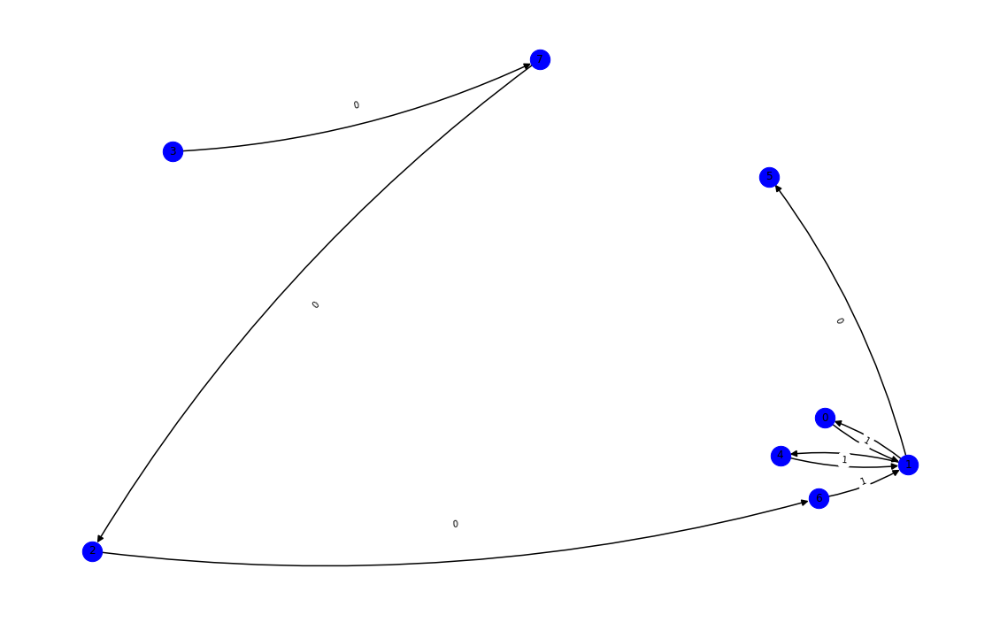

nft-id 97033
mark_dict {'0x51b384872428fb424d8e193ee8733e960a9256e0': 0, '0x31837aaf36961274a04b915697fdfca1af31a0c7': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xa0b71369b3f31c5cdf9c8744eff4ee24b825da73': 3, '0x2f9c3f70c0eac09105f97f9bc2da560214d06711': 4, '0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 5, '0x84649ab570f6a4e179a65fcc2f14aafd363680db': 6, '0x0000000000000000000000000000000000000000': 7, '0x4682f2465436e97f25acf00484ae40eb60eb9a67': 8, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 9, '0x206153c003d24171702a0947ec1008f125e6f155': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


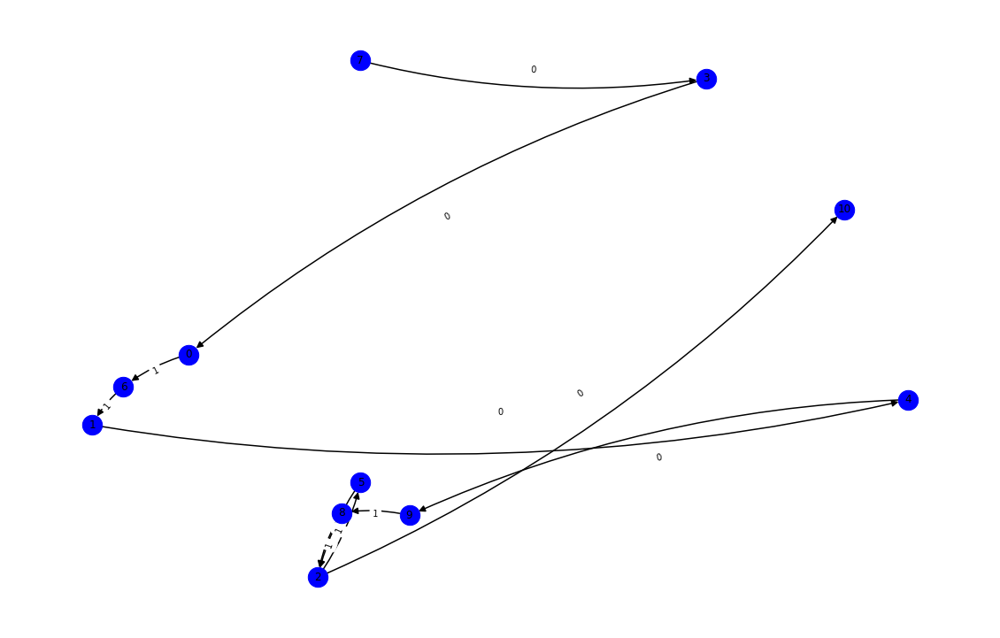

nft-id 88694
mark_dict {'0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xac671b03ce1c14018f99da62802e79c44e93c8c5': 2, '0x0000000000000000000000000000000000000000': 3, '0xab35827686e6f2ec4a5fc38fd91bb7cc0877cf86': 4, '0x2443047e6ac82fe65035e36e971316d981492857': 5, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 6, '0x51aceb6e60635c770b97025596080f588b9bb7ba': 7, '0xe74ca58ef724b94fac7f2e09e2e48536a5c1ad03': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


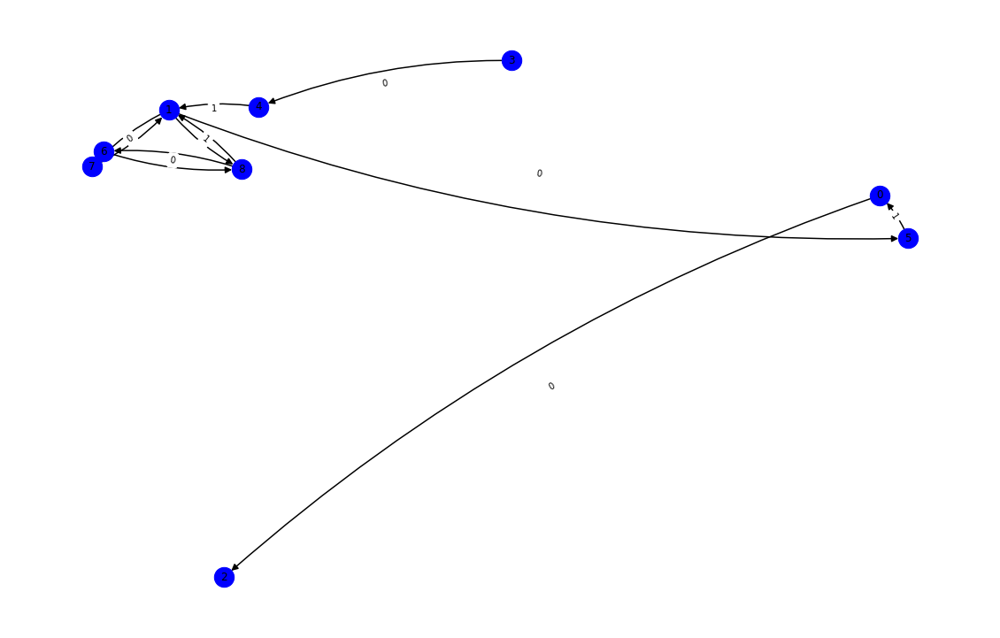

nft-id 71692
mark_dict {'0x15e37293bcd44422b60c227568cd58403dec3e5e': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xe8616eab82aa739e532ab72f75bebb8e3238c583': 2, '0x0000000000000000000000000000000000000000': 3, '0x2443047e6ac82fe65035e36e971316d981492857': 4, '0xe80ef3e29c4a8de3867260104befb1ae2d88de57': 5, '0xeb77b177c76b4b18d1442a145f3fc2ca7b195b06': 6, '0xbda23c7da9122f2a250b255c56c4cd48a80c8f94': 7, '0x4b2e2a99f559131dcba313732c1d4f9b2ccafe36': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


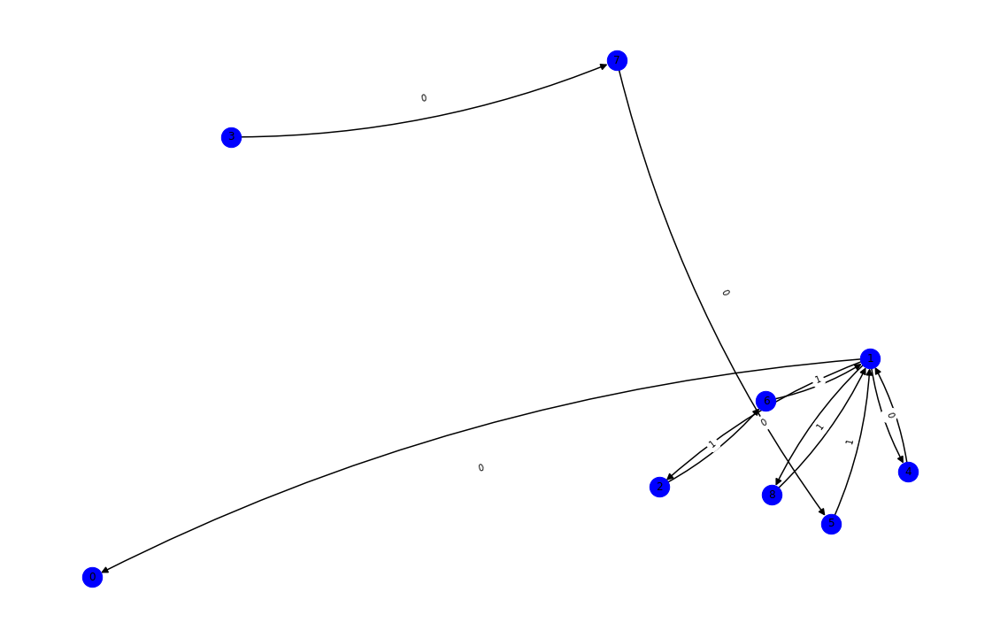

nft-id 75145
mark_dict {'0x50a8abc19fdfa6385f83bf3cc9c39016fe9b3ab5': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0de2af5d27ded1de2570ffd0c62496c625b78085': 2, '0x0000000000000000000000000000000000000000': 3, '0x5f6af6b4f8778175bec97468592a913fa98a163c': 4, '0x9272227568d59326a9be3a2bebbc79c5eb2aff4a': 5, '0xbb69a084ce1c7ae979a196692a7a5c4fcc74fb26': 6, '0xd387a6e4e84a6c86bd90c158c6028a58cc8ac459': 7, '0x184de605ca5320bed875e21c12c0b2d00e08f18f': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


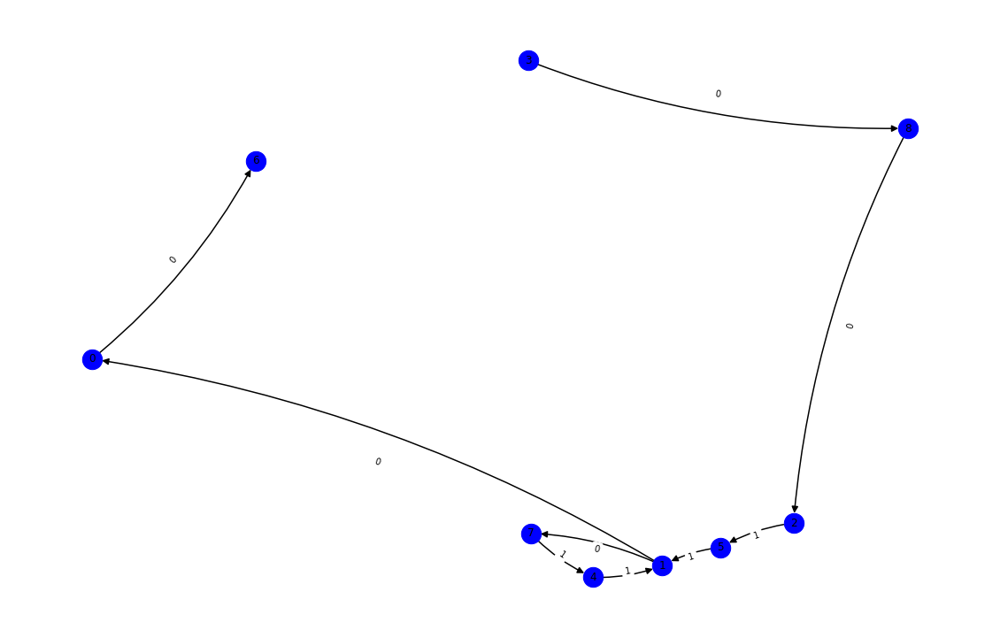

nft-id 88766
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 1, '0xbe7c3c0973d0c25e9e689a59ee296abd2546130d': 2, '0x43d1929ceed5978c6b6c4de8594604412313ac02': 3, '0x69ba23ef93c49e1e2f135c45d61e605824077a84': 4, '0xdaae207700822deaf1a23b52ea41cc2752ac9adf': 5, '0x2d165d1a14bc8d4e92ef91498c905e7078263716': 6, '0x0000000000000000000000000000000000000000': 7, '0x900cb4a0bfa00d567cfbd2b425584341dbefc30d': 8, '0x05ed0f92f802fbdfd567c723f22b0e266f14072b': 9, '0x743cd810672d78f7a5855631f38291db755b5fad': 10, '0x729a054880ed9ba35803b6a1b2462f4cd17a8c3f': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


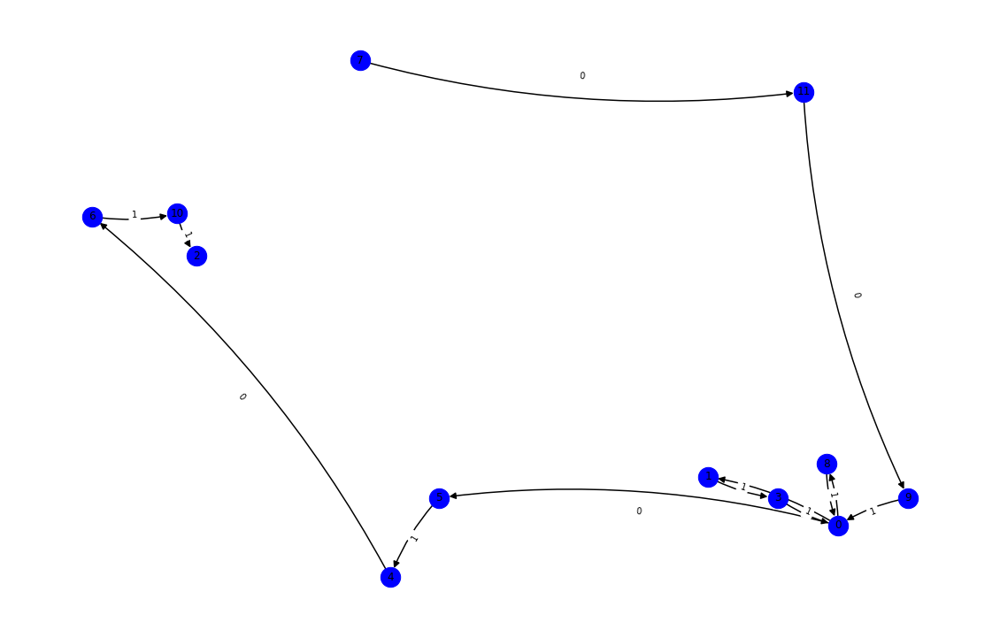

nft-id 46846
mark_dict {'0x483b613641720bdd7848f4d90a01883141b753db': 0, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x7f53cabe44c48ba30c2ef37c756708c4eb177ad6': 3, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 4, '0xbb45b8624d382e80893d2dad39a175a20680fe51': 5, '0x1e094ed9dfe65b02fd4dd14c046ac6b413d383a2': 6, '0x0000000000000000000000000000000000000000': 7, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 8, '0x885fc78772da8bf23a8e0df12a15bd3b05530839': 9, '0x3c3cf516894f74d1988ede594c4f29227ec6eee7': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


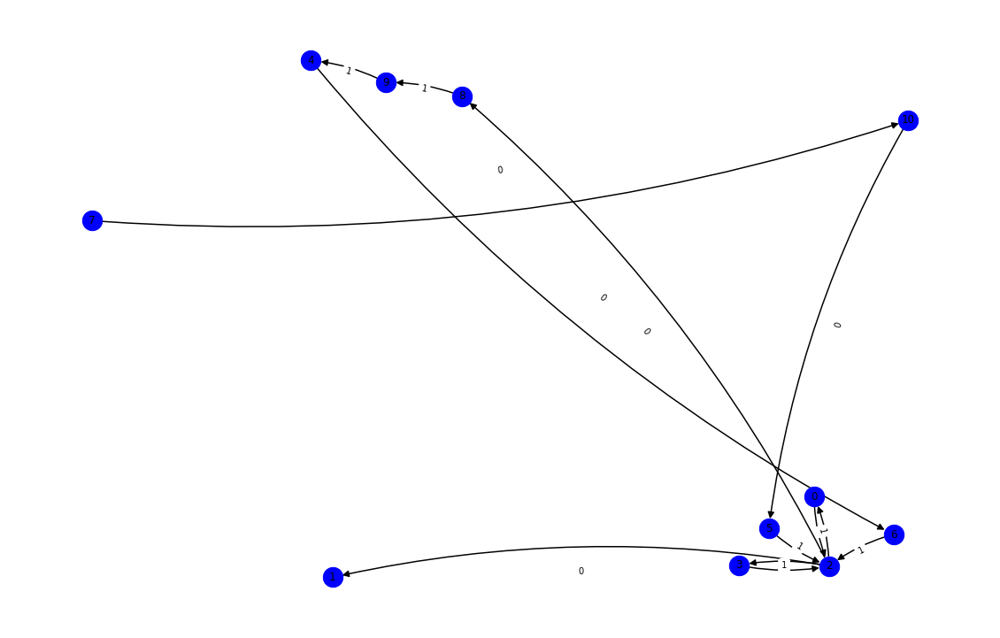

nft-id 5549
mark_dict {'0x3c229864378b3b0adf98ae247ca33986aed8ec1e': 0, '0xcd741cb75cc34145b6437f5070906d5139b7fd54': 1, '0xf93ed353400d140f2f0775430ec8f24bf722732d': 2, '0x0000000000000000000000000000000000000000': 3, '0xe5e5522ea3d34f86b611e27e7ed1099e53e6faaa': 4, '0x6a01af210dce01f44b5067fc688641384a8bce5b': 5, '0x1ac7bb22554e04a05f9e3c8e8978a215af3c068a': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


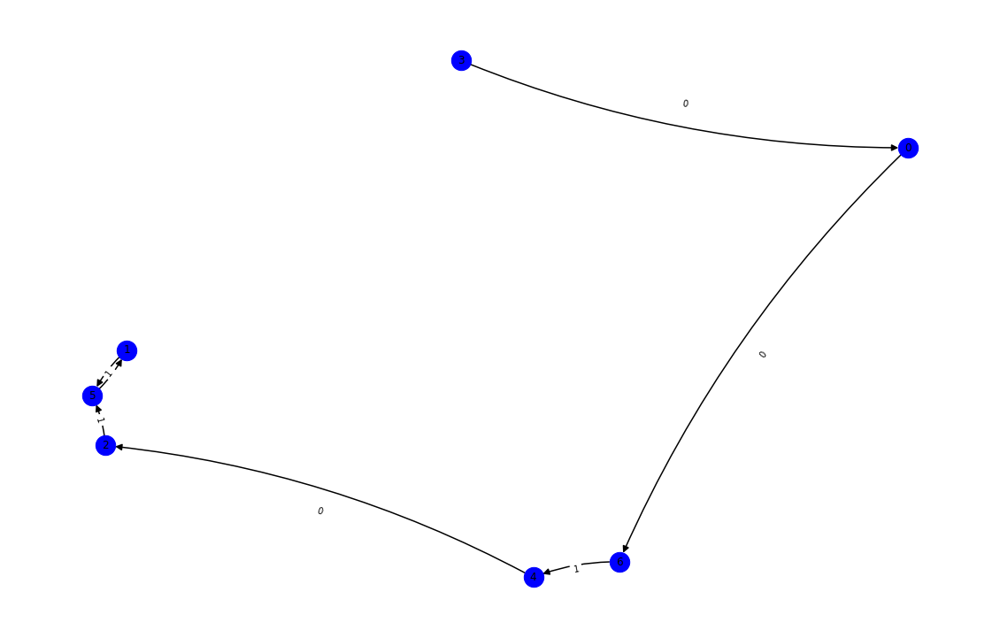

nft-id 78205
mark_dict {'0xcc1cb0fa339eb32e436dce1ba752bda72fc6edfe': 0, '0x76f587939b115db240d93598d553a83f7e598ac9': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x6e3b0bef969c89a5bba4750657c0c6306fe3ba54': 3, '0x0000000000000000000000000000000000000000': 4, '0x36935a7c13505bee7f11502d5b01fc8ea6a47383': 5, '0xfd35624baf2f0b3755b7cfbefec7bf62f9761702': 6, '0x8ca269911567dbe96a7ca4935f751cd4cff2a5b4': 7, '0xdcf49cccf1c553755641264b56679c577fa6a395': 8, '0x1618406d203aefa14526f77d79fdbeac9d42137b': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


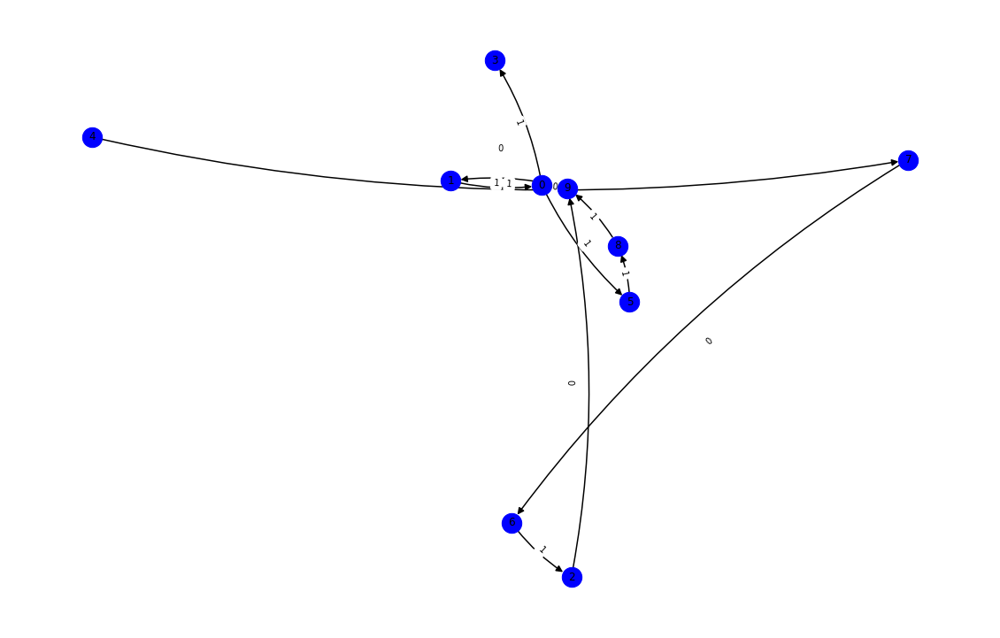

nft-id 85534
mark_dict {'0x5bedb9331ba476e786f85849307d1164c3e37f84': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xb44bdb0c63d543e536369fa94985350977264a61': 2, '0x3e41291c9db95bc329a474edd493d571fb0ecf7c': 3, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 4, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 5, '0x62f07535a44611b72c00ee4ef3dd423aaa42b60d': 6, '0x4825e50af5b0726a695aec3d265b334736ad3275': 7, '0x2af4b707e1dce8fc345f38cfeeaa2421e54976d5': 8, '0x0000000000000000000000000000000000000000': 9, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 10, '0x550e970e31a45b06df01a00b1c89a478d4d5e00a': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


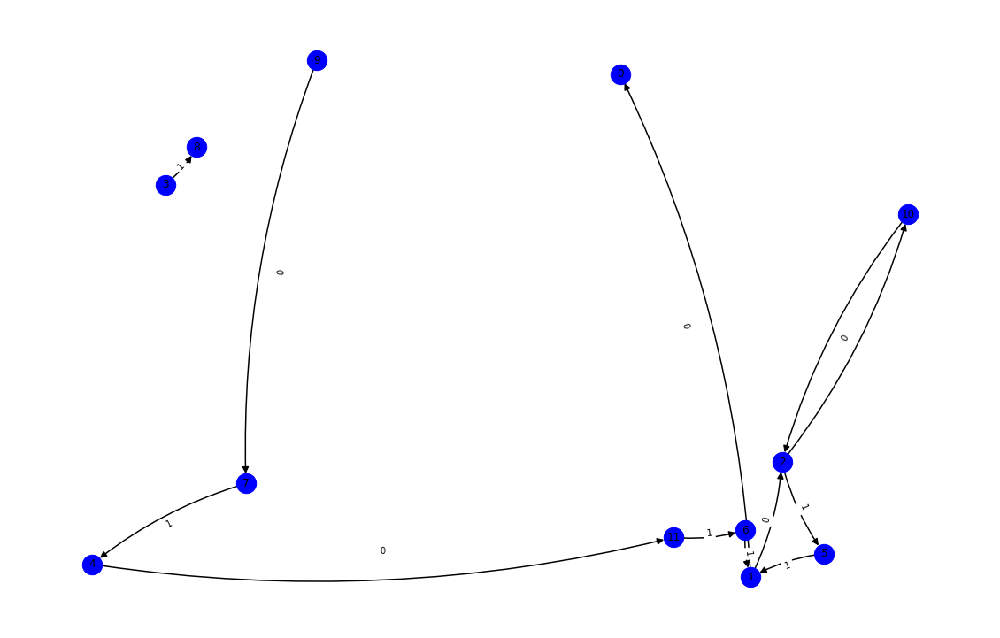

nft-id 54470
mark_dict {'0x4add85892f15b13d407bae215ab1fbec88487b82': 0, '0x1a5f1cc47f71067f736721360506b2a6250bcbdd': 1, '0x5a7a6b69c6382000fd35711fd28440f415417318': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0xb44bdb0c63d543e536369fa94985350977264a61': 4, '0xbaa593844f49c01e42f3f691833905796c0d9565': 5, '0xb08126344f4f78ffc09ac4a5a6ddadb5d1cfc23f': 6, '0x2a2258f2e6c3f75830f5b805623457a4ea38ca6d': 7, '0x8ae57a027c63fca8070d1bf38622321de8004c67': 8, '0xb82e3312f1777c152457116f69febdb18f15ea03': 9, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 10, '0x0000000000000000000000000000000000000000': 11, '0x2afc7b75b52260c27183fcfd7e902d70febd9017': 12, '0x2443047e6ac82fe65035e36e971316d981492857': 13, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 14, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 15}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


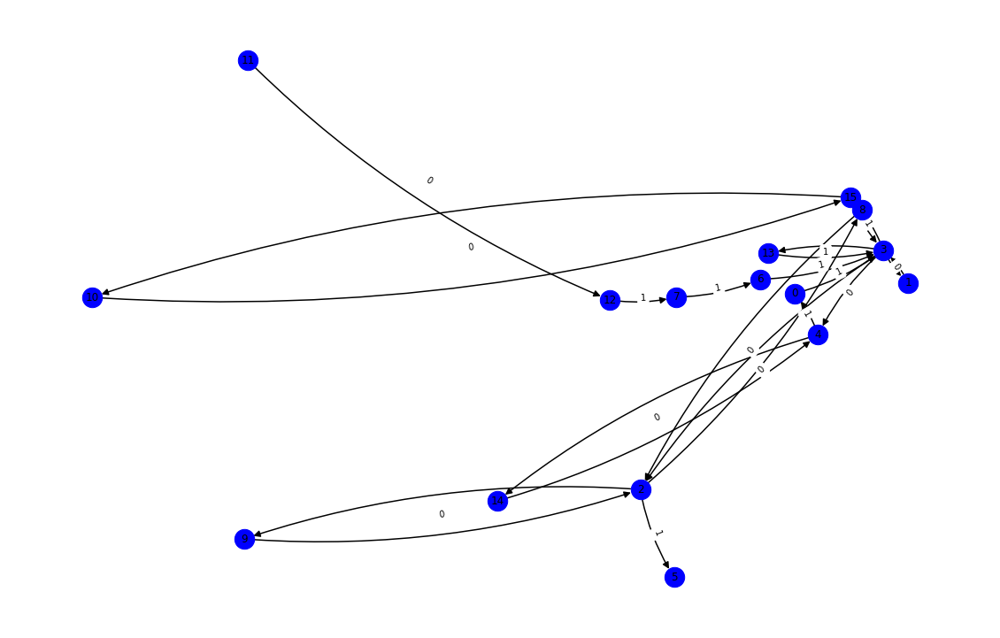

nft-id 92501
mark_dict {'0x8b28bb4847b0ec8bb63140de8e5b5b707ec842d7': 0, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x86c9e3ec6a073a36b83c39412d0934e461aba2e0': 3, '0x0000000000000000000000000000000000000000': 4, '0xe0a60ccabbcb0937fba5dcf1333f0fc6f0ea54b4': 5, '0x4682f2465436e97f25acf00484ae40eb60eb9a67': 6, '0x7a21775d5ebe3825c0708986c0f2ffa738cb80b9': 7, '0x81f44a8ca81c98d213051a520e5ee88dccdf0a0c': 8, '0xaba2f3f01da71db8da0fa35b07997f0ed49a2973': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


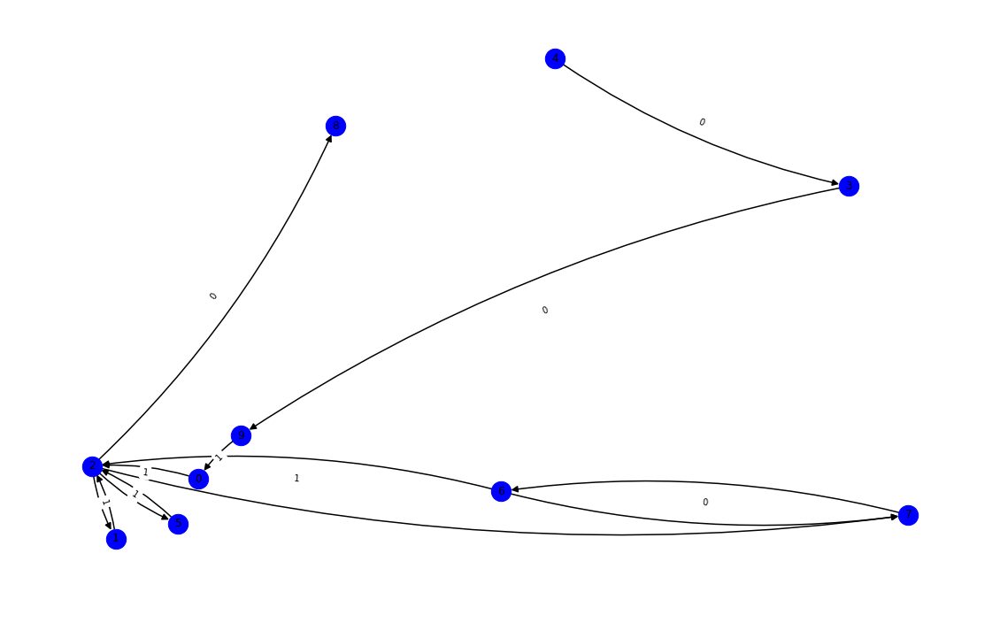

nft-id 55986
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xb89d16beac18e513743baa6a6e09f60460367ac8': 1, '0x14d702bd1ae7a48df5d33c7f873aa353bbc7446d': 2, '0xd387a6e4e84a6c86bd90c158c6028a58cc8ac459': 3, '0xf1dfcc615484bf4d7ccb06093995487f4938dd91': 4, '0x2f38afeb3e70ee5005e9dc8363581527c693ad7e': 5, '0x69ffa92731aa0dfedc67c58f39c1e785f79115fb': 6, '0x68ae44e5fe22551c7e1bbcc59ca4d94778f49c05': 7, '0x0000000000000000000000000000000000000000': 8, '0x9c2000dfc5a5b97eaea0df061ddde4f1f9f4d8d6': 9, '0xcada0879e545d046eddc16838a69c8e6aab7d72c': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


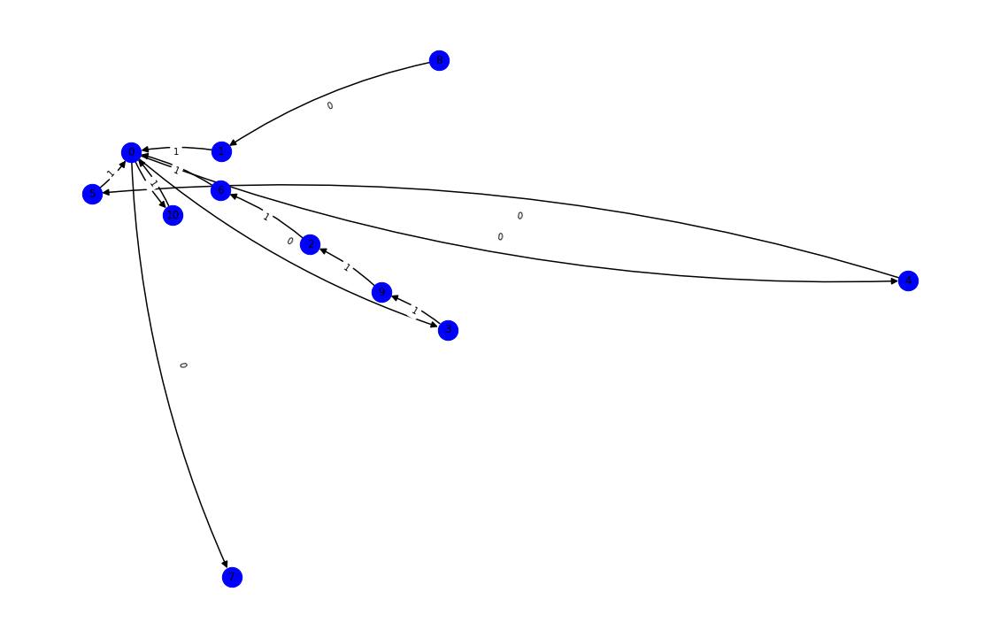

nft-id 82318
mark_dict {'0xee40f51a53340439cab72b086198c89c25936cc5': 0, '0x48766b6e4bcde79ad8134d338851e4d6739de113': 1, '0x2c638d7c03dd57351cc1b9c08d2b6fe8e9de64ce': 2, '0x9ba4587f6d9be316c02f084c4e3b2b2d1253be34': 3, '0x0000000000000000000000000000000000000000': 4, '0xc21f97e340481d65fa1ba3d1bd299fc51033794a': 5, '0x4a0054073fa7fdfcaad775ddfaba950ca5357d5f': 6, '0x0a9af8974e2e9479b3c999c7b1043d1ea01ab435': 7, '0x5f0003d61e76aa668e73a670a7d873f171b22981': 8, '0x1079061d37f7f3fd3295e4aad02ece4a3f20de2d': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


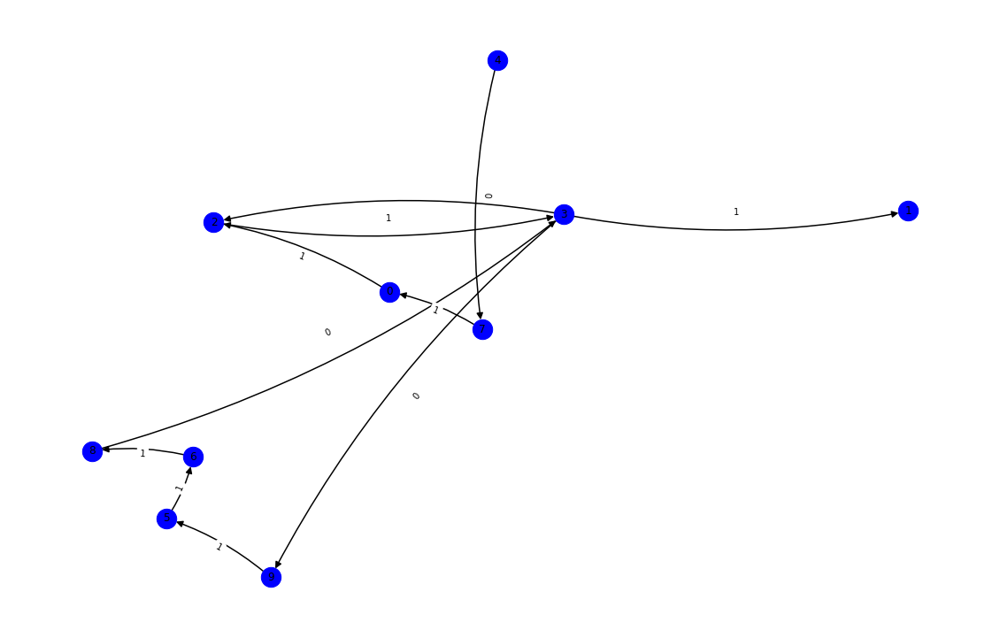

nft-id 51845
mark_dict {'0xb4093fd7b67b0048e8a72fe60a63a80aac41d34f': 0, '0x09b448daa055c891140e9f5a4413f704dd537bef': 1, '0x0000000000000000000000000000000000000000': 2, '0xd0c6abffa5d3e64ee8c8015f4849251465d1ada5': 3, '0x6741791f89e925f810e01aa77c64fb815bda9775': 4, '0x6f435a9421653b27f048957b8ba2092d65a711f9': 5, '0xd2525dac5be205069e631a9d3465ab49155d8769': 6, '0x9250f8149067fc068189f95e92f0eea9673f62d0': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


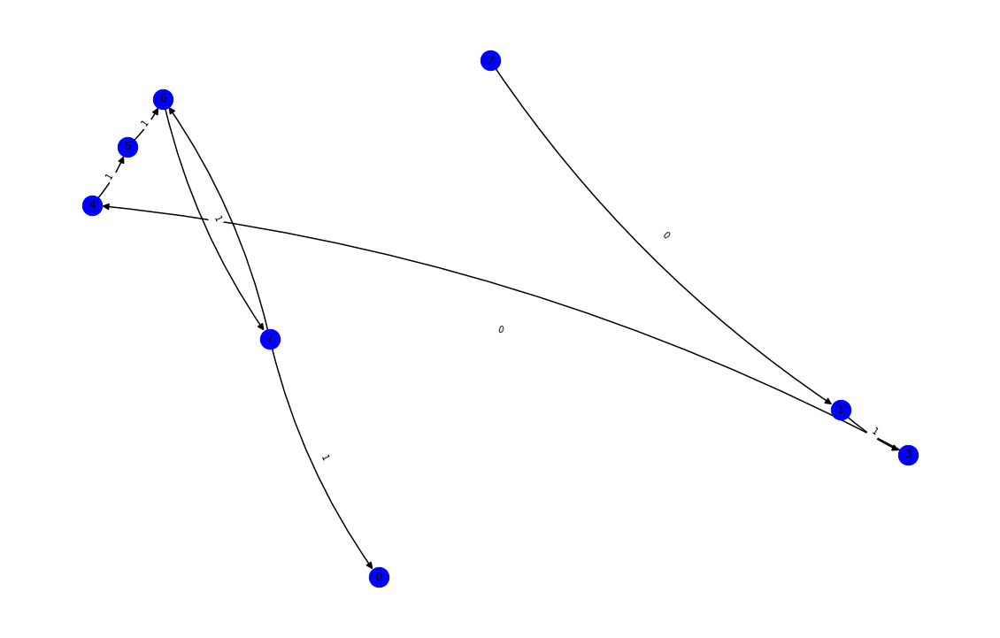

nft-id 25213
mark_dict {'0x5783fd342bf83daa165ad578bb2af46cc8842168': 0, '0x2c638d7c03dd57351cc1b9c08d2b6fe8e9de64ce': 1, '0x0000000000000000000000000000000000000000': 2, '0xdad19177128fc63b9de5aac7c9afb08ede8830dd': 3, '0xb9960c1b1f0350f7beafeeac62137c0f46110f1d': 4, '0x04a8f6ae74c582c4fd68ace2249ef8e6d88f128e': 5, '0x9e523b589b08ebff834bd7cd302372a98474751a': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


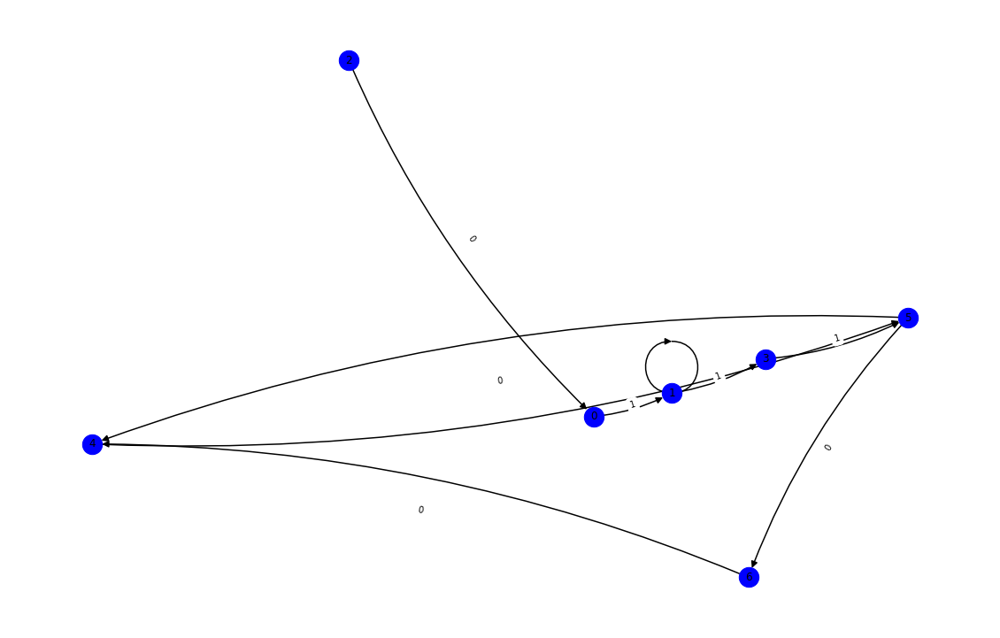

nft-id 92729
mark_dict {'0x2c638d7c03dd57351cc1b9c08d2b6fe8e9de64ce': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x398851f0412decb07d5a1ba900c352c1aad7b432': 2, '0xf371875a0045b1fd61c4b1166066dcdd3bde1bb6': 3, '0xcfba447374411b8d10d6d22fa292f0569b279fc5': 4, '0xee40f51a53340439cab72b086198c89c25936cc5': 5, '0x5d23b4ea39e274b23fdea9bfdb57b032aced47d4': 6, '0x0000000000000000000000000000000000000000': 7, '0x4682f2465436e97f25acf00484ae40eb60eb9a67': 8, '0xc71d3d20f7ef5d9f200b3420f36e7a7c852a4ae7': 9, '0x93fc3b8ae717608556afd77680d9754ca425632c': 10, '0x6e6e10bbd92c5e490b0832a96141902f5533a63b': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


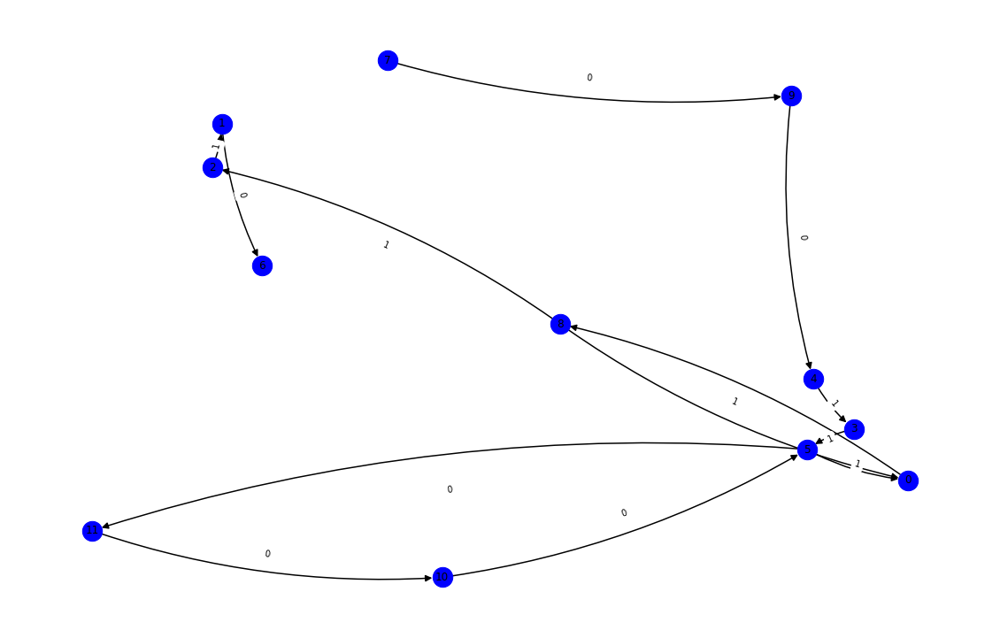

nft-id 61224
mark_dict {'0x0f576fe0a916ca39ee929f0cc956cfc9d2a59c12': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x8989cac6a40839f174361df28e85425a7adc3886': 2, '0x0000000000000000000000000000000000000000': 3, '0xdad19177128fc63b9de5aac7c9afb08ede8830dd': 4, '0x7dd205076d577ebfd6b2f6c59a80981440f9ae02': 5, '0x52e73fe39e039ee0bf5efad4895e306778ce1021': 6, '0xd2373c87102a22a9c9f9c99e5f117c91ca6b07a2': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


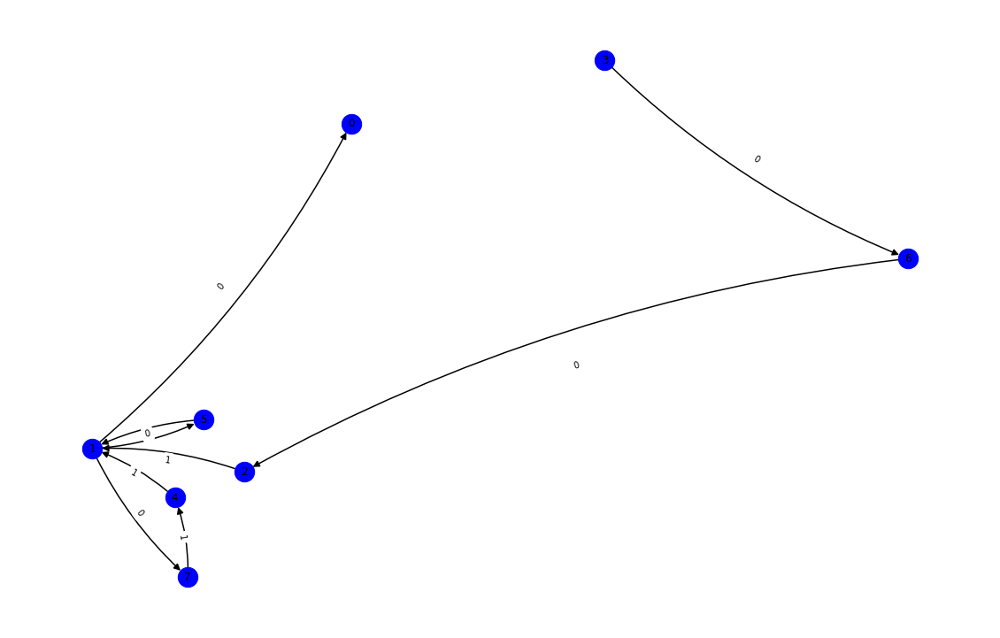

nft-id 63918
mark_dict {'0xa3070722a0b1cf0c49f7fd751c692c6c55f9b7da': 0, '0x4d55fd621e407e9712df2866beedbd642d8006b7': 1, '0xadcfe6c8bf4033c0a0e30c2e1c30632c3486b61b': 2, '0xf5b0dfe3167726cd164d74774b2ccda79626ec92': 3, '0x0000000000000000000000000000000000000000': 4, '0x831f84477e7603e83652c9be4464d397c5896d65': 5, '0x53b632b7752f4de163bee51dd365eefb27ff4295': 6, '0xaa34dde115e593dd26d0e6b250321803371dfc95': 7, '0x8924ac1196e2ae89603925b6e001dd14e3f7fdff': 8, '0x9250f8149067fc068189f95e92f0eea9673f62d0': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


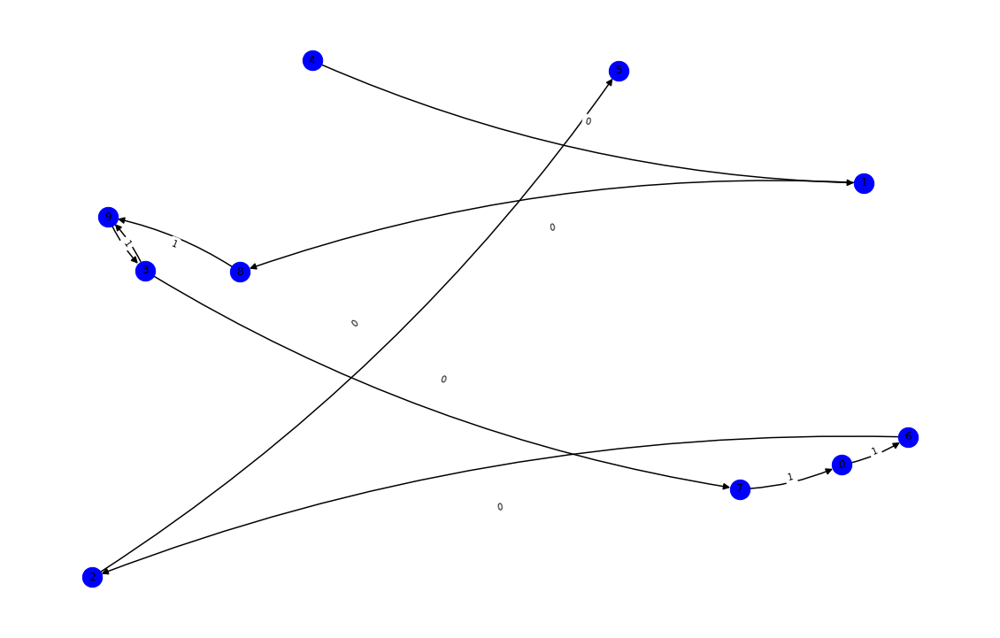

nft-id 23688
mark_dict {'0x4a5139eb46fb4de32d838d66c52846618c57cb37': 0, '0x60b9a6e96073f3a560d40c525181c06e556d3538': 1, '0x0000000000000000000000000000000000000000': 2, '0x52900e0ddbee0ddd3de20c51ad53863eae52c1b4': 3, '0x3f657b1182008520a5e9ccc75884ef01422b2559': 4, '0x9250f8149067fc068189f95e92f0eea9673f62d0': 5}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


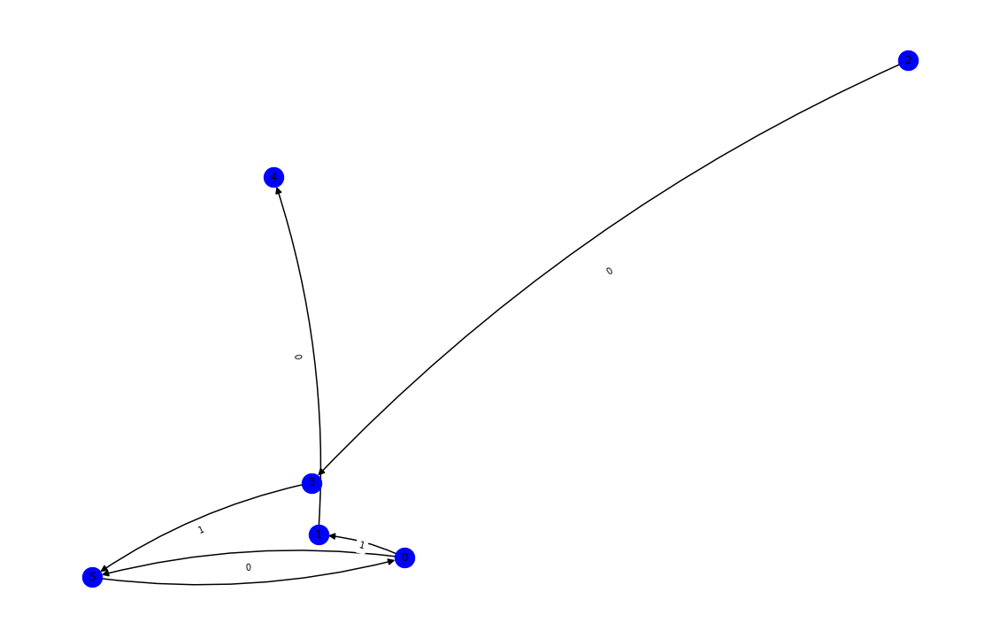

nft-id 75520
mark_dict {'0xd595710aedaba1d2e18bfdbab46ab796664c6d89': 0, '0x0f576fe0a916ca39ee929f0cc956cfc9d2a59c12': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x2448247e25220ac04a9048ac563c5edd5b5644ce': 4, '0x8951f25adcc7c3256dd9b521ed726fb587a46d52': 5, '0xd29da3992add6d78a469166e6254ee23ea4490e3': 6, '0x9a3a8f8af4aa094165a0bbeb5104cf4d38788073': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


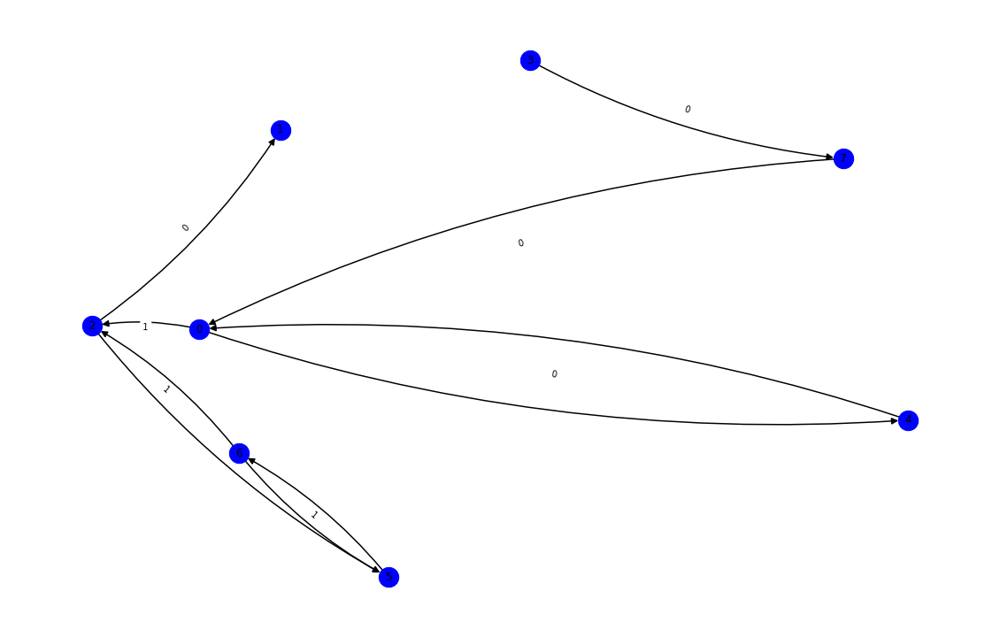

nft-id 80023
mark_dict {'0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 0, '0x48c8a62a88c54178da0fa361b86c63a01b9baae4': 1, '0x8929451c982ccb991acf1e55d5417a39d00dc1ae': 2, '0x0000000000000000000000000000000000000000': 3, '0xde041eeb79237d066b7478b7e97b8ef4675fb8a4': 4, '0xed5497931d0da0ff00529c8d1876a745c1b59fcd': 5, '0x9f28152ae399a6f1b9760c04972de4f9303c0c9f': 6, '0xe4b77842e0d992f6358f0742f8c2cbe955b8839e': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


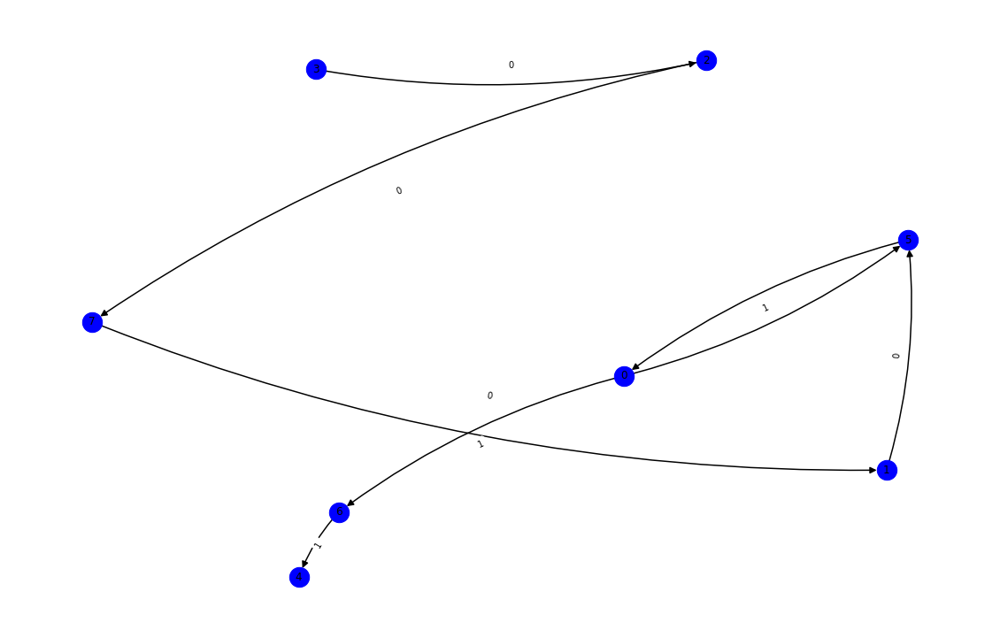

nft-id 96410
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 1, '0x58cd873b0304094ea7950474e8bd42e1ca7fccb6': 2, '0x5d23b4ea39e274b23fdea9bfdb57b032aced47d4': 3, '0x0000000000000000000000000000000000000000': 4, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 5, '0xcada0879e545d046eddc16838a69c8e6aab7d72c': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


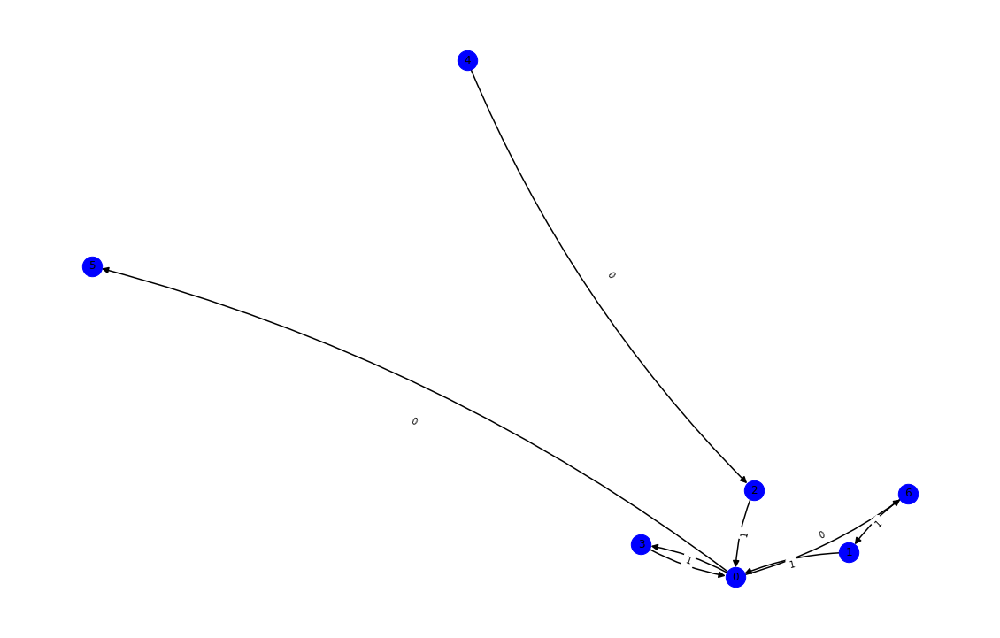

nft-id 72850
mark_dict {'0x676e3ae8802a271e5d091cdf3ff7069393ed6597': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x828b292daefaa119c021af635879d9629177391b': 3, '0xf14afa6a2960a3e79a9a1d617405907f67a7f9d4': 4, '0x4d91838268f6d6d4e590e8fd2a001cd91c32e7a4': 5, '0x7e6d71f8f993c8852f689f85369a5feed74f097a': 6, '0x9e55f15ed879256c7a48c6f5bd799b2249fad04a': 7, '0x7e4384ad48860ae13107b8c8a2b877191edfe2a6': 8, '0x1618406d203aefa14526f77d79fdbeac9d42137b': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


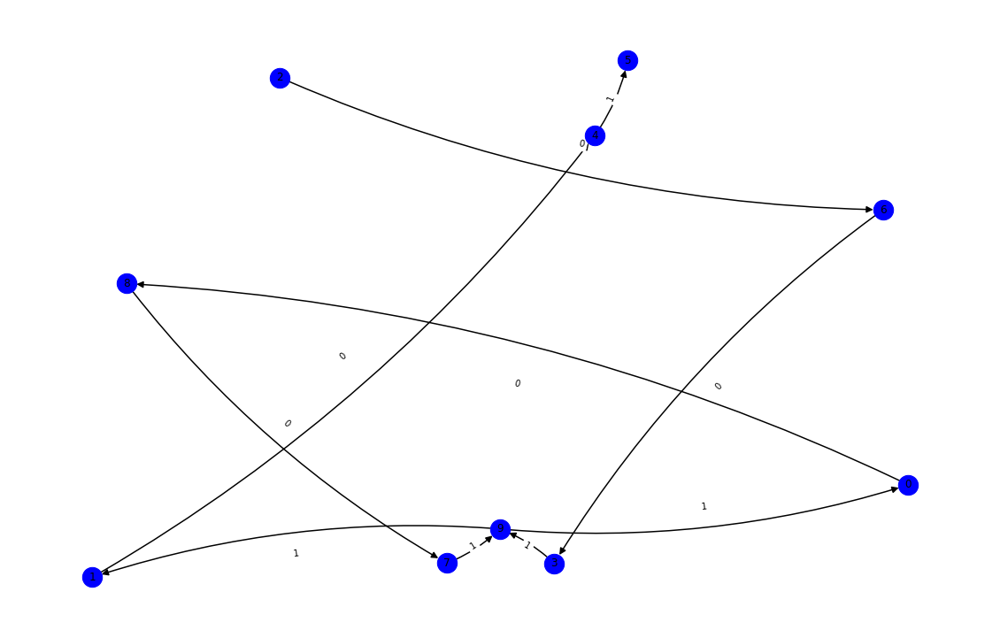

nft-id 97940
mark_dict {'0x3d0de4563043228eee85ae44fd948963288f8c5d': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 2, '0x0000000000000000000000000000000000000000': 3, '0x38639d9180e1e42df89fb1f80d97fd42ba87f141': 4, '0x9fc7db618eba6199703b9a605dd216959954a4ee': 5, '0x4e0de27d72e921fb26c30dfc9e1bf009aae30141': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


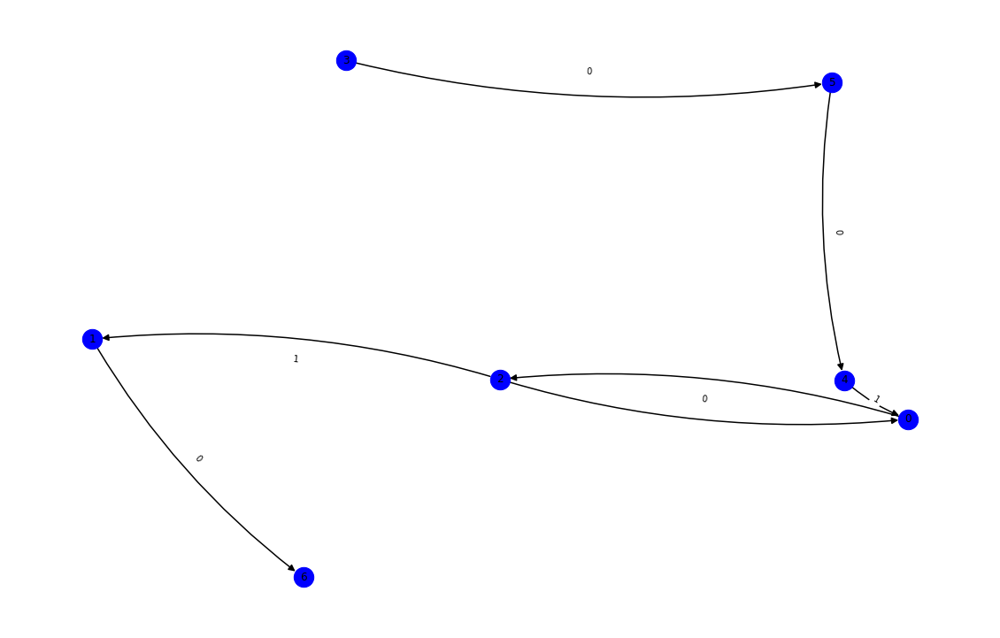

nft-id 79229
mark_dict {'0x75cf2d77d40abd92756c704a963098a87b4e1aec': 0, '0xb8136b15cd5a38dda369cab119087ca7510d27af': 1, '0xc9e57647fb867c13f02bcb68ddeb2a413ecc068a': 2, '0xdcd6be5b142deeab1a011c909c8a2e4afa0c885c': 3, '0x0000000000000000000000000000000000000000': 4, '0x9acb83a514399c9f5201f55ddab61481d0430943': 5, '0x33874acd87a024d990d48d12d21ce2b9c573de63': 6, '0x1da75fb0da32653fdab9ddecdb42f2ed61f8a28b': 7, '0x3c2014b6a53c2931cf1e90622ee2aea491a52d36': 8, '0x1618406d203aefa14526f77d79fdbeac9d42137b': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


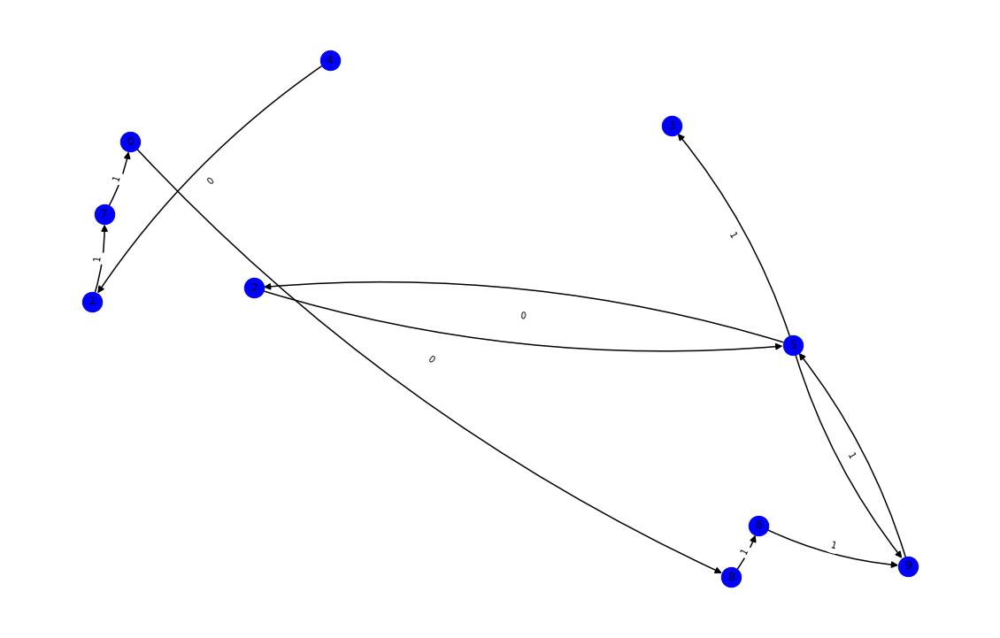

nft-id 64861
mark_dict {'0xda438f0fa79fb4a1dd10c3e5d24bc6e43acacc40': 0, '0xf342c0eb007359651efe7fb52ddb5aeacf57755d': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xc1b81d13acae0c1f835f881b8021f1a80658a849': 3, '0x7a9dc8eeaf5022cecd60c54a042343484ce6c065': 4, '0x5d39fe602866d2ceaef2d050207f5f7cd048cf0c': 5, '0x8b8de1551a96c67e5ba5eaafc41fbc8d87484e95': 6, '0x87e4e2733ba4e4c362027e06258988b34c1876e2': 7, '0x07bd5232774907475ef971299bc3f1032ed03350': 8, '0x0000000000000000000000000000000000000000': 9, '0xdf8d910ca8caf9d3c7dea9b62d36400b38003c61': 10, '0xd1a35cc86caffbf78ebac6af5d21a76e81280995': 11, '0x9774840079f6d21d9441155dda39745aa6c599f3': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


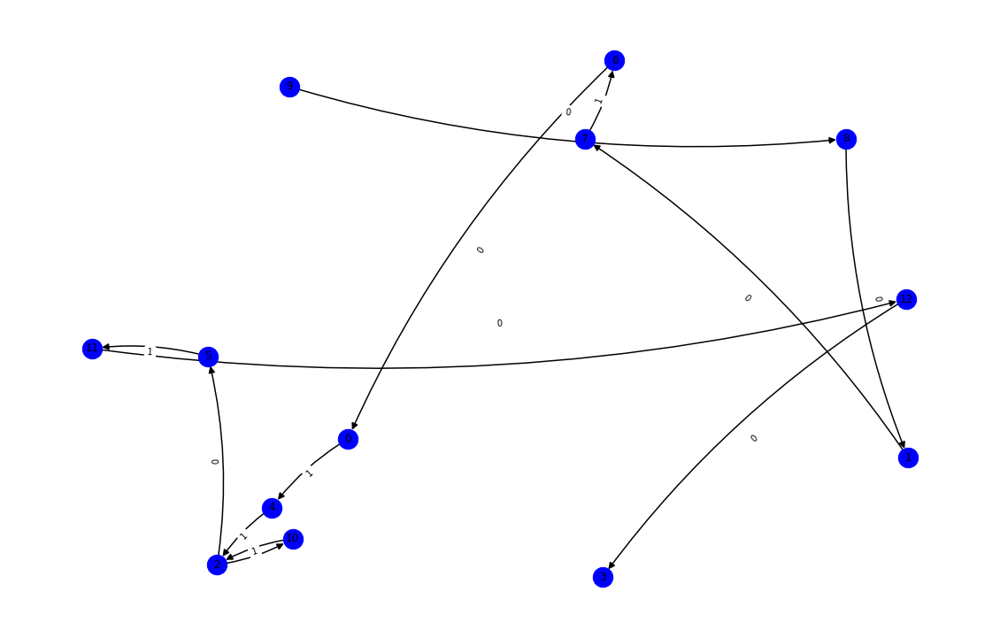

nft-id 83150
mark_dict {'0x7854d63641ddc55e7808517cae05e94869351a78': 0, '0x142668dc89e7e69ce985643ad3759fa8c518a884': 1, '0xd3e44fd29cc3bbee78471275abc56e9948f6482c': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x4191319c0bfb83998d032ab9359c50d17961e37a': 5, '0x4ed470e61bdec94025bd423203f5d459cf60b1ba': 6, '0xf506423a1d4ac3a7cecd4c290cf94f5a577a9cf0': 7, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


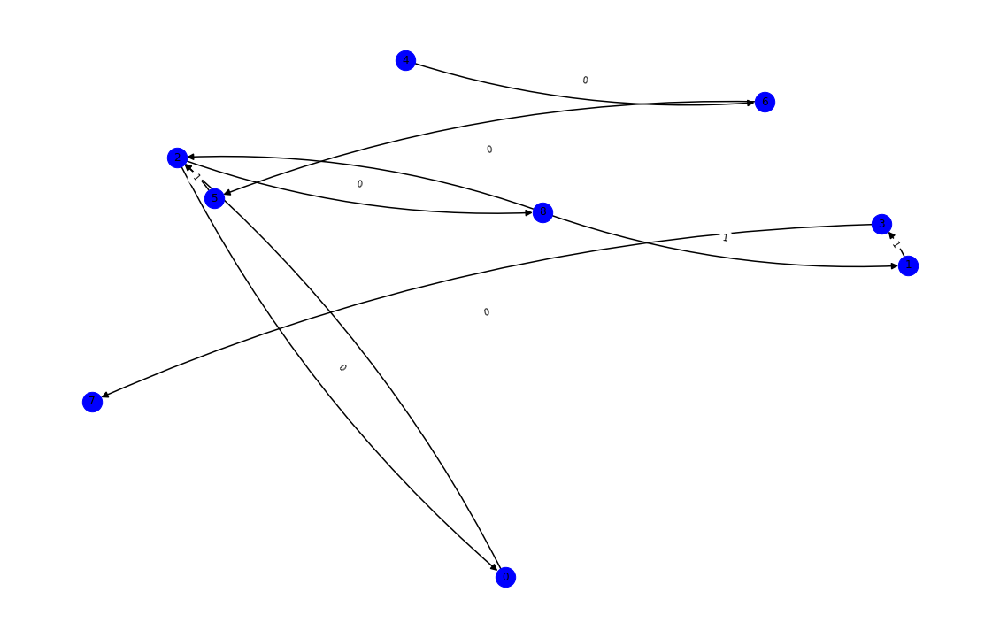

nft-id 72750
mark_dict {'0x78f4f4f49d3b915385e08bb7e524982ab4bf7f8a': 0, '0xd5c1f6ad3bc64dee0b13b31027719789e638b18e': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x4682f2465436e97f25acf00484ae40eb60eb9a67': 4, '0x8d943ff2378ad2ea375de3d017097c4612c2a0ce': 5, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 6, '0x4a0054073fa7fdfcaad775ddfaba950ca5357d5f': 7, '0x0aff497bd016000185b1c8302fa98a88ff4a4178': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


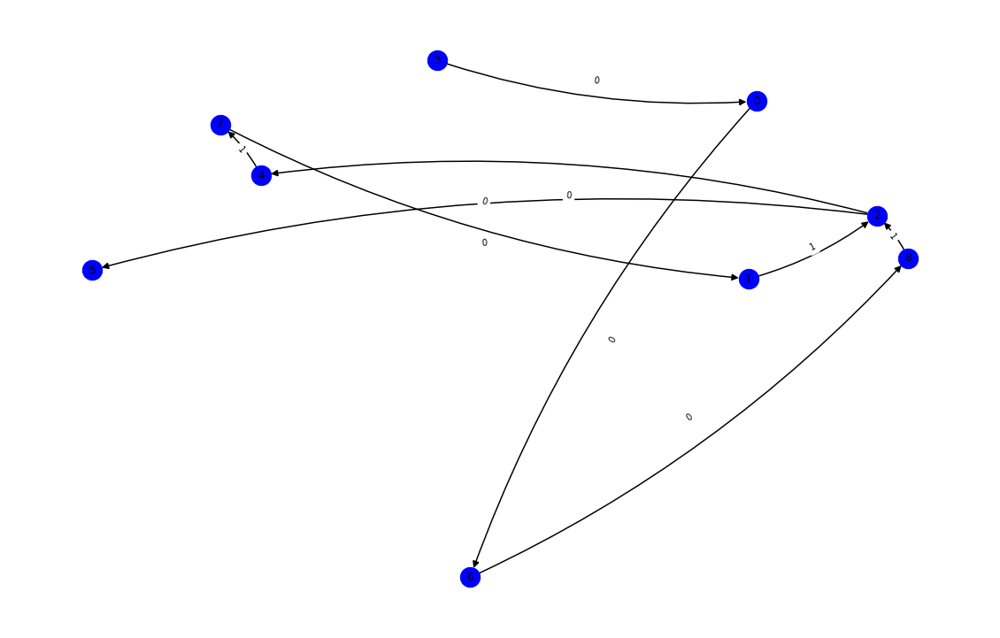

nft-id 95144
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 1, '0xa56fb980926fd1b5f95fe5ec41c24f1eed742c77': 2, '0x0000000000000000000000000000000000000000': 3, '0x882f629d6d6bb6b49d25be72d1397a8fc92851e0': 4, '0x869dd519c431732155b93bb1a8689f51e40c6a2d': 5, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 6, '0x33995fd4965765da3acbafdf0791b538a1d23ce0': 7, '0x4db576e5764505b5294ade5880ee6b85bc9705a2': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


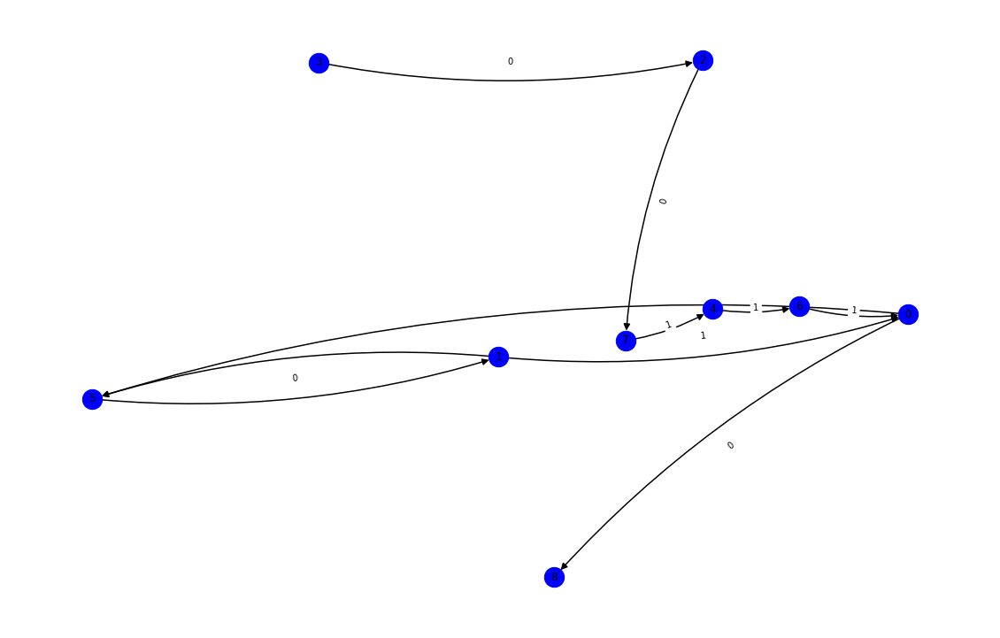

nft-id 77519
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xcfcd7bbc367443693f86b70724d76a84e9ee0c49': 1, '0x0000000000000000000000000000000000000000': 2, '0x61acd9fb7fae3c8026b868cbd4e00c2bd22908b4': 3, '0xfa1690f2778f1f78c24da9f33eb63c8965293e84': 4, '0x869dd519c431732155b93bb1a8689f51e40c6a2d': 5, '0x153dbe2ff472c5cdcb6cb672d08c927f6aa479e5': 6, '0x0fe35cb5c7d2dfd63eb4eb9e02a6f20117a3303b': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


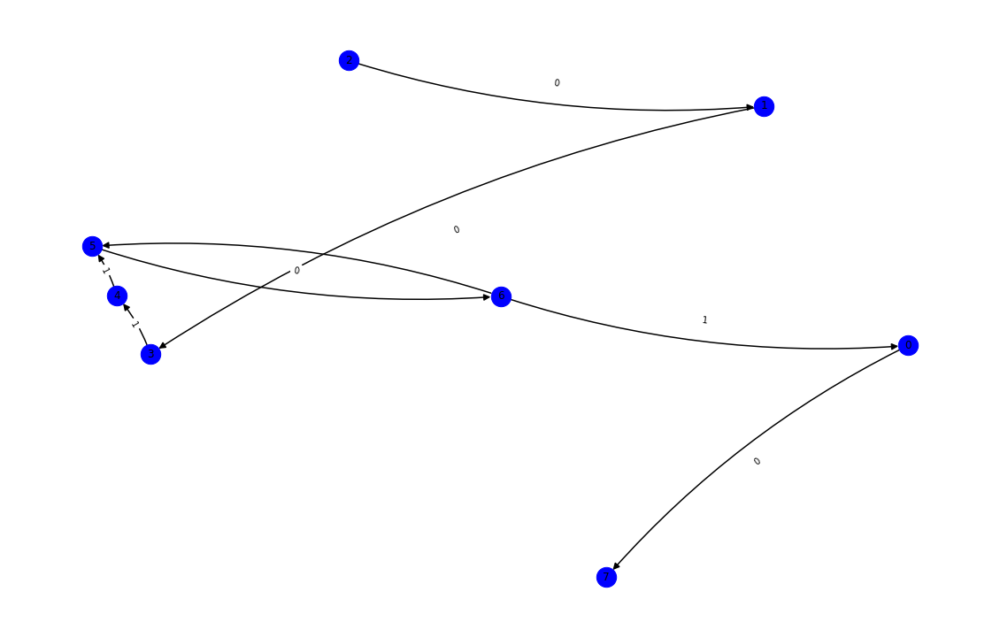

nft-id 64034
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xbe7eff74d54c24bc3140c5f2ac0ecd6426a98dbb': 1, '0x7eb413211a9de1cd2fe8b8bb6055636c43f7d206': 2, '0x0000000000000000000000000000000000000000': 3, '0xf598943b991ad04b41f07ae88bcdff42cfb8c487': 4, '0x316be64460045209551c5c0280e61a6c6289396e': 5, '0x4003b190f948ebb886c7672e7c87d3887004b557': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


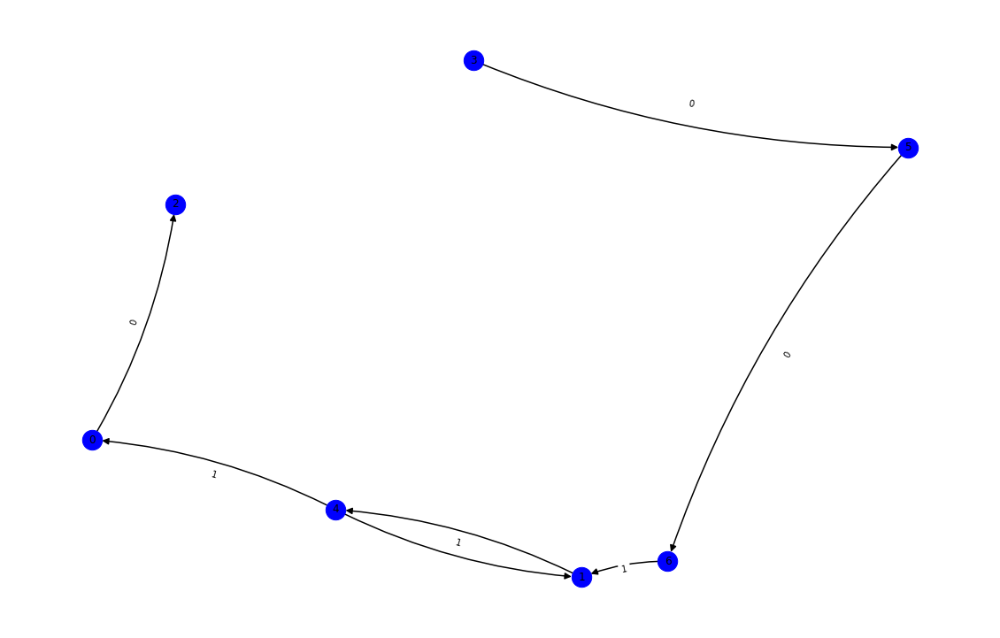

nft-id 45832
mark_dict {'0x18d82cc691754ea6db4018004de61fce8a63f392': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x4ce860b08a21a8d7e885c291358318b51b710930': 2, '0xa1da9ed80b04d8ebe98a1de47ef343088bf02d92': 3, '0x08b4b79a44364f7d8a9bf737c704bd59ebccfb27': 4, '0x0000000000000000000000000000000000000000': 5, '0x68cc45c405547e93dda77d6e1b62994119d4d04e': 6, '0xb0cfcd7faa9ec34f794420549bb92f7d9bec16c7': 7, '0x1970fc1a0aaa68ff845174510bcf311dc87dd1de': 8, '0x743cd810672d78f7a5855631f38291db755b5fad': 9, '0x82dcba7a8bf3aa462040038ecb3d5d90901676e8': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


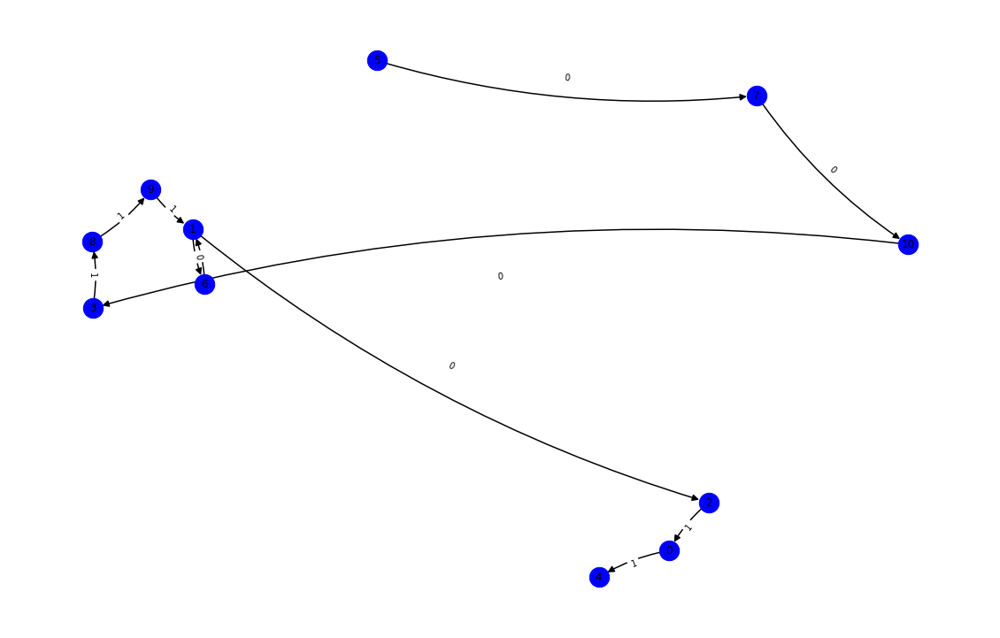

nft-id 74230
mark_dict {'0xdb6c1bb58b54705523aeec456d6aca1b3c8e39ef': 0, '0x41a61e691d7e62446e4ca9086f34a6859396fc24': 1, '0xdefbb4e3ac96da6aaade47621ac5cb7dbb94af79': 2, '0x83de6e5577978203dd1738cd563c492201bd98ee': 3, '0x0000000000000000000000000000000000000000': 4, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 5, '0xda6a11f8983bba1c9c8db95de8f3f149847de65d': 6, '0x93f4de6e91560ba92c6de82483e1705028747b96': 7, '0xa211f47a0cc694b1ab3d84c1a50454bc0e43d41f': 8, '0x69135f0e2537dfe0c00cefb9f972b018cddedbb9': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


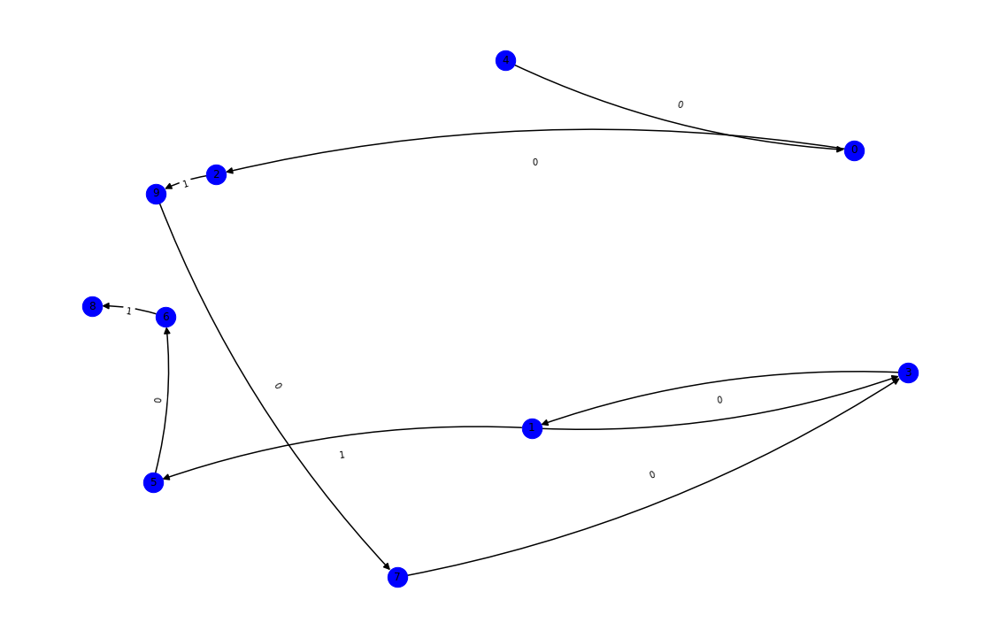

nft-id 59072
mark_dict {'0x1cdc356847000393ea277aaac72b40fc5d555bb8': 0, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 1, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x4e626e64b44a9f299da9cb006320297f870a8397': 5, '0x9e69b59b8d2a094cb1117f92ff7dcf51ed467b41': 6, '0x2658d1ce0939f84ef71878a2f1c4f2ad24391cf3': 7, '0x82bbcac5a8b81368a4a96f0265cb40e46020a1e1': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


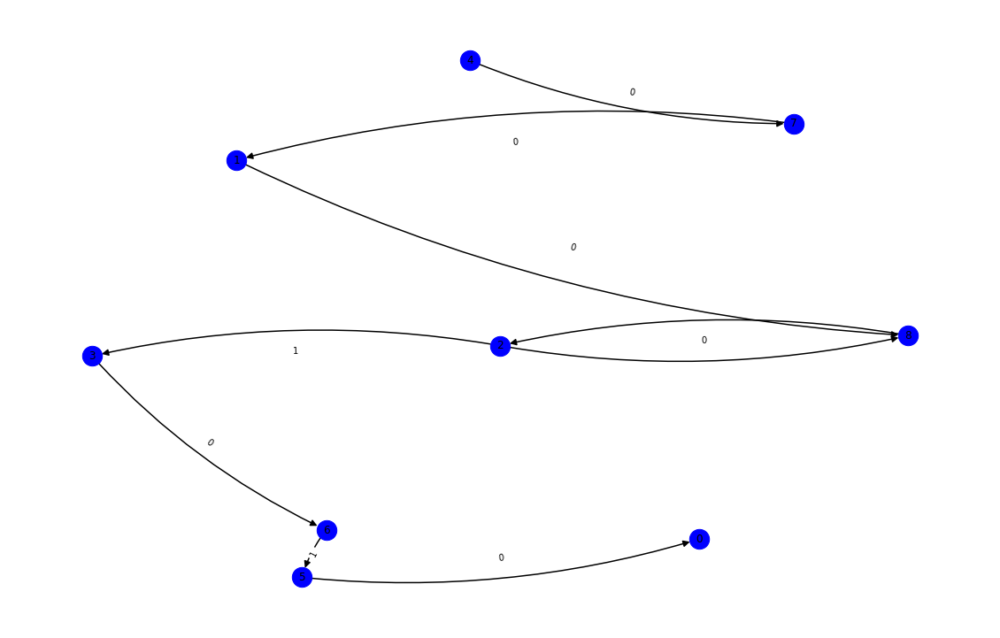

nft-id 23652
mark_dict {'0x4374e9fee443cbef046d815020b79f1b258f3693': 0, '0x1724599d5413ef15e7e199eae58803abf0d2b821': 1, '0x5b5bd6a6c26ffeca8f47abadc4197168305d9243': 2, '0x0000000000000000000000000000000000000000': 3, '0xef47d0d9690d608329a4b34a538c65ae5e2caff5': 4, '0x73d30ba3dc4ffd17c28cc2d75d12e50df98f29cf': 5, '0x9250f8149067fc068189f95e92f0eea9673f62d0': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


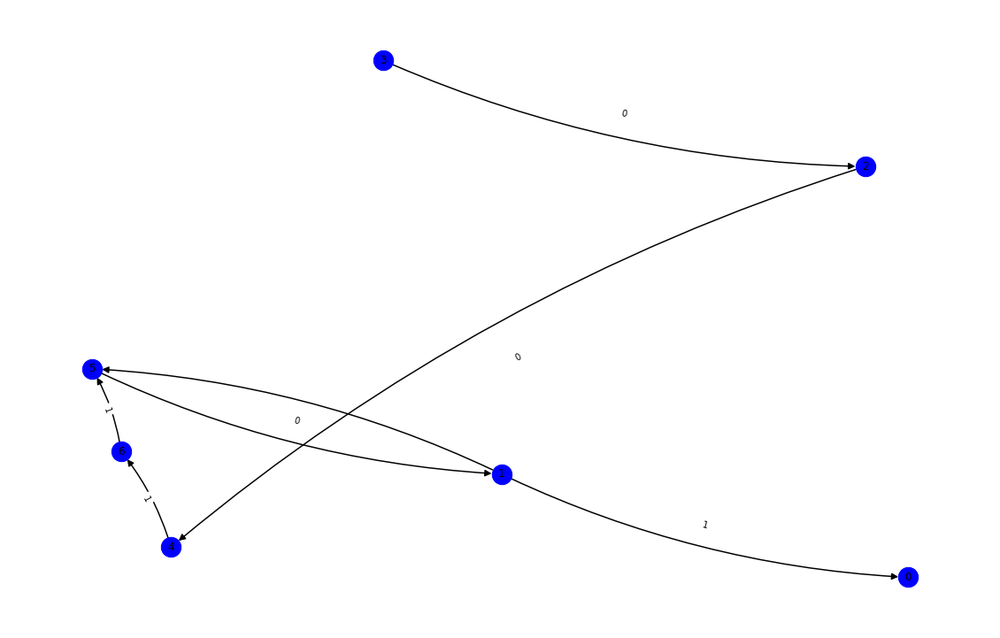

nft-id 50784
mark_dict {'0xd7b2879c8922cd704e41e8cc1f18f6994d6b7c36': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 2, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 3, '0x32e242142b67101234896061ae64c8ee7ac3d443': 4, '0x2817d099e7c4284ed5d23af6271e9256c529bd49': 5, '0x0000000000000000000000000000000000000000': 6, '0x76daf1c2f327c81fe4d32f3231d27b4a4b9eae2c': 7, '0xcf83f2897f298e5b687c8a5797fc0add698422aa': 8, '0x743cd810672d78f7a5855631f38291db755b5fad': 9, '0x8f5805067c8c9f95452b07f6e9967197ef59a57f': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


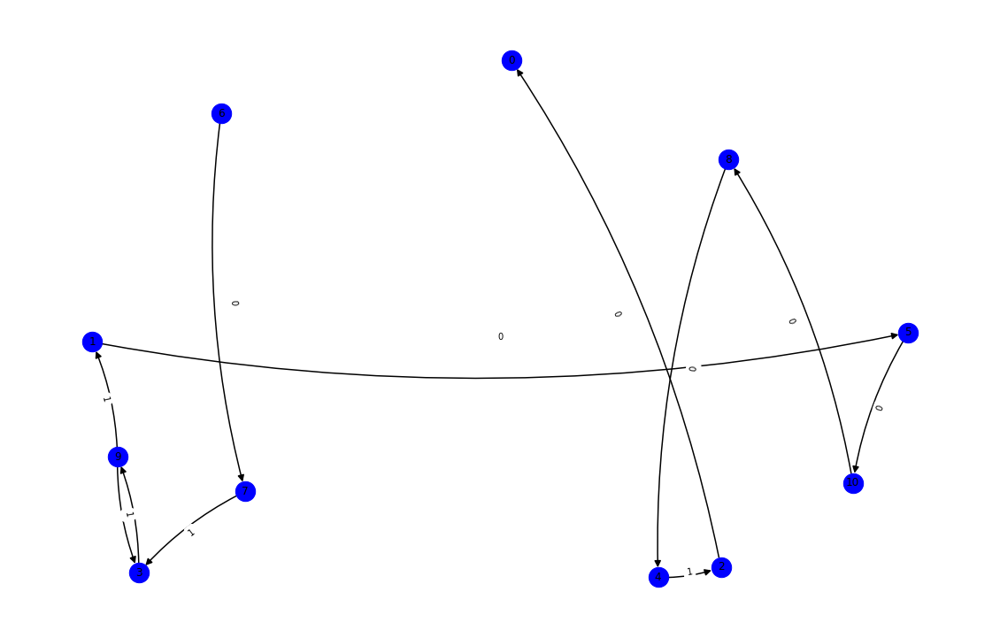

nft-id 90584
mark_dict {'0x14ea6e4fd5501dacff2d793f17ef3753d4765567': 0, '0xac422d5da545bc914d59311e0948bc9d21d9af7a': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x49042d937a144e5b8ee0858271d444875849ce35': 3, '0x0000000000000000000000000000000000000000': 4, '0x6f5caa2ae52432d2c680665a5cc68ee411790386': 5, '0x0359a50c85b6d0ad57a5b1f375f35f59334963ec': 6, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 7, '0x73d30ba3dc4ffd17c28cc2d75d12e50df98f29cf': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


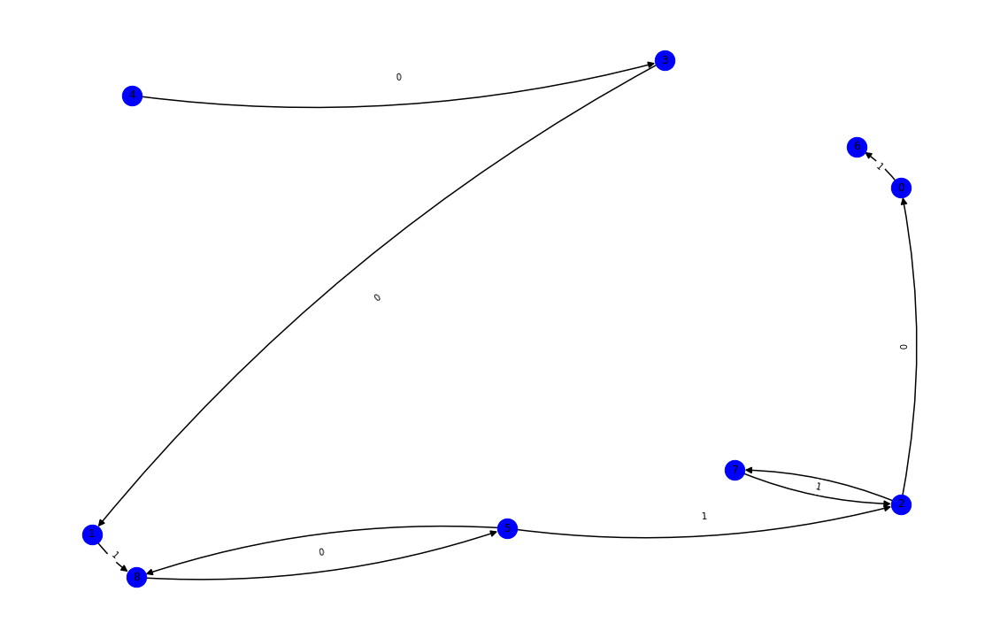

nft-id 79188
mark_dict {'0x6c7fa423bf314f0ac9fe74afd50e82a5d41fd455': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x794a0d6815072dedfb80fc849f56e33edea30755': 3, '0xae1fb7491dc893f864bd3b61643a6bf1ab6d750b': 4, '0x632fbbbd8fe08be591d5fc6360d18c5fc3944cbe': 5, '0x09adfab2635dcb681fada41ceb0bfa6f52effd97': 6, '0x39c4cfb864e8936f9fc221fe5354543020d6fb7f': 7, '0x11a04750983e4a0a6c5df5c0fa349890a08f9001': 8, '0x5fb6364f6feb538a35fe3b0d2a6770ea30afd8aa': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


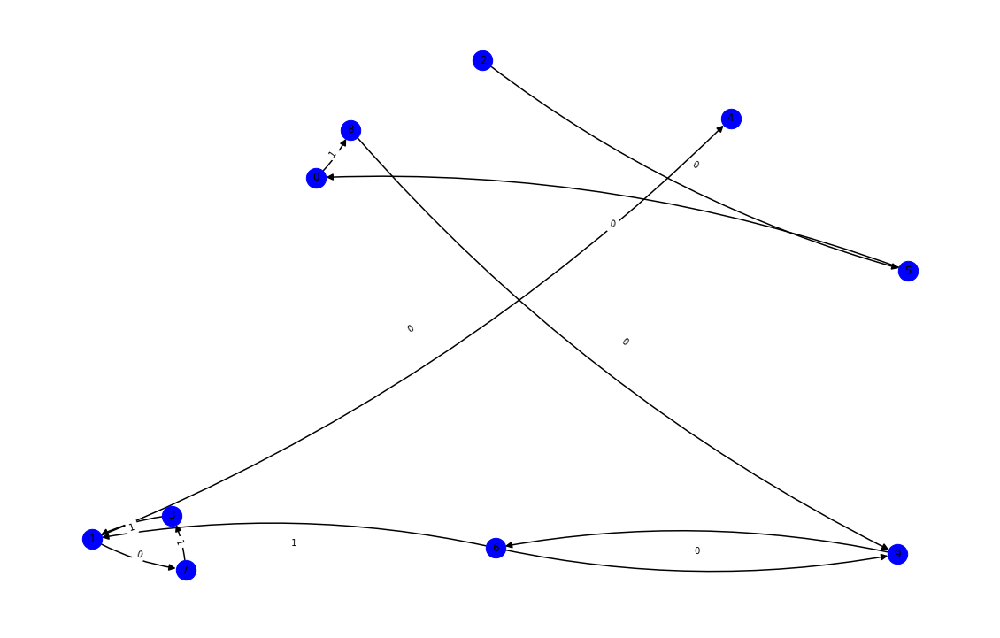

nft-id 86260
mark_dict {'0xcec0226557b7fa4842a37375fd75fa33882c1783': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x4ce860b08a21a8d7e885c291358318b51b710930': 2, '0xdad19177128fc63b9de5aac7c9afb08ede8830dd': 3, '0x3ccf0284759fcf6f35378423c5885aceb40db417': 4, '0x9d58434b4d6327fe26abae7c3cdda5626dd44610': 5, '0x74456cf397975601d7924ee113bda64f9024efab': 6, '0x3311d3beb106bc81b1d21a7d23dba2c1a9bee3b0': 7, '0x9c5bfb6cad5b0b98ad6ae5fb754495d6037addbc': 8, '0x0000000000000000000000000000000000000000': 9, '0x3470151d1c87597623e53fae98e4bc585e6cc709': 10, '0xbd9fc49ff141f40d0260f87526953d517797128c': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


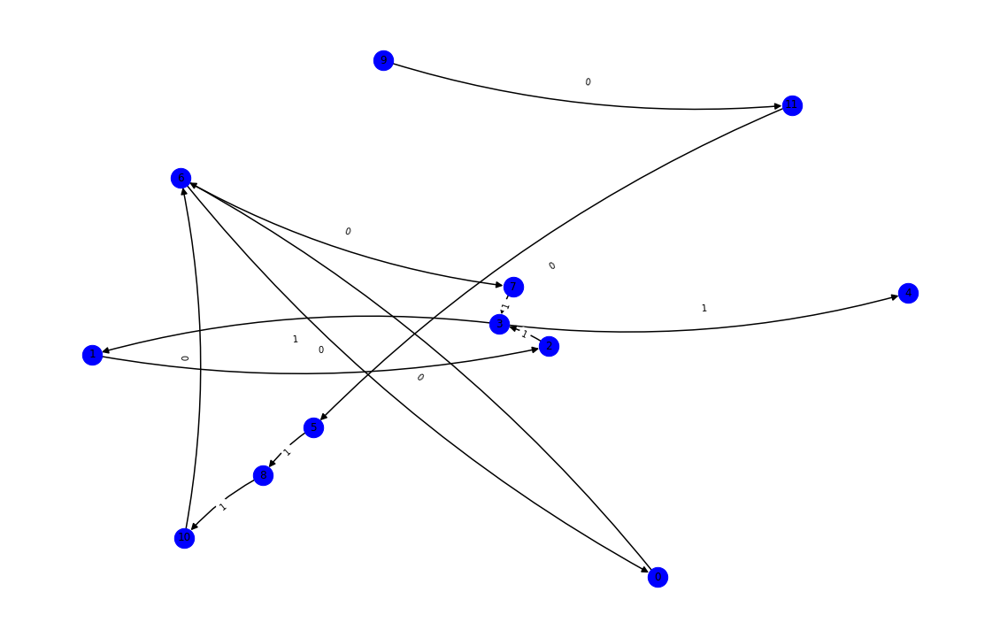

nft-id 14266
mark_dict {'0x5edb7dc2e3fc7f4f42c0e4283dcb067252d89291': 0, '0x18d82cc691754ea6db4018004de61fce8a63f392': 1, '0x0000000000000000000000000000000000000000': 2, '0x8631038ae4c826d735ab962319e2898ec98a9a96': 3, '0xa70b4d042327d7da97c6db480be0549f4a4642a0': 4, '0x98adf4982e0059aae0ec70e1e742a7f3476e63a0': 5, '0x3ec4274cf45e616e8eed2ed0d1f83d10dc88e84f': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


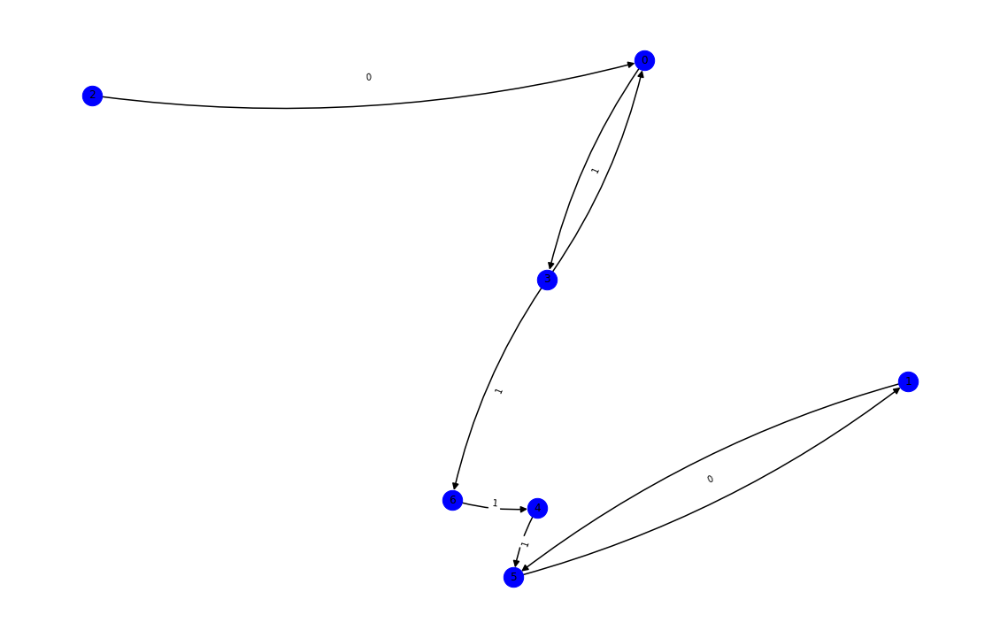

nft-id 20399
mark_dict {'0x072187c5685fdfac029394eff1b37b87c01f5518': 0, '0x0000000000000000000000000000000000000000': 1, '0x4445ff9c33e01ef7afb7e64b3087fedf8169aa13': 2, '0x09adfab2635dcb681fada41ceb0bfa6f52effd97': 3, '0x089f98432222a5d8c52e999ed24a4b36c5a78e71': 4, '0xf15eeb4704d710264ce8c1373c09ed30c79af355': 5}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


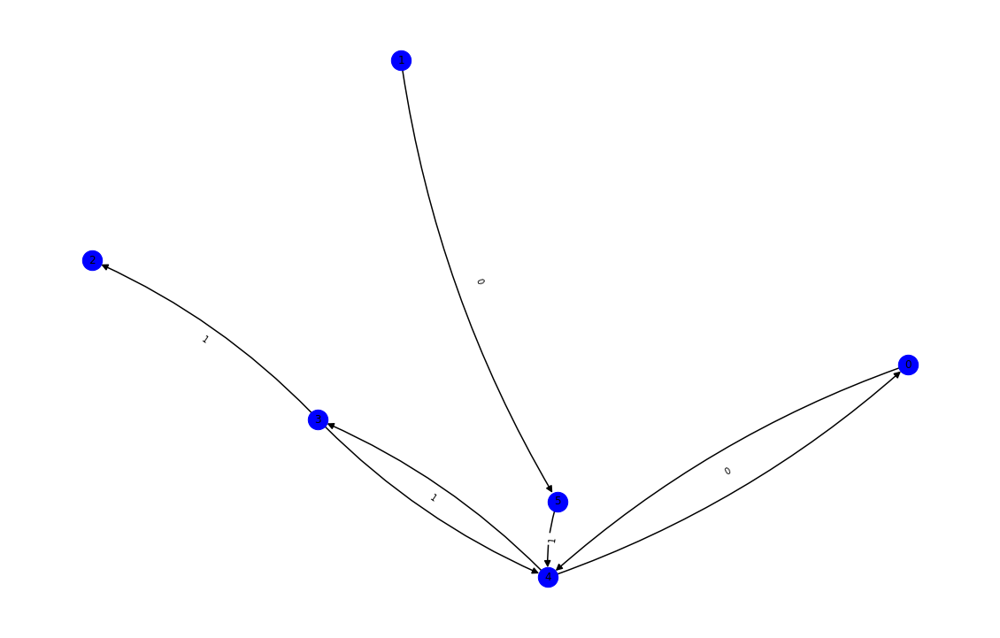

nft-id 73666
mark_dict {'0x700d8a76b37f672a06ab89fe1ec95acfba799f1c': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x1dad1d2c851dc9a0622dbb0876f12dab68edc0c9': 2, '0x581eeec38be03a9b14493bb486dfabfe2e49c59a': 3, '0x0000000000000000000000000000000000000000': 4, '0x7dfe058985dccefae12461d37cf7e935018be800': 5, '0xf572082f98faa58ffeaf748ada4a2b0744278fa0': 6, '0x6d49db893e26417bc65e391360345c135b79b492': 7, '0xd5896413d415c8554526f91bf0b2aa0c1fa65de0': 8, '0xa216d16c20903274006f73061a7f0d9a048dffe1': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


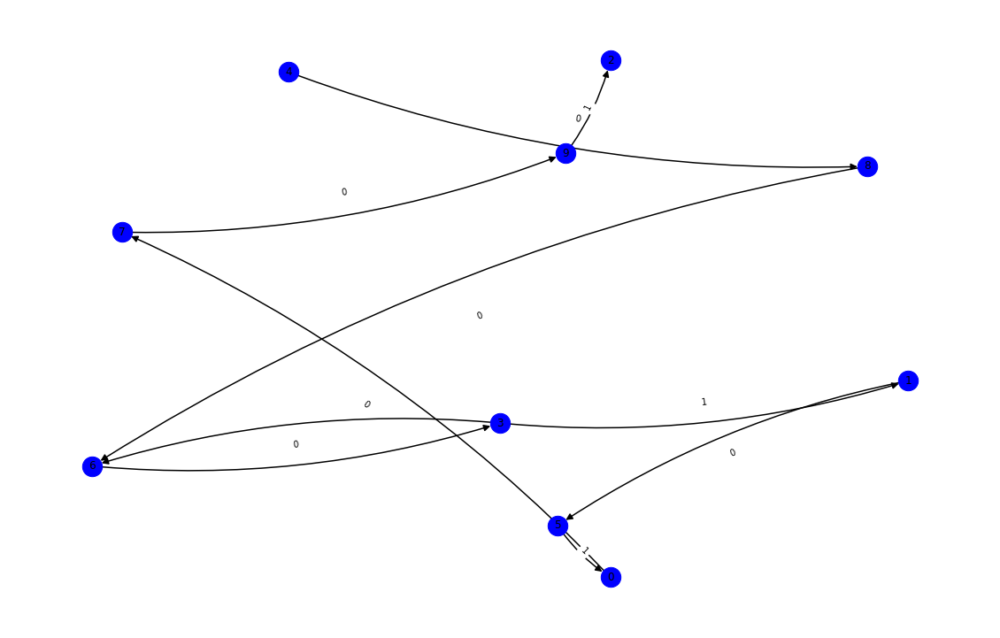

nft-id 54766
mark_dict {'0x002a99690ab1989b7971db28cd4a7673e1e6f495': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x864d2437ed789ccec3107727cc0cf65b0cd0a3b9': 2, '0x0000000000000000000000000000000000000000': 3, '0x2443047e6ac82fe65035e36e971316d981492857': 4, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 5, '0x3f004a6ab941dca5077375124b47947d01ec4396': 6, '0x743cd810672d78f7a5855631f38291db755b5fad': 7, '0xcdd922322ffdb2259f8615bfe32efcdbe7958b45': 8, '0x2f56e2a35305b8dbf1466182afb2cf4f457e65ec': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


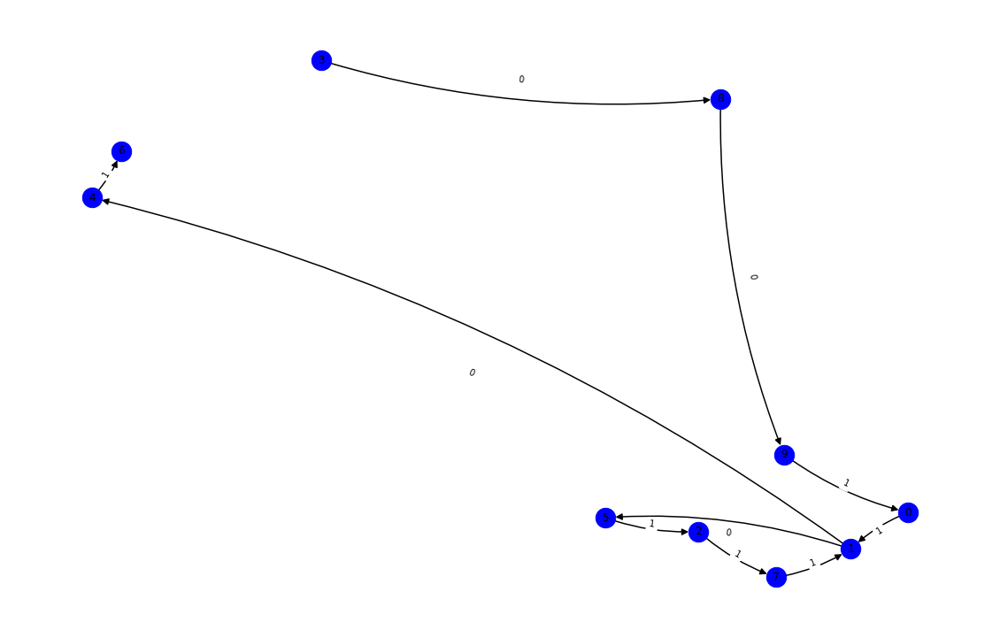

nft-id 72780
mark_dict {'0x06fdaa3045904d500b883fed2fa64694ed9e8aa2': 0, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x2443047e6ac82fe65035e36e971316d981492857': 4, '0x29b318c8dd1600ed546da34785a67c6dba323ac4': 5, '0xc03700236050bf1a7964eaf84aa988c3165f6399': 6, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 7, '0x8b17e8b3f8315e73986f0c8370cea4f3a974a532': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


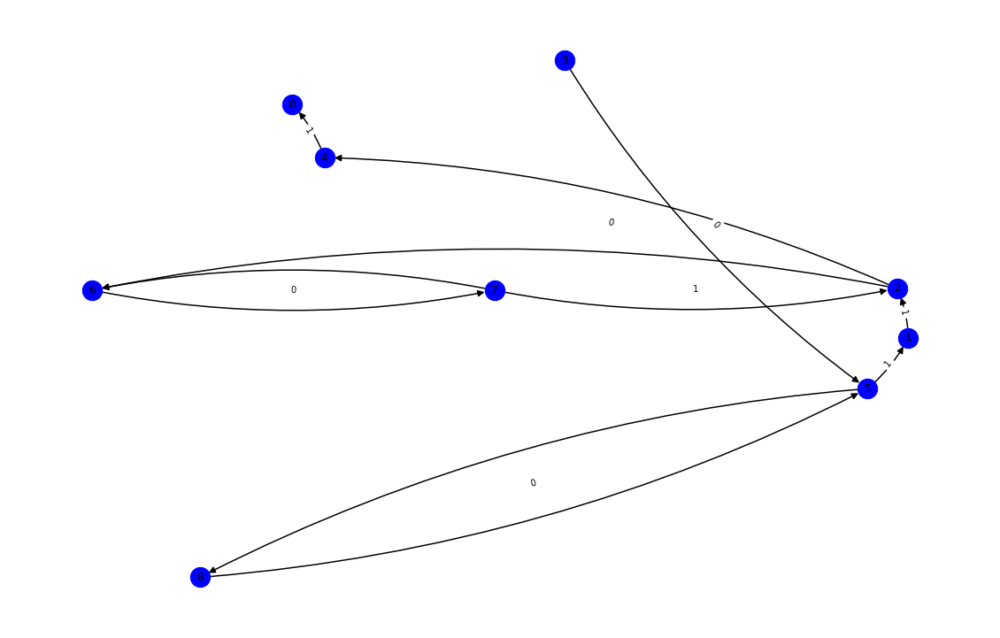

nft-id 45325
mark_dict {'0x0186badb53ef517927afb84634c18e0d36f88b39': 0, '0xeb83e695adcac2e83f290d2d2815fc58e6491d7a': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xe5dfedcaadf4df48f2fcc56663b89ed0ad73da3e': 3, '0x0000000000000000000000000000000000000000': 4, '0x5f7fadb3b8346e95583368942ae4f830d887e158': 5, '0x4003b190f948ebb886c7672e7c87d3887004b557': 6, '0x2768c43a919b7d017dfb3bb171145a097b4dd01a': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


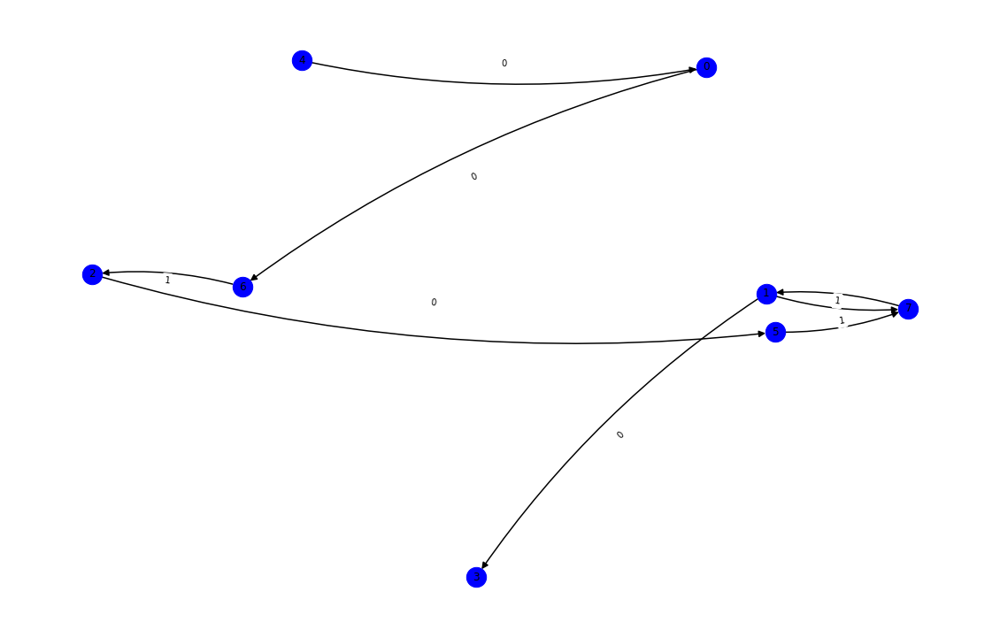

nft-id 84909
mark_dict {'0x828cebb8cc44cb9047f0f057f9603c7348553d84': 0, '0x14b75c9157493086378e7122394cffe2d689e8ec': 1, '0xe0ac6bda8ea9f9be3b0cdc91329184ba48f1386d': 2, '0x8dde1e284ede267607ee13c6a44adaa068ce7d68': 3, '0x894f392ce067e73e128284056e2f3d4ab7d652b3': 4, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 5, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 6, '0x17374b2b0633b8227033fdb78912fc9cdd479b20': 7, '0xa7d21048c02c83ebe67c0d39c0fc6a82eadaa88d': 8, '0x0000000000000000000000000000000000000000': 9, '0x60577490f99712525e4a36d559256c6f99c788f3': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


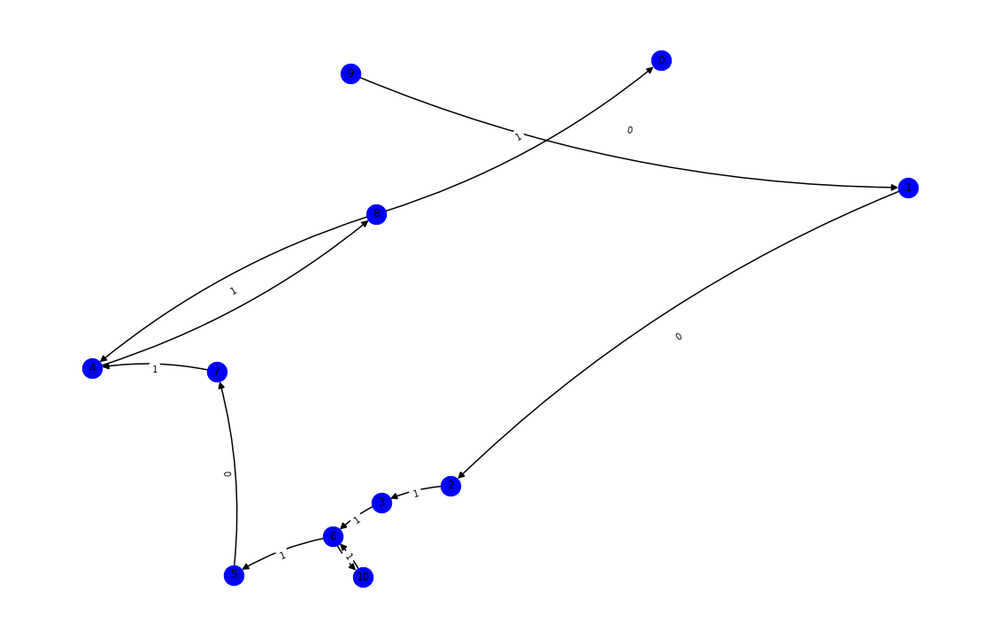

nft-id 80062
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x1e973ea417b0dae4d0a8b6e8ee823988a4825673': 1, '0x00e5753e5e8a5c1f3be40392495446477edac73c': 2, '0xc9bb325af49cf65511360984b54fd0fe02ba8905': 3, '0x9a5234621d655743ec4d5b00e1d0694d7a22adc5': 4, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 5, '0x17374b2b0633b8227033fdb78912fc9cdd479b20': 6, '0xa91c2ceb9d2e343bfd5a12d5b3b3794346a8c473': 7, '0xac671b03ce1c14018f99da62802e79c44e93c8c5': 8, '0x0000000000000000000000000000000000000000': 9, '0x0f4d746ce01a98f948b8bf6ac12ed37c2aad8780': 10, '0x2443047e6ac82fe65035e36e971316d981492857': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


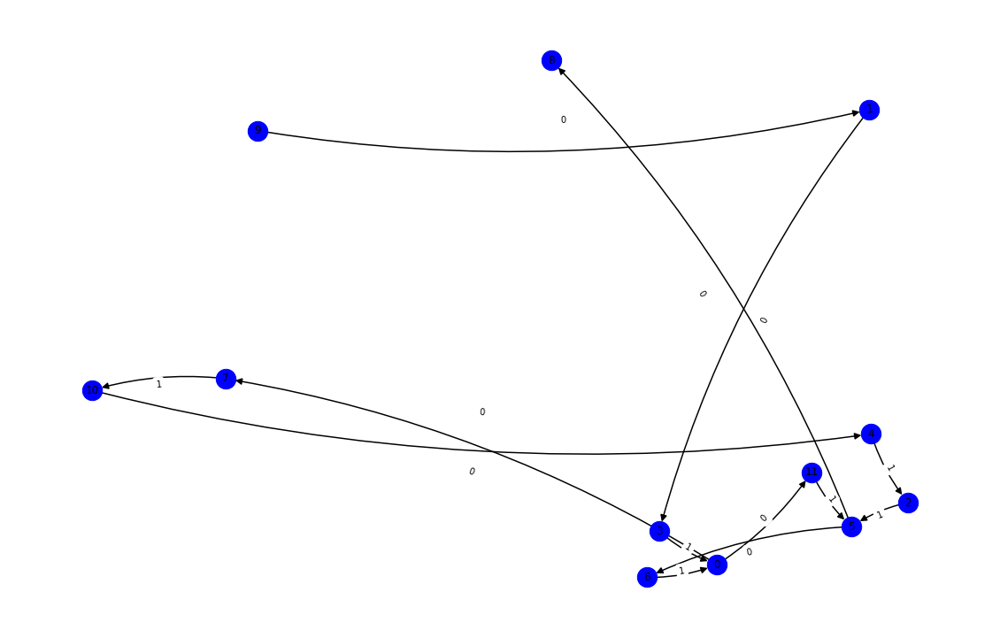

nft-id 76857
mark_dict {'0xb2a354241ba3e47c75cb0eb846a80c081c6b79fc': 0, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 1, '0x09e3b59d1825c1b439a20256711e44df65b52deb': 2, '0x17374b2b0633b8227033fdb78912fc9cdd479b20': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x60256530d074465406df460b6f38424ab5df6bed': 5, '0x0000000000000000000000000000000000000000': 6, '0x2443047e6ac82fe65035e36e971316d981492857': 7, '0x60577490f99712525e4a36d559256c6f99c788f3': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


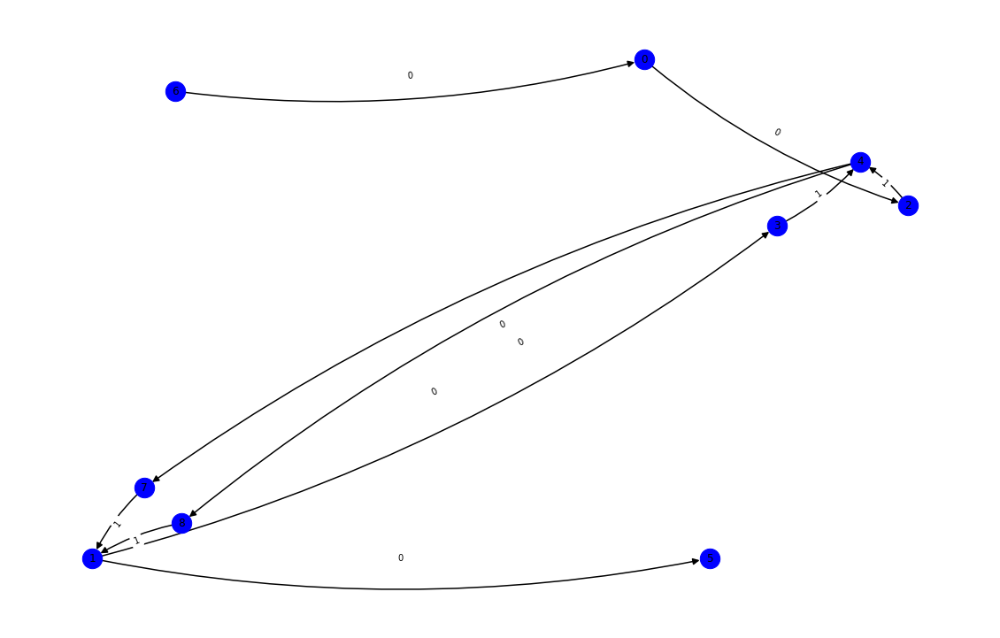

nft-id 70477
mark_dict {'0x37a9498b5e20634aeb15759ff9fb243111aa6ea4': 0, '0x88febd0a4ab094ef59954cb229235316a2d15952': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xb92b697fd20b5edae0e0016cdc001afe3ccdf2da': 3, '0xf93ed353400d140f2f0775430ec8f24bf722732d': 4, '0x408f12a290869b99164256351a75c6aeee1fe1f8': 5, '0x5f7fadb3b8346e95583368942ae4f830d887e158': 6, '0x0000000000000000000000000000000000000000': 7, '0x473373949ffdd88bb3e6e48dff81ae2fa0858a9d': 8, '0xf4fb9fa23edb32215e5284cf7dbfdb5607d51a5b': 9, '0xea489f1ba61bf995ec1d5f08a94cf1d47fe28dd0': 10, '0x743cd810672d78f7a5855631f38291db755b5fad': 11, '0x1de1d416c22bcb58acc4fe4ab93a16bda6c468ac': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


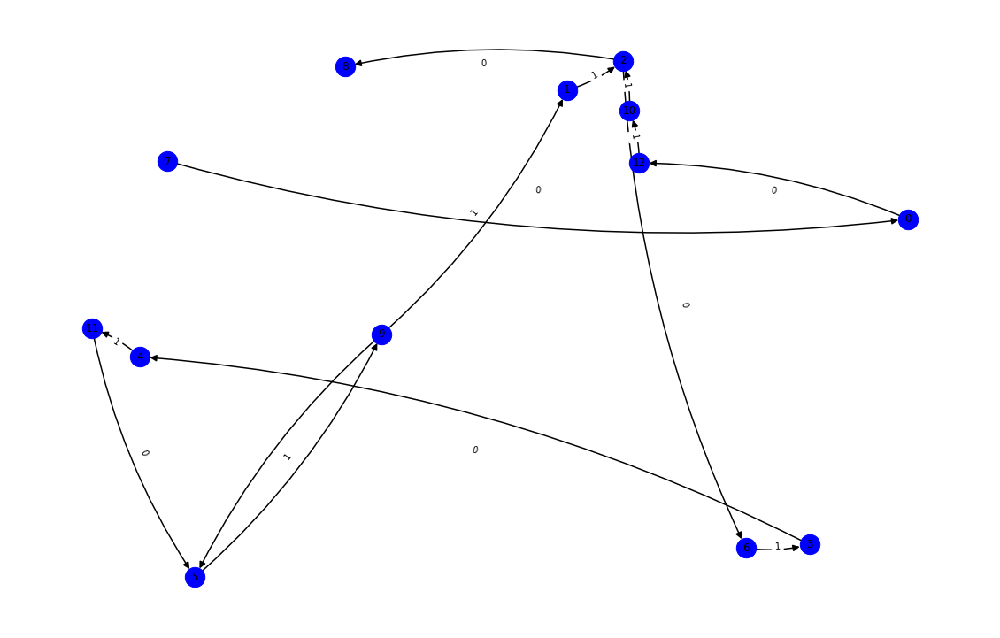

nft-id 57214
mark_dict {'0x31837aaf36961274a04b915697fdfca1af31a0c7': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xc348f4b6dbf1b156d802810db2f6d59f36c837bf': 2, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 3, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 4, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 5, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 6, '0x17374b2b0633b8227033fdb78912fc9cdd479b20': 7, '0x2af4b707e1dce8fc345f38cfeeaa2421e54976d5': 8, '0x0000000000000000000000000000000000000000': 9, '0x1c42694bc7d252cccdd6c362d2f737aefb9bd76e': 10, '0xcfc50541c3deaf725ce738ef87ace2ad778ba0c5': 11, '0x2443047e6ac82fe65035e36e971316d981492857': 12, '0x75f4cf79b563bb629c227fd95b989126be6d5fd6': 13, '0x0000000050fd1220ecf21d84687ebad194fd537f': 14, '0x6141ee2a0f53255c79b629e2830b9ab2617c76a0': 15, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 16}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


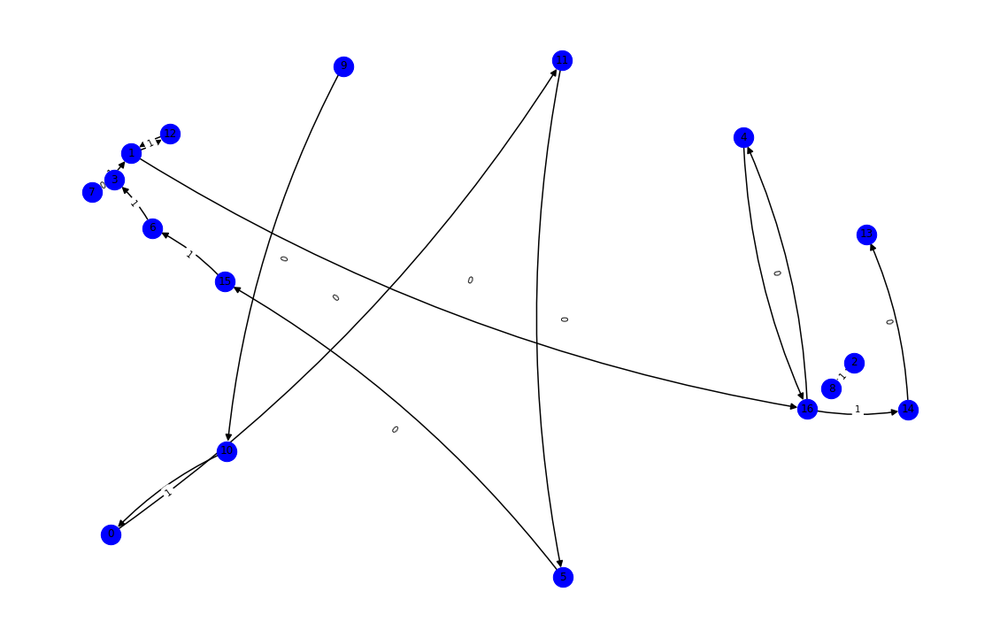

nft-id 67841
mark_dict {'0x04a2df441fb445851ebd378fd221a2a150fdcd7a': 0, '0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 1, '0x18d82cc691754ea6db4018004de61fce8a63f392': 2, '0x0000000000000000000000000000000000000000': 3, '0x57b9d8450d5cb3526fcce8ada57eb5627ca1f267': 4, '0xa88366d045f87e115aada58b194ead9c84f19c1a': 5, '0x24c55165fe8bfad6c201e98630f22c44e26a4182': 6, '0x8c77db3c5fc01fc1a99772c5dfaa47462926a482': 7, '0xc8328d0a482d133718346946be7a0d7058011375': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


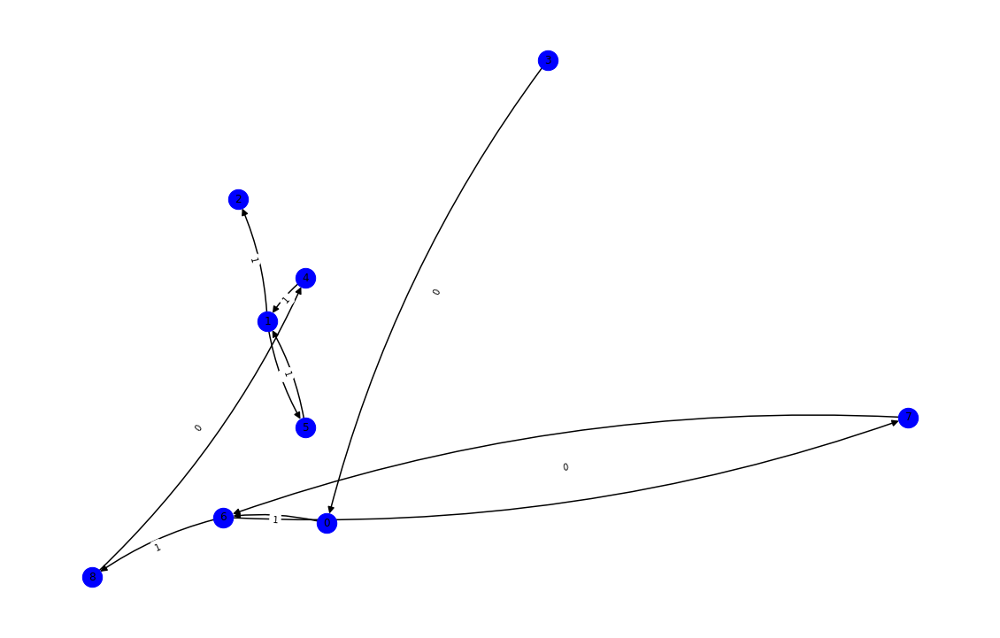

nft-id 59895
mark_dict {'0x483b613641720bdd7848f4d90a01883141b753db': 0, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x17b2aab7f0d86c1d4a0f46e1bdfd7f2edcfb12b5': 3, '0x14d702bd1ae7a48df5d33c7f873aa353bbc7446d': 4, '0xd387a6e4e84a6c86bd90c158c6028a58cc8ac459': 5, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 6, '0xc14480bd7bb6d36377c75286b80452654f5b7a79': 7, '0x0000000000000000000000000000000000000000': 8, '0xcc76cedb2f53bea91b0086f059451c33efa2291a': 9, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


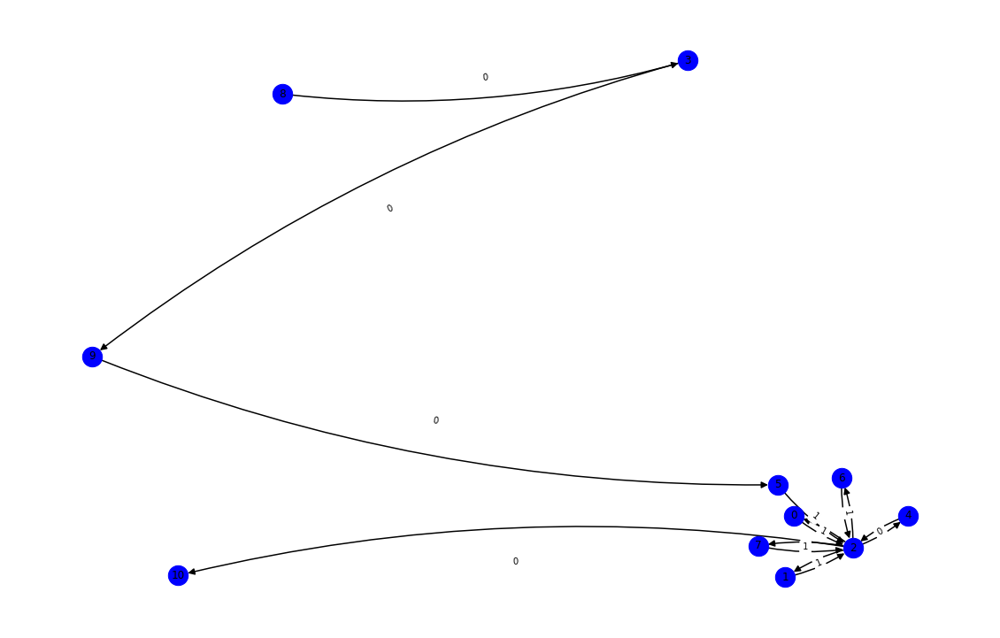

nft-id 66381
mark_dict {'0x4679cf0154768e2597bbcfe3f37031c8ff56e8c0': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xcfa6a349a1e9c5f3bf109d5f00232f3855004567': 2, '0x915d113e857c02e3e21515dcfd43d5a5f2b4569d': 3, '0x0000000000000000000000000000000000000000': 4, '0x97fd49e4d3ba5770ad3993926dbd7e9fcfb71587': 5, '0xe0ef70fb707484e60500f0b2653b928128ac0a1b': 6, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


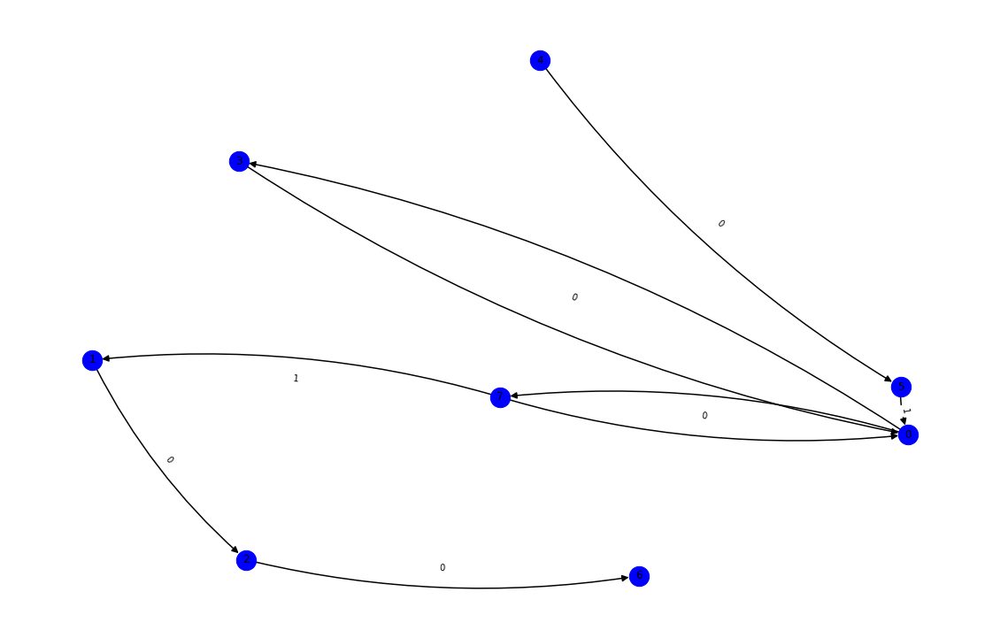

nft-id 69387
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xd99697b4ec63548e3fa3eab54a3c55535747a4ff': 1, '0x19bd36d93bb62ec73cc607639a0ef8fcec19e128': 2, '0x113933056d16a2644565acdff6c99f4798b64b7f': 3, '0x6948d7b5980e79fb949c862594a2477ca089974f': 4, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 5, '0x0000000000000000000000000000000000000000': 6, '0x7eabcfa5307172aaa0483142c2bf15a05b94db6d': 7, '0x2443047e6ac82fe65035e36e971316d981492857': 8, '0x9f6fb4410dacc624949404dbdf7d59c78100eac2': 9, '0xe68bdf2644528893aa689e675cbef545526d203e': 10, '0x6793d79202dade972de66459b7f9928ab7ef3a26': 11, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 12, '0x523ff3e142f822e2158f3802d9bcb6f28977441e': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


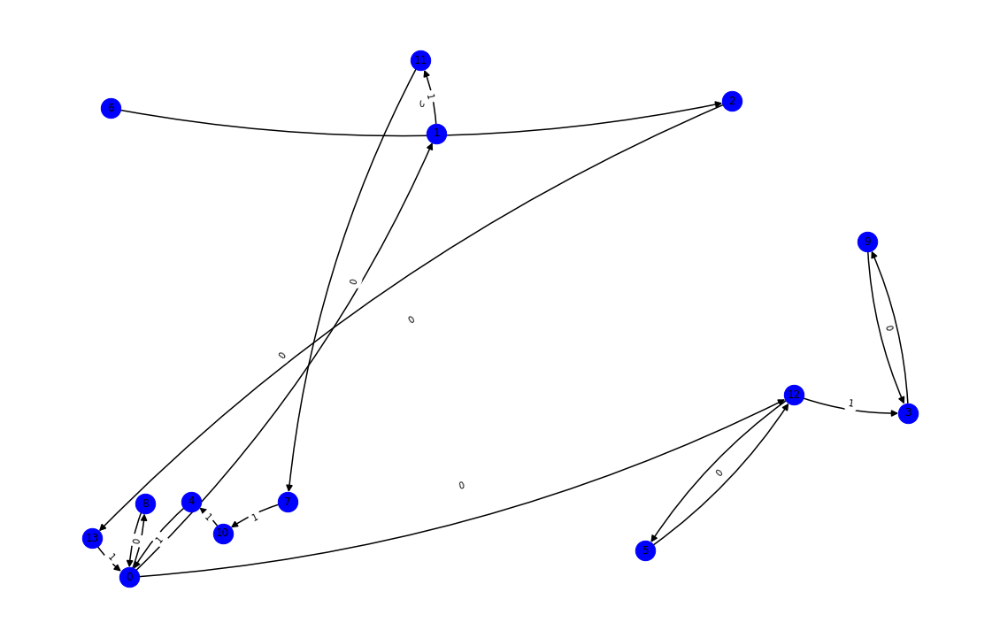

nft-id 72236
mark_dict {'0x44257e7b07a2fdbcf67b00be0b39d130f0c90020': 0, '0x310174f06a941a0251f89a9ce2f8a5bfa552f74d': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xcc642d6233727237acd57cb14c440af89f3bc87d': 3, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 4, '0x14d702bd1ae7a48df5d33c7f873aa353bbc7446d': 5, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 6, '0xcfa6a349a1e9c5f3bf109d5f00232f3855004567': 7, '0x0000000000000000000000000000000000000000': 8, '0xe0ef70fb707484e60500f0b2653b928128ac0a1b': 9, '0x616144d4437fa694f4a7874f3f979f6ccbaa61c9': 10, '0xcada0879e545d046eddc16838a69c8e6aab7d72c': 11, '0x4c660ead9d1bc5f7cc52b4df80f0010d15cf7d3f': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


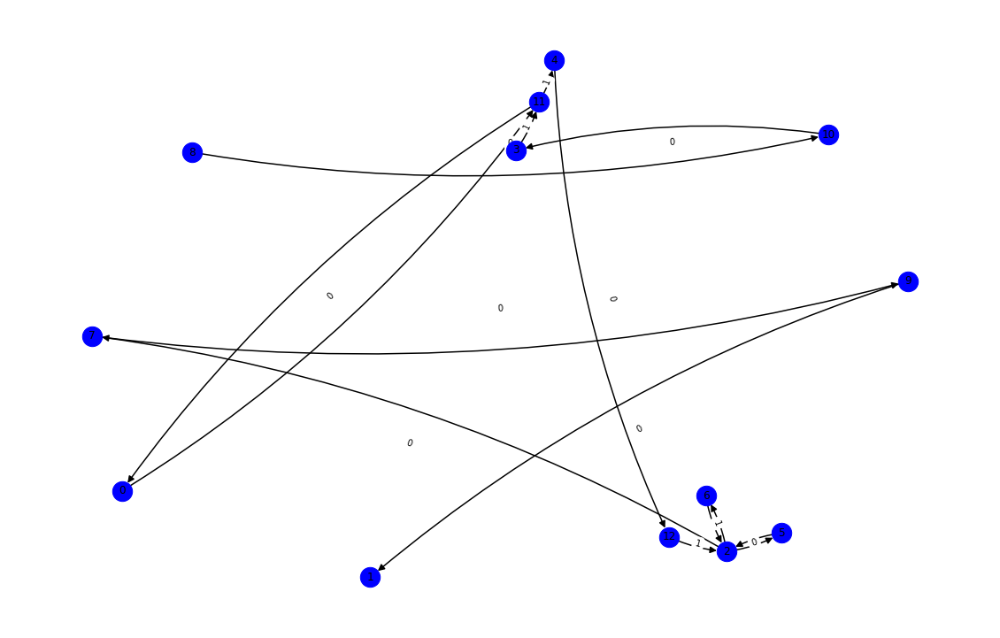

nft-id 96678
mark_dict {'0xe108f1fa7b8a3c723603e2743a1a1f80cda95de8': 0, '0x310174f06a941a0251f89a9ce2f8a5bfa552f74d': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x899cc16c88173de60f3c830d004507f8da3f975f': 3, '0xf1a1e0818dedc3248268fcce150d098204f40a01': 4, '0x54b174179ae825ed630da40b625bb3c883cd40ae': 5, '0x6ff6ce2ca68aa1d0f74cd823ecb46ffc87a14eb5': 6, '0x2b1df40ba35f760a17b38cb3ad7afa64fa1b632f': 7, '0xcfa6a349a1e9c5f3bf109d5f00232f3855004567': 8, '0x0000000000000000000000000000000000000000': 9, '0xe0ef70fb707484e60500f0b2653b928128ac0a1b': 10, '0x06ab69215b27a5304a0f4a1532c2829a108a48aa': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


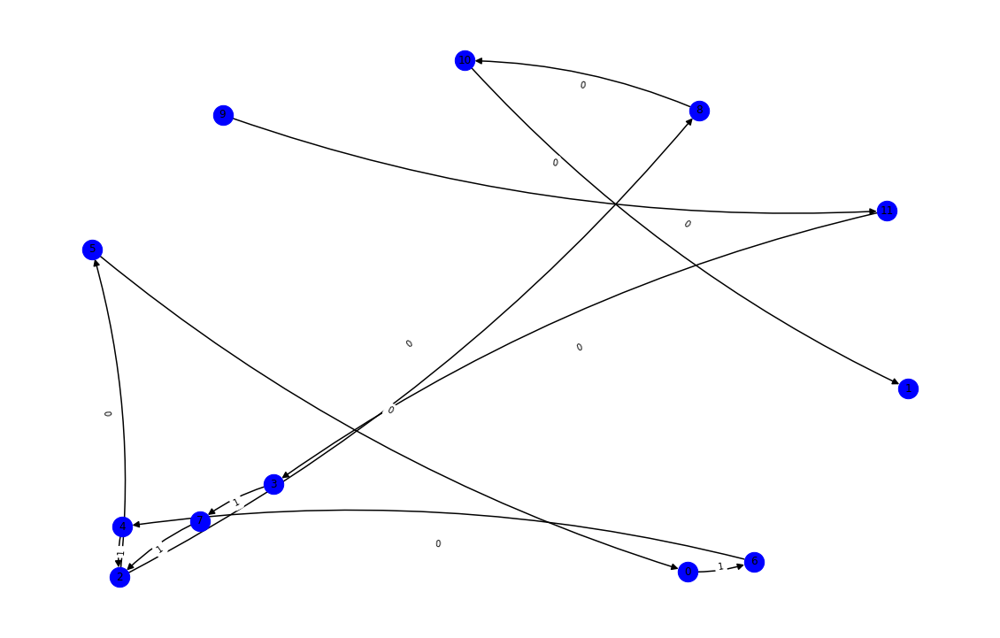

nft-id 95839
mark_dict {'0x76db1a8a8dac24b14506950ae64100a38e25f5d8': 0, '0x09644d097433c26515f01239e2cf719aee597235': 1, '0x3ce6481daa656517a271efaad67a964b1f653f18': 2, '0x67527c82cb8cc6332c0ca825aa6c10fcbfc84974': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x581eeec38be03a9b14493bb486dfabfe2e49c59a': 5, '0x0000000000000000000000000000000000000000': 6, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 7, '0x64233c37dfc82c2f7e9a4824010fc3568bac7e76': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


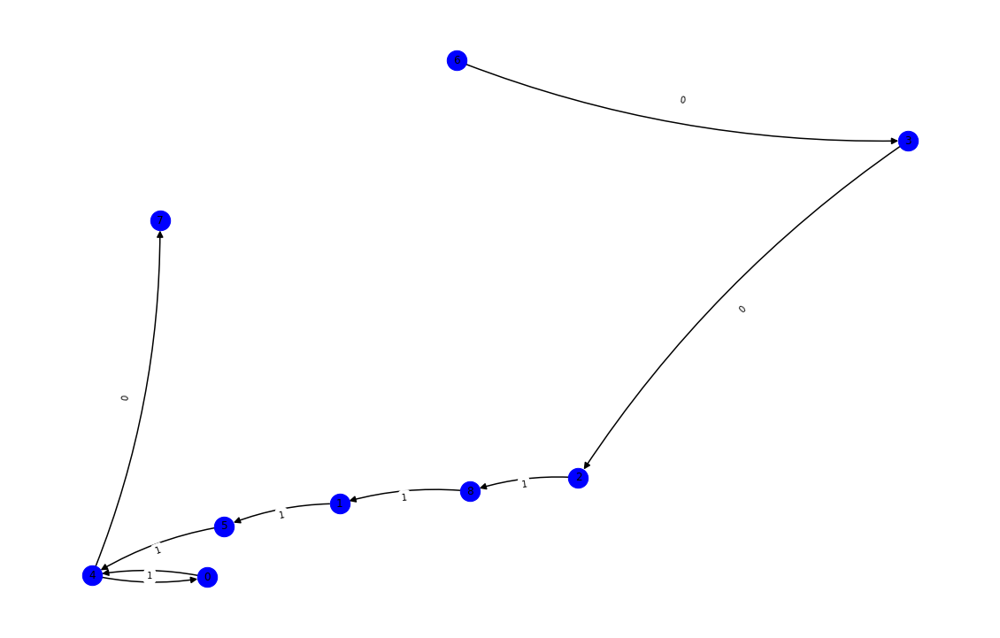

nft-id 60655
mark_dict {'0xff05c37e88cfda1254df012c66d6971cd76d5142': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x4d2399b47b17fa35781701bf1b6b46a81b7f6780': 2, '0x3c942d8ccb8840ad3c0dcc7de0576a84d413cbc4': 3, '0x1dc6d962c7441b41a9d1c601455a71835a519468': 4, '0x36b70581a4d5ebfdb5c39361c90242fba3c7dacc': 5, '0xbac4646ef796e5f43fd406e2a63c9824c844bfec': 6, '0x9c08432086dcc1b1ce6701cf64209afdde433bce': 7, '0x0000000000000000000000000000000000000000': 8, '0xdc8e7537699f344ed3bd861db389c79c92dcc635': 9, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 10, '0xc7382780c13d05fa6ed857fda3fef3d1b9e0e00d': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


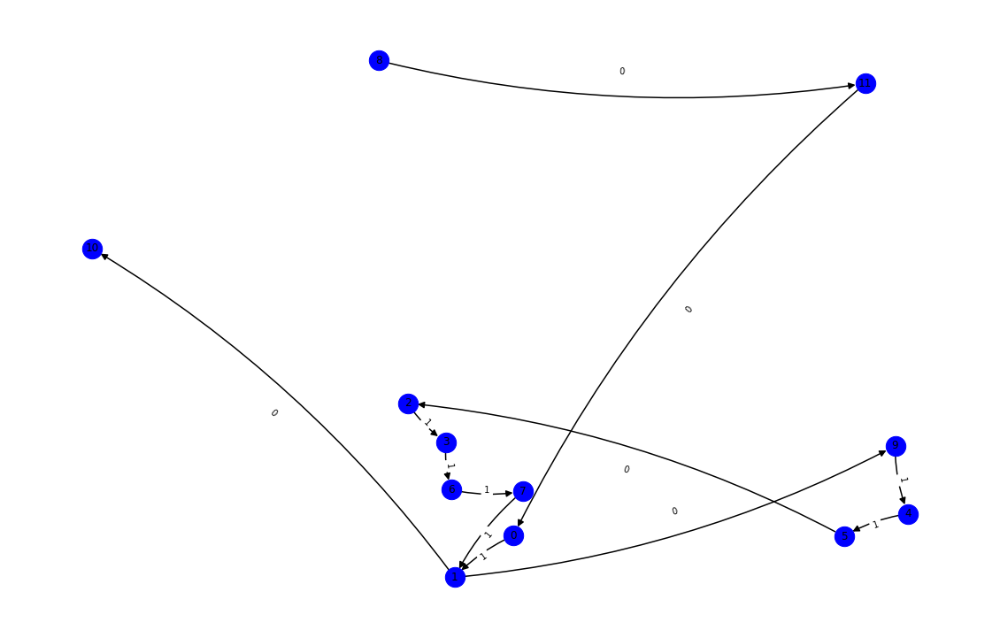

nft-id 69721
mark_dict {'0x7586834e655ee2de6357b2c8423b76efc5fbcc6b': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xb89d16beac18e513743baa6a6e09f60460367ac8': 2, '0x4eb3061a2746a0525188df0f7697c7b19c38f345': 3, '0x0000000000000000000000000000000000000000': 4, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 5, '0xc62d50fceb5275c4ca97ad807044ae12b4042402': 6, '0x743cd810672d78f7a5855631f38291db755b5fad': 7, '0xb413ee173e07d7370f49d6db28bc8c8c4e9a2ac9': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


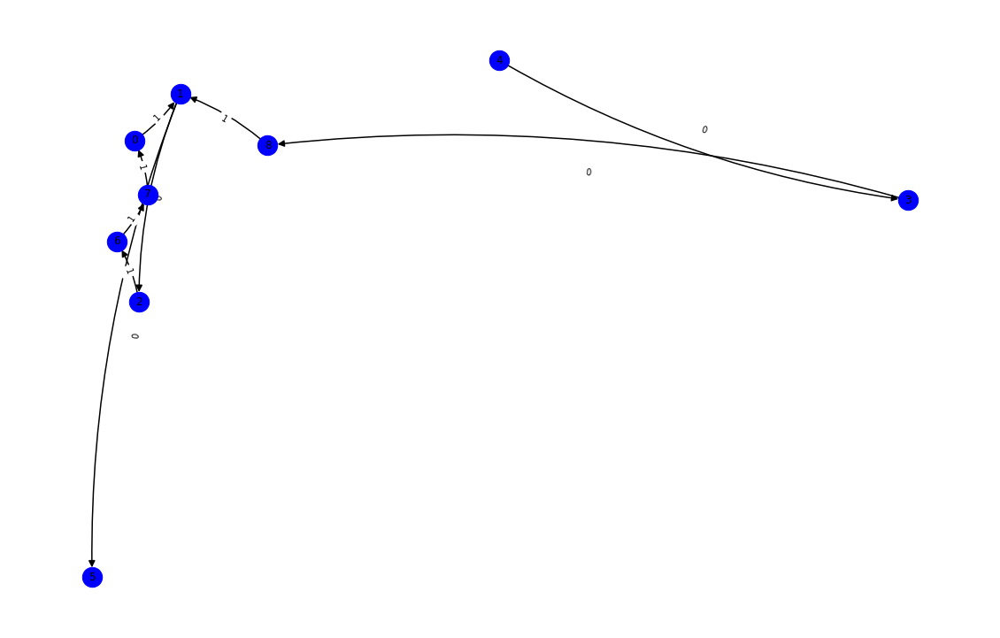

nft-id 51371
mark_dict {'0xbaca135d297d17b584327f7bb436df5d271a2ac1': 0, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x20b37032ea53ba81e78be3ecff8dd2fe33646847': 3, '0x0000000000000000000000000000000000000000': 4, '0x75331ebbe0b00b97cab532384f13c9b479f074ec': 5, '0x6ad244466777fb941917deab621e922b1feadd85': 6, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 7, '0xe0f50d7e55dd330052083447d6ad963c0625ab1c': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


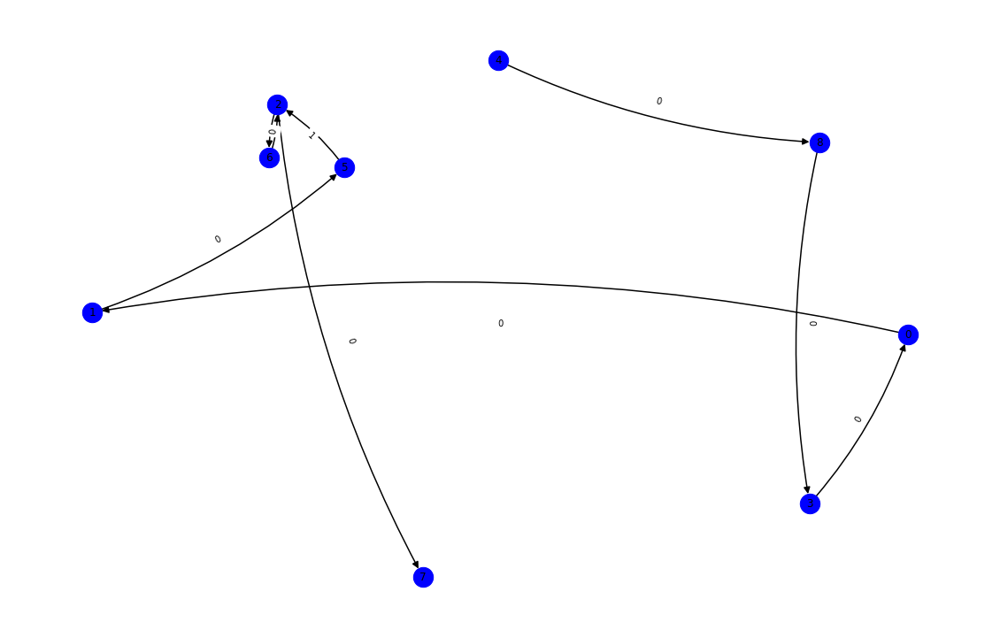

nft-id 47610
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x46873897f487119f34ffde1e6819dbda90cf8acd': 1, '0x782b4c1038004794f67dc4972ee277d344716c0c': 2, '0x6ad244466777fb941917deab621e922b1feadd85': 3, '0xdb8d8f0f8e33799dbb4c555ce86af60d44a907e6': 4, '0xfc0d4a66541dac4d6858495ebc79c8eba7c524a5': 5, '0x37a6156e4a6e8b60b2415af040546cf5e91699bd': 6, '0xf3ba959ef4badcf801ce3c7099597be9f4351dfd': 7, '0x0000000000000000000000000000000000000000': 8, '0x9f03387cdc7d060a2ffaca9ccadc51467b7cd7e3': 9, '0x14dec35854c5550afb8fd8394c3cf6593a974666': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


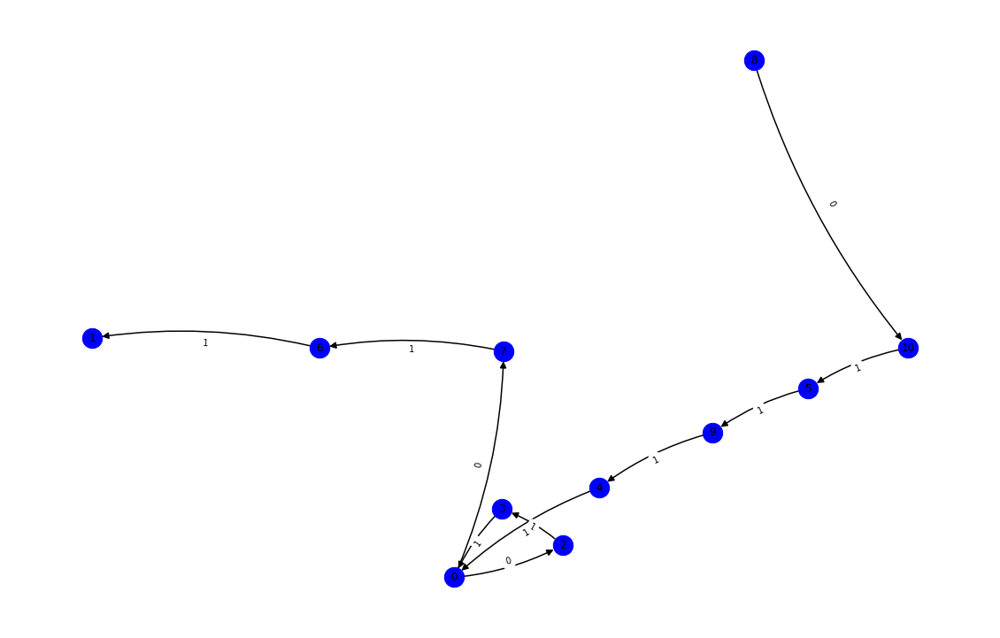

nft-id 62350
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x0000000000000000000000000000000000000000': 1, '0xa01c0735c7ca5f8efc1e63efa5f2d1c4fc1a4714': 2, '0x6ad244466777fb941917deab621e922b1feadd85': 3, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 4, '0xab1a170ec67aa0f2279ea2b0cc80a09d18abc86d': 5, '0x674ace830867045c412cd0cb4ceb23fc0dbd6890': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


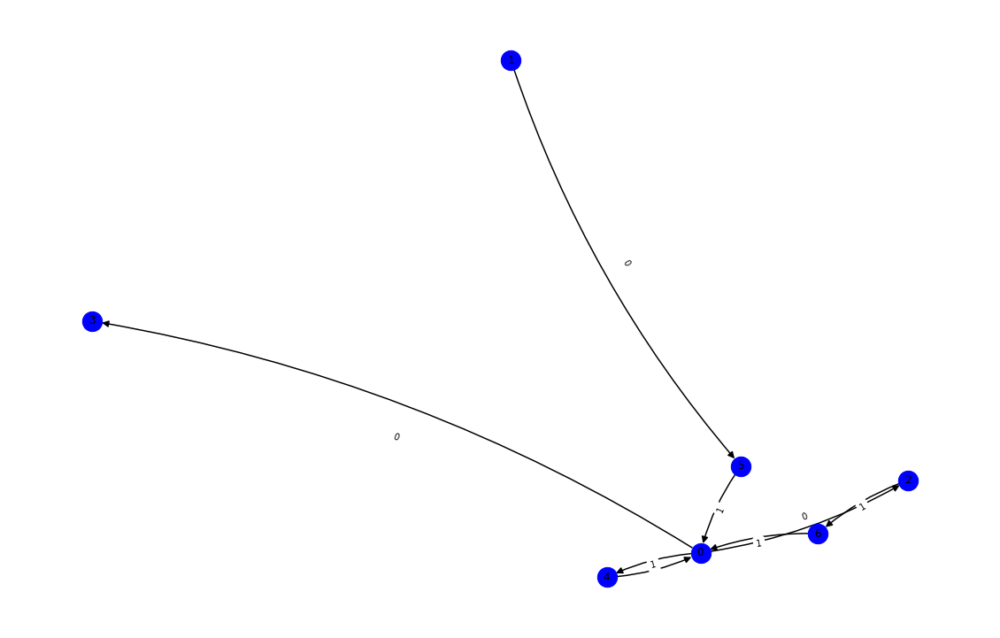

nft-id 62002
mark_dict {'0x283da82863c51fbfcda02322464d21da41cec8d2': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xa01c0735c7ca5f8efc1e63efa5f2d1c4fc1a4714': 2, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 3, '0x6ad244466777fb941917deab621e922b1feadd85': 4, '0xda5b31f602fdf000e404c0653265c61b915b4e2e': 5, '0x674ace830867045c412cd0cb4ceb23fc0dbd6890': 6, '0x4932fbb64a887f130fc37e026635eb87b728fb4d': 7, '0x2af4b707e1dce8fc345f38cfeeaa2421e54976d5': 8, '0x0000000000000000000000000000000000000000': 9, '0x6f5caa2ae52432d2c680665a5cc68ee411790386': 10, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


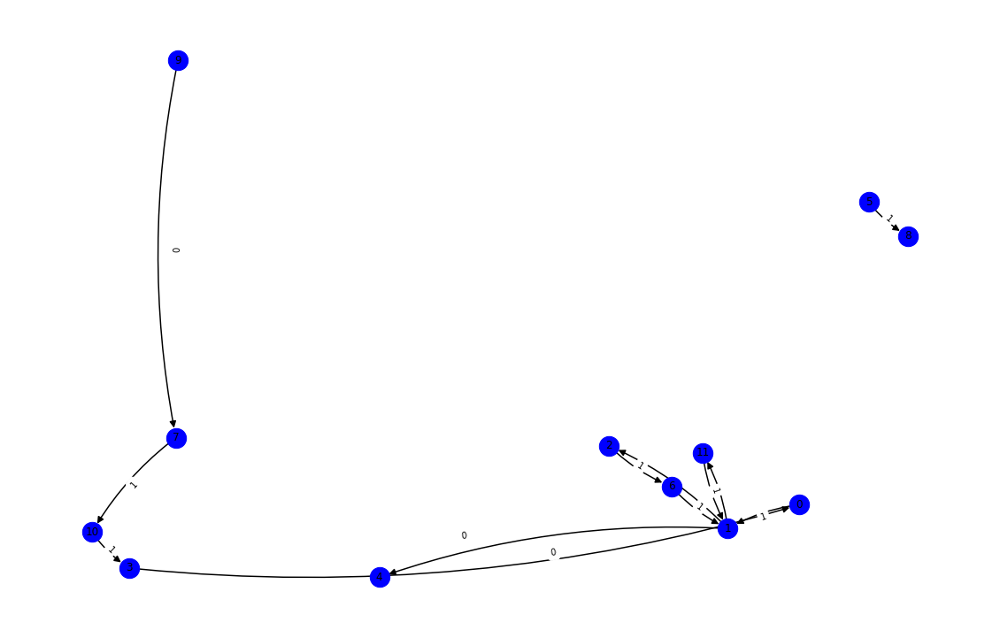

nft-id 62989
mark_dict {'0x828cebb8cc44cb9047f0f057f9603c7348553d84': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x24e013156619a4a28abac56bda14c516667bf975': 2, '0x09adfab2635dcb681fada41ceb0bfa6f52effd97': 3, '0xb9e025a1363373e48da72f7e4f6eb7cddf2f6501': 4, '0xcde7358ecba3a6e0ac9333830679e484e7c98707': 5, '0x89f3f1e533d63d429d85f26ab8e1189d3444b15c': 6, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 7, '0x6f4f5bf7671978e219c9e1d74ae153912194cc8e': 8, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 9, '0xaea0f16872aa230a7eec82709584310fc3163fdc': 10, '0x0000000000000000000000000000000000000000': 11, '0xc02b74c2a4cb402ec93d5a44a254b03f48919d16': 12, '0x72774e2fe1992d5da8c6e9cef73fd2ab980c0b98': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


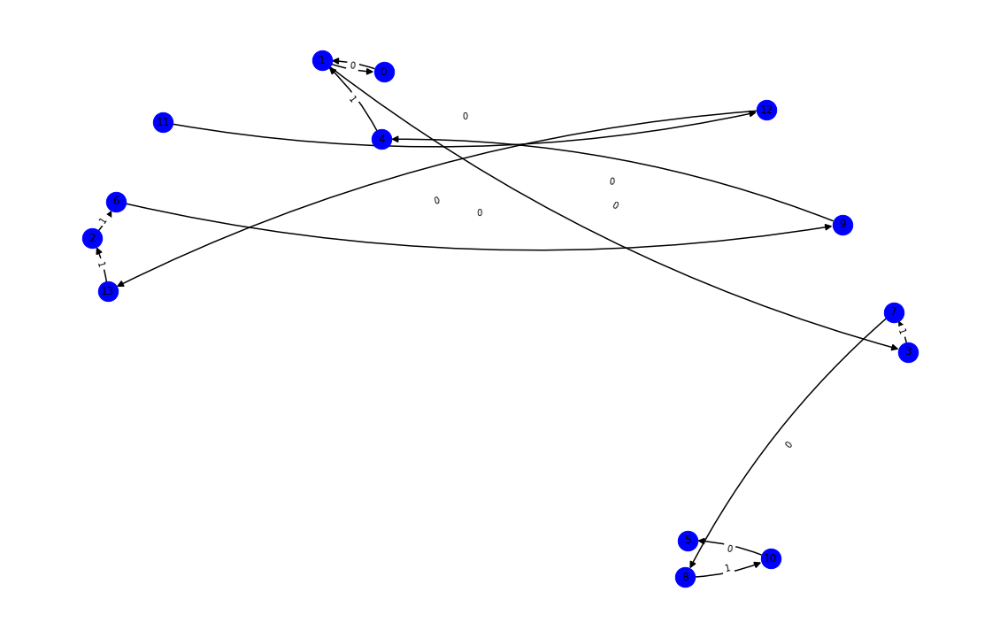

nft-id 64717
mark_dict {'0x88febd0a4ab094ef59954cb229235316a2d15952': 0, '0x828cebb8cc44cb9047f0f057f9603c7348553d84': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x9baceb7f54abb5bf49e58b6f785f7758d162c102': 3, '0x0d1b61c31d88790c855d51a114aa56831d3113a1': 4, '0xa81a3f78a38cb878890b0bede8df68e0e2b8592b': 5, '0x09adfab2635dcb681fada41ceb0bfa6f52effd97': 6, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 7, '0x955c7712c0100c229bd2b31cebaaafe227904e10': 8, '0x0000000000000000000000000000000000000000': 9, '0x99303bd4c519115c94c080a80e3e771e503e5707': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


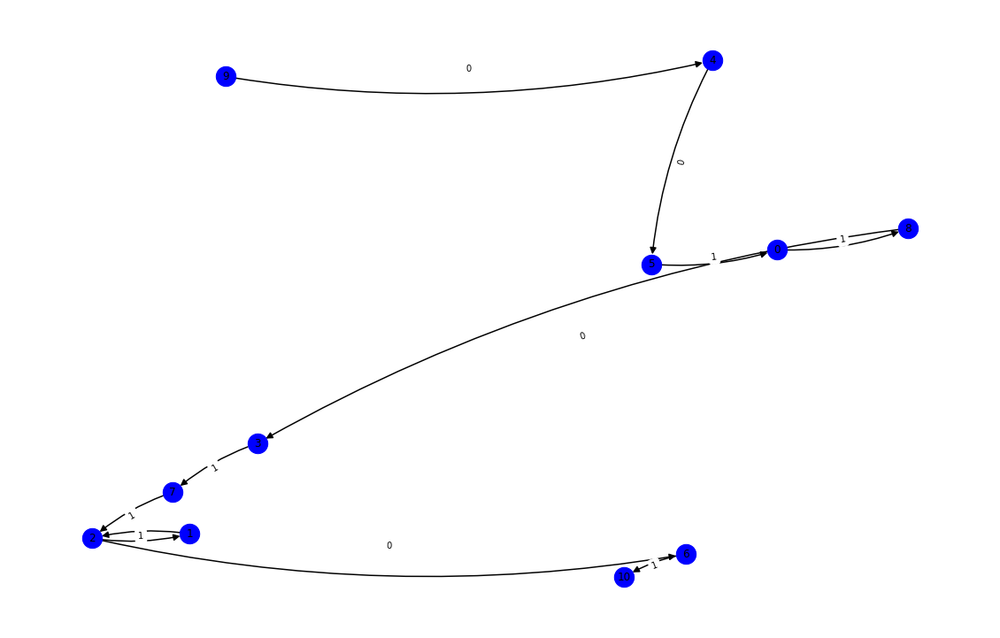

nft-id 65579
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x5168895228e49c785d3d77a4621f076403da79a0': 1, '0xd1c9193981619fc65b325adc52a8c1762429d1c9': 2, '0x2395ecf5e4be53a155cceca77a42ac225491d9f0': 3, '0x503d9943d5f9f0f757252b21d734bc0791fe498e': 4, '0xac3588609f3b4bbabdacc7a4c79b3da8d50c954d': 5, '0x00000000a50bb64b4bbeceb18715748dface08af': 6, '0x0000000000000000000000000000000000000000': 7, '0xeb0b82bb5066f329d1a449bda99ed8c8b1c857ac': 8, '0x39b097668bfd2b8ccd681da123d5dfe8a393fb38': 9, '0xf640dec7aa512b813508f9cc82310589f6aa1eb0': 10, '0xc888c19a101979e0c29274895a86f0c3bab6cf7b': 11, '0xcbbb1588b285d8e431d812c0efd13d4458eb12c1': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


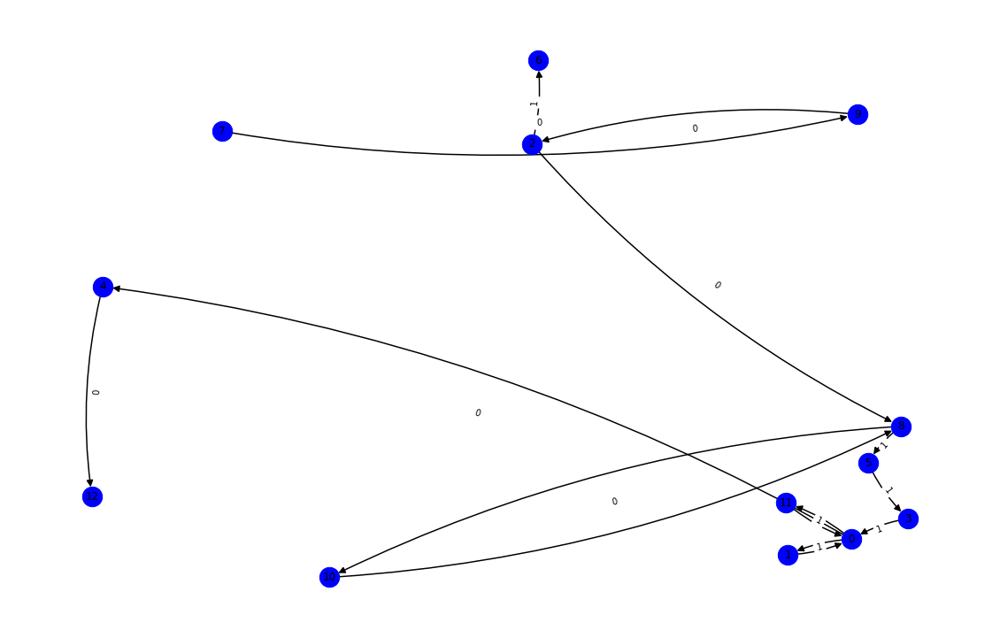

nft-id 60224
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xe7008cb8b51cc472a5084ce1f6304df506952dcd': 1, '0x73d05c2ea70dfc3b220444c94567dbc84bb0d24c': 2, '0x67e23849bb29c304381a578bc9ffbee9dd7f869a': 3, '0x81cd1b1e4b5fd9e18fcb4f16b1e56c939ee2a5d4': 4, '0x0000000000000000000000000000000000000000': 5, '0x2443047e6ac82fe65035e36e971316d981492857': 6, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 7, '0x611c67ec71202613da55d00ddc04ccdb02060fcc': 8, '0x7ba22971610691b69b9345ed97dd19629a421914': 9, '0xa2d76c09b86cf904f75672df51f859a876a88429': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


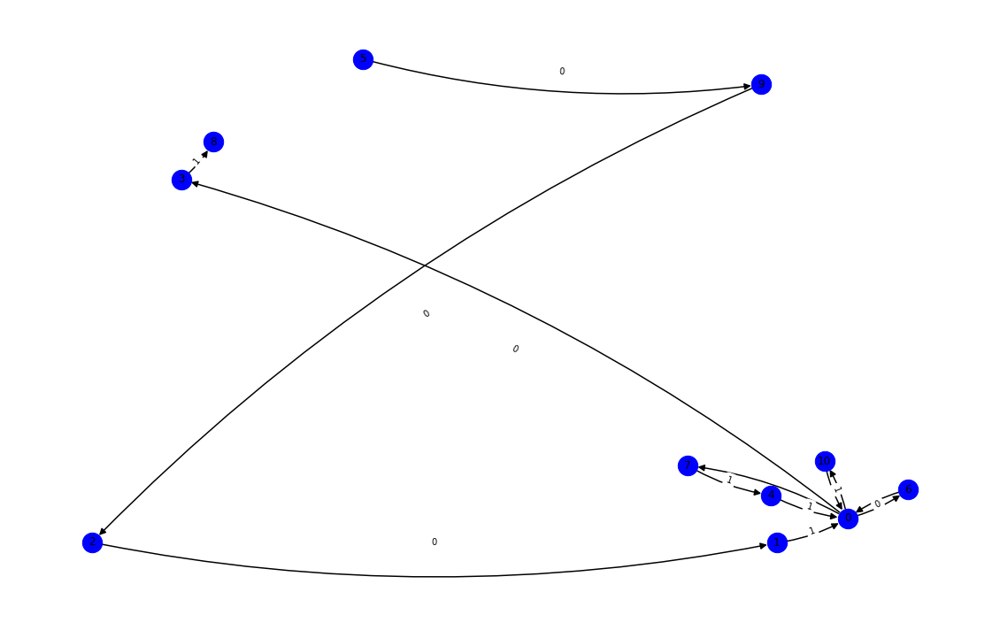

nft-id 58446
mark_dict {'0x378eb8e666f8b38f3c414d9f507b6851e8e8e6a4': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x13928eb9a86c8278a45b6ff2935c7730b58ac675': 2, '0x0000000000000000000000000000000000000000': 3, '0x8951f25adcc7c3256dd9b521ed726fb587a46d52': 4, '0xb59ceca09855a9174318fc90f46207a8eec15813': 5, '0xa89c95f3b69c6435fa022fce66efa46289e24476': 6, '0x753c892626c4fa09d1aedc0e9b52bda97a4afa00': 7, '0x105c1892c795e28c26d5738fc6ebc241a337dc6c': 8, '0xc62184ac04a0610147bd890ba32d1918b67e017c': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


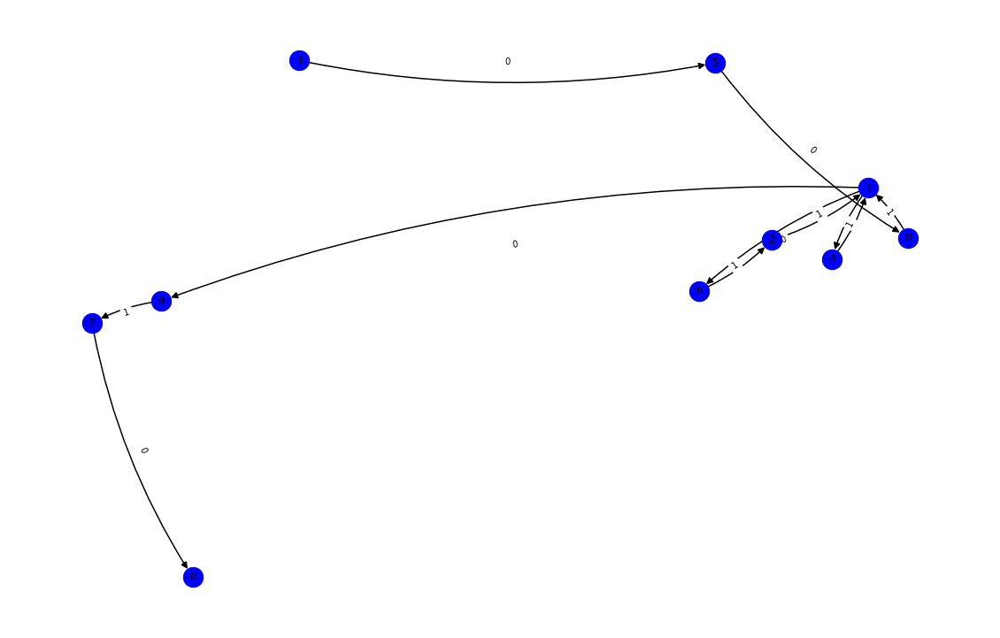

nft-id 60420
mark_dict {'0x65dcf7782260aa1d6642a85f36c0bc9545182f1e': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x271ae5a9e689ee106eef2e70861122aaf2a3135f': 2, '0x0000000000000000000000000000000000000000': 3, '0xb31d732de7c09276334135297298036cddad970a': 4, '0xc934639d5906e1a7dd077a0bf22b79eae8d930bc': 5, '0x61f2213187275105efce44e818627af2816cc0cb': 6, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 7, '0xbc37277871ab83b83b6e77a8419ac5cbb78d5cf1': 8, '0x9d116635264a37a6da46490dc1b222d02283f3c6': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


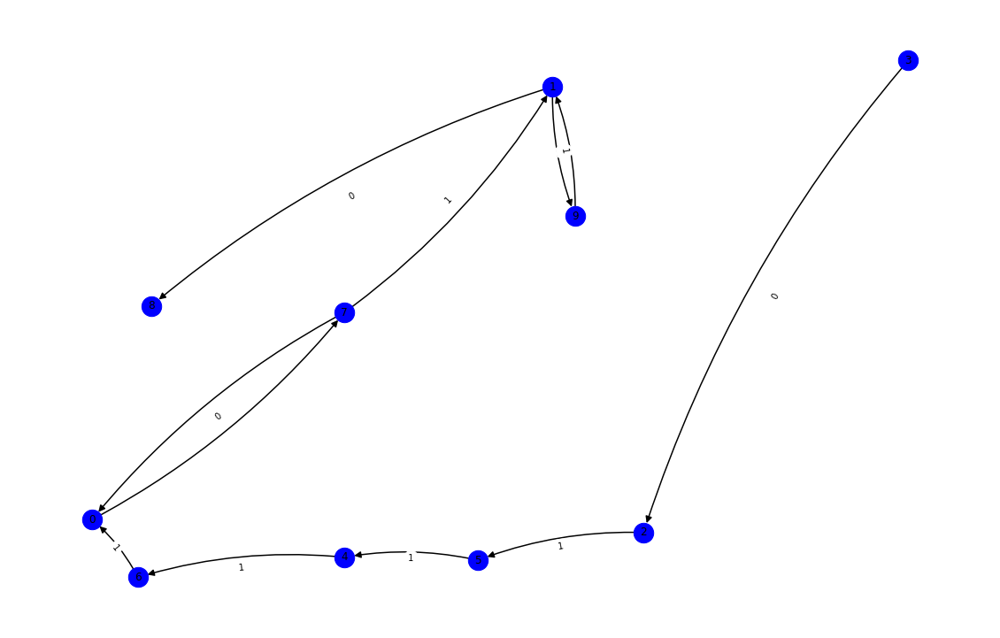

nft-id 84068
mark_dict {'0xfe965dcecd18dfa6a7311d47ba9cd016e91cdcea': 0, '0xca51ebc7ea798698260eae111362a2e04b5f7a93': 1, '0x0000000000000000000000000000000000000000': 2, '0x18375f52e948fabb2544716403d0d460b0eb4589': 3, '0x2396f23d4ac0eb6f1360eb38ed763192c8776c80': 4, '0xb68daa2725edb70f9389f0dce80a0c7f9b76ffc9': 5, '0x2ea5c9f2bcc7d4d3f3616d4a11ad86b4e377f342': 6, '0x11faf848f03eee6908b68d6919270af3b0a90db5': 7, '0x6f435a9421653b27f048957b8ba2092d65a711f9': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


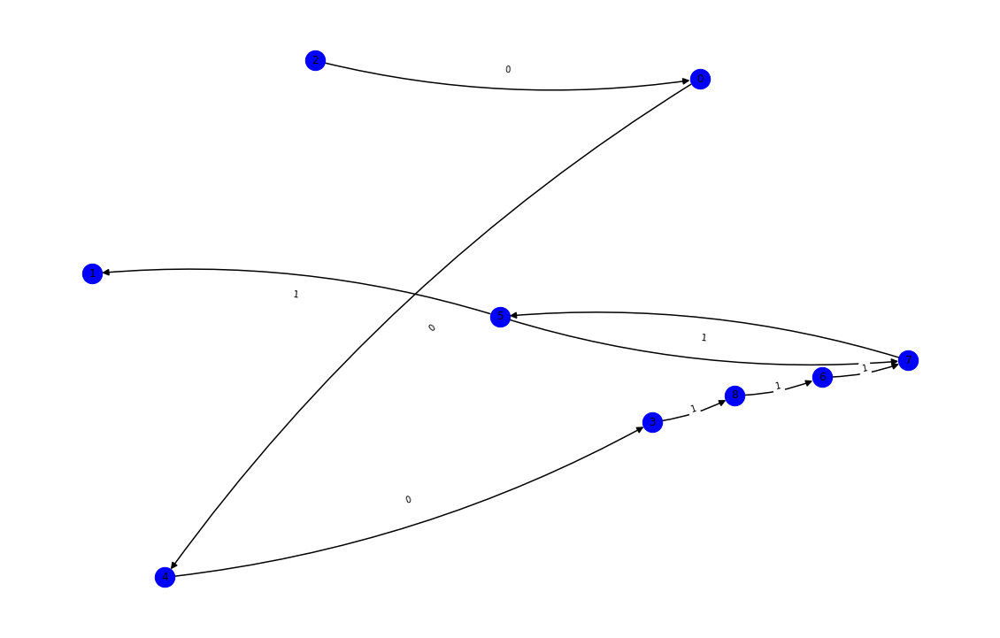

nft-id 96001
mark_dict {'0x0940b6c0d2bd85afed6c39402eca57a08c0b5aa2': 0, '0x31837aaf36961274a04b915697fdfca1af31a0c7': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x9f200c031a541d2a3223889a2e26c92d72828061': 3, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 4, '0xda13286f3cb10580408b75fabcc3f7efffa2a142': 5, '0xf1f6389e56fe084c5db5ab3af6be124c352c9855': 6, '0xe1a655553ce22e454c9d474dc3c3b41d4fc0b191': 7, '0x5a80a2d64d41600ec7953ce69f36c9d34b7c3f41': 8, '0x0000000000000000000000000000000000000000': 9, '0x3eedea57e7ed126f5fd8d7ad6607943d4e96c1df': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


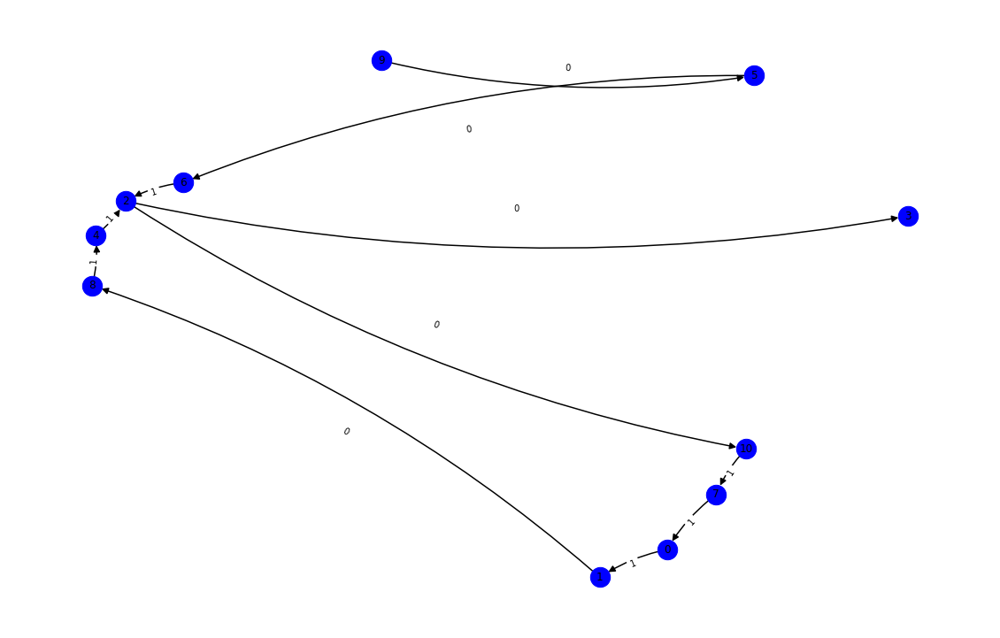

nft-id 63753
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x9f200c031a541d2a3223889a2e26c92d72828061': 1, '0xe052113bd7d7700d623414a0a4585bcae754e9d5': 2, '0x09adfab2635dcb681fada41ceb0bfa6f52effd97': 3, '0x51d36d3181aa7d9a84c87808acbcbce74cc4e820': 4, '0x1f466f5af28689d7108959ba94655ef82b1023a1': 5, '0x8279648470eb92cbcd00ceb8ca30c2adfac20740': 6, '0x3a93dad82fb00da5aee71ba060d7d112f4215052': 7, '0x85036a0dcb114788cabd079150357a8a48597161': 8, '0x9222cf504c11dcdc8642192917274b7a9884ea67': 9, '0x0000000000000000000000000000000000000000': 10, '0x98cc750a40d846759d4aab1af5a8331830852d4e': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


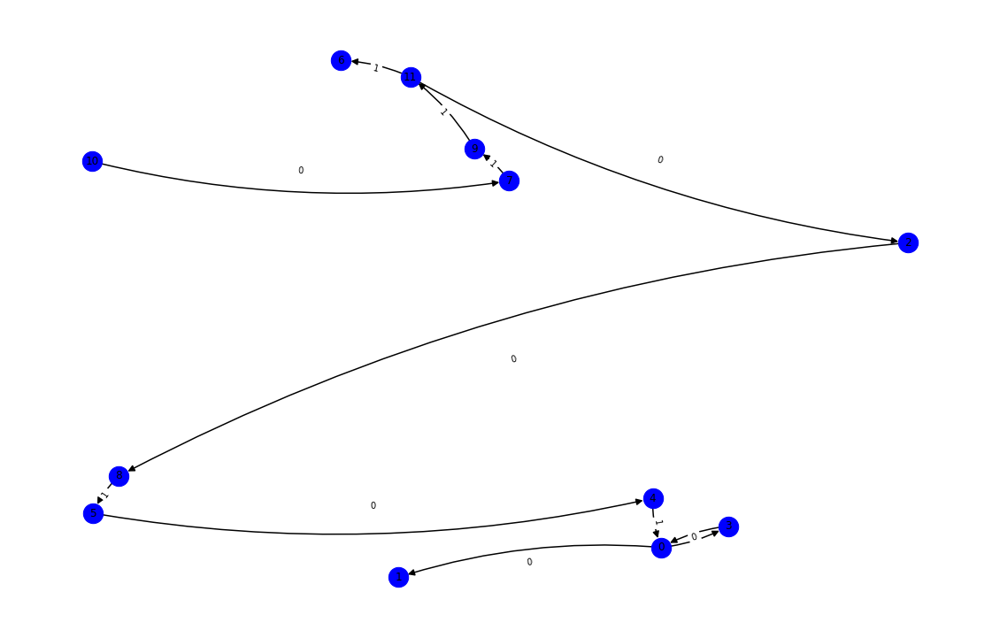

nft-id 64271
mark_dict {'0xf342c0eb007359651efe7fb52ddb5aeacf57755d': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xb88df17c83a55a6cea9451609c7c8480151943e1': 2, '0x470f5469aeaca55b7b415d14f5707278bddbbffe': 3, '0xe1d19baaaae5fc1a786ed08370fcd6d1d895f49c': 4, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 5, '0x84da4dcaac3287cdcbf50f70865143859dd15626': 6, '0xd31e47eaa18448f92c7977f29516a9b82eeabb71': 7, '0x87e4e2733ba4e4c362027e06258988b34c1876e2': 8, '0xa61f21e490cadeec26d48e1bfed6393b753420a9': 9, '0x0000000000000000000000000000000000000000': 10, '0x16d088a79d7d36213618263184783fb4d6375e33': 11, '0x95deb63b5d3c9a193349a97e3d55b75e77b7e138': 12, '0xb154af72c7f5760a92c46193aeb24ff8ddd64488': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


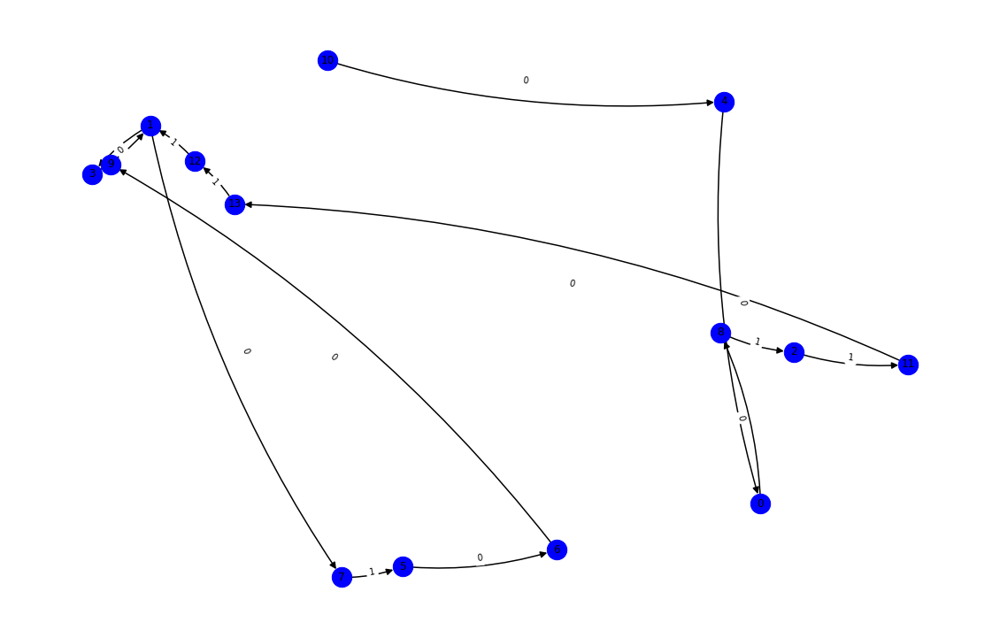

nft-id 54195
mark_dict {'0xa9e6664937e399155a6ee4de32578319d2bfd0f4': 0, '0x1488ce391699ca445a970283b74f0a4f1f47761a': 1, '0x3569b4f3e92600901eb17cda29b5f997c0a913f1': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x40b6df5f6217fb1a1beaf8fdbb9572304aa78c4d': 4, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 5, '0x75b4c0cc9a84f187cf8eb98f18db111090c85ea8': 6, '0x7358b8f966f17a2097c26d2219a2308b8d3e7c70': 7, '0x0000000000000000000000000000000000000000': 8, '0x2443047e6ac82fe65035e36e971316d981492857': 9, '0x6f5caa2ae52432d2c680665a5cc68ee411790386': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


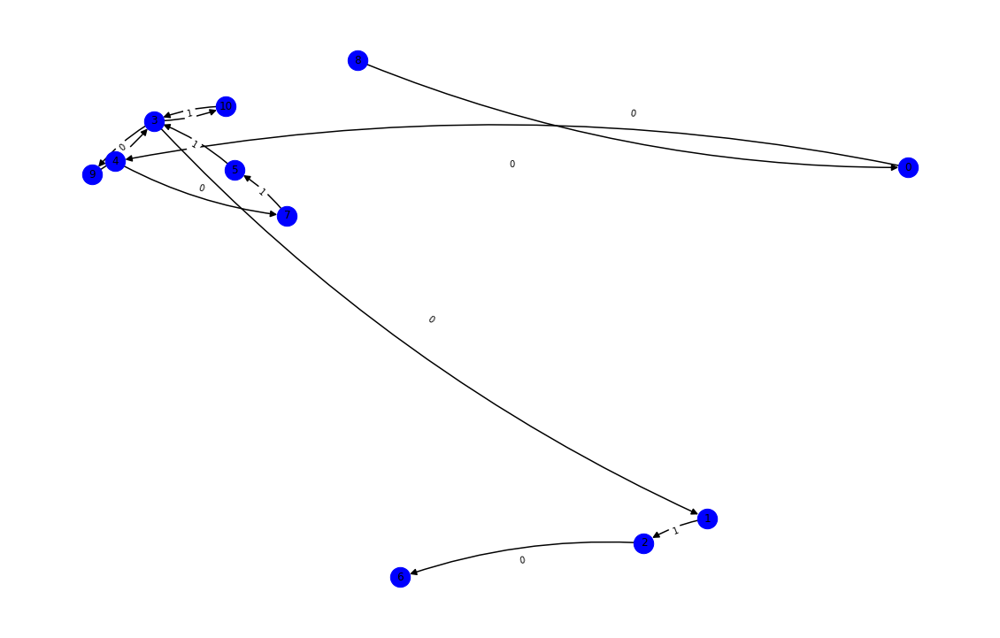

nft-id 2619
mark_dict {'0x0000000000000000000000000000000000000000': 0, '0xdad19177128fc63b9de5aac7c9afb08ede8830dd': 1, '0x359d962c64f89d3bfb122d526384e3b612b97ddf': 2, '0x72c777c170497db3741ad61f4add24ee7393d540': 3, '0x8ad1e318e26cb42d39d323fc9597b77578b95baf': 4, '0x28570d9d66627e0733dfe4fca79b8fd5b8128636': 5, '0x512c579153ac6fd961a7d9e7b19281b855aafbe1': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


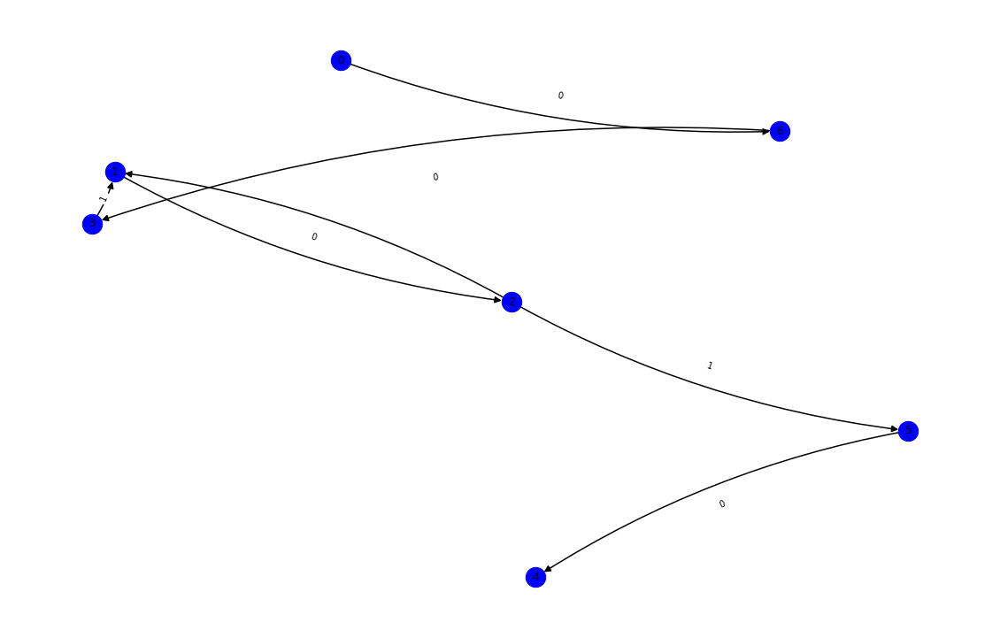

nft-id 47328
mark_dict {'0x2eafccd1b84f0261c22f4d0c1e4da2985b529b54': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x2b5a98f48c5661b8e3fc0db31739a74128597c86': 2, '0x0792ae449a90e18d7a9bdd79abd848f3235f88ca': 3, '0xc5cc11a1c5c91f4dcef48ee32147945540bcf297': 4, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 5, '0x0000000000000000000000000000000000000000': 6, '0x2f57ab3ac31f4113d465379f423539441d177dd2': 7, '0xabc9af9591794e5e30acc73facfe6237ac4a06fa': 8, '0xeb11f192e91e2d4abff199b58222c89472584bf4': 9, '0x1a49fce89d020dc189979c0d5a52b59a35742fcf': 10, '0x5c1b1c716838d999592c6ee432eddd2f4c55e33d': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


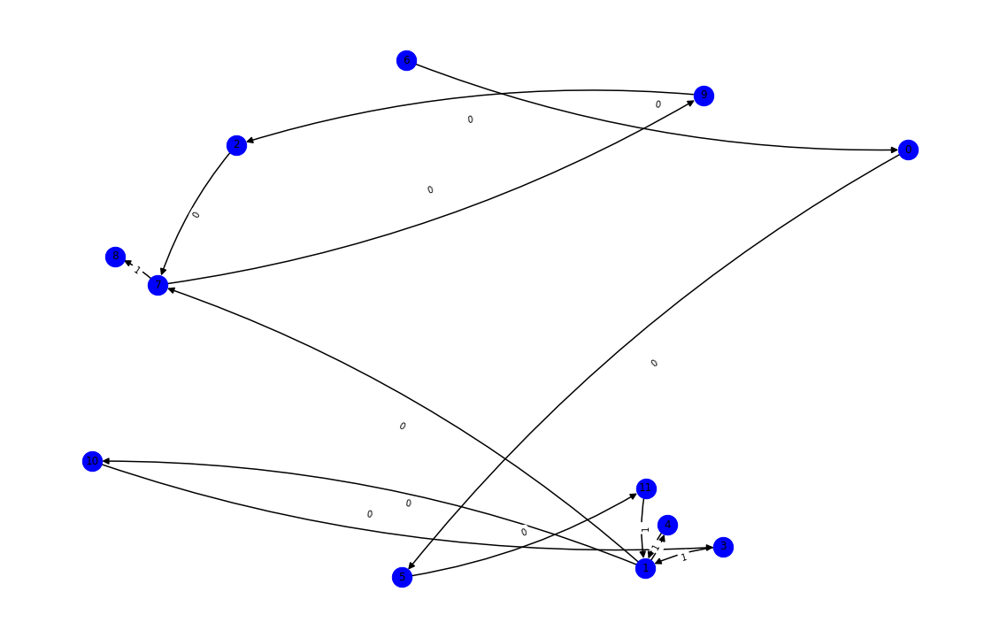

nft-id 51796
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xfbb28c279b5f17b37769bf248e215b74c725b765': 2, '0x393f954db148bfbdb1ab0b44f823f2751b27bfae': 3, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 4, '0xbc37277871ab83b83b6e77a8419ac5cbb78d5cf1': 5, '0xd3cb2b04e9d81eb76dbb38ab8195142ebb472f30': 6, '0x6887444a5b74b746f56ae08952f4e1b404ff7ca5': 7, '0xbff79922fcbf93f9c30abb22322b271460c6bebb': 8, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 9, '0x0000000000000000000000000000000000000000': 10, '0x743cd810672d78f7a5855631f38291db755b5fad': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


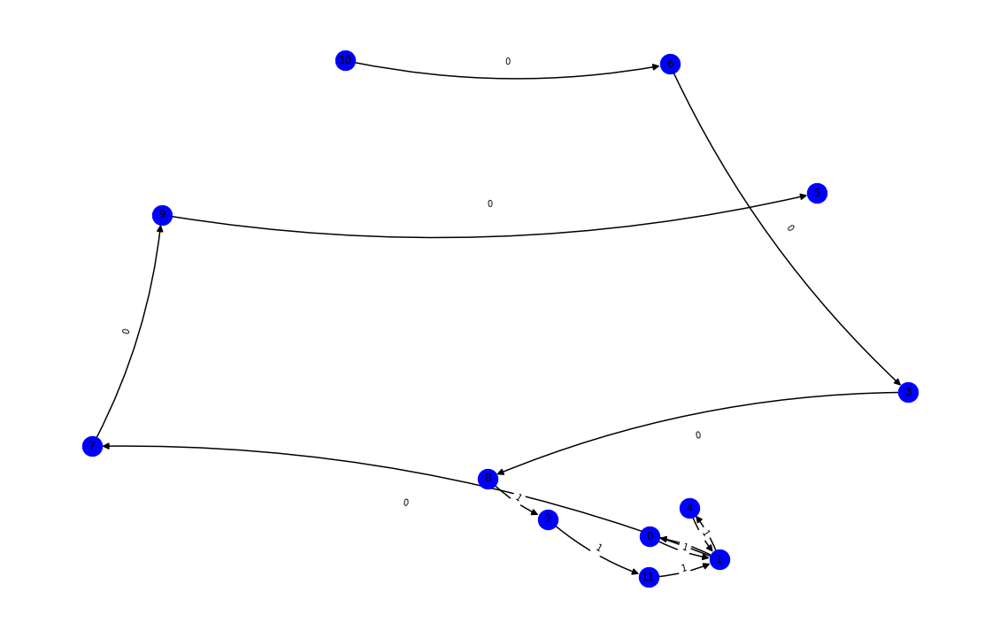

nft-id 78812
mark_dict {'0x484f2bfe6ea59d667fd5cb29ed259329180d0507': 0, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x13d8faf4a690f5ae52e2d2c52938d1167057b9af': 3, '0x6c56398b111e278d2c28015ab5f5ca023cc5334c': 4, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 5, '0xb12a83ee8b028e5b5816bcd3cb59f400e4afe62a': 6, '0x6ff0ef85b85479e9d315fd5ca0d9912debab366c': 7, '0x0489726421f3b7b3eb2ff98b29c6cfc5aa54f3e2': 8, '0xac904aab17ee5336b66bd322df82f7df20dbc261': 9, '0x057f90ca68cece57283acc80ed2a65612259a31c': 10, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 11, '0x0000000000000000000000000000000000000000': 12, '0x038dfd0bdfb675b3143d0f2c75c28b03cfd09126': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


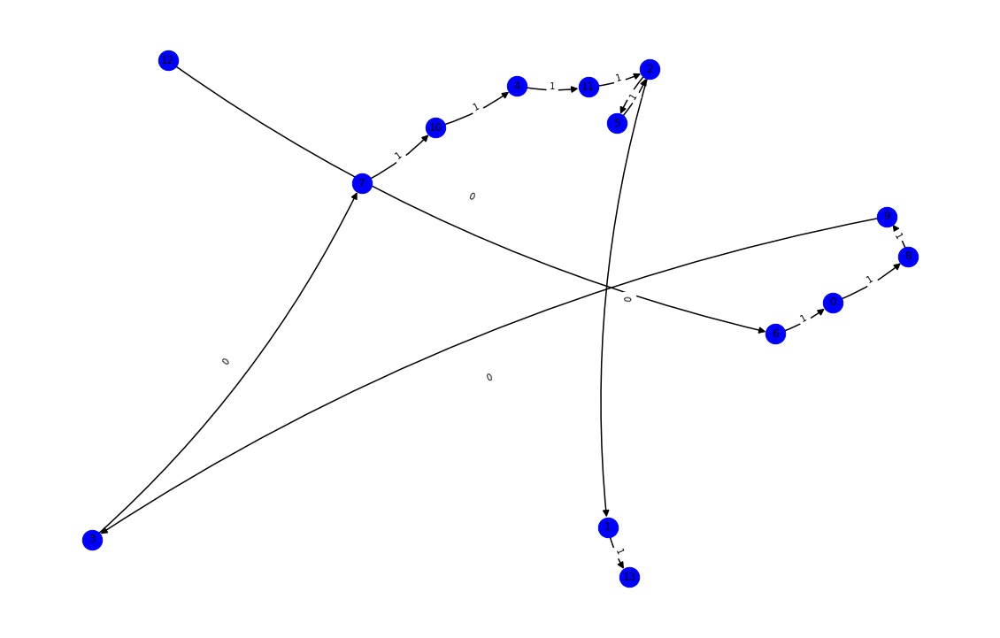

nft-id 96602
mark_dict {'0x295c1c931ad856805588178bacaa0b0e5e7dc644': 0, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xaf240c6855cc5362904b8d2113ea94f575051dda': 3, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 4, '0xd115560b04f512f25e65f49827c3cd69118bcf49': 5, '0x42d69174dbee05cc77267fbf8fbf10bdf0672b7a': 6, '0x66c8a6963a0c3a6c5441b89037e01a31d9e31d00': 7, '0x0000000000000000000000000000000000000000': 8, '0x67ac6f6b7aff56683620a8378a6fbeb04aecf1d6': 9, '0x02ea5e0b13b4067a5fce40240e96ff2c7a8ca3d9': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


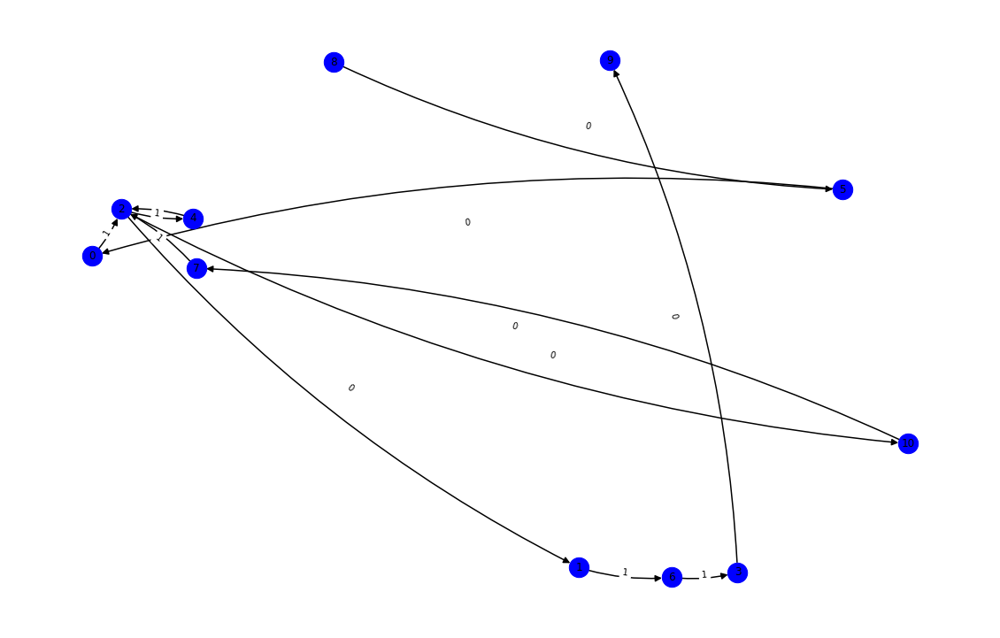

nft-id 56591
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0xd8670e0ad4c12449a44e4208c7a40fcdcfe40b20': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xb44bdb0c63d543e536369fa94985350977264a61': 3, '0x89a1145fccac1a2a9350ec1a4a486e4458d26274': 4, '0xe22c1b6e2606b65bf482ca1ab6a164617cd4b5f0': 5, '0x5bbefac2828e25708bdee6bfaa8b33d8ebcebb39': 6, '0x7e63e838d79b87ecc2c2568c077cfa25f381b23b': 7, '0x0000000000000000000000000000000000000000': 8, '0xf89cfa2e6ee4f6e7a6887291751e9a88af591f8a': 9, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 10, '0x55abeb0906c2676fbab2f0a788fcf70126a4cb5d': 11, '0x9a5937192629d06bbf553c41ffb3bd30fbbd1115': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


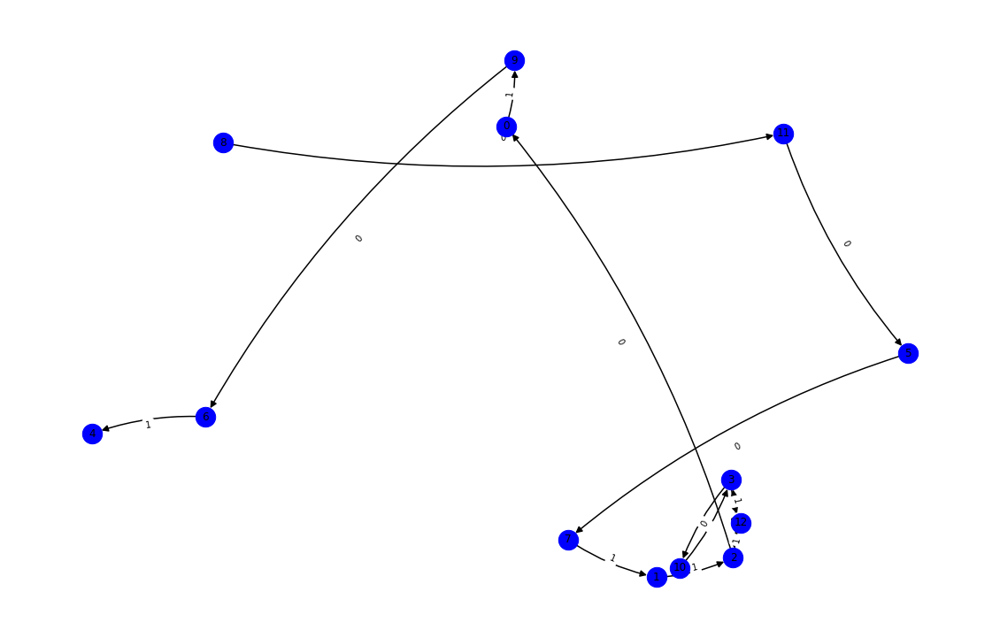

nft-id 72906
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x470f5469aeaca55b7b415d14f5707278bddbbffe': 2, '0x2395ecf5e4be53a155cceca77a42ac225491d9f0': 3, '0xc14480bd7bb6d36377c75286b80452654f5b7a79': 4, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 5, '0x8cf7b8dcbbca319d42ec02541c266d9b6d1c1f13': 6, '0x0000000000000000000000000000000000000000': 7, '0x77848888bece35979dbe948c7931a3e7bb7e0d50': 8, '0xdf8a0a7e5c652a92ee421048760a5309b7be164a': 9, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


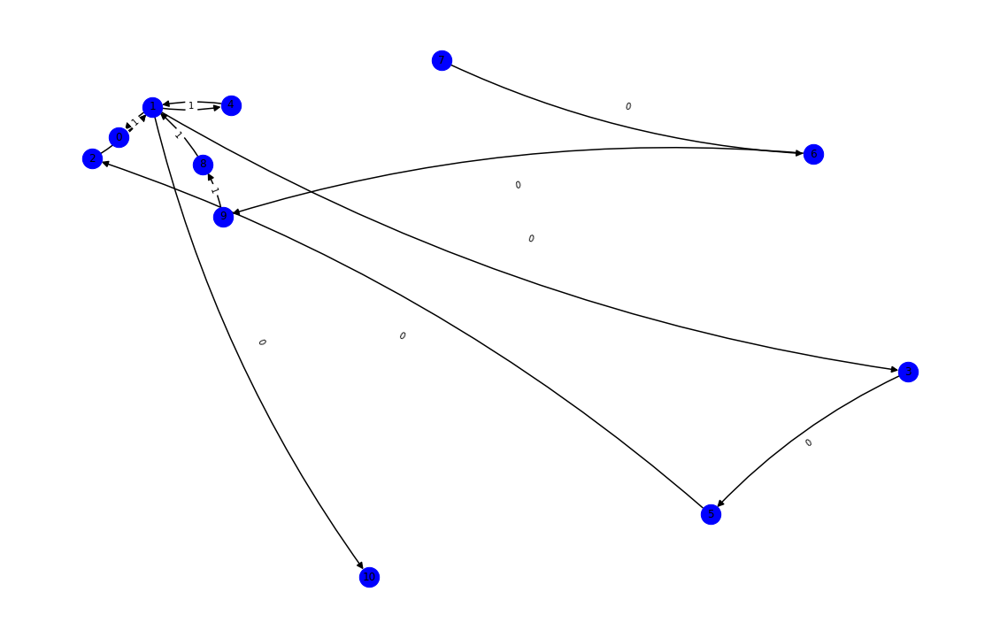

nft-id 58428
mark_dict {'0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xbea02fb6351351bc25dddf296920e90a4a6d6319': 2, '0xa72cce6b1668ab82017dd8f309950ff3f88c18d5': 3, '0x438c2c26ba193a0169060157c44e17d0185c4265': 4, '0x0000000000000000000000000000000000000000': 5, '0xef2743855ce5d1f0138bb16d98c469d1287c24f2': 6, '0x3b33b909e4020cf485ea0cb2f2929d261cb1b403': 7, '0x4c2a6c5d15502c41c4d290f5ddd600878ff31da3': 8, '0x061c124dbb4e7c68fa9e9482039b5816a1f5c4d3': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


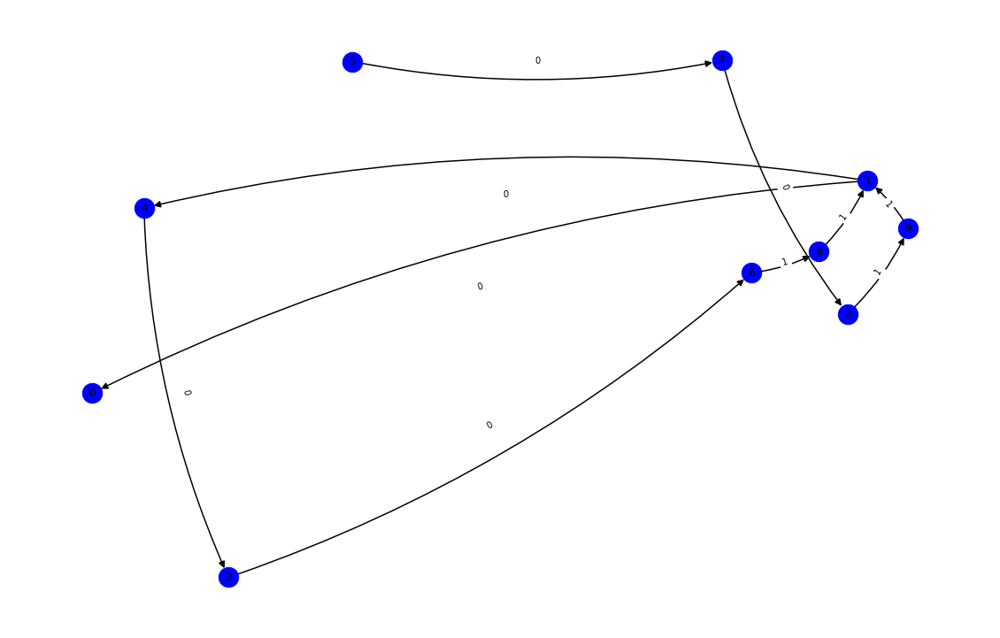

nft-id 93220
mark_dict {'0x254637b844f903dc2e3fa104b1066a2c1d956ed2': 0, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0xb0ffc78c832d2cf7fcc63f79238fdd720b5cee35': 4, '0x19f3e5df2651e01212e47f8751b3d8a02761115d': 5, '0xa86accaec249da876240c786c30dae4602191504': 6, '0xc5166d44038ff3d97dfd1faad10a047e18653489': 7, '0x4c2a6c5d15502c41c4d290f5ddd600878ff31da3': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


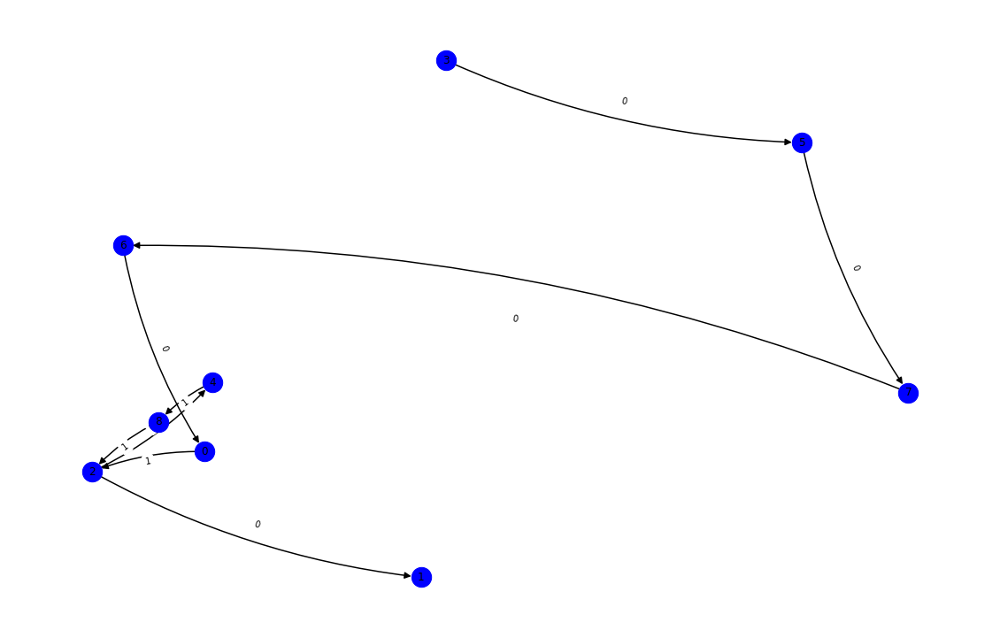

nft-id 60046
mark_dict {'0x15971bf3e25f744f1c38d9e21ca158005032756d': 0, '0x2b5202b08451549a7ece5d398b9f25e381b59ef9': 1, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0xf328e13c8ab3ca38845724104acc074ff4121d74': 4, '0x9e9346e082d445f08fab1758984a31648c89241a': 5, '0xb68daa2725edb70f9389f0dce80a0c7f9b76ffc9': 6, '0xfe34e4bb3081ec4a759076919abb7e7cffa09e6e': 7, '0x671aa5686ce559b8bbdf49c8f5c7d026ce7a6d2b': 8, '0x4f3215bb59dbd3a868510ebc02971570778aa360': 9, '0x727e634b43b816defa882ccfdaf80a51f92b72bb': 10, '0x0000000000000000000000000000000000000000': 11, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


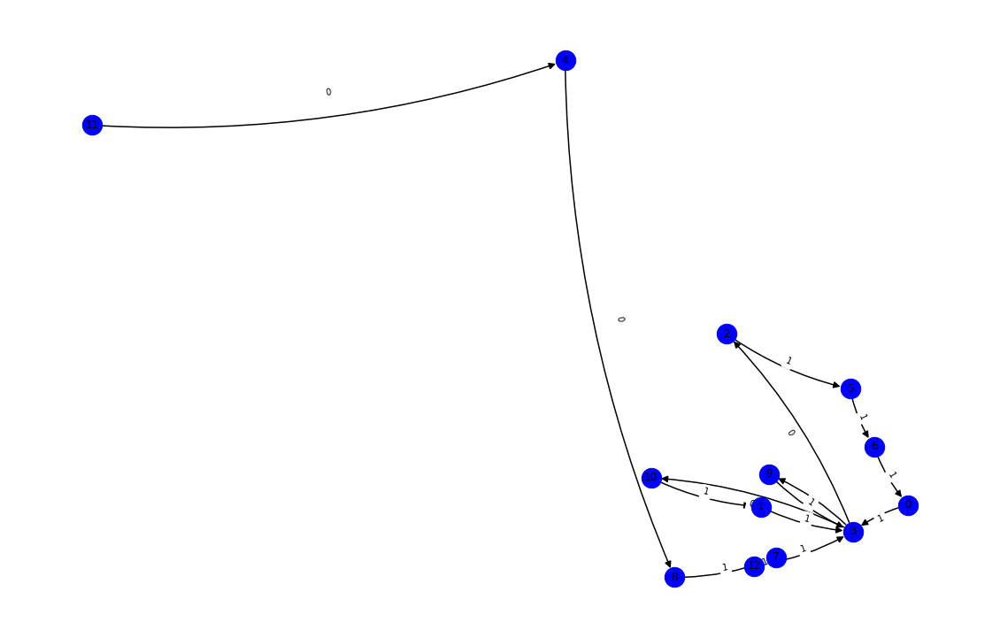

nft-id 52449
mark_dict {'0x0f69674157ac097bc92a3185ba1610fb8d239a75': 0, '0x1928cc6369004a86c5025e70e60316686a2b09dd': 1, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x4d4d5236d1160698e21b44fcf6b35797081c8fdf': 4, '0x0000000000000000000000000000000000000000': 5, '0xdc8e7537699f344ed3bd861db389c79c92dcc635': 6, '0x7d8b63f833b1586b78a58eae7c797e0596cbf736': 7, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 8, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


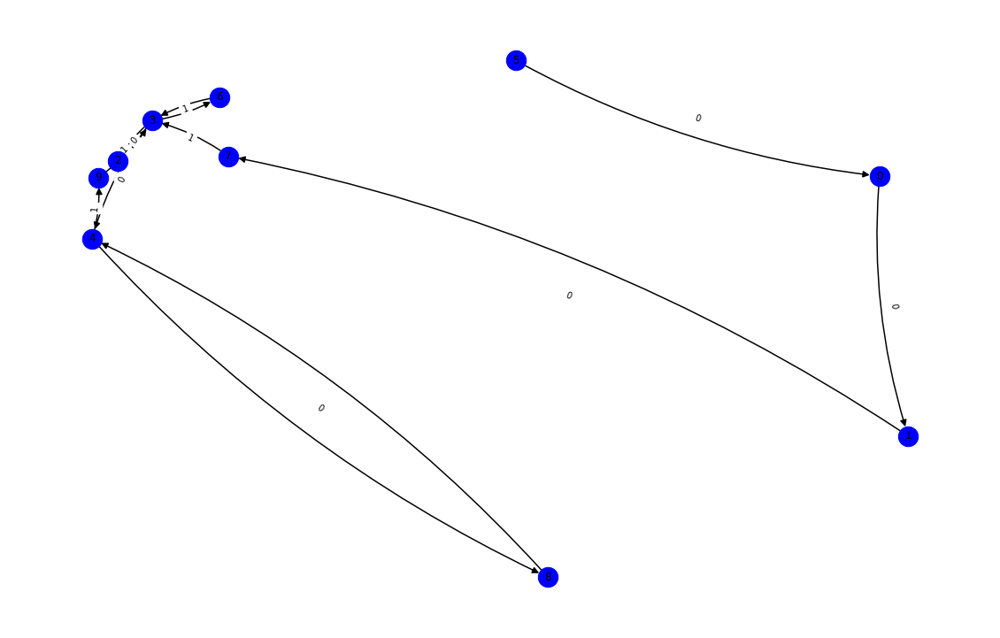

nft-id 53954
mark_dict {'0x37518bbd538277d97e5966d105a69efcf2aee0e5': 0, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xf92d4657d1a85b60d656572b60f73242888ec271': 3, '0x5f6af6b4f8778175bec97468592a913fa98a163c': 4, '0x0000000000000000000000000000000000000000': 5, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 6, '0x7dd1139752ecfb7668ae2859f899cc8fbc4fb5e2': 7, '0x93a56ffa78624c0ecdace6bc9a7c63f92f398d68': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


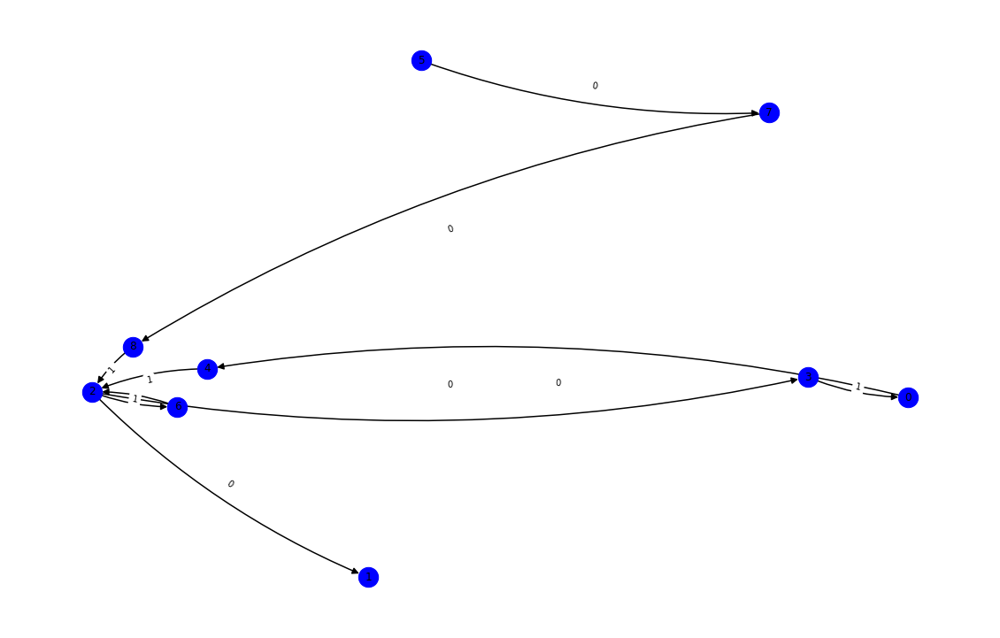

nft-id 48973
mark_dict {'0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x0a12ca46ffb20468f48ce9b8f4dff802cdcf1ee7': 3, '0x657d3bbd8651945f755f272b5c996eece411836c': 4, '0x488816add3fccd08a3ed07e4d0b1f29dedfb4339': 5, '0x3d0324e595c1b8e7595da03c7ad01decfedec23a': 6, '0x68cc45c405547e93dda77d6e1b62994119d4d04e': 7, '0xbc67613bb426e67c713abfad0234ab5b420772d4': 8, '0x2154a61b2ef92659f617a4c287d6086cc243a8d4': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


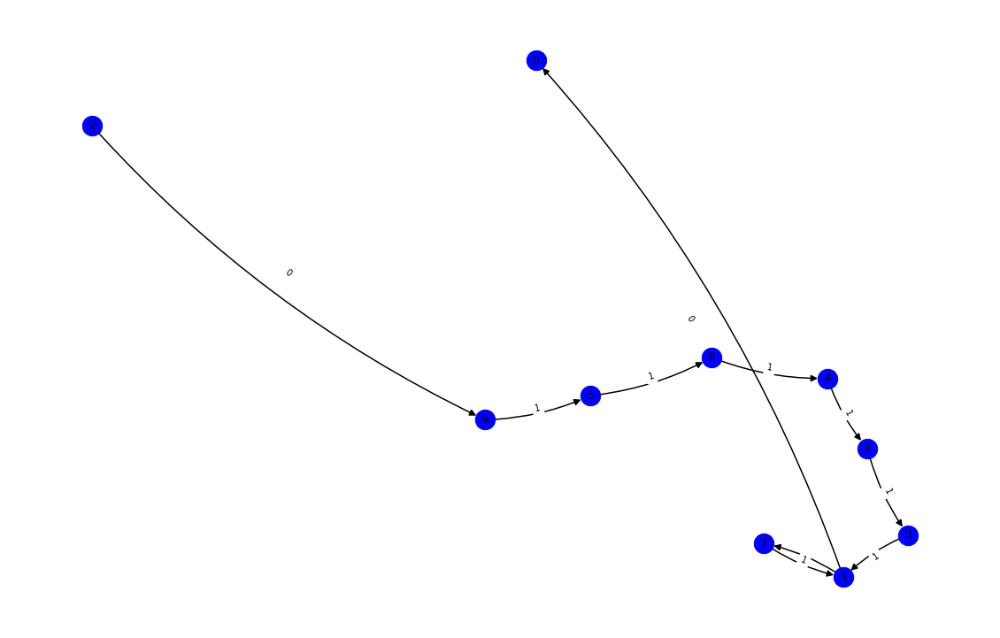

nft-id 53633
mark_dict {'0xcd6b0fa735fbb5eb66e8e11e7740a5921148486f': 0, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x68cc45c405547e93dda77d6e1b62994119d4d04e': 4, '0x2443047e6ac82fe65035e36e971316d981492857': 5, '0x624ae79b0bc9a151dc95e7bbe197e63f1514c0c6': 6, '0x6f5caa2ae52432d2c680665a5cc68ee411790386': 7, '0xfba674dbbbfafed6da9895051e5204de824325b9': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


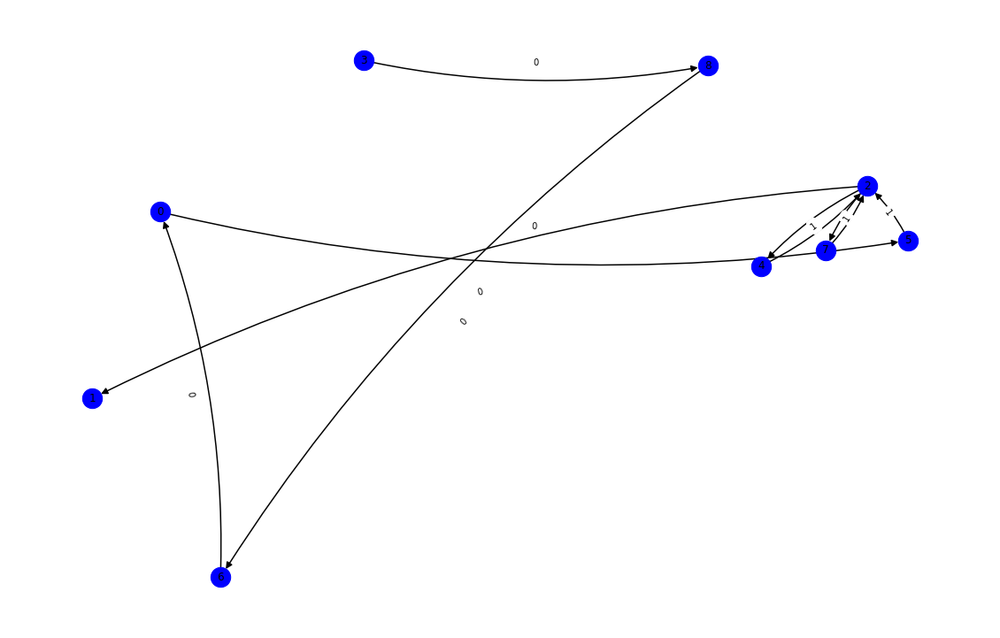

nft-id 16976
mark_dict {'0x542ac9bb878df69b3ed5f10a857a46c71ede8ab4': 0, '0xbc9759bad44cb83eff32c21682599129d185e3f4': 1, '0x2b8146b30a8dcc29240ae01a0e127f7f58505c62': 2, '0xe45c8d2457f13a0ede081b9ab20cd9576dfe1615': 3, '0xc4ed938caeb36008493aa2e327140a8a3324d193': 4, '0x0000000000000000000000000000000000000000': 5, '0xb7ff7692eef2dde2156117bd128b66e15e35a797': 6, '0x6948d7b5980e79fb949c862594a2477ca089974f': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


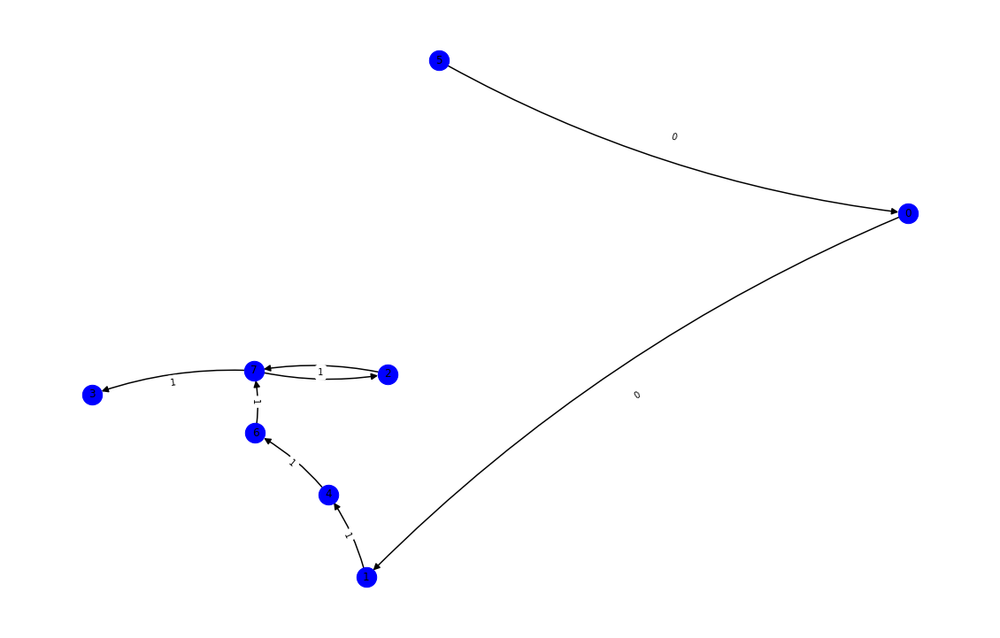

nft-id 64645
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x0000000000000000000000000000000000000000': 1, '0x766a8093009fdb2facee3a1d952b1ad79fc3a0a1': 2, '0x68cc45c405547e93dda77d6e1b62994119d4d04e': 3, '0x6b5fde7d42663751e07d154ec5504f363885aab9': 4, '0x7fb4225e90da612fc53ba65018c757aa2b04578e': 5, '0xa7b7c0de69ed9871b15d8e91cd52f023dbf8fe92': 6, '0xa2d76c09b86cf904f75672df51f859a876a88429': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


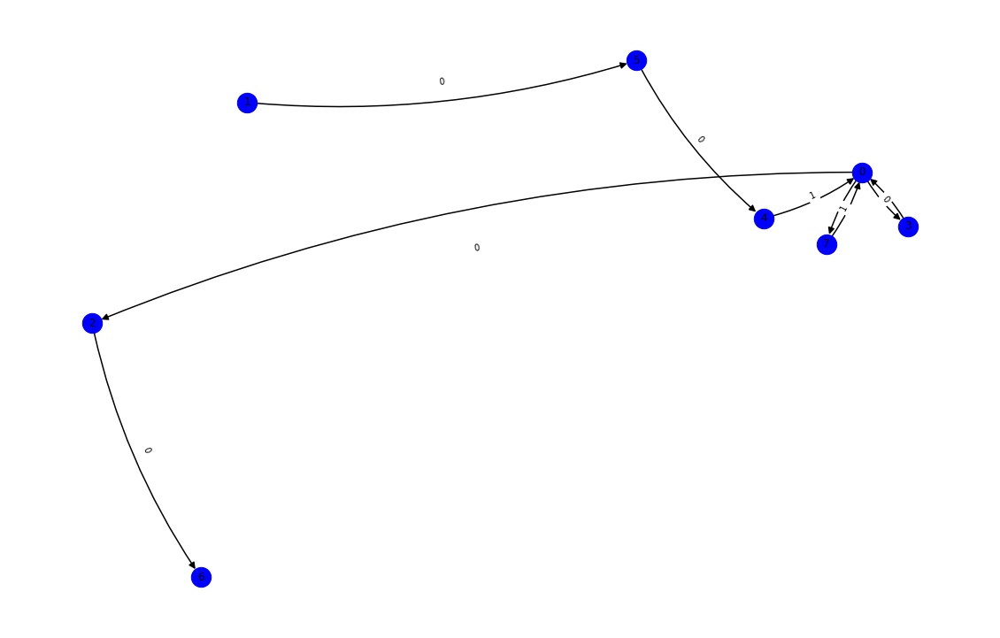

nft-id 97326
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x1acab2c15e988c9baeac25f322aa0a3d0fa80cd1': 1, '0x375ca792469d85d4010d2a271d8b354d31a3eb1c': 2, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 3, '0x74bc144bb161ca6247f2f5d2f31d7f29b2572e42': 4, '0xe749e9e7eaa02203c925a036226af80e2c79403e': 5, '0x95316d7b255e7749d6b2cc9a493d4d412a00f423': 6, '0xfcbbac6602722b2d9f1f628cc7507d9fe95b067d': 7, '0x0000000000000000000000000000000000000000': 8, '0x31feb68667a986bacfd6dfad1c8f3d10fa3fda24': 9, '0x72774e2fe1992d5da8c6e9cef73fd2ab980c0b98': 10, '0x5c5392af2c381349325d82bc03a7f40a4eeef508': 11, '0x30e99b5165bbcf066461e2b538e3c98fa8d035ca': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


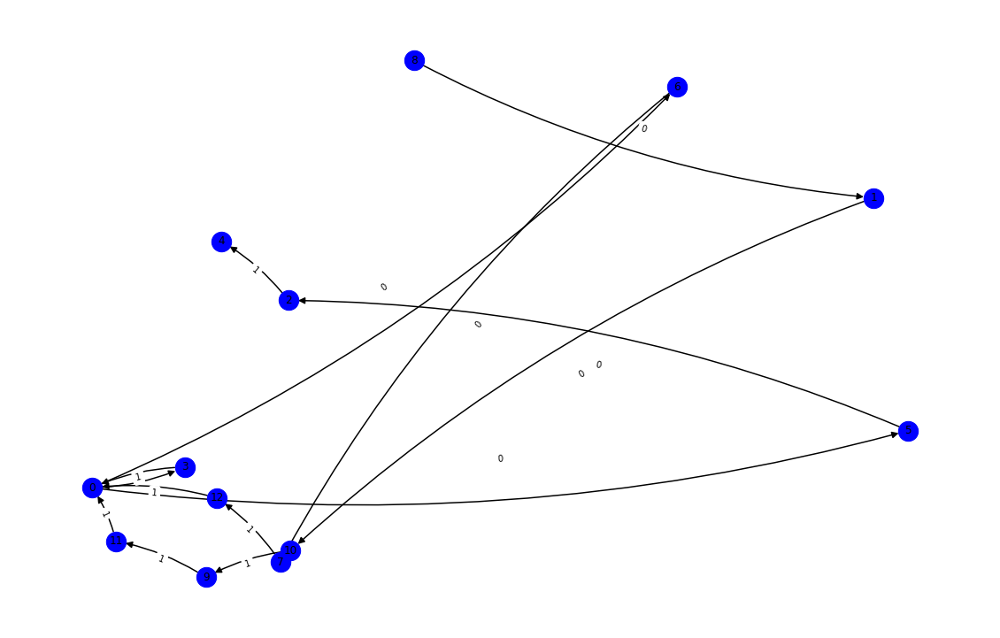

nft-id 57677
mark_dict {'0xde35ddf8211119eed38a65fcdebd48e287f14441': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0xb89d16beac18e513743baa6a6e09f60460367ac8': 4, '0x0000000000000000000000000000000000000000': 5, '0xf4954cf02bae11b0373071046e54dc84634a8a20': 6, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 7, '0x1dc6d962c7441b41a9d1c601455a71835a519468': 8, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


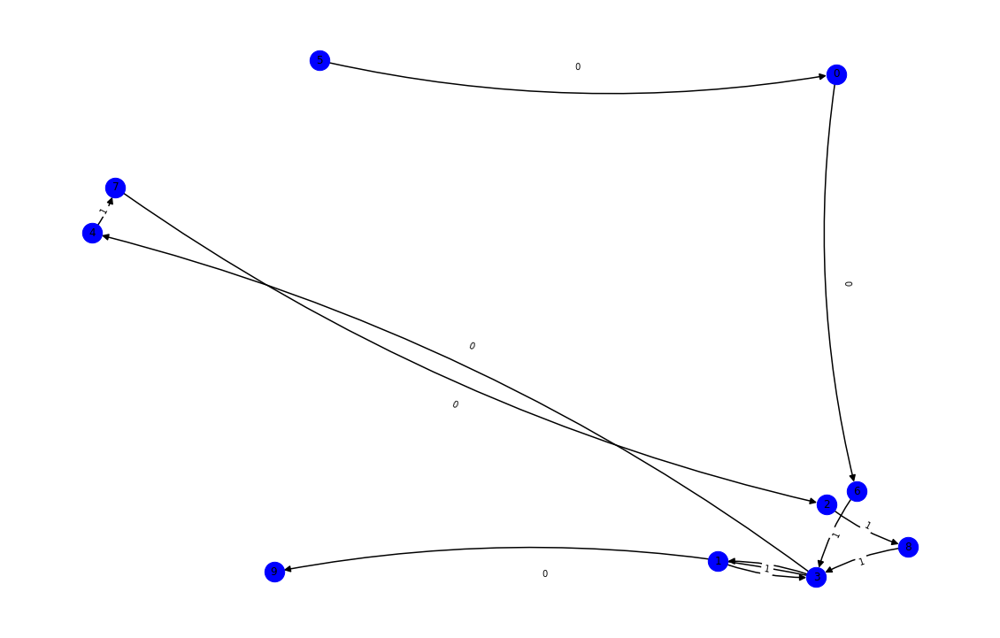

nft-id 61550
mark_dict {'0x002a99690ab1989b7971db28cd4a7673e1e6f495': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 3, '0x1058eb5261010d18cc8dc770637cba2ac164f31a': 4, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 5, '0x47b7b1b68cfd72e83c1bfa034e54e583ffb10cf5': 6, '0x0000000000000000000000000000000000000000': 7, '0xc625a0cbb392ba3dda07b01290477ade7ceb6c31': 8, '0xf0592d811a72eb64d5616a0a83fabcdbc2fa0015': 9, '0x82a3d1095b739383d874de5a1f9e9fe192a6610c': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


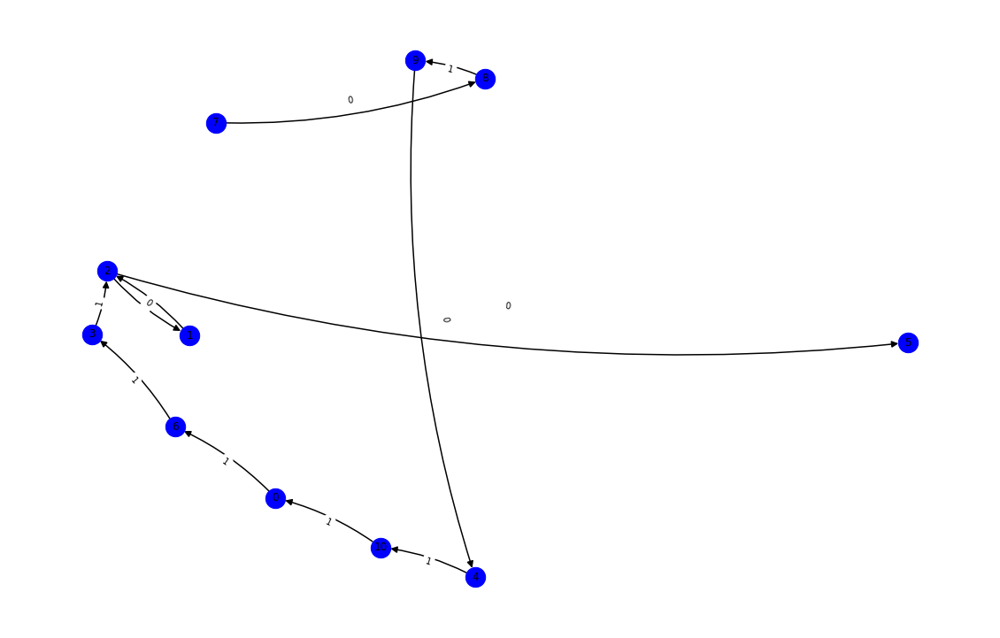

nft-id 51116
mark_dict {'0x76db1a8a8dac24b14506950ae64100a38e25f5d8': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0x49620d1f3ce8f607f9b8f5bd7295ab75785f4bab': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x13a79fdae6623cac7a87437545e5ddf81560aa5b': 5, '0x14c78ae956876763d868acdfc12bfa1565dadfdc': 6, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 7, '0x32902acd871f847af2f60a544d3f714cea681e72': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


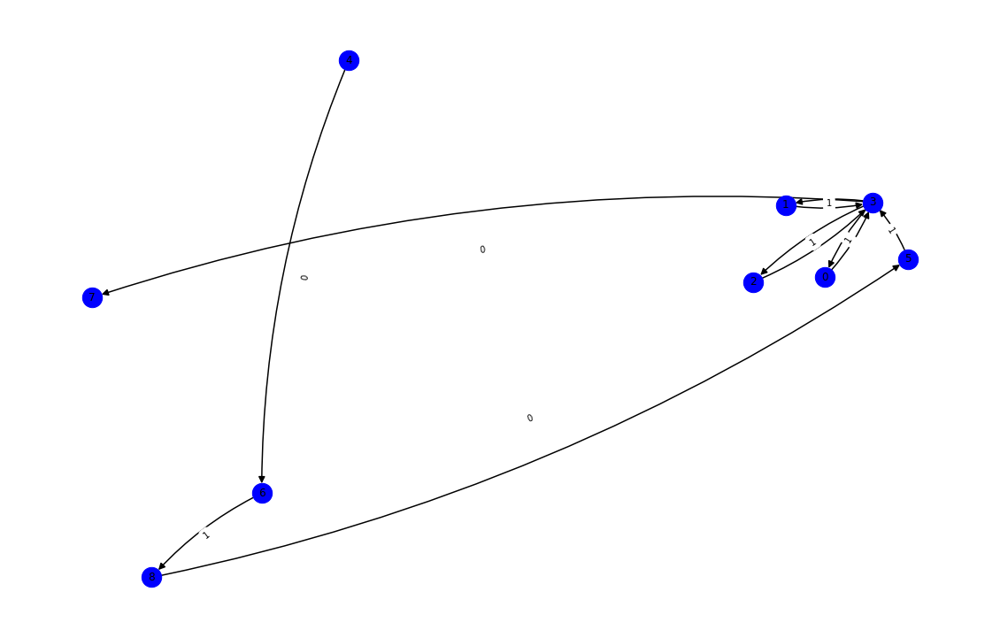

nft-id 48098
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xf1a1e0818dedc3248268fcce150d098204f40a01': 1, '0x7bb0241191b56bc8e9854732bb94e88a3078a8e2': 2, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 3, '0x6ff6ce2ca68aa1d0f74cd823ecb46ffc87a14eb5': 4, '0xdad2ff41e4661dfd88fc87e7b71a54cff9a31a08': 5, '0xd595710aedaba1d2e18bfdbab46ab796664c6d89': 6, '0x0000000000000000000000000000000000000000': 7, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 8, '0x706950294ccc9e1359be51d154aa960929ce50a1': 9, '0x010acffec14a6413b3efaab0023996559edc4878': 10, '0x1a491fc7dacae7e270bf9a116c026987d0e6be0a': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


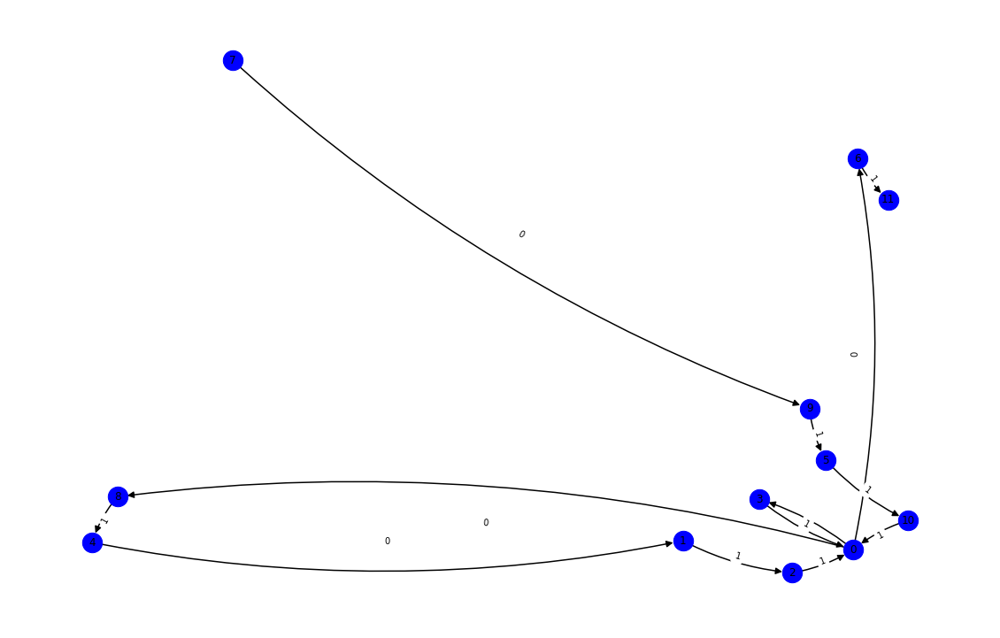

nft-id 50740
mark_dict {'0xe4fb9ca52e39b83be69e74e7fac8f807a9c16ef9': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x2e9bc111159cc4fe5479ecc81f1825cfd577e077': 2, '0x0000000000000000000000000000000000000000': 3, '0x2443047e6ac82fe65035e36e971316d981492857': 4, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 5, '0x2a31ac2204a9e19af9d453eaddd4dedd3e91349f': 6, '0xa2d76c09b86cf904f75672df51f859a876a88429': 7, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


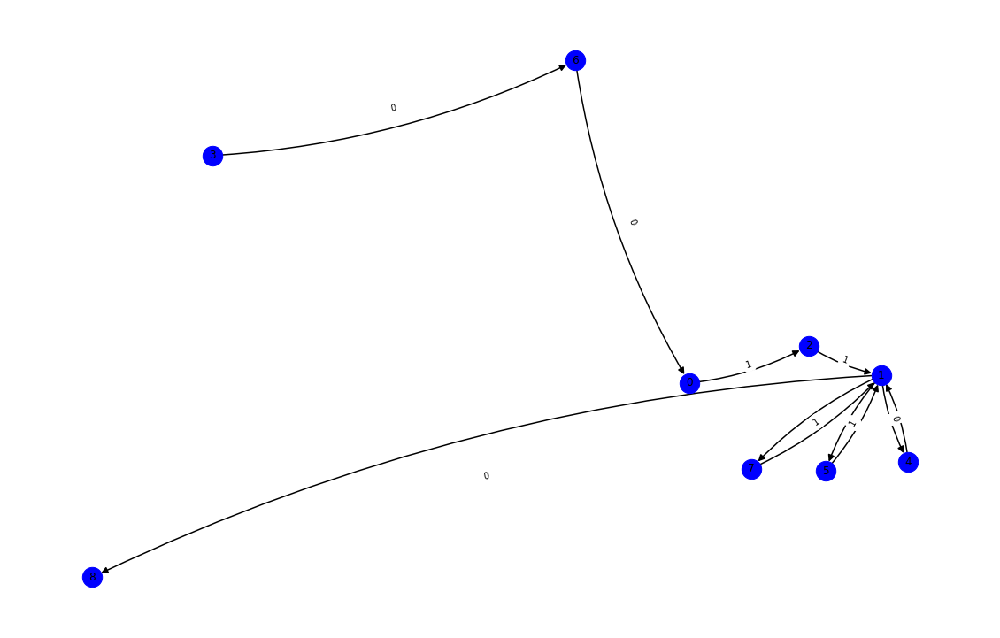

nft-id 68497
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xc474ef3f8d490b8e5d586c3d1f3a36f21a193c1c': 1, '0xd5d4aafb3b2217607e5b5b5526eb6932f8df130f': 2, '0x8951f25adcc7c3256dd9b521ed726fb587a46d52': 3, '0xbaa593844f49c01e42f3f691833905796c0d9565': 4, '0xfe44c3c56aa4a0b819f6cbc6d34229dfb0ae5423': 5, '0xf9809ea8c9abcbcaba720fe364c039fb2e6a00a6': 6, '0xaabd072f63272accbe76a227e87a9210f63102a0': 7, '0xa5b61af6bc5a24991cf54e835bdd2c0c4f41d816': 8, '0x0000000000000000000000000000000000000000': 9, '0x616413c4a4fee2d64d9f58a56b97684c0e380b37': 10, '0x9e38b6fc197295585d78eb43318e2e3c1b84e67f': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


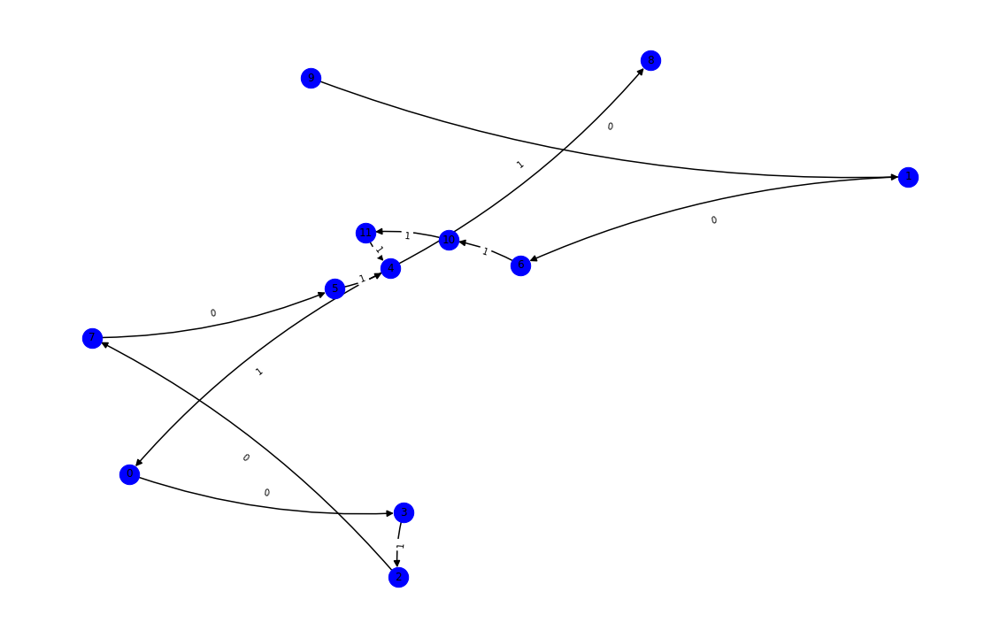

nft-id 74126
mark_dict {'0x779a7ee0d32122e82e46ebdd4b993e2192d66369': 0, '0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 1, '0xc15182dd33a1c3a04abf24a10c7d0e15bf877194': 2, '0xecdcedd08cc4d990302c297e028e1cf8d11b9133': 3, '0x0000000000000000000000000000000000000000': 4, '0xebccad906c45b5dd7003ee78da5a6899fa7fa466': 5, '0x75448866cee7a4680dc58fe846446af71f9f8438': 6, '0x9751fa1654a127139190bd3d68a2f71f4d45d24a': 7, '0x16917ab966d24812bd05823290a31b71c163c853': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


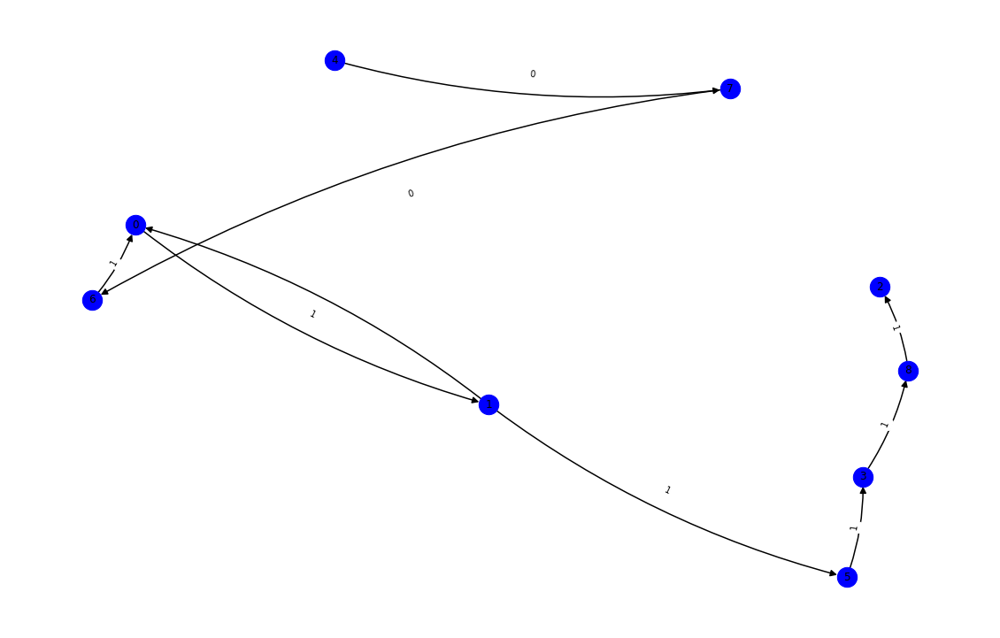

nft-id 94944
mark_dict {'0x779a7ee0d32122e82e46ebdd4b993e2192d66369': 0, '0x6278e4fe0e4670eac88014d6326f079b4d02d73c': 1, '0xe23cae36064f624d4c549ba812ab9c9cfdfb8345': 2, '0x4c47fc9583a2cd55eca27f566c02adc282b2813b': 3, '0x0000000000000000000000000000000000000000': 4, '0x8f3ee3cb30c72b3776f88721bd037c7449c7eda2': 5, '0x9c009e46101f42b4c2e6547c58ac806d8d0a8b17': 6, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 7, '0x636ba3be5ab3a03fd164327c373d6eae15b0fc22': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


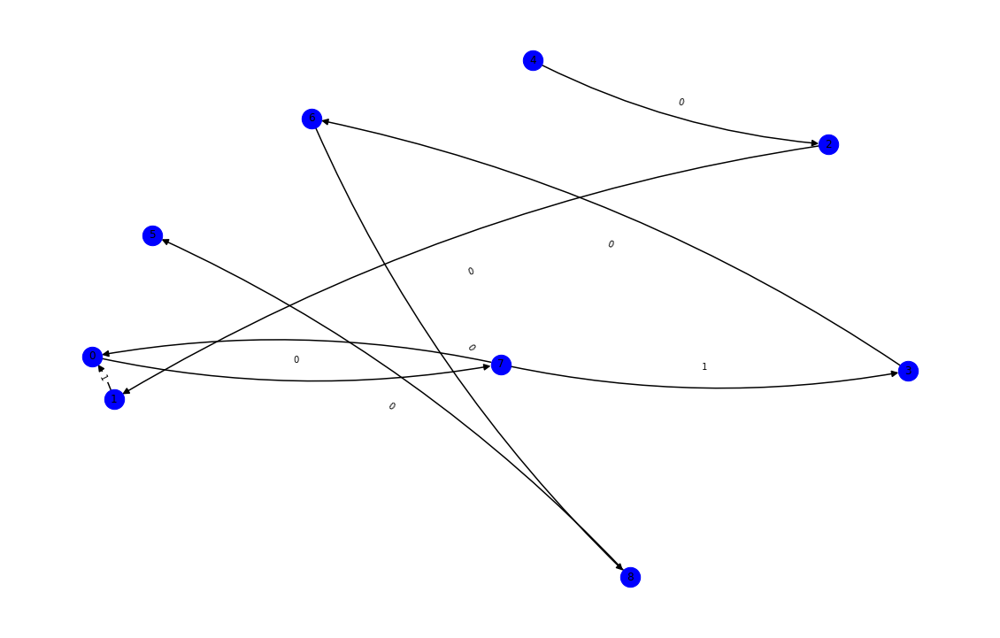

nft-id 85835
mark_dict {'0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 0, '0x0000000000000000000000000000000000000000': 1, '0xc05c350b4b5148d1af24445095644270b8ed848d': 2, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 3, '0x2161774049983dfdb9dca5d68e6468f6a5d7e99f': 4, '0x9ec8e8f64ec6bb47d944b4b830130b5fcf2da182': 5, '0x1f231bd2acc079f3a9c7ae3074479fe6b0fdb1f0': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


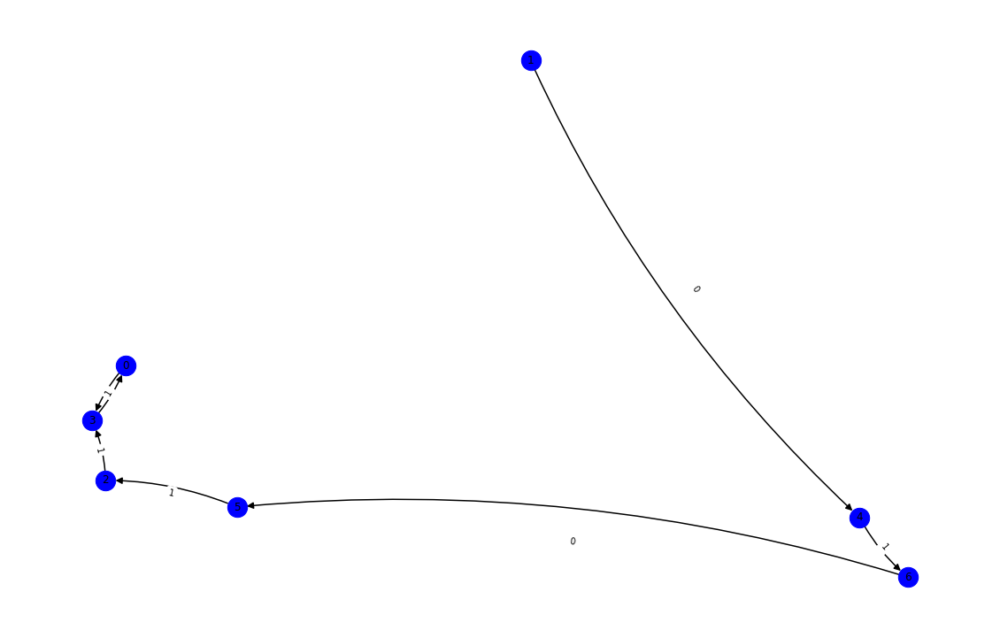

nft-id 64380
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x632e930daecc922cdb88039fd50ad8d0acf7e0d7': 3, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 4, '0xe1cdef1e0fb87ecbb4cc7b33e7c7996ae25fa262': 5, '0x46310e23b762017e29aea12f794258828a0422ca': 6, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


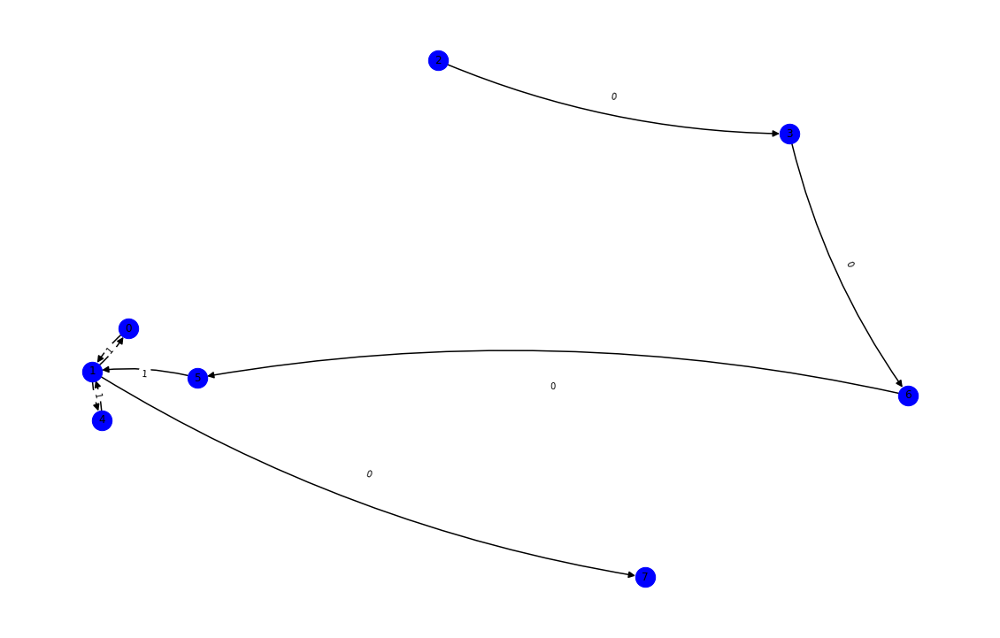

nft-id 48220
mark_dict {'0xf661559e597cc405ace81d6e9c7b4cc5a7d70e8e': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x2443047e6ac82fe65035e36e971316d981492857': 3, '0xd3647b9ea840d137adf6f2dc63856bc7c0816c19': 4, '0x6f5caa2ae52432d2c680665a5cc68ee411790386': 5, '0xf48969bc496d4d7a262f3988c9d3d8230dc90462': 6, '0xc35a5fec6be6957899e15559be252db882220b37': 7, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


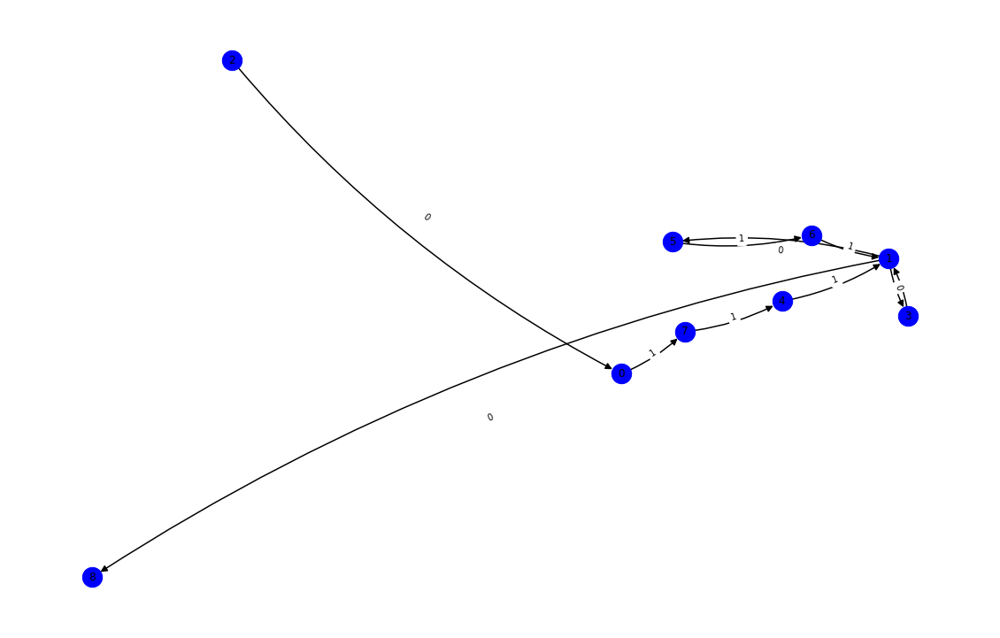

nft-id 75254
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x4ce4fe1b35f11a428dd36a78c56cb8cc755f8847': 1, '0x4400b0a962e3a50726bffaa138e2fdfbcb5caa32': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x3f077c5ad15be4253a4a333cb357a26e700765f2': 5, '0x76ade2f654eb9490275114310fde8dac0d0eed87': 6, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 7, '0x360a2e77a038f4806e8b42508039efcfd4b33fe0': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


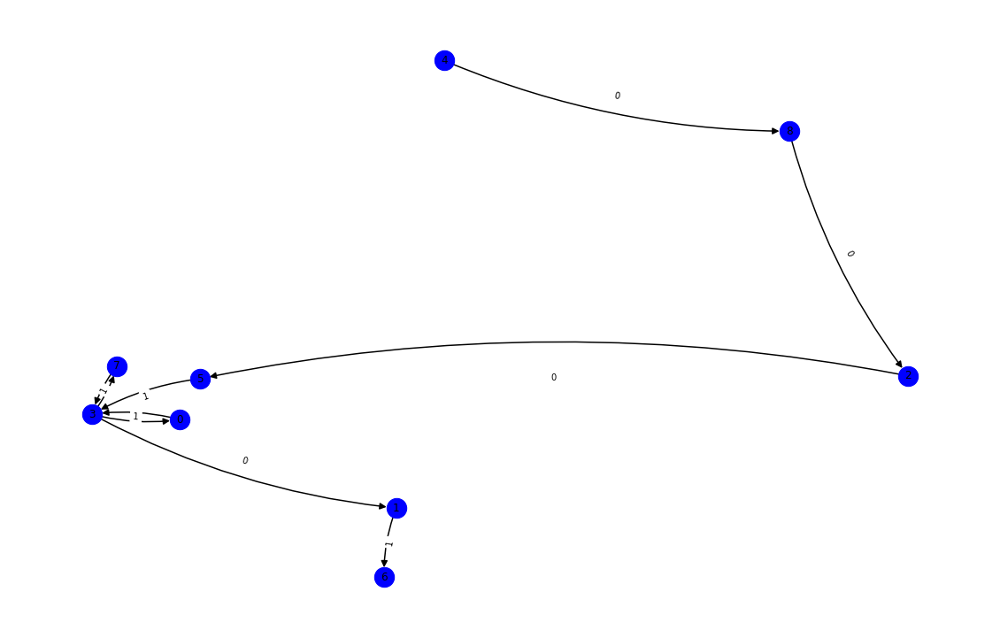

nft-id 86054
mark_dict {'0xc693b456f8668c72995caada6247667fadbc584a': 0, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 1, '0x4ce4fe1b35f11a428dd36a78c56cb8cc755f8847': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x7f486d222c2ce0d1fa51be7a6f48a633bfa88918': 5, '0x76ade2f654eb9490275114310fde8dac0d0eed87': 6, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 7, '0x743cd810672d78f7a5855631f38291db755b5fad': 8, '0x1bb2e3825bf8b34b9879f253b371ad6edfff9e84': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


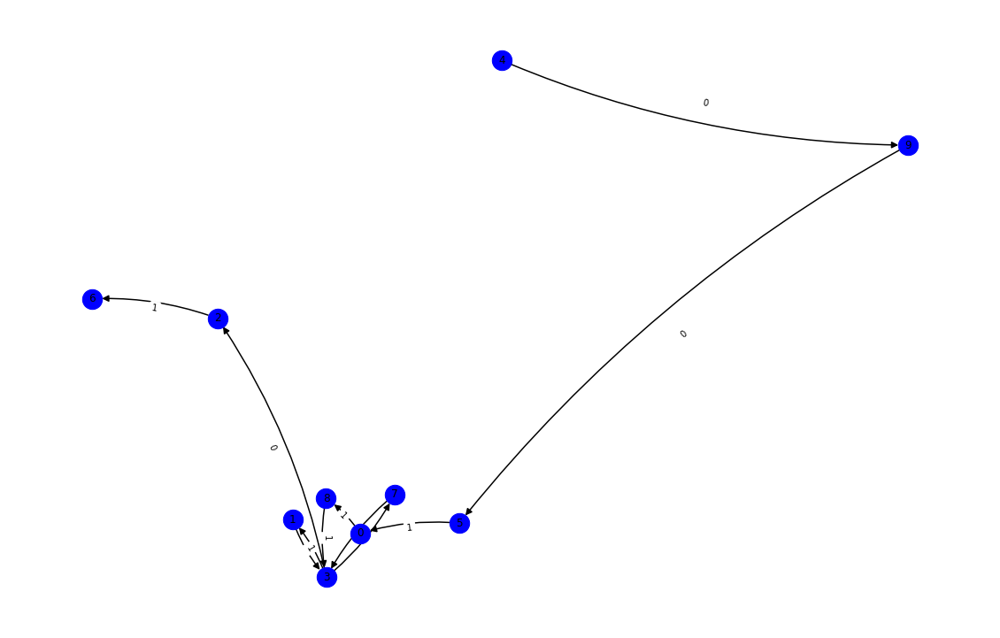

nft-id 97996
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x8cc2941c541e26634ac4d0575480314ae3e068ce': 2, '0xaa114724f2bcbd859d01585435e3076671314d2e': 3, '0x4ce4fe1b35f11a428dd36a78c56cb8cc755f8847': 4, '0x87e4e2733ba4e4c362027e06258988b34c1876e2': 5, '0x273ab9d456cb69f8a435131ab8d2f70a1a8ccc40': 6, '0x2af4b707e1dce8fc345f38cfeeaa2421e54976d5': 7, '0xcf265df89fd073c5703787dcb895f7d7df858993': 8, '0x0000000000000000000000000000000000000000': 9, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 10, '0x9a5937192629d06bbf553c41ffb3bd30fbbd1115': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


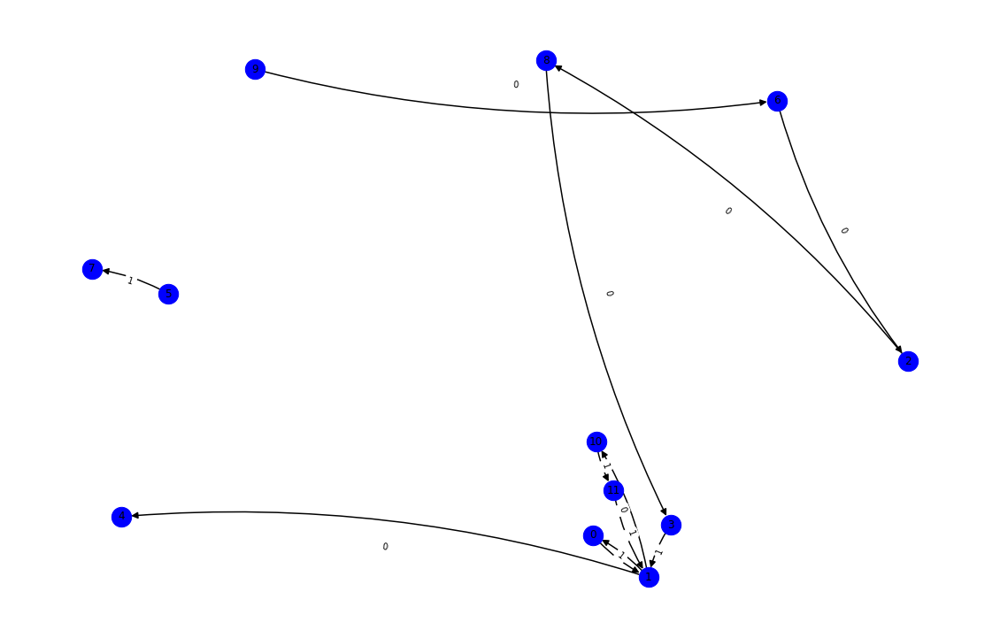

nft-id 91169
mark_dict {'0x15e37293bcd44422b60c227568cd58403dec3e5e': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x6a4c69e7a436cff5f93a758726d0d057a9508711': 2, '0x8c7844970c6b7fe7362fe716bc3ed071b4da988a': 3, '0x0000000000000000000000000000000000000000': 4, '0x27fc1a050438ab36a3a060e54a53bc0039120c0b': 5, '0xcfeb3ee1f22b2e1be64a9bd1a4872fc4e7a0a835': 6, '0x9e69b59b8d2a094cb1117f92ff7dcf51ed467b41': 7, '0x743cd810672d78f7a5855631f38291db755b5fad': 8, '0x588df11e61f2f378bd1d2c6d70e576b729cc02e1': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


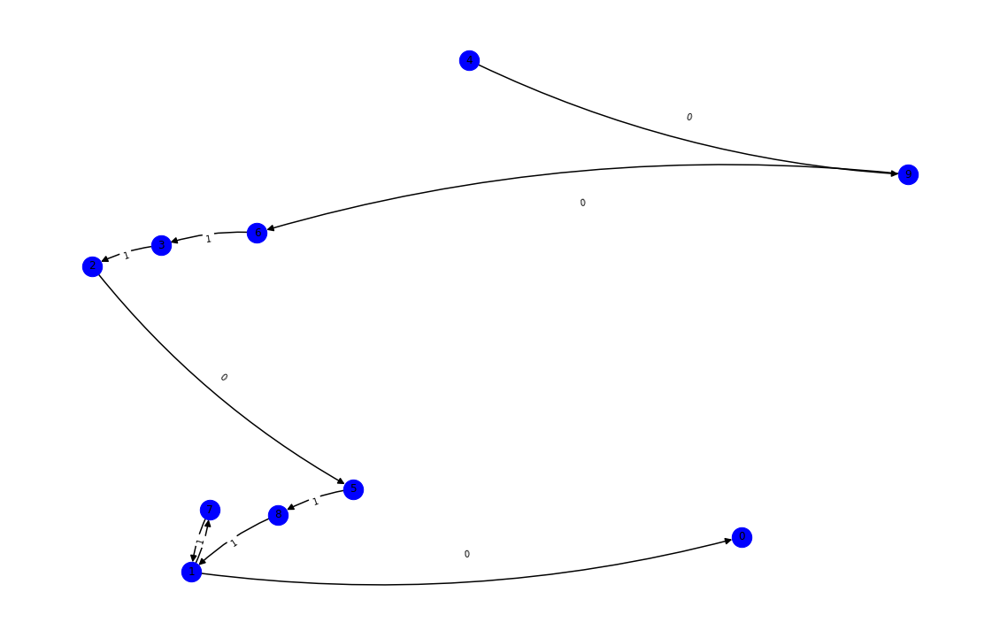

nft-id 58656
mark_dict {'0x13d5e6ebfb8e4a95a872ae13290b295f4e2c93ac': 0, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 1, '0x725e17f5a6d3c18c69ce51aa334f81d45cebf102': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x26013b787aac632a92483f669e2de85103ad2536': 4, '0xbda10cecb6eeebd0d82b47e629fd139fe2f81b02': 5, '0x0000000000000000000000000000000000000000': 6, '0x616413c4a4fee2d64d9f58a56b97684c0e380b37': 7, '0xeb6af7d194b44014948fe7e4a419b523b8a60d00': 8, '0x9a5937192629d06bbf553c41ffb3bd30fbbd1115': 9, '0x0fdbeaaff0f0fa014d49db386d356ca9f705347b': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


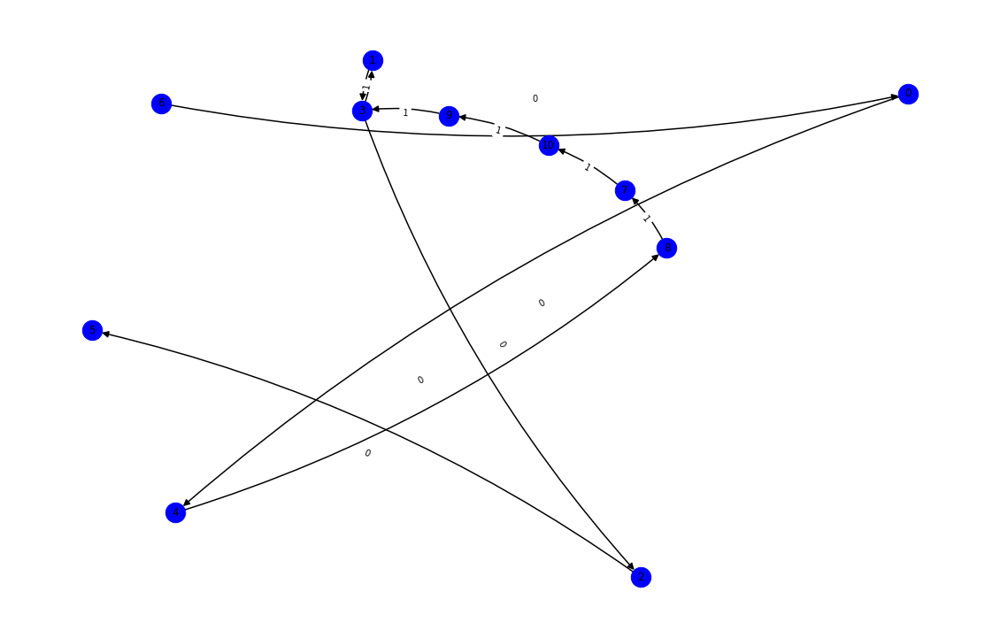

nft-id 96180
mark_dict {'0x76db1a8a8dac24b14506950ae64100a38e25f5d8': 0, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 1, '0xbcaeef67cb9448cb7646e3c79bc409a00b556dbe': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x15efd2c647bc17dfc59ee9790240a8d71a515db4': 4, '0x0000000000000000000000000000000000000000': 5, '0x40975eebca83f326e2278802a9a8459867d02542': 6, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 7, '0xc14480bd7bb6d36377c75286b80452654f5b7a79': 8, '0xe50a8680b769c895c15f425ece27329ebb2e0012': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


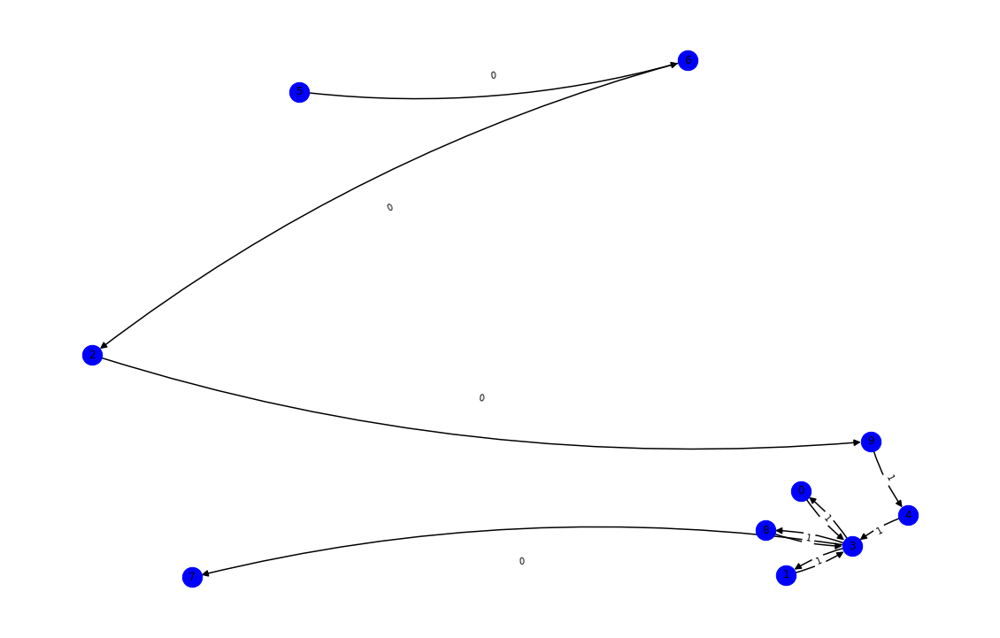

nft-id 63487
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x60251579f5d1be1483ecac3519c9f0515dd9e023': 2, '0x0000000000000000000000000000000000000000': 3, '0x70743d7720e8dc1546d51e08dc122da33a7f5e61': 4, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 5, '0x8c26396808d07fc5e6797979ddc5fca9dfce58dd': 6, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 7, '0xc14480bd7bb6d36377c75286b80452654f5b7a79': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


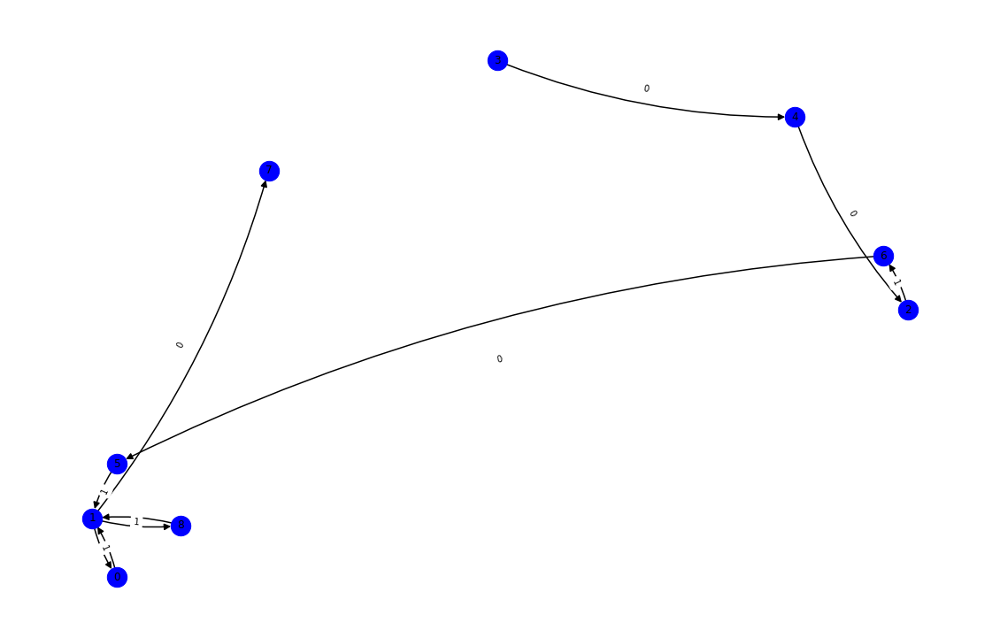

nft-id 91008
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x18d82cc691754ea6db4018004de61fce8a63f392': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x67eead269d2004a0f845dfe335a059c39c7c989f': 3, '0xf3489e606e5c9b18388ba096a71e6dedec74bee9': 4, '0x0000000000000000000000000000000000000000': 5, '0x011915c4930a42c6e9876ac0439abcad77899a5d': 6, '0xb66402f8b0c8116c7977873ed83cda1b9f604179': 7, '0x948a9c053cc2525d2f55a940b8de7c7177523d81': 8, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


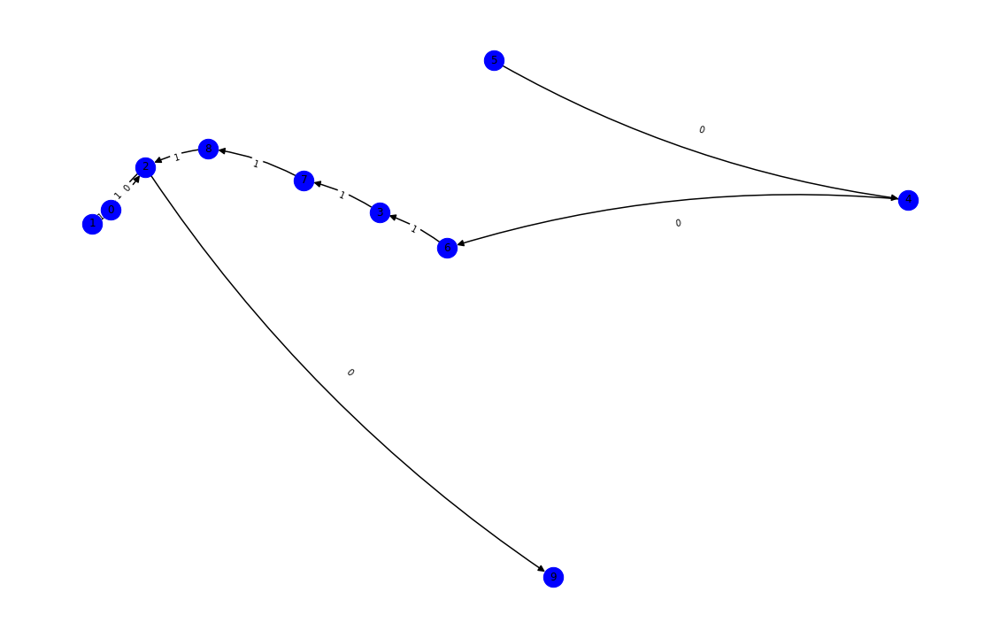

nft-id 88490
mark_dict {'0x50a8abc19fdfa6385f83bf3cc9c39016fe9b3ab5': 0, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x000d9b510e3a2c92bc6a79920fd2a9a699025d9f': 4, '0x3a69175deb3fd7d4cca55b9f8ea4da9b819b79f2': 5, '0xbe063b35610d72ba229687af82e60e9ba387d68f': 6, '0xa93e87c7d026598d8706dbe46a0d949848a2dd2f': 7, '0xa86accaec249da876240c786c30dae4602191504': 8, '0x428962848736afb8c671d3e074343b54842a1a7e': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


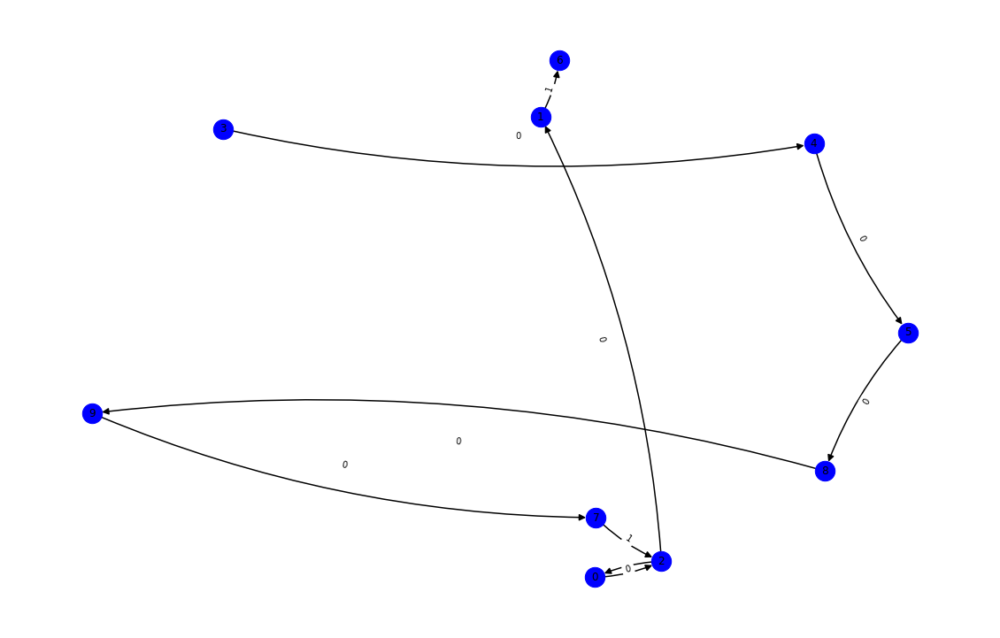

nft-id 53957
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x493a401122d858324517c5ec95145dc970c2c363': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x29e2cfa294f5c67d86acc65d55ead102af973a60': 4, '0x19904955198dc6cb7bea0f7dc93959d8acf4f2c7': 5, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 6, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 7, '0x54b174179ae825ed630da40b625bb3c883cd40ae': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


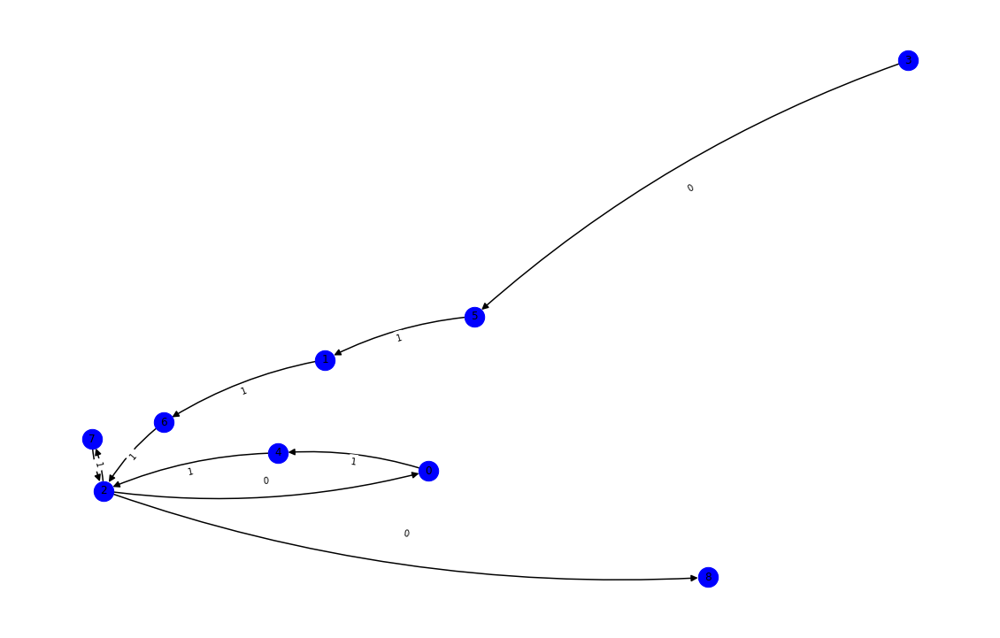

nft-id 49035
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x0af691f5533c2d1fbeca5cb86705307f225f8bd3': 1, '0x424baf0dc5734ee44a26b366d25ce944bb4fa527': 2, '0x0000000000000000000000000000000000000000': 3, '0x67f7fe4c81fd36b27ee7dfd5c9e9508942e1c56a': 4, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 5, '0x54b174179ae825ed630da40b625bb3c883cd40ae': 6, '0xd7d9b49a30c4960b10a63159656955dd6a389d9d': 7, '0x8aabdd3ecc87f99dd35b4030df1ac910d9b0587f': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


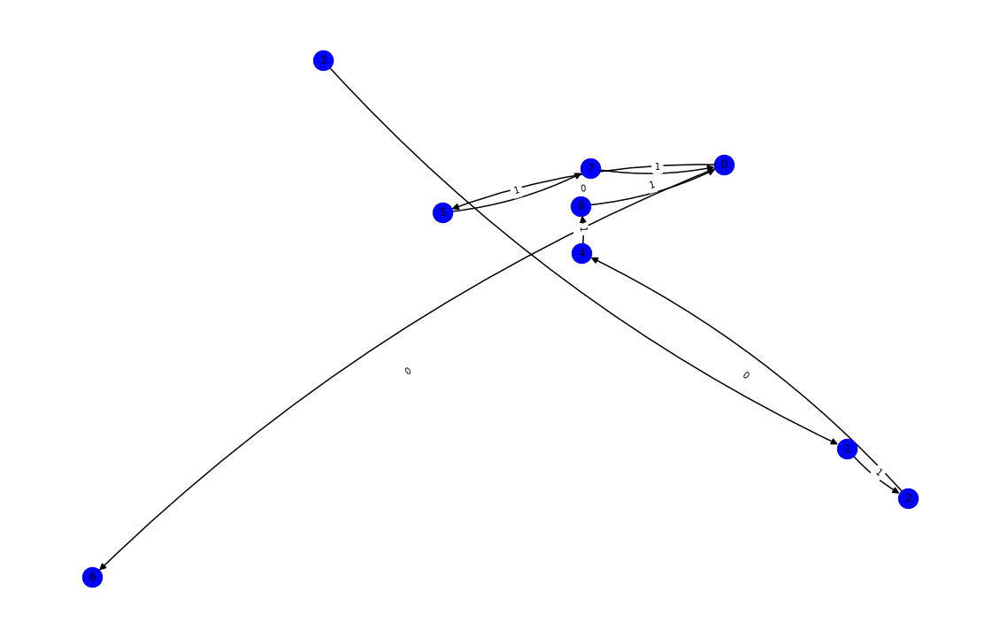

nft-id 48427
mark_dict {'0xceee247c09b2a31c2959dd22d0d3395055070874': 0, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x5facc5eeb5163e55fdd8b59df3c8649082ba68ac': 3, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 4, '0x54b174179ae825ed630da40b625bb3c883cd40ae': 5, '0x08fa4b531849bd736b978e20b75999ee238a068d': 6, '0x823dc685e777a7523954388fa7933da770f49d42': 7, '0x0000000000000000000000000000000000000000': 8, '0x29e2cfa294f5c67d86acc65d55ead102af973a60': 9, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 10, '0x23819f5596942e3098e1f924445eabcc79f7a40b': 11, '0x743cd810672d78f7a5855631f38291db755b5fad': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


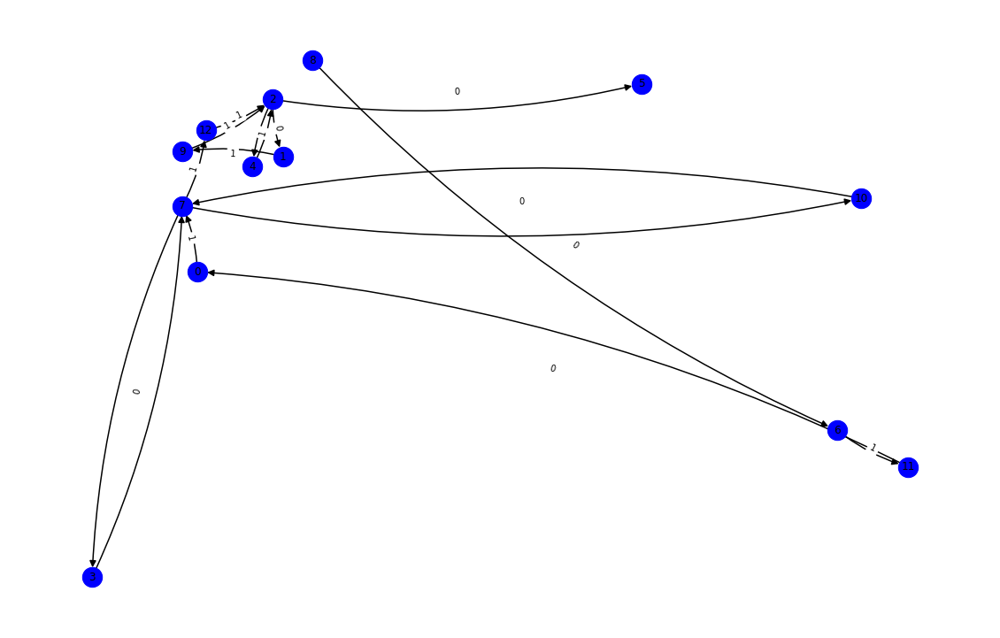

nft-id 61448
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xa01c0735c7ca5f8efc1e63efa5f2d1c4fc1a4714': 1, '0x6c56398b111e278d2c28015ab5f5ca023cc5334c': 2, '0xc1d4b3eef3843e8807654f7cdc8935fd77486a31': 3, '0x7bb0241191b56bc8e9854732bb94e88a3078a8e2': 4, '0x65217c49f9f1c4b5d468bcbf2942310cff530df1': 5, '0x6042860f24582c59fc8c0b8018bf4e0518aafa3f': 6, '0x67e23849bb29c304381a578bc9ffbee9dd7f869a': 7, '0x0000000000000000000000000000000000000000': 8, '0xbc319dc9cb2847f88f86bfe0e7f8c848dd8f6984': 9, '0x0179b61349ffab4cec332a5ec57375c9c9c49692': 10, '0xdf7d0f10415053a5595b82399f55951ba1da847a': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


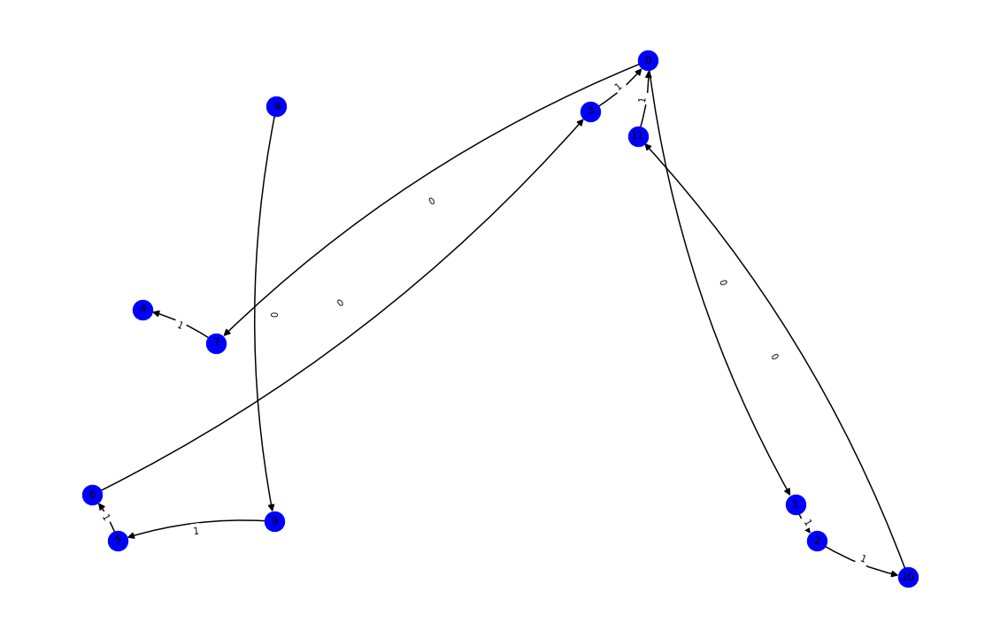

nft-id 63175
mark_dict {'0x5b32d7ea1793085e6433fb487fdb0ab56e599cd8': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x7a9dc8eeaf5022cecd60c54a042343484ce6c065': 3, '0xb0ffc78c832d2cf7fcc63f79238fdd720b5cee35': 4, '0x3b0a5f022d0e0b43d0b74f961dc7bd236b919205': 5, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 6, '0x8504044c21effefbb4c6b8a4a1bfe6bd45d9dffd': 7, '0x2e0dad2eb999e8eb7e024efce3c3ec7915bc3d99': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


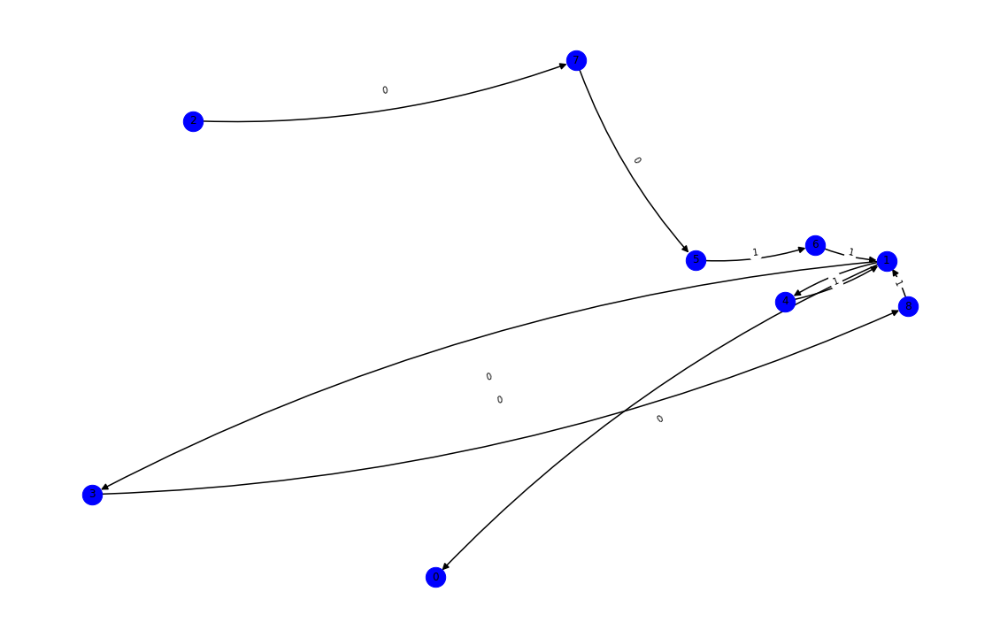

nft-id 66133
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xd5d4aafb3b2217607e5b5b5526eb6932f8df130f': 1, '0xec6c696cfef8b8bd0d5a4639a5e2cddd01d7cb46': 2, '0x857847ecff42d28abe7f421074e45877b8030cdd': 3, '0xfe44c3c56aa4a0b819f6cbc6d34229dfb0ae5423': 4, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 5, '0x29dfb6f7e67dcc7b4035bff2c0a191d19b037134': 6, '0x8ae57a027c63fca8070d1bf38622321de8004c67': 7, '0xaabd072f63272accbe76a227e87a9210f63102a0': 8, '0x0000000000000000000000000000000000000000': 9, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 10, '0x091d7906b55275a4e3e417bac958c680f77a75c9': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


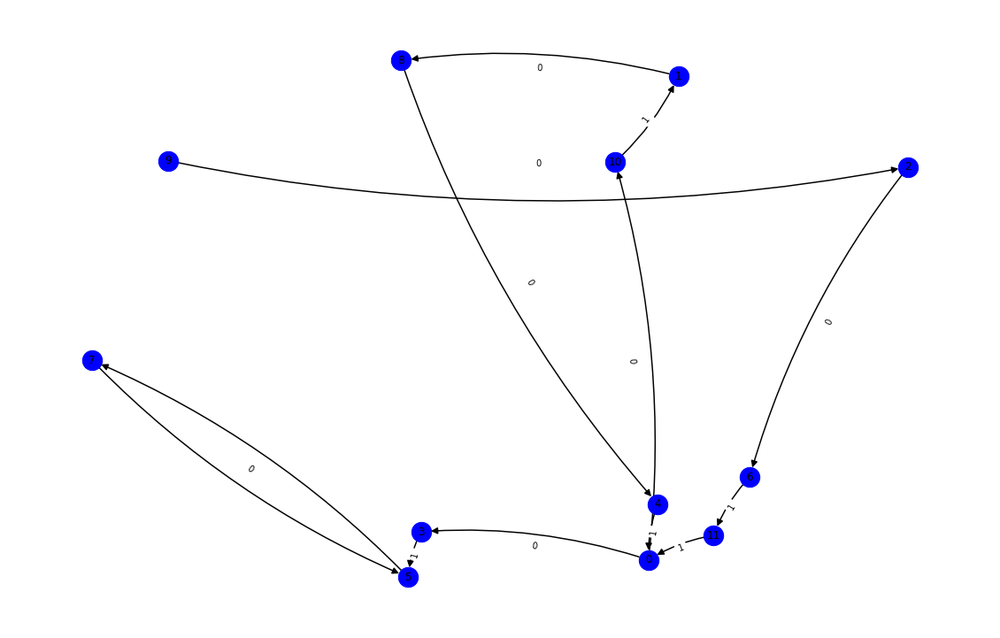

nft-id 49378
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x549d4dd35f93f653292463fbc80c77c5928d1706': 1, '0xc05a13b5ff22a6d06da9d0d566816255d0974118': 2, '0x857847ecff42d28abe7f421074e45877b8030cdd': 3, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 4, '0x8ae57a027c63fca8070d1bf38622321de8004c67': 5, '0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 6, '0x0000000000000000000000000000000000000000': 7, '0xbadbc8670c6d4b2d28b4240714a3e720a96ece12': 8, '0x29ad4b5132d517f5ba584118a203c21367269bf3': 9, '0x67b46bd09d1671faaa0dbcaf0ac278481ccc591f': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


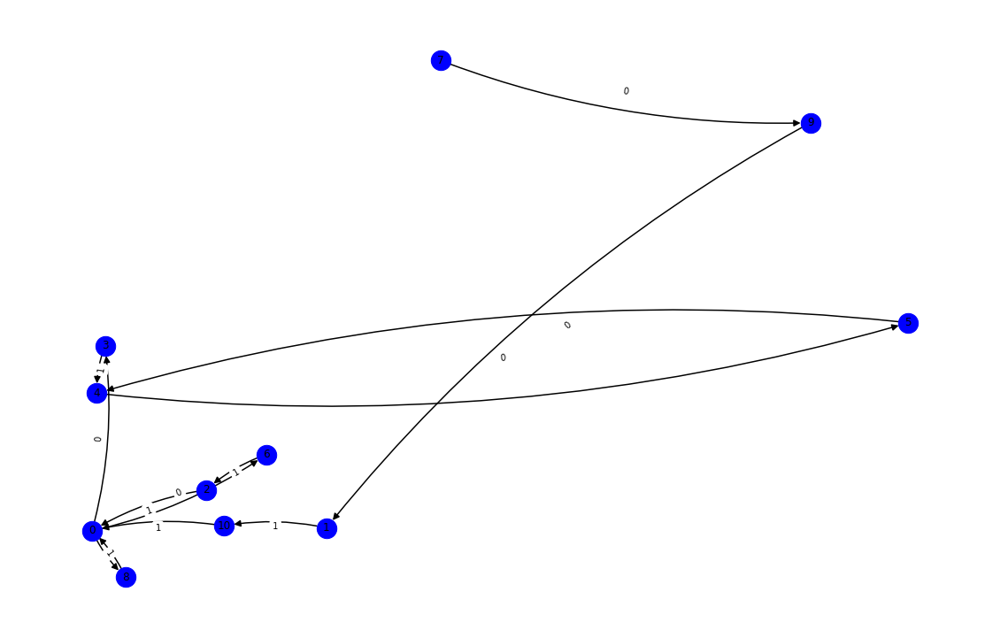

nft-id 56816
mark_dict {'0x5bfae7773802763fb560cde747b7a4a8a54b1d8f': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0x98f6d93ba4f14517d3655f4481118182200d1d59': 2, '0x43bfbe316733552db009932506f0c23eee762022': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x0e616785638663c88a493a82972e2f9cadaab4bc': 5, '0x0000000000000000000000000000000000000000': 6, '0x1a86c1b2727cb9f5f077b47314312bb036f1a0cb': 7, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 8, '0xaf68923be88253d686d6c0b6e23e2fb70f663dfd': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


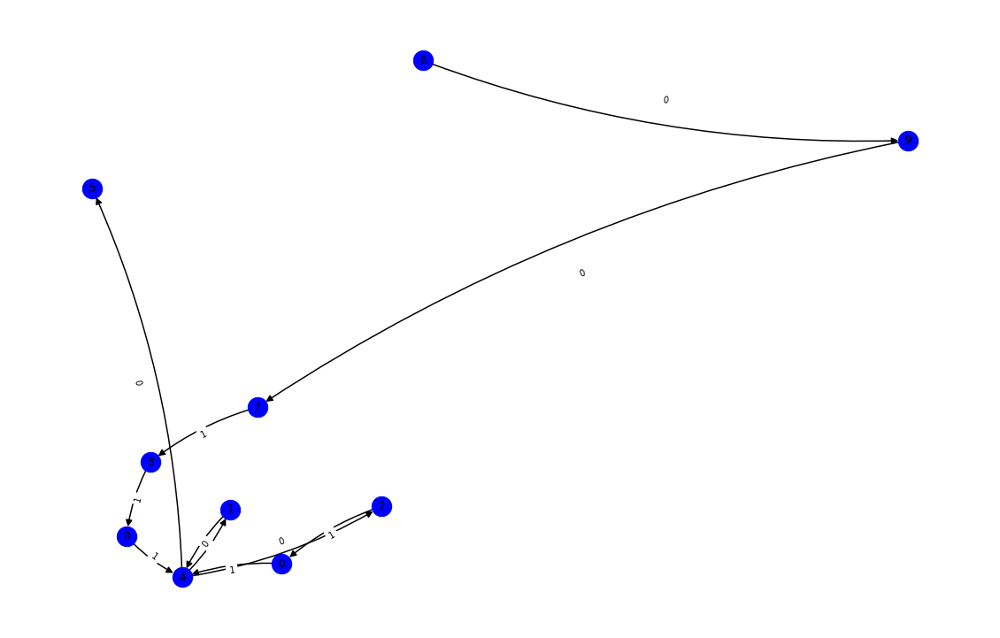

nft-id 67806
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x6453a5733c4f03a5d290082a0d0aed5e876404c0': 2, '0x46f80a5db95b06e8d2b9de6f391557ca155a6038': 3, '0x5bfae7773802763fb560cde747b7a4a8a54b1d8f': 4, '0xd9a1530821795650e10348cd87f13feaa009b963': 5, '0x0e616785638663c88a493a82972e2f9cadaab4bc': 6, '0xa58351869a34e8e0a2e529172584f6da58d4b3c7': 7, '0x0000000000000000000000000000000000000000': 8, '0xc6e18aa1082a49c01bfc73e2de2ebff80d513af9': 9, '0xa49cee842116a89299a721d831bcf0511e8f6a15': 10, '0x9a5937192629d06bbf553c41ffb3bd30fbbd1115': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


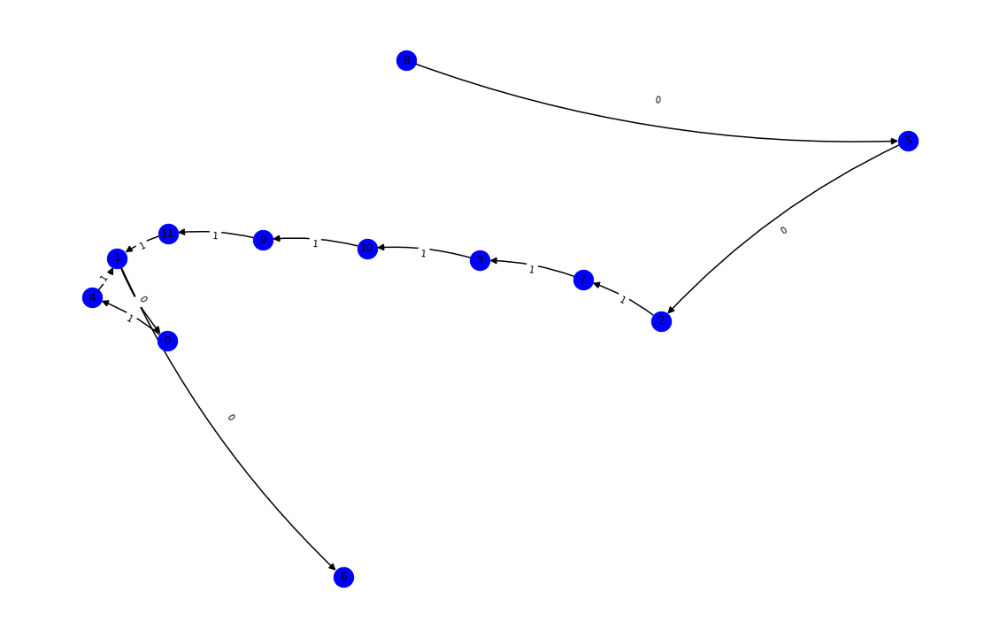

nft-id 56508
mark_dict {'0x1ab6769a6289465d827567cdb05e07b068598c21': 0, '0x4188bc2923da8c0875be37ec8b3a58a47abe49ff': 1, '0xaabd072f63272accbe76a227e87a9210f63102a0': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x2624e6bdce94156695330a43617de537518052f0': 4, '0xd5d4aafb3b2217607e5b5b5526eb6932f8df130f': 5, '0x0000000000000000000000000000000000000000': 6, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 7, '0x82b2164dc8fc04b6ad7d518e9aebdb604d7d949c': 8, '0xfe44c3c56aa4a0b819f6cbc6d34229dfb0ae5423': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


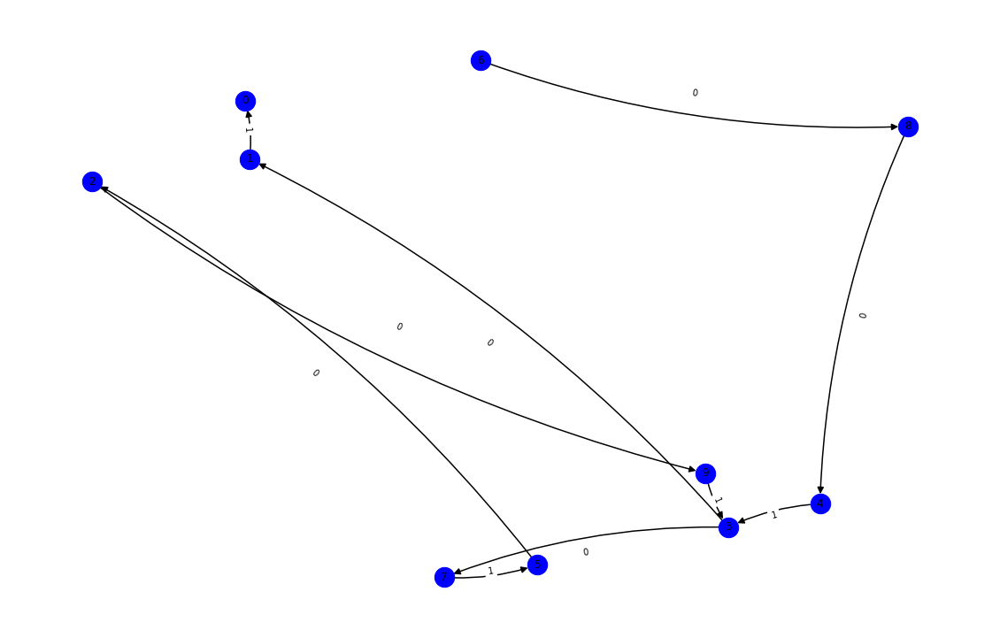

nft-id 85423
mark_dict {'0x2a5434f33d621331552e368f8e5b685d6d055588': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 2, '0x782b4c1038004794f67dc4972ee277d344716c0c': 3, '0xb0f37dcd30350853b304a1e77db11a45323eaf19': 4, '0xaf0f4479af9df756b9b2c69b463214b9a3346443': 5, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 6, '0x1e094ed9dfe65b02fd4dd14c046ac6b413d383a2': 7, '0x2d7dc552a63534563e28a5a79cc618989052ef4d': 8, '0x0000000000000000000000000000000000000000': 9, '0xe2ecdf7bbf1f2e19389c75e38a708872d3790128': 10, '0xb700823966b8b32152dd286e487483c9c4bdbe25': 11, '0xc2d0c8f362b3a4aad9ca4220996b9b725b3c8327': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


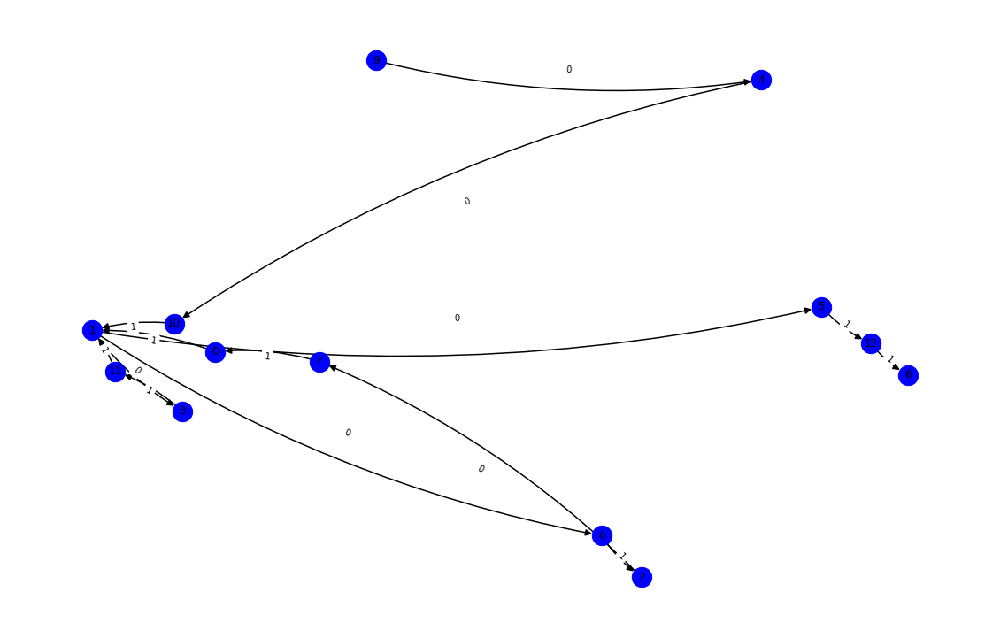

nft-id 58074
mark_dict {'0x206f1c6bdbdf297a361db451292499f0485d95d4': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xb89d16beac18e513743baa6a6e09f60460367ac8': 2, '0xa61f21e490cadeec26d48e1bfed6393b753420a9': 3, '0x0000000000000000000000000000000000000000': 4, '0x2443047e6ac82fe65035e36e971316d981492857': 5, '0x5168895228e49c785d3d77a4621f076403da79a0': 6, '0x84da4dcaac3287cdcbf50f70865143859dd15626': 7, '0x326b6883ba138c9bfdb9443611e54f33685a83f9': 8, '0x7b20b63b521e6da65241e5167b22ed0f607f1bd8': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


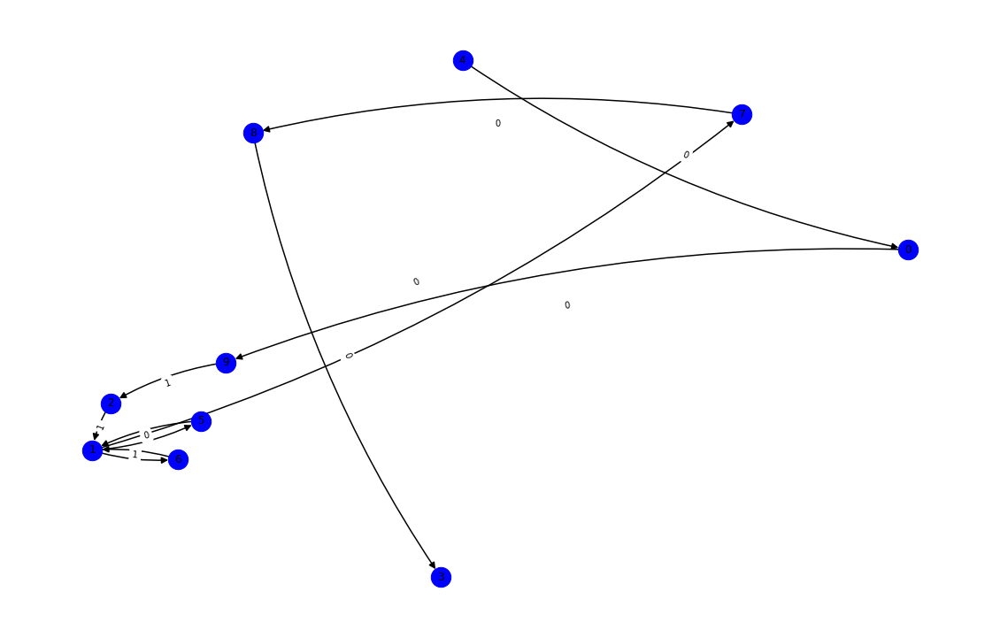

nft-id 54544
mark_dict {'0x916af1f7156e5abeb49be7c13bfffe75bacc916b': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x4400b0a962e3a50726bffaa138e2fdfbcb5caa32': 2, '0xf8e1c28b6ca22632498f88393e3b9e0b5e14cf6c': 3, '0x0000000000000000000000000000000000000000': 4, '0x3f077c5ad15be4253a4a333cb357a26e700765f2': 5, '0x0f4b785e8e2e38cb34e8bc52338f26ec6a88b4fd': 6, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 7, '0xd5d2ad5be5f03e51b6dab3dc301424a4db06d271': 8, '0x9e84c62cb7c3c93f59aae1eb4c756d92c759809e': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


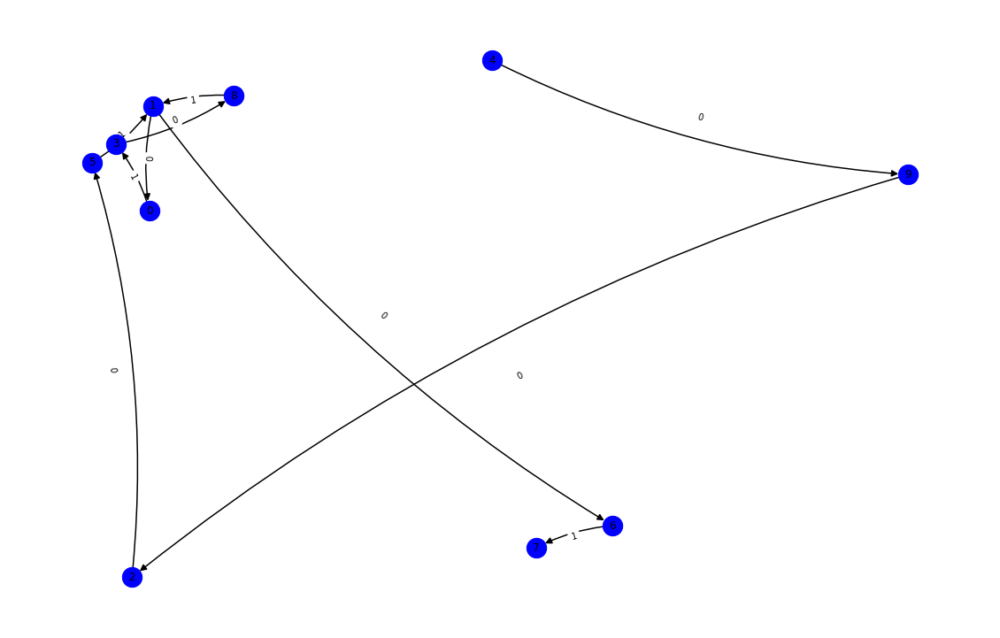

nft-id 56360
mark_dict {'0x4add85892f15b13d407bae215ab1fbec88487b82': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x5d23b4ea39e274b23fdea9bfdb57b032aced47d4': 2, '0x0000000000000000000000000000000000000000': 3, '0x4a35a755742af6091afffeb9ec675de3e1ae8a72': 4, '0x9250f8149067fc068189f95e92f0eea9673f62d0': 5, '0x705a707434405b325f54a307559334e675af0ecd': 6, '0x51d013b31d541da592ba6f536ac8986d141008ca': 7, '0x7a4fdef53aa293334eae2467936b17c94b133880': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


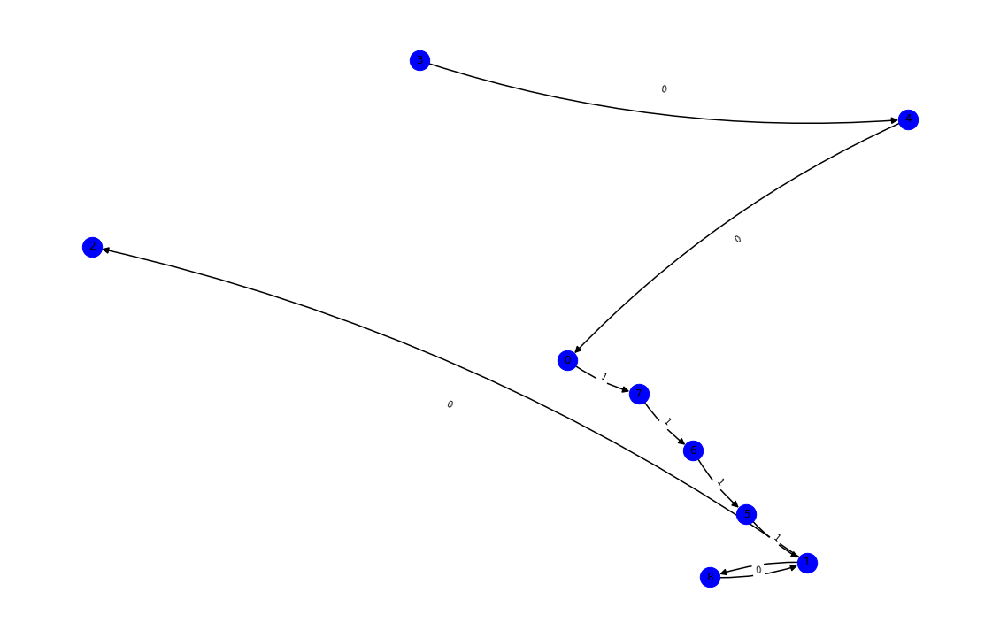

nft-id 78541
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x5629b2a346a466c0d07cbdcfecdb6a3bb7d68ca5': 1, '0xf9ba081312498ec9e52e922f65d381084b616862': 2, '0x98adf4982e0059aae0ec70e1e742a7f3476e63a0': 3, '0xbaa593844f49c01e42f3f691833905796c0d9565': 4, '0xf1dfcc615484bf4d7ccb06093995487f4938dd91': 5, '0x2f38afeb3e70ee5005e9dc8363581527c693ad7e': 6, '0xb6f6b9aa69d6dfd8039b35f0c49463f27696d437': 7, '0xac671b03ce1c14018f99da62802e79c44e93c8c5': 8, '0x0000000000000000000000000000000000000000': 9, '0x2ea5c9f2bcc7d4d3f3616d4a11ad86b4e377f342': 10, '0x05adcd963e321d54cea057e659b36dbfdc2b4b85': 11, '0x47d3f20576edc2024d2c3d9cc263a60ad7ef3f76': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


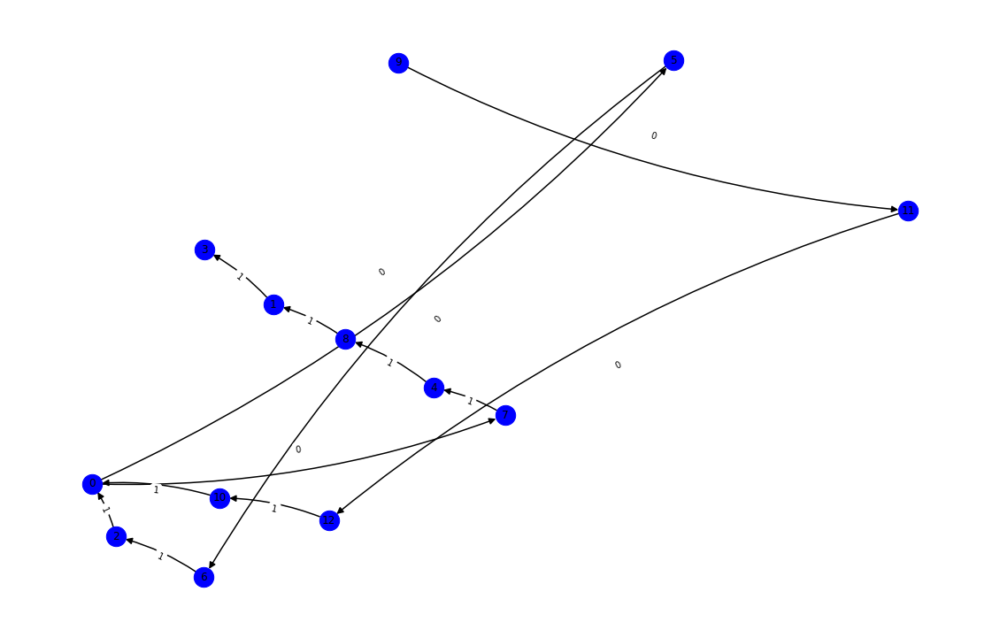

nft-id 45244
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x10a1a1464ac7ae21af29a2b901358ae663f4d3de': 1, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 2, '0x506ee1fdde574ad5cf935021be98a5cd81e35f45': 3, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 4, '0xd595710aedaba1d2e18bfdbab46ab796664c6d89': 5, '0x17374b2b0633b8227033fdb78912fc9cdd479b20': 6, '0x0000000000000000000000000000000000000000': 7, '0x2443047e6ac82fe65035e36e971316d981492857': 8, '0x25f4317f2682bd45923f74667d798f62e251604b': 9, '0x60577490f99712525e4a36d559256c6f99c788f3': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


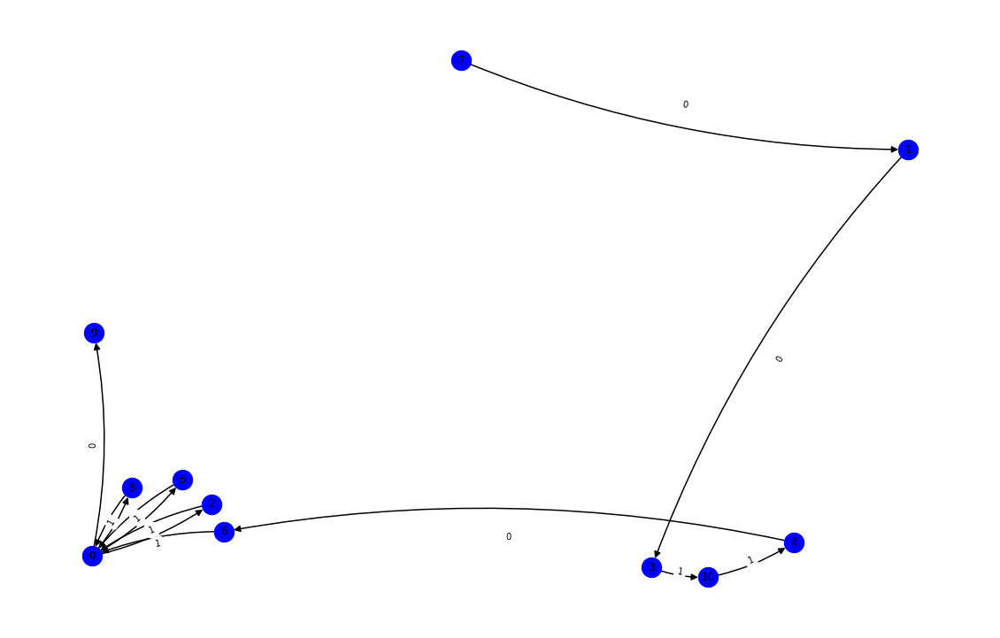

nft-id 52700
mark_dict {'0xcd6b0fa735fbb5eb66e8e11e7740a5921148486f': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x9c08432086dcc1b1ce6701cf64209afdde433bce': 2, '0x0000000000000000000000000000000000000000': 3, '0x2443047e6ac82fe65035e36e971316d981492857': 4, '0xc7dc8c41159f5ad32191914017e7781190615011': 5, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 6, '0xca0b4fc6e52b96e931e6369313fb72ad4e4856ce': 7, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


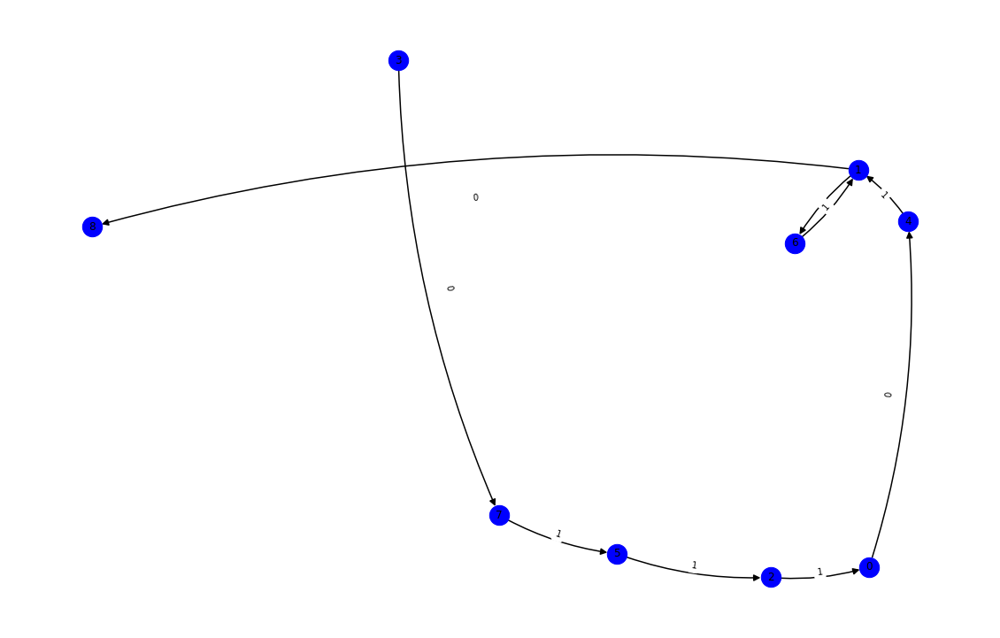

nft-id 52943
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x8262b86a7060049f3053c28f0da7d810c15b3988': 1, '0x0000000000000000000000000000000000000000': 2, '0x2443047e6ac82fe65035e36e971316d981492857': 3, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 4, '0xdb502a93b67356c7c08ba77386f1b89886dd8338': 5, '0x2047a104b7a3b9b619bce57b429fa8434da81b77': 6, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


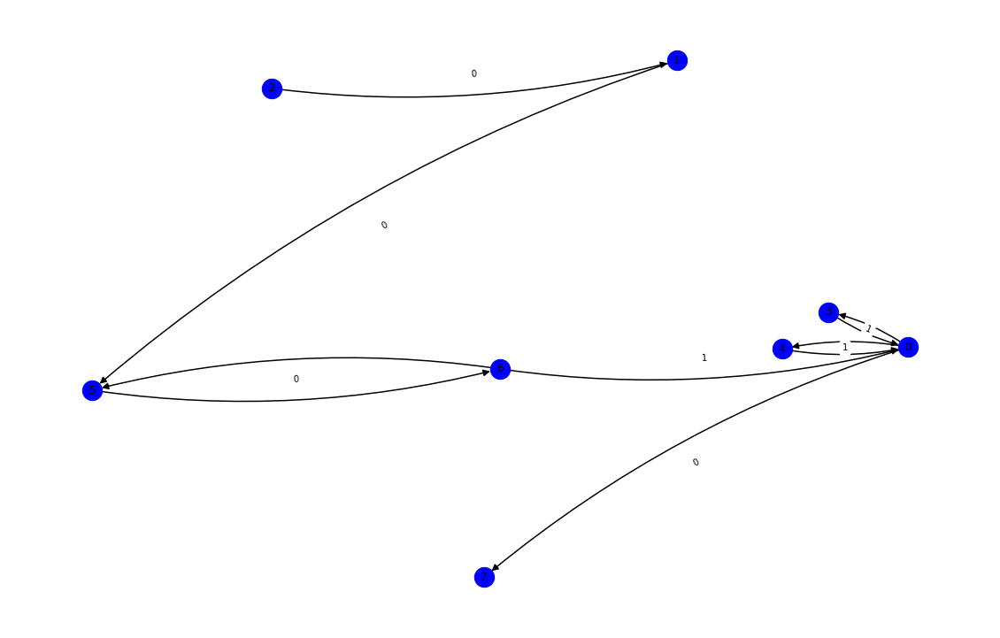

nft-id 53392
mark_dict {'0x002a99690ab1989b7971db28cd4a7673e1e6f495': 0, '0xbf21b6b77b893e11e96d79157eb417f3e4e9538e': 1, '0x31837aaf36961274a04b915697fdfca1af31a0c7': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x3d1856446bd64f08173f664e66bc5fe2738e3e47': 4, '0x6da172d32d5a3ffc52342fe27e9a9c744e7f4fd3': 5, '0xfbecb9cc42b70424b5d7b72db9381d7633d1b10e': 6, '0x0000000000000000000000000000000000000000': 7, '0x68cc45c405547e93dda77d6e1b62994119d4d04e': 8, '0xba3c1983fcb330d156db75a14a14eb447cddc7b2': 9, '0x8a077e3a6b98f7eb88996175675b8734f4b9be78': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


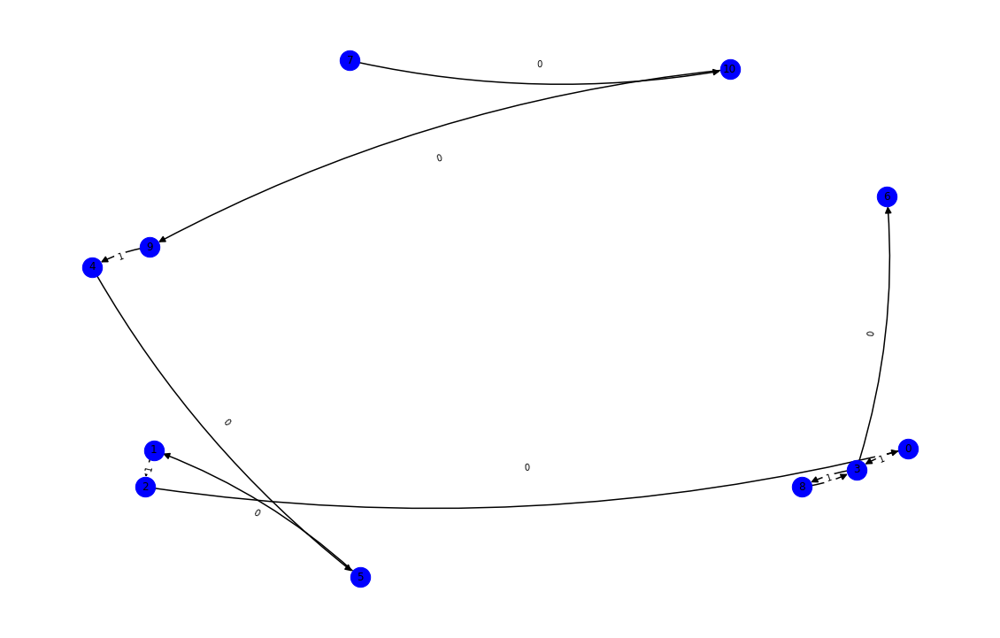

nft-id 61016
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x046c9171f0103328459b95fdfc2ee35aba71b99b': 1, '0x0000000000000000000000000000000000000000': 2, '0x68cc45c405547e93dda77d6e1b62994119d4d04e': 3, '0x8951f25adcc7c3256dd9b521ed726fb587a46d52': 4, '0x72f86a2c0a727ca443bcd3ede64efebd5d09f0ad': 5, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 6, '0x0ffe8e147f8a7a6c32ac127390fd4d00b0d66d7e': 7, '0x9d6c133b388c1fc9756ffa38c18e8e770e44dd93': 8, '0x1e1136ee278be02cf1d6f63835c749e76d4a3d58': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


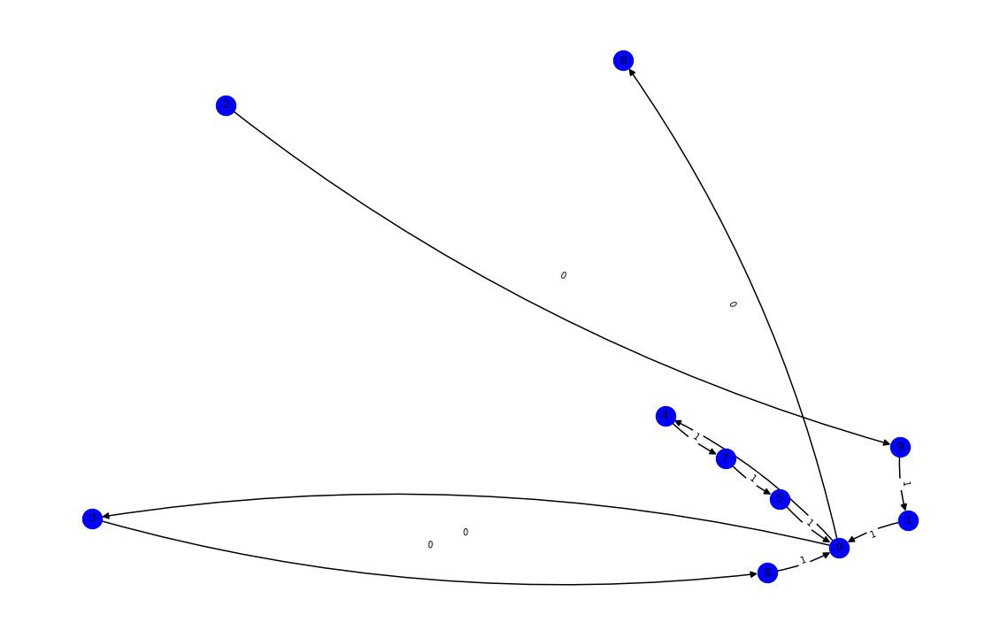

nft-id 63616
mark_dict {'0x8bba3fdaa4d1a31a3bbd2b35eacc522e5eb85028': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x9a20cfcdc25eab32b8d21fbf8dab66f2658b791e': 5, '0x9d6c133b388c1fc9756ffa38c18e8e770e44dd93': 6, '0x386effee362d60d888aa0aa037b0e261f2c7eb99': 7, '0x2658d1ce0939f84ef71878a2f1c4f2ad24391cf3': 8, '0x329e3805e0c80f69ef9fad80eaee4366bea25a5b': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


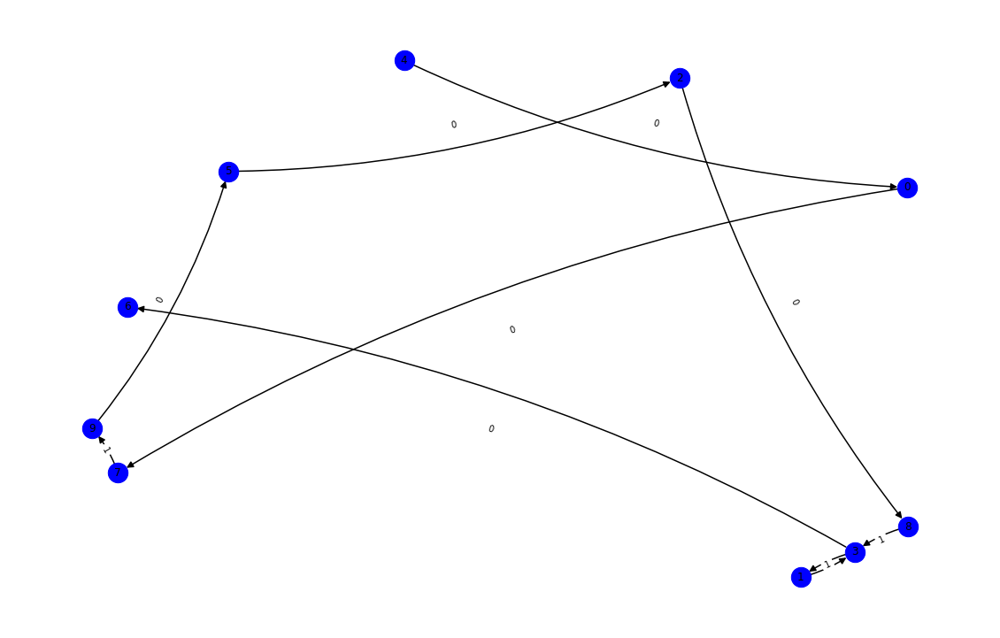

nft-id 64311
mark_dict {'0x483b613641720bdd7848f4d90a01883141b753db': 0, '0xf342c0eb007359651efe7fb52ddb5aeacf57755d': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x9d6c133b388c1fc9756ffa38c18e8e770e44dd93': 3, '0x2658d1ce0939f84ef71878a2f1c4f2ad24391cf3': 4, '0x8d632523b80037a30de3c8d2cef5b85dd9f1f40f': 5, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 6, '0x87e4e2733ba4e4c362027e06258988b34c1876e2': 7, '0x0000000000000000000000000000000000000000': 8, '0xa8ecaf8745c56d5935c232d2c5b83b9cd3de1f6a': 9, '0xe0b5cc21ad77df31282bcc9ca3dc8a2ee829e7b3': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


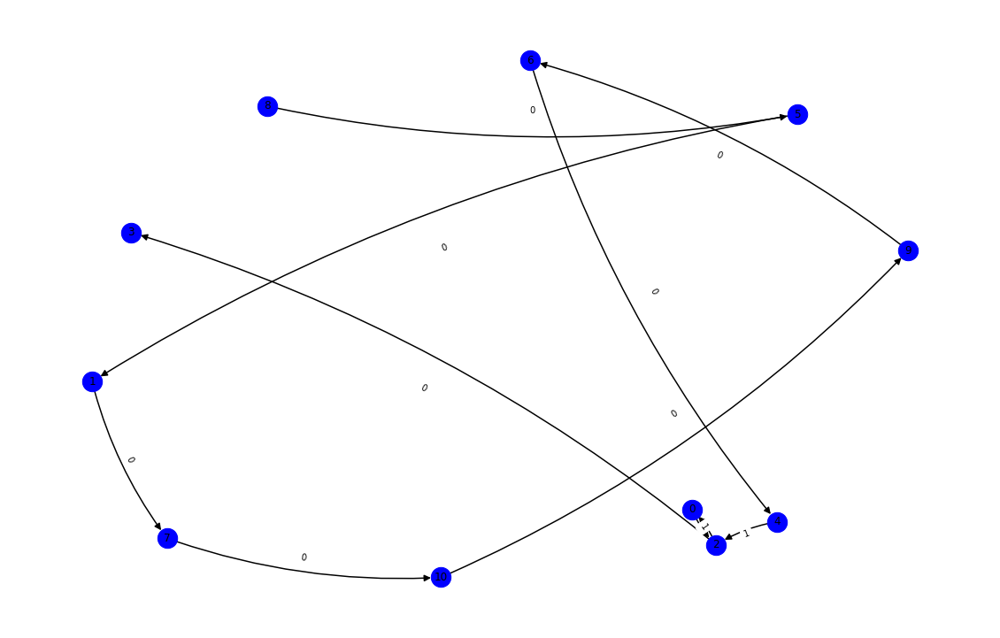

nft-id 70324
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xb92b697fd20b5edae0e0016cdc001afe3ccdf2da': 1, '0xf93ed353400d140f2f0775430ec8f24bf722732d': 2, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 3, '0x9d6c133b388c1fc9756ffa38c18e8e770e44dd93': 4, '0x1da75fb0da32653fdab9ddecdb42f2ed61f8a28b': 5, '0x0000000000000000000000000000000000000000': 6, '0x030b68a55365ce606865c6d14e623a510e7a0f9b': 7, '0xe3e04f4f41fbe34dda69e5e125c416f3adf3c8af': 8, '0x60577490f99712525e4a36d559256c6f99c788f3': 9, '0x5dc9a33d65f813d971543c5e01efde255c1e9b7f': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


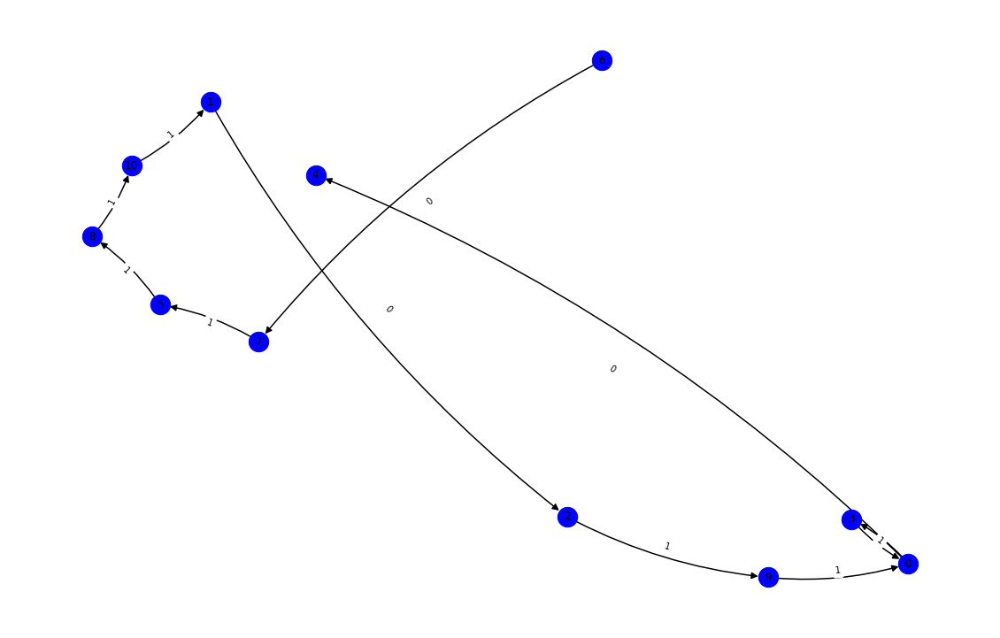

nft-id 72805
mark_dict {'0x7b1c70cf10841bde56345f784fc49a8941d750c0': 0, '0x84323d46b5d5448dfced8ddc05e6d072c0b63f78': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x1bd7e95c3a5cc69213c205bec4487e2d95008fda': 4, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 5, '0x14d702bd1ae7a48df5d33c7f873aa353bbc7446d': 6, '0x9d6c133b388c1fc9756ffa38c18e8e770e44dd93': 7, '0x9ec8e8f64ec6bb47d944b4b830130b5fcf2da182': 8, '0x3ce78f83e820233fd263ebbadbf17cf9b57ba2be': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


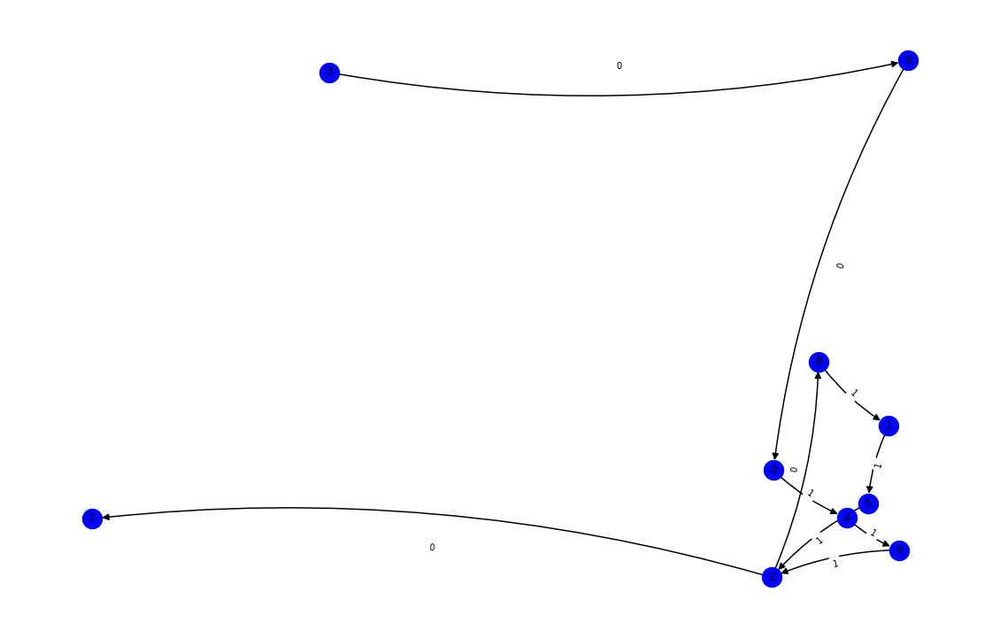

nft-id 97004
mark_dict {'0x45949817d0d0262dc1d7c22f91247cf327dde467': 0, '0x51b384872428fb424d8e193ee8733e960a9256e0': 1, '0x0ab4573208bf79e9b206ff0de191e8797e8210c0': 2, '0x6e197f6a971364d0b798246d8e9f748a622da463': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x0000000000000000000000000000000000000000': 5, '0x7e0adbbd385a87776061250d0d1156c56c0b6852': 6, '0xf506423a1d4ac3a7cecd4c290cf94f5a577a9cf0': 7, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


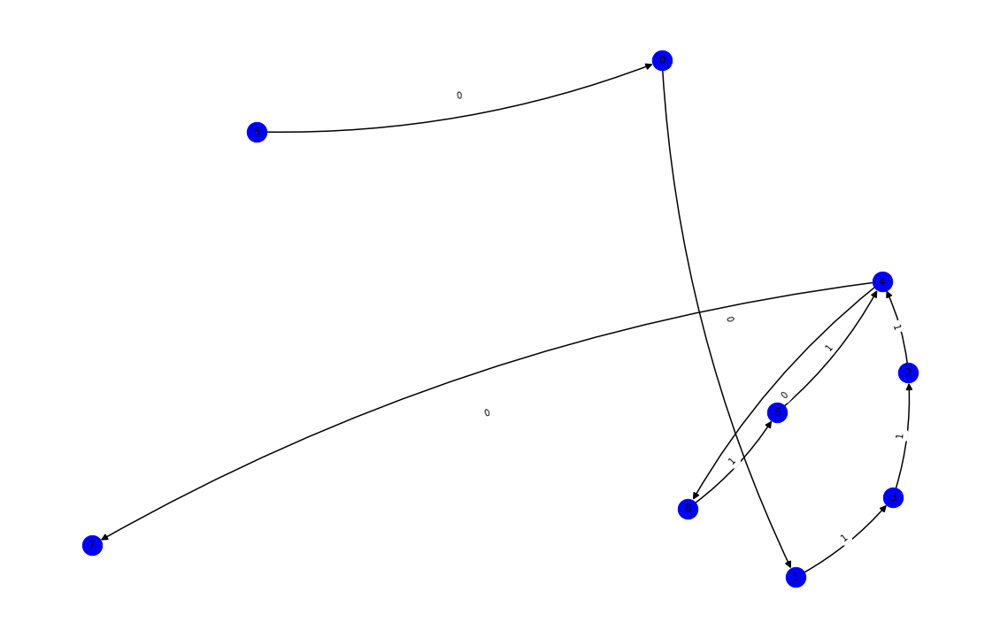

nft-id 45236
mark_dict {'0xb00b669da31846949361cb2caf48aaa417917cad': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x43a6d7c0cc3fa2a6d4654a948109aa6d418ef702': 2, '0x34380456f50e013f1b8b2b9b5dc9d55fb0ca9c2b': 3, '0xb09753213524b17cf62a1306559ab50176b2683e': 4, '0xe66e39343d48af67fb1679697fca58b08b638459': 5, '0x22843b2d504f8ee96312c8a736416f2ae5140a58': 6, '0xabd6cfe1d3dfeef22a482cf9fea3b9dd59e8d989': 7, '0x93fb4ae4e6bcc506c9bc6ce6b2707c549e88370e': 8, '0x0000000000000000000000000000000000000000': 9, '0xa244312a1c313bd79f75dcfedcda850997fd356f': 10, '0x60577490f99712525e4a36d559256c6f99c788f3': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


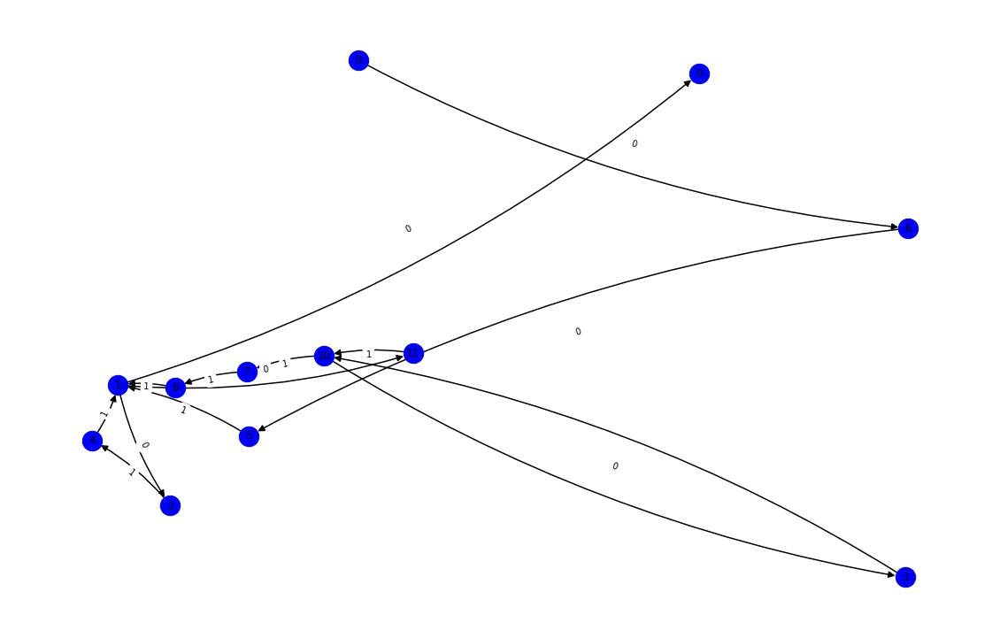

nft-id 49509
mark_dict {'0x6db40b1656a020e6dfbe1ff36a16d8742954acd8': 0, '0x483b613641720bdd7848f4d90a01883141b753db': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x470f5469aeaca55b7b415d14f5707278bddbbffe': 3, '0x0000000000000000000000000000000000000000': 4, '0xdc8e7537699f344ed3bd861db389c79c92dcc635': 5, '0x6a2142b66b8d5c991c3699955e254a8b804d3e44': 6, '0x68da372a96aca53e159ae8d72d6ffa267780d3d6': 7, '0x3fc8e2baad9bccb61bd4999d9a6e4f108bc14a32': 8, '0xb47c55f00a31deda8415e67d587168e05d41f92c': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


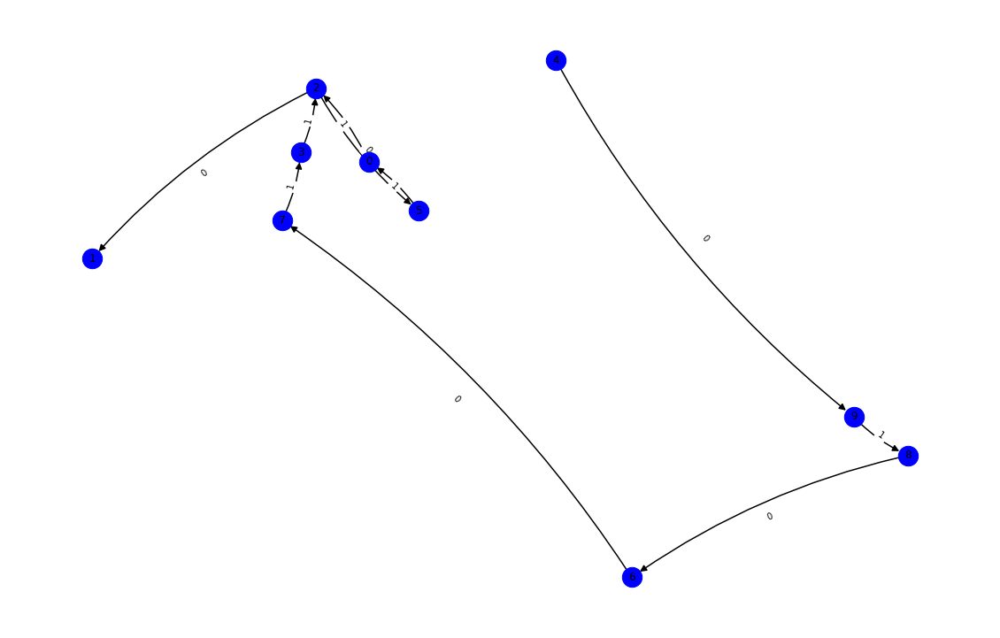

nft-id 71925
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xb44bdb0c63d543e536369fa94985350977264a61': 1, '0x67c4ec37148401c4253b9da38a4569f4b143c365': 2, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 3, '0x7dfabe1d6c11d059b6f757a80bb590d9367512cf': 4, '0x36d84e07606511ce51fc8a3d2c896287e2aceecd': 5, '0xb08126344f4f78ffc09ac4a5a6ddadb5d1cfc23f': 6, '0x5e4cad4cdd5ad170bdf54441366e2559ae9f98b4': 7, '0x0000000000000000000000000000000000000000': 8, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 9, '0x743cd810672d78f7a5855631f38291db755b5fad': 10, '0xa91f4bd9c9c9c755f0ae034aef08b921fe9307b7': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


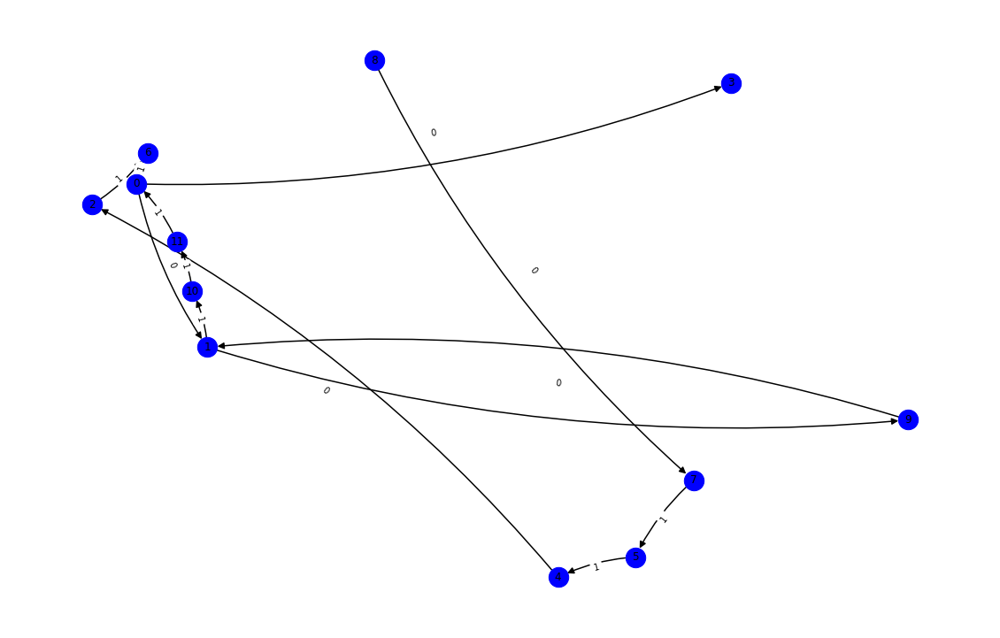

nft-id 91119
mark_dict {'0x31837aaf36961274a04b915697fdfca1af31a0c7': 0, '0x797d72f2d3b05a5a9dbccec5a30a3ead7173f480': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 3, '0x60cc1ae73ae49a0cf9e35ebd29dceb938301f908': 4, '0x0000000000000000000000000000000000000000': 5, '0x16d088a79d7d36213618263184783fb4d6375e33': 6, '0x55952b5df56bcaf16f0356d044e7396910a507b5': 7, '0x95deb63b5d3c9a193349a97e3d55b75e77b7e138': 8, '0xb154af72c7f5760a92c46193aeb24ff8ddd64488': 9, '0x24ac005adcbb3d9551474b43f855191e12e8a4ec': 10, '0x5b97106fa5d8686a447b3bc6a98fd0fba35dd314': 11, '0xa91f4bd9c9c9c755f0ae034aef08b921fe9307b7': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


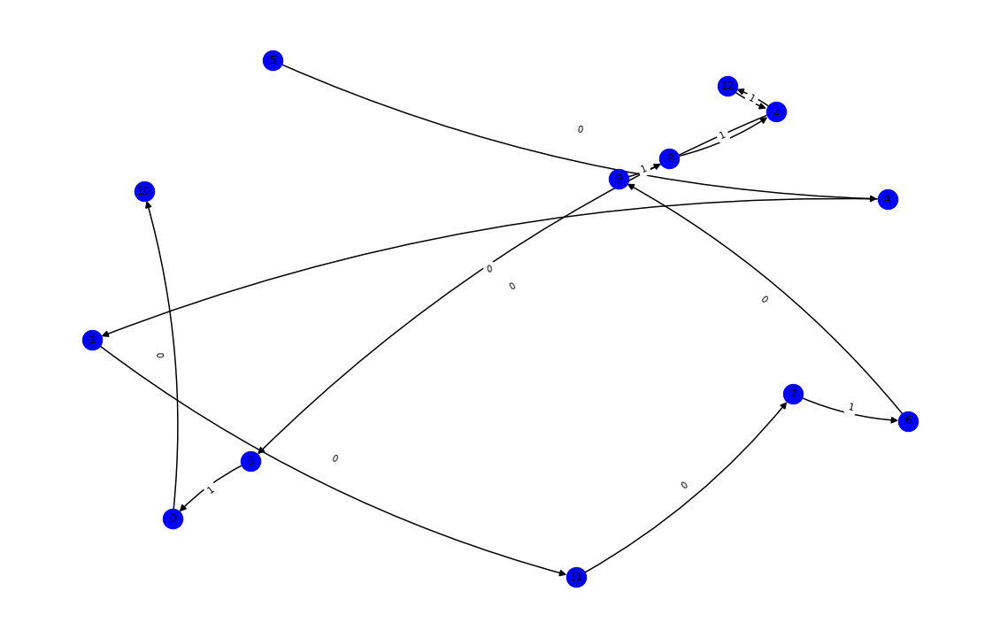

nft-id 93394
mark_dict {'0x3cbc3bed185b837d79ba18d36a3859ecbcfc3dc8': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xf3a4b1cb390717c95cc2ccdcc455f8dc01fd7254': 2, '0x79bc647095395dec40c50adfce6e08d5209b07aa': 3, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 4, '0x71855901c070e9f36712b210b08f0492e092a416': 5, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 6, '0x0000000000000000000000000000000000000000': 7, '0x68cc45c405547e93dda77d6e1b62994119d4d04e': 8, '0x32d53d5a2e6a2b3172d413c47b0d3093e39186fd': 9, '0xad836234c3918cb39cfa73ac51d0c382a70cdf1c': 10, '0xa91f4bd9c9c9c755f0ae034aef08b921fe9307b7': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


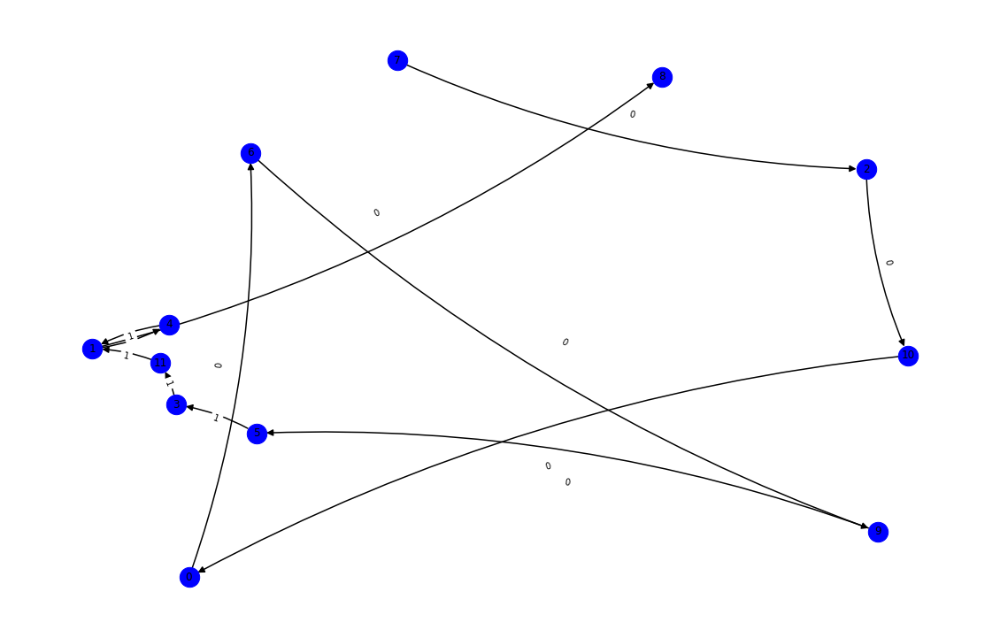

nft-id 54041
mark_dict {'0x7e1acee7b512837f5053cfda0c39b9cfe322717c': 0, '0x58353a3b9ed991af6a23c0188798eba49f26949e': 1, '0x16cc3b2b4cbbe56a4df107ec4946ce3afa009aa2': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0xa5b61af6bc5a24991cf54e835bdd2c0c4f41d816': 4, '0x0000000000000000000000000000000000000000': 5, '0x0e46873f3c0c150d98aacffa87cf596f6e10da81': 6, '0x11992b375c4bdc1b8002a14f1e7ec7f39db0a448': 7, '0x0cc4e9a1a827e556200f168ab703da2c6a4bf82e': 8, '0x2d69b552deaeef266b94a81ac44a4137c5c436d6': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


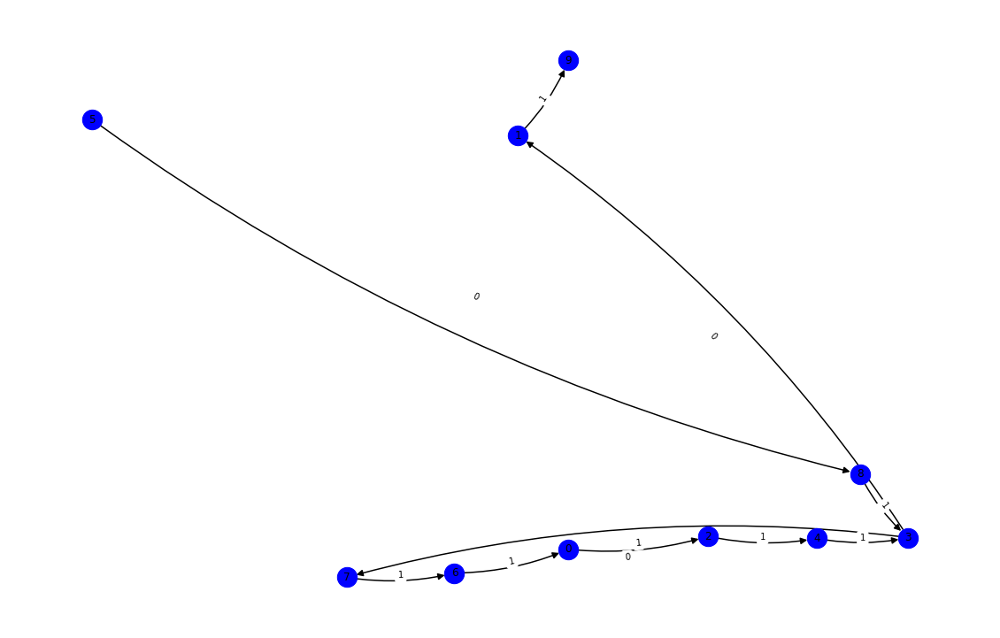

nft-id 89077
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xe0b5cc21ad77df31282bcc9ca3dc8a2ee829e7b3': 1, '0x0000000000000000000000000000000000000000': 2, '0xb0ffc78c832d2cf7fcc63f79238fdd720b5cee35': 3, '0x14395a809064c9beca62e94fb1a0bec538a6ec48': 4, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 5, '0x080011fc1bc948505daa9d76e5a3ff24e65d6d9e': 6, '0x687de619b98a32d3a1f02f80a7bd494fe656eac4': 7, '0xe7a3faef2f56effdeedbc26f95dcb06e6e8b7859': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


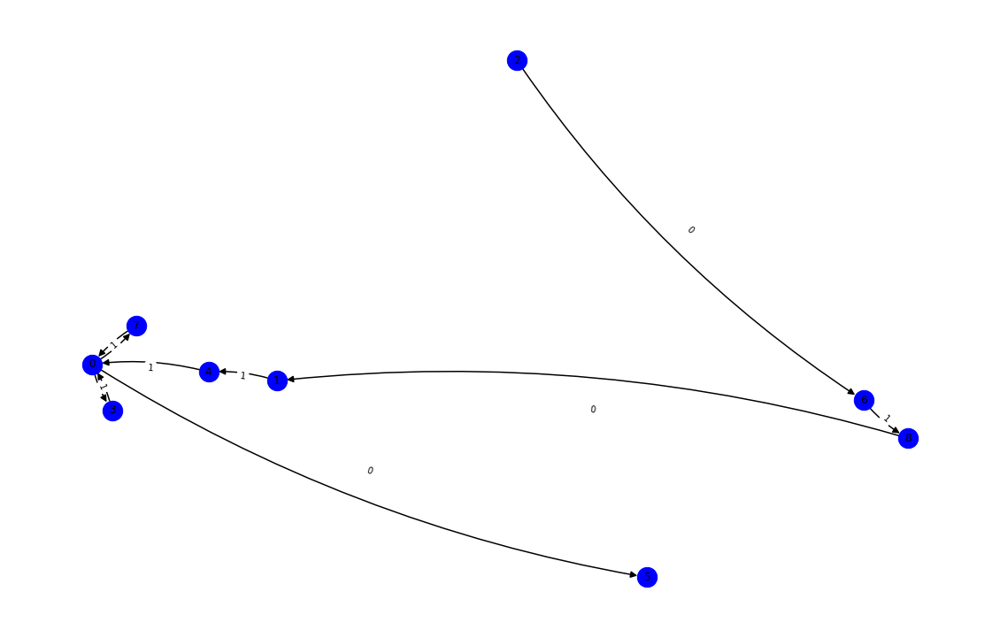

nft-id 84914
mark_dict {'0x9e6a7521ee6bf10e47d16cbd2f679624bdf24bd8': 0, '0xd246939bf4e47622088f2882ecc2cf4bbf6d584f': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x13d8faf4a690f5ae52e2d2c52938d1167057b9af': 3, '0x2060fcb5c65aa6fba9666d1d016ab9275865d4a3': 4, '0xaeaee46b9ad8e1e213cf6d73b7b31ab19a2bb9be': 5, '0xe673a2a0669dcbf6fcae1a9ef66382bae32e333f': 6, '0x857847ecff42d28abe7f421074e45877b8030cdd': 7, '0xdfd143ae8592e8e3c13aa3e401f72e1ca7deaed0': 8, '0x0000000000000000000000000000000000000000': 9, '0x7b5463092dde8295f0ba81312ff4f88f63d9f405': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


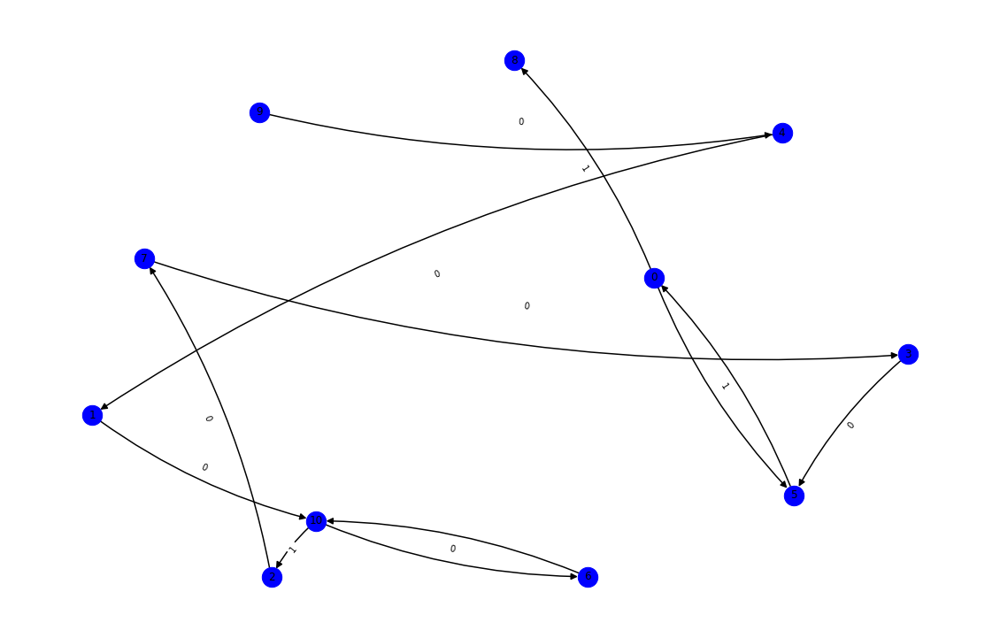

nft-id 65352
mark_dict {'0xf1c542f2ca3f2091a801d57f61783c9f0bf9a758': 0, '0x83bc316cc2468f52cc043a38f0a683ceed4df865': 1, '0x18d82cc691754ea6db4018004de61fce8a63f392': 2, '0xdde850399f48070bf88ba87f96d59b9059740374': 3, '0x87e4e2733ba4e4c362027e06258988b34c1876e2': 4, '0x02e43bd3620581fabfd3147884b8c30d222f6822': 5, '0x0000000000000000000000000000000000000000': 6, '0x2727021c3770113c3dbe00db1e1fc268365800a5': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


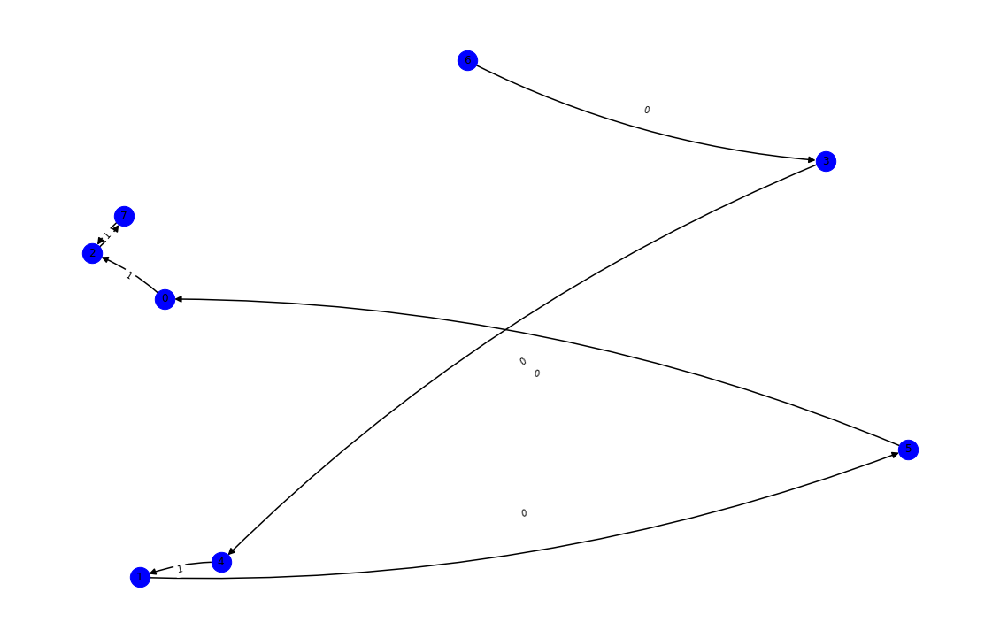

nft-id 45282
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x6c6fa394709ed4c9c593344350c99dfcd1cae364': 1, '0x4fbfa265688f763a01ffaa55a59b0af18c6d7229': 2, '0x894f392ce067e73e128284056e2f3d4ab7d652b3': 3, '0x17374b2b0633b8227033fdb78912fc9cdd479b20': 4, '0xa7eec03b91c8f2de72aa739192191e1d05cc9fa5': 5, '0x0000000000000000000000000000000000000000': 6, '0x039ede520b66ac905a15241bf1f9a068be041ff0': 7, '0x2f57ab3ac31f4113d465379f423539441d177dd2': 8, '0xac0a6b8b39845dced9b77bd39f1c87be91775484': 9, '0xeb11f192e91e2d4abff199b58222c89472584bf4': 10, '0x4ce0f96c459df322df68f393569549d5a54a1929': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


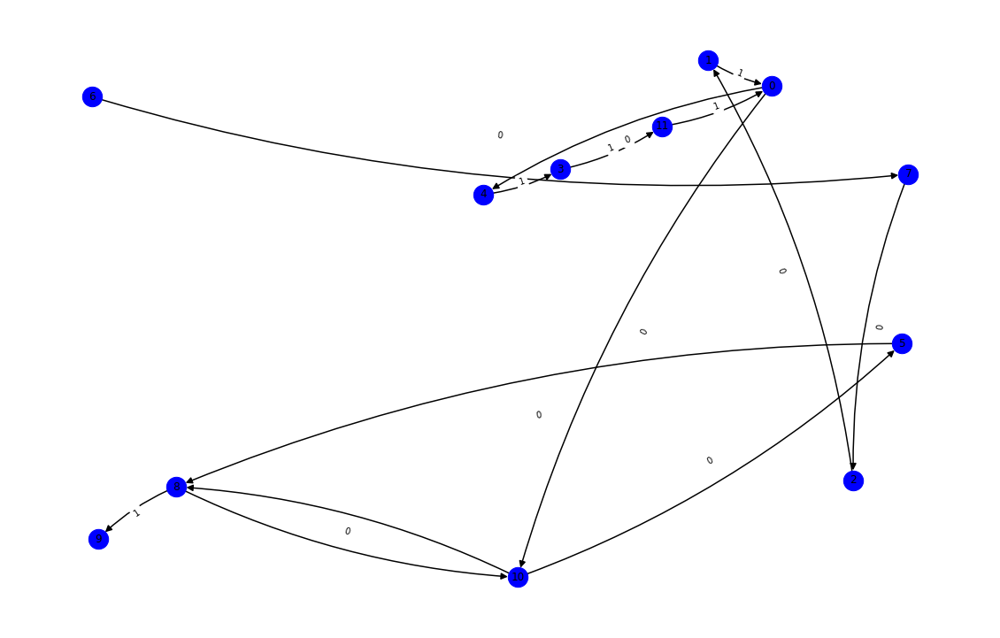

nft-id 71561
mark_dict {'0x1724599d5413ef15e7e199eae58803abf0d2b821': 0, '0xb669aa7996a3b95b805064670bf3ac9471226303': 1, '0x0000000000000000000000000000000000000000': 2, '0xfd35624baf2f0b3755b7cfbefec7bf62f9761702': 3, '0xb68daa2725edb70f9389f0dce80a0c7f9b76ffc9': 4, '0xed13923aa0e92e8fafb03a13e1a96d61d01c8b27': 5, '0x7f13810ae0e2f0895f96e8e8ee9c502723fafa6f': 6, '0xc86463e24568d1ce7bdbcb5322f13294a9b7c5ae': 7, '0x26f0394e4ad5b9814f58eb078e7ea917fb828c6b': 8, '0x94535803712be3ab6f9c82a86538b2ac15d08364': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


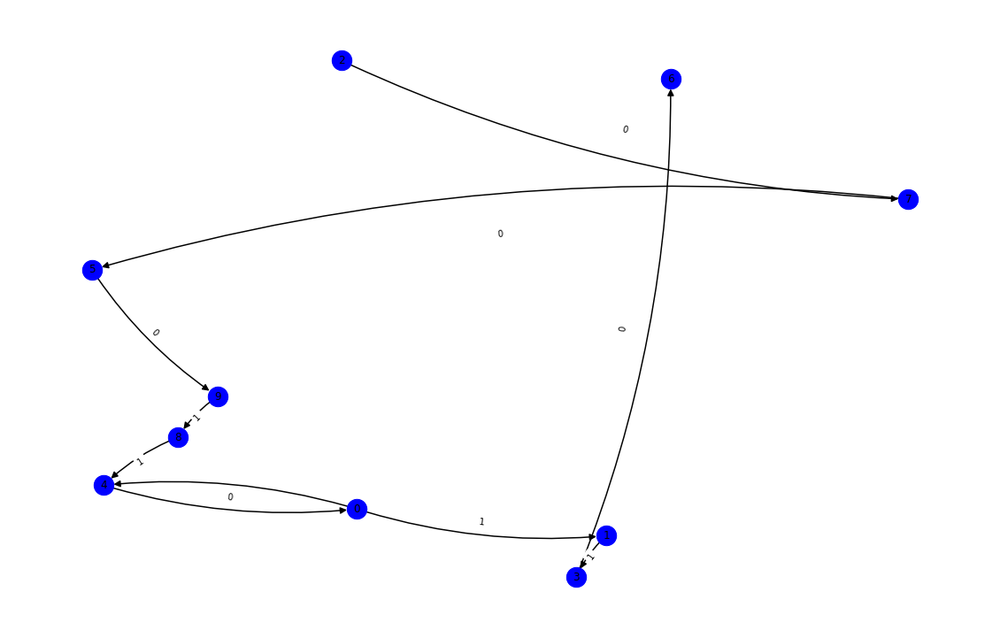

nft-id 45507
mark_dict {'0xd07daa79caf36e68625d1ee471ec4860668faaa5': 0, '0x0000000000000000000000000000000000000000': 1, '0x5f6af6b4f8778175bec97468592a913fa98a163c': 2, '0xd0b93d5d406a03d18a787b86e7e100bc57253d12': 3, '0xecf4205edf8e0024d0a0948332e2c8fe641ab84a': 4, '0x8d9c613b9016afeddf4f78c73e1089aa2a1c5f24': 5, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 6, '0x152132d1749ab777bb9a86828746035c733cf841': 7, '0xf83fc598fd45171d86f81ba032c46dc07acc415f': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


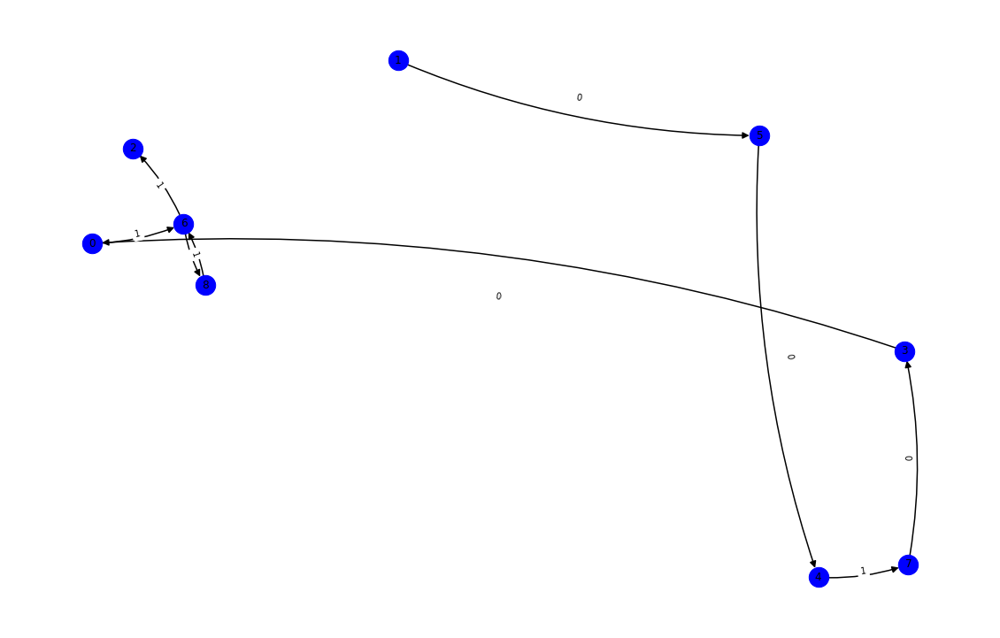

nft-id 9517
mark_dict {'0x57a2ee6a383ba1671a7fcb6ecd6b8a9eb06b19a1': 0, '0x3cb3661411a5679b852e89d57132849d474e234c': 1, '0x0000000000000000000000000000000000000000': 2, '0x0667640ab57cb909b343157d718651ea49141a75': 3, '0xacdcaadb137c319f98826b6165ae54d41ea29971': 4, '0x9e523b589b08ebff834bd7cd302372a98474751a': 5, '0x67df97a0de95d86009f507e4bb1ce09cef80179b': 6, '0x9250f8149067fc068189f95e92f0eea9673f62d0': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


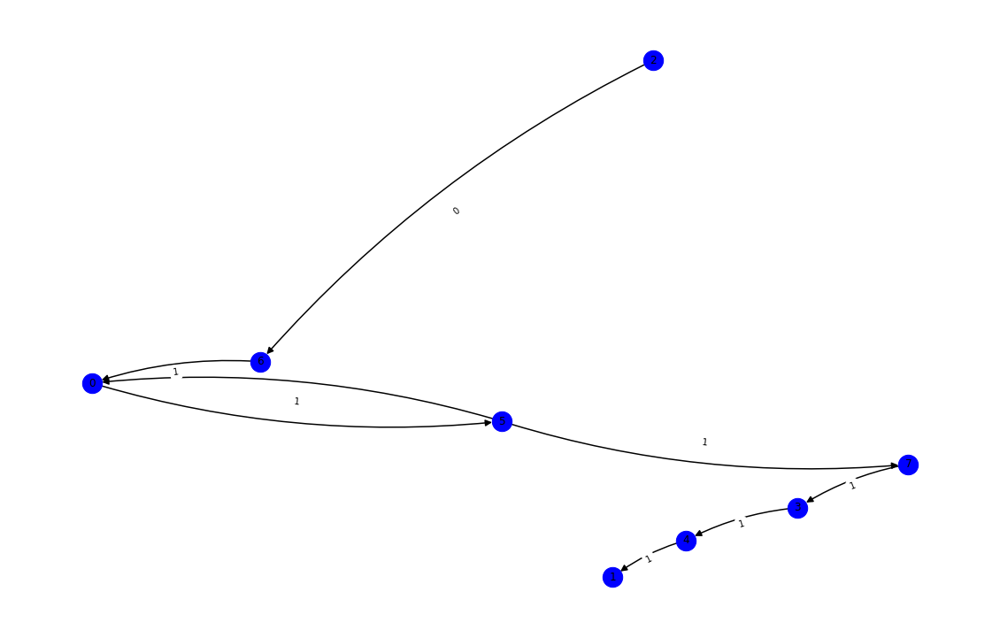

nft-id 50657
mark_dict {'0xac9dd4d5a9940028a0c778b14dc545fd747fb2b1': 0, '0x9491f3e90c835d8392a87a491979edf122aee592': 1, '0xa511a741d209e281846bf652c1bdd7f04b5e6c74': 2, '0x5ae6db57bf608932123bcf26126593847a9cf7bc': 3, '0x28a6f9859e09ae889daed4f96d4bc21a7b1f07e7': 4, '0x00000000a50bb64b4bbeceb18715748dface08af': 5, '0x0000000000000000000000000000000000000000': 6, '0x77d63f2a0e1bd85aae8578c5785eef9f85b6a7ae': 7, '0xd0b93d5d406a03d18a787b86e7e100bc57253d12': 8, '0xd082a183ee62b7f0ca9c55b44a0b747c4ed984de': 9, '0x3a304e73de1038fdf72ca781a1e8d0623be67436': 10, '0x222076b5c0af13c38da3aefb2eaf7f3e5acd4f8b': 11, '0xcfa403e544792d0d6700ea4e507882e77ab67f73': 12, '0xed1b993b56e2006898ee6b779318c3cececceb0d': 13, '0xb9e4e5df4bd24d97a5aab9386e32896add761436': 14}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


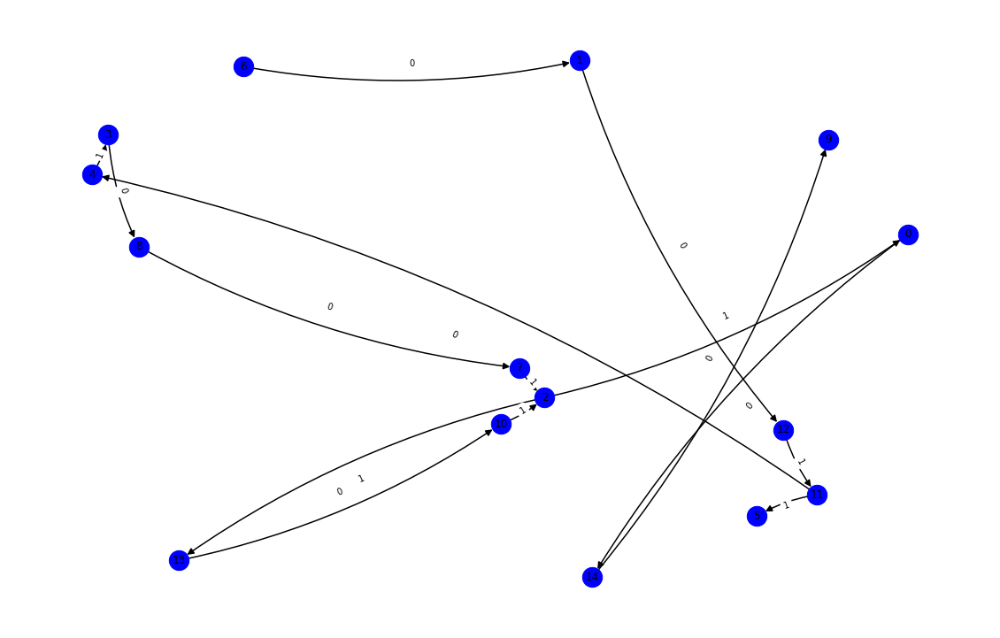

nft-id 98856
mark_dict {'0xfd56cc4979e33c2ef97d97b63fb664250f33c946': 0, '0x5b233b30e76a14af05227dc9c2e355199936afc4': 1, '0xe27b60dc1a09a4a239f194b5218a59555b5dbed3': 2, '0x0000000000000000000000000000000000000000': 3, '0x1372a6edb6aa4452f925598011c4a63f35ad3a1b': 4, '0xd5220982415effdc139a777b55d94fb340ee66f1': 5, '0x2e32935bfd5b2718f99bc8fdf8b37c16811f7d97': 6, '0xeba36eecbb09784bd32de56aaa0deae2bb11a196': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


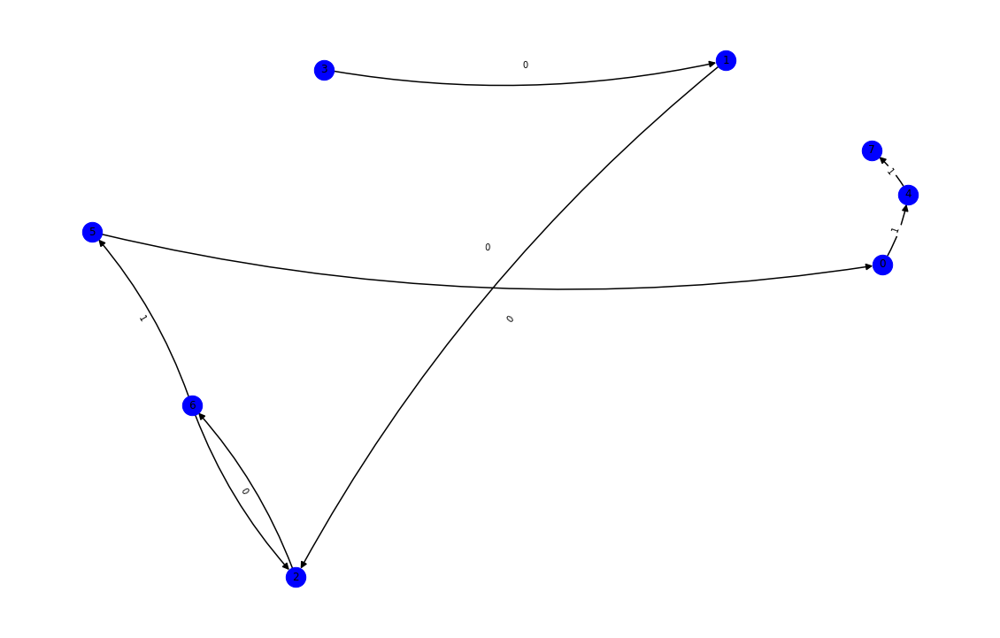

nft-id 98442
mark_dict {'0x171ba772610790e50741ccb060b9dcf12370d781': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x3f703546e6af3e06d5a1653a352f0a05744d1928': 2, '0x0000000000000000000000000000000000000000': 3, '0x8888f5b5bb7bed9beb904437c9b51fc432915888': 4, '0x4bc843ff952bf024f2fa84a21ff59ef2ae8ee40c': 5, '0xbe5e46d3fe27614d2be7e92dc969c4fd0e9eefcb': 6, '0xbaa593844f49c01e42f3f691833905796c0d9565': 7, '0x1618406d203aefa14526f77d79fdbeac9d42137b': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


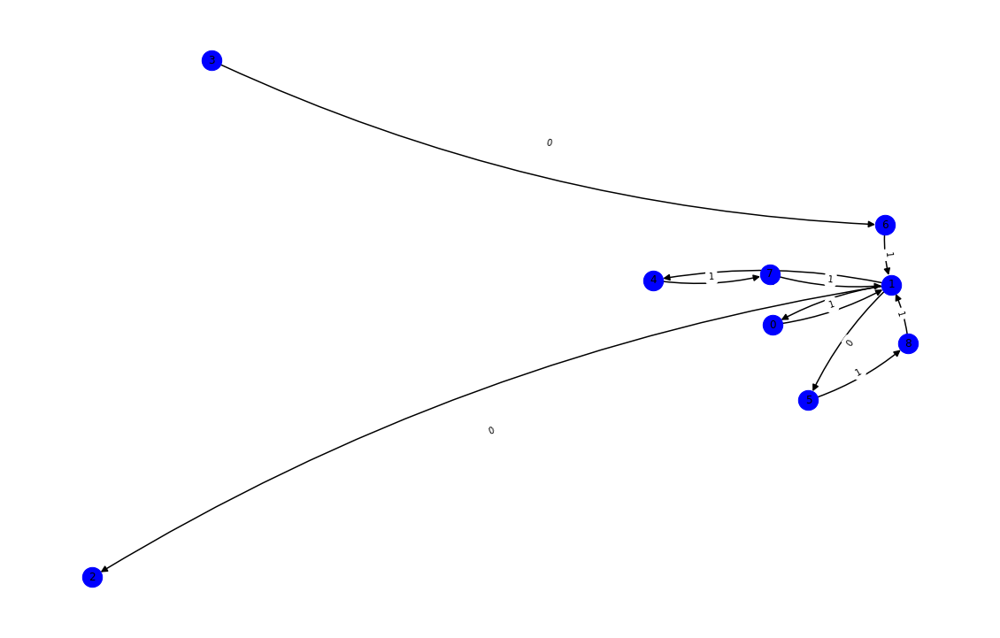

nft-id 11682
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xaccf3fcc12f55ab013f75cf07525602fb558b307': 1, '0x3735af6f8a48e1817191e114bbcd9806aefd9c95': 2, '0x474741e2d2c0a223b7e1c49db6b5b8c8d6e0affb': 3, '0x9f28152ae399a6f1b9760c04972de4f9303c0c9f': 4, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 5, '0x8d0980afe7973ac8864d35fd085e0155c7c3f00d': 6, '0x3f16271d7bf0991cc82d2aa1ef95c8ee9ff05456': 7, '0x576a8b962a6cc88b424b66a25f4f16e9961894f8': 8, '0xb6f6b9aa69d6dfd8039b35f0c49463f27696d437': 9, '0x0000000000000000000000000000000000000000': 10, '0xa70b4d042327d7da97c6db480be0549f4a4642a0': 11, '0x4ecf4bc90510794f5a4074136efb716485ae0da1': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


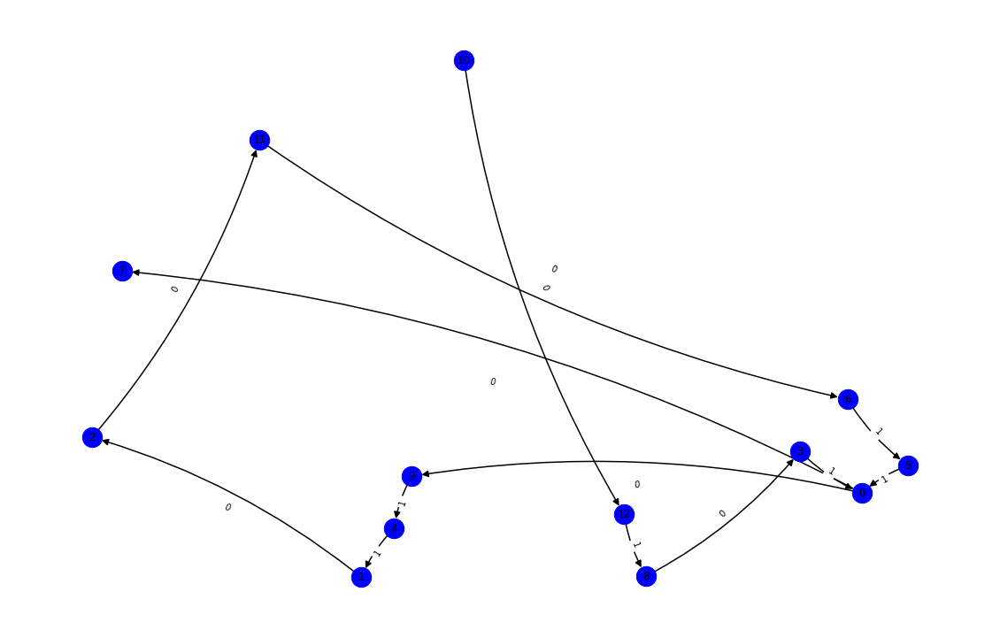

nft-id 99821
mark_dict {'0x895bcbd8a41c4380cef7d69e676461cb7ec3d828': 0, '0x20bfaecaee1921302d5ade2fe8a5460f3c542ee6': 1, '0xa33338aa9708e65c1480f5daf5ea652e9cd53fad': 2, '0xe88fe06b203ec0c54de823def305b07540925ab6': 3, '0xbaa593844f49c01e42f3f691833905796c0d9565': 4, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 5, '0x894f392ce067e73e128284056e2f3d4ab7d652b3': 6, '0x90333f41bfa386ae08f84c43d1c77d8b7e8c63b3': 7, '0x146f7de075e5f32bc66c15a6cb76458dbea0dbd4': 8, '0x0000000000000000000000000000000000000000': 9, '0xaf0b08e3c8e726ec6d703c60b9a574d02388cf4a': 10, '0x206883b287042726919fbd6b3d05fdf4e5cc1dbd': 11, '0x729e17416396b0ea19dbebc24f3e4ba9878f92d8': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


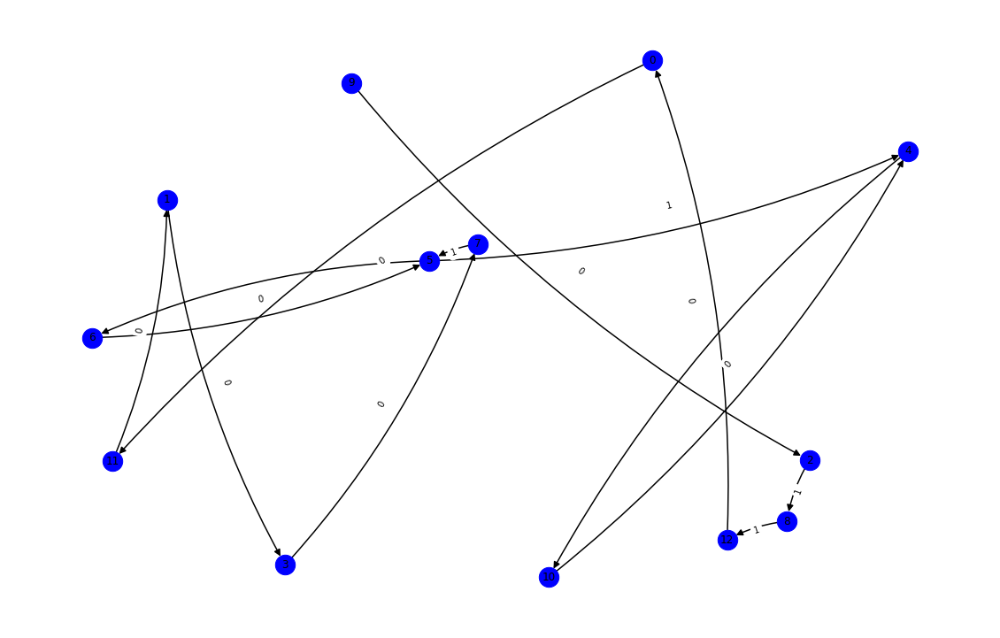

nft-id 71910
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x0000000000000000000000000000000000000000': 1, '0x57c25777bd6dffb3251306c0a6449bebb58a7af0': 2, '0x8506e43d89d80bb24d678f67f9e063444b8ab536': 3, '0xaa114724f2bcbd859d01585435e3076671314d2e': 4, '0xdd94fe8f7e96d579e82f67d5b0ef6df493f72d80': 5, '0xb97fa89ece2e854a37967e43a1ab68ac04a38d5b': 6, '0x277c79c8a4ac00f8bde6af6ba06ac0f2071ece90': 7, '0x2047a104b7a3b9b619bce57b429fa8434da81b77': 8, '0x696f74a93611a7a3cd1b07277df4110a9c162769': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


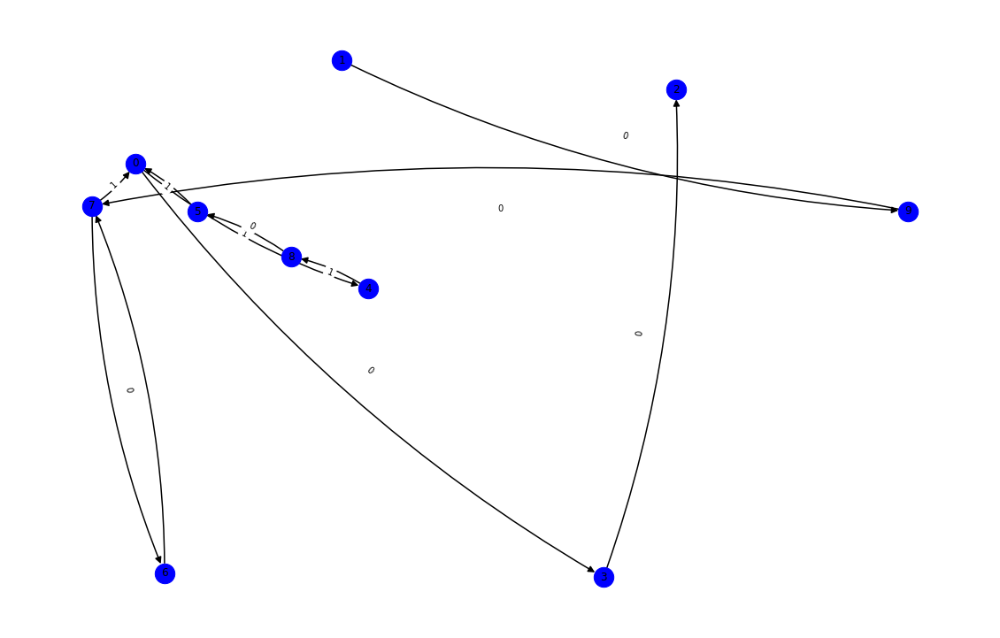

nft-id 50686
mark_dict {'0x62eb724efbbc9e6bc9b8de4f03d3cfaa80971a5f': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x75aac27d82d990ad75270ace54fb56f99747eafd': 2, '0xd2efa047fbad485a5922ac419a2386e68cc1d6b4': 3, '0x6696d93b024520c2dffeb5cfe9fe3baa3ae54825': 4, '0x3f703546e6af3e06d5a1653a352f0a05744d1928': 5, '0x0000000000000000000000000000000000000000': 6, '0x2f57ab3ac31f4113d465379f423539441d177dd2': 7, '0xeb11f192e91e2d4abff199b58222c89472584bf4': 8, '0x4ce0f96c459df322df68f393569549d5a54a1929': 9, '0xceb562a97e4a12369f7fd0583660e7ce59a90f94': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


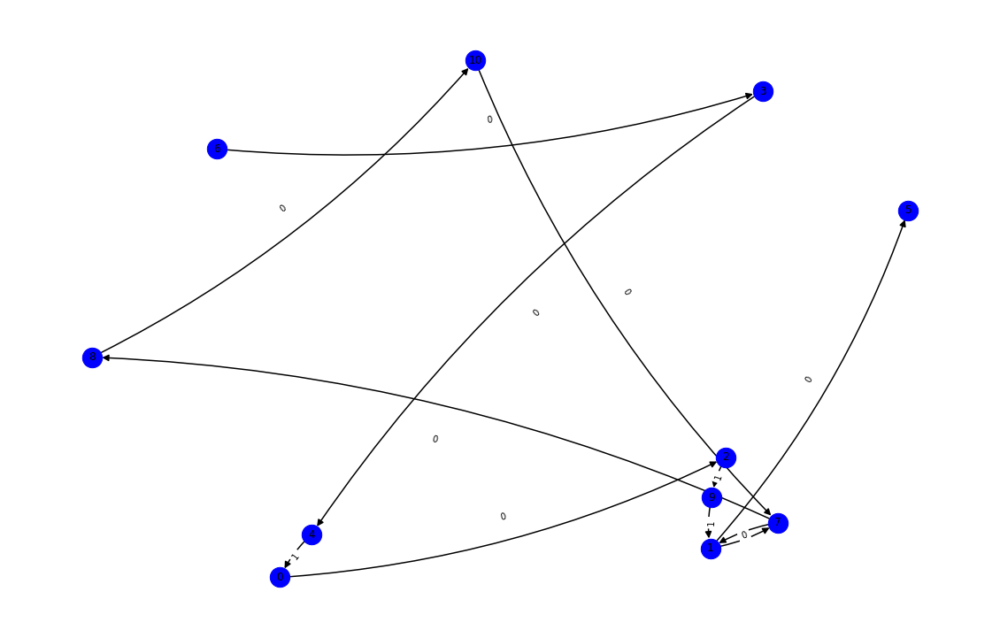

nft-id 51006
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x96a8b84979ffce746b9de513c1a649f745dcd8c8': 1, '0x621cba49d5b835f3c5cb5b1c254004565062637c': 2, '0x3e3e78c696707c8aaeeabcdf07af72237fe28c16': 3, '0x3f703546e6af3e06d5a1653a352f0a05744d1928': 4, '0x0000000000000000000000000000000000000000': 5, '0x2f57ab3ac31f4113d465379f423539441d177dd2': 6, '0xb2e6570ab19023ed48e51c0d0d7747342f4ae43b': 7, '0xfc896486b7ced35d82a8745cbb2168a444039183': 8, '0xeb11f192e91e2d4abff199b58222c89472584bf4': 9, '0x4ce0f96c459df322df68f393569549d5a54a1929': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


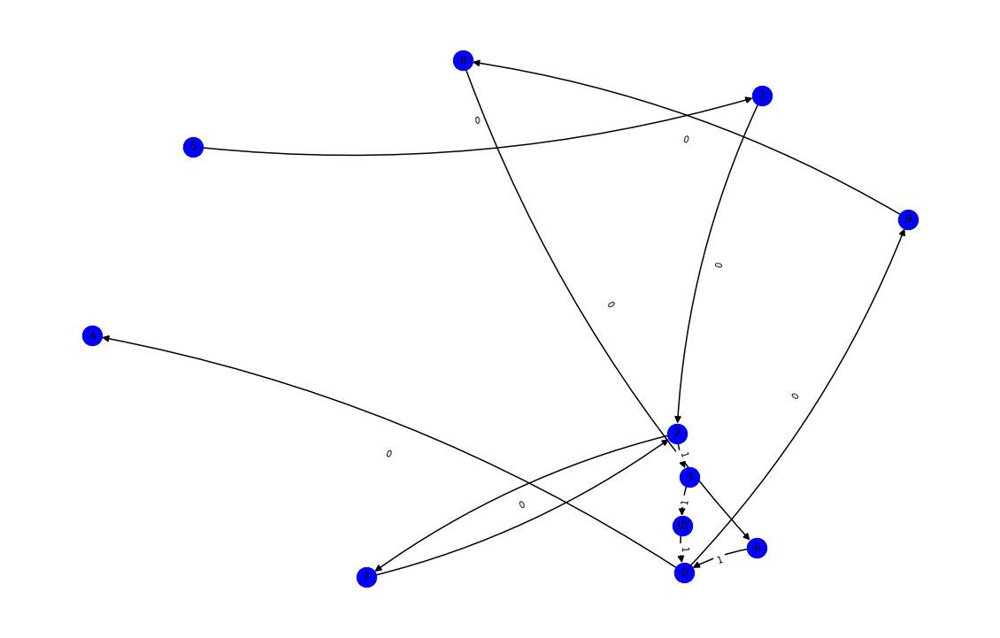

nft-id 57124
mark_dict {'0x7fc1c3f1875bc0ad592ff29a6b67bd8547e52324': 0, '0xb4a45b289cdd895a3995493b74be8fc57d8fa792': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x376ffeff9820826a564a1ba05a464b9923862418': 3, '0x99a851a2f0d75be75ea131e804f13b1527bdf62d': 4, '0x401f341d7fee60ac9c60752c4652067653d5f955': 5, '0x3f703546e6af3e06d5a1653a352f0a05744d1928': 6, '0x0000000000000000000000000000000000000000': 7, '0x050d8c72bedd98ad374232c3a62b42370ce82ac1': 8, '0x2f57ab3ac31f4113d465379f423539441d177dd2': 9, '0xaeedeedd4c8727b2025f7f7bf995c5b55d6b93a8': 10, '0xfc273140fdc4124ba9a8bb05e8d269816d623a31': 11, '0xeb11f192e91e2d4abff199b58222c89472584bf4': 12, '0x0ce84d876aa0af7b36f2859362c0f8c1abb73c7e': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


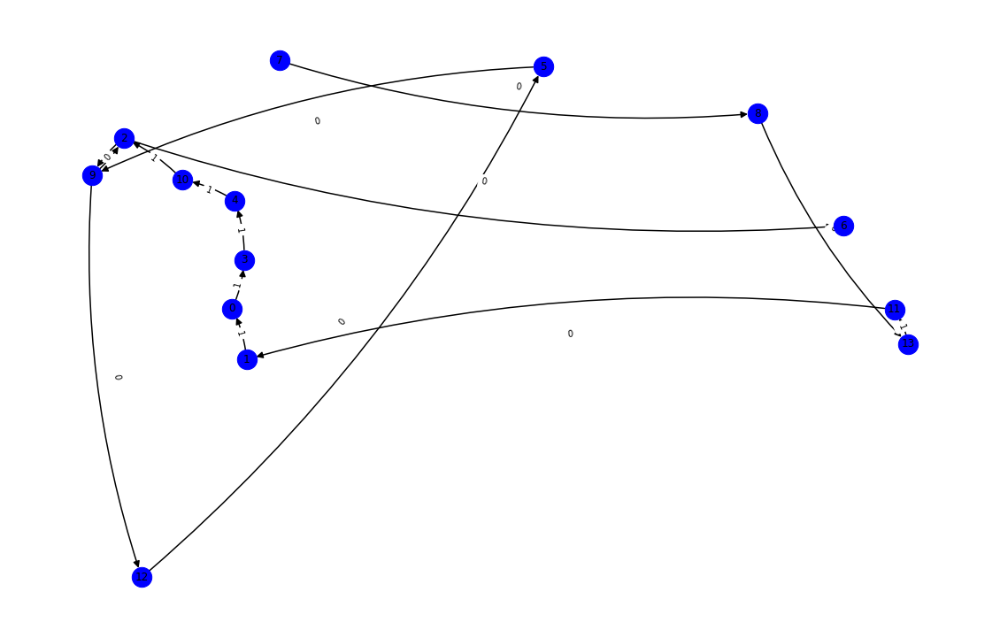

nft-id 60601
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x3f703546e6af3e06d5a1653a352f0a05744d1928': 1, '0x0000000000000000000000000000000000000000': 2, '0x2f57ab3ac31f4113d465379f423539441d177dd2': 3, '0x7dd0e99342edee63b083f0f8e0009ef3b6110ad6': 4, '0x4cbbf33f4cfaaa8a467059a97eaa1b2f8521895c': 5, '0xeb11f192e91e2d4abff199b58222c89472584bf4': 6, '0xaa55ccc504f52ec9c15b6ac7cdbba592e07d064c': 7, '0xe1cba5cddbc243ef5a27aa97ac63a3f5e035c8ed': 8, '0xb58cb0b656a223b4c58636990ca819ce221997ab': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


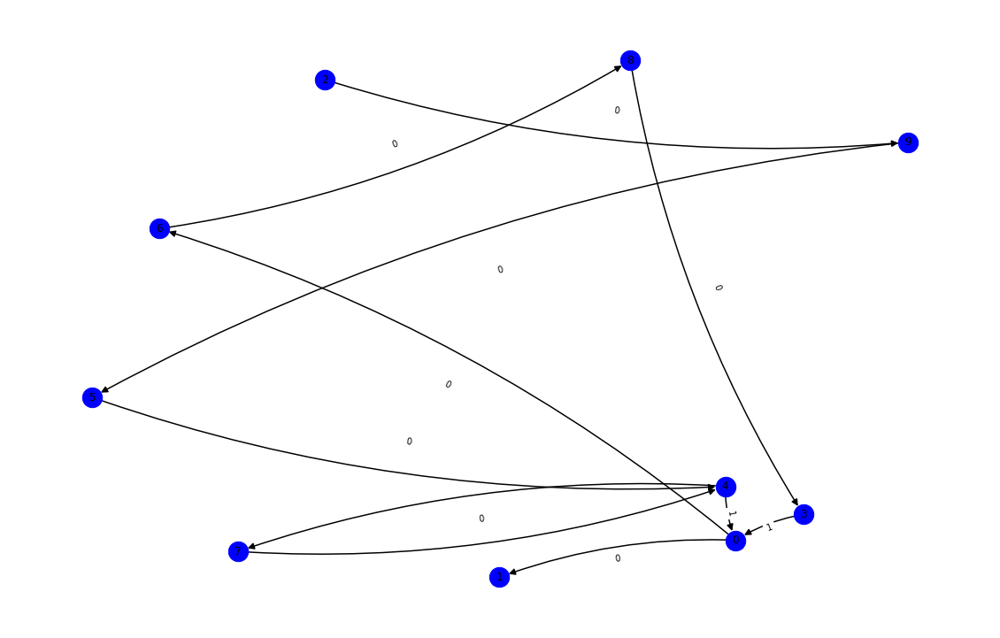

nft-id 60643
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 1, '0xde6135b63decc47d5a5d47834a7dd241fe61945a': 2, '0xc9e31609d90ca2e3659259e8bf0aa37fb547e6f3': 3, '0x6887444a5b74b746f56ae08952f4e1b404ff7ca5': 4, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 5, '0x0000000000000000000000000000000000000000': 6, '0xfee841779ff12904ecea3945797c86b10a076eac': 7, '0x85d4546af89b85160739c6ac22c00929268f7ff1': 8, '0x3c79cc05a62818df1ca6a619e5ae9c95cad0acfa': 9, '0x2f57ab3ac31f4113d465379f423539441d177dd2': 10, '0x97da20dc2bd46174da79d71a385b7248527fbee6': 11, '0xf0c93860d6c8b1f4a60a1972cba46e6e157c3a36': 12, '0xeb11f192e91e2d4abff199b58222c89472584bf4': 13, '0x80ca9f944c860341504f570379c991e226cf85f9': 14}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


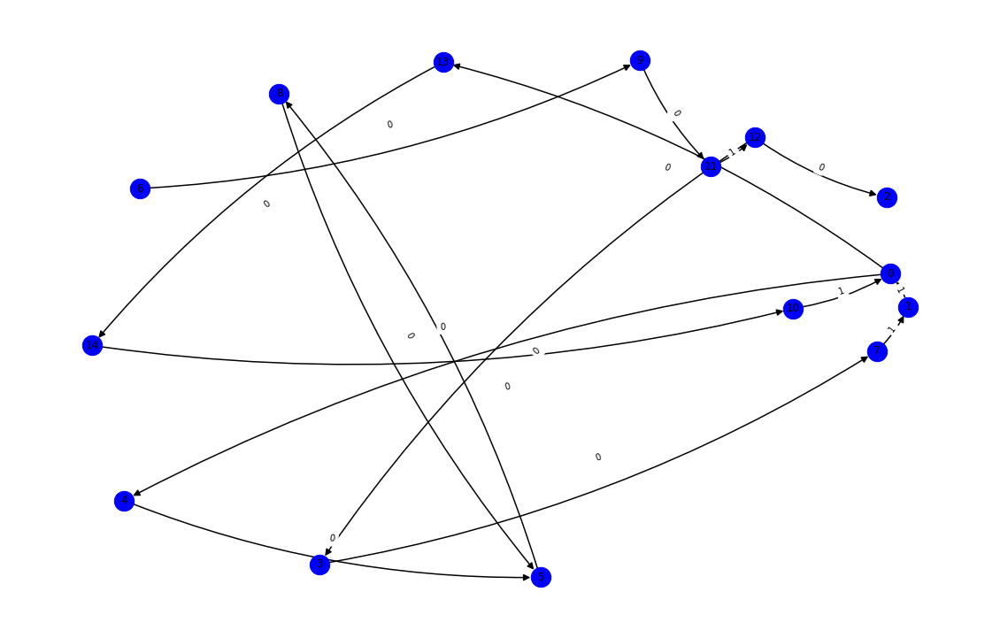

nft-id 45048
mark_dict {'0x719725c6cabf9a43ccd0058b72de008868c83fe1': 0, '0x7016ea141a1d0bbce589a472cc8b3cc162fd7950': 1, '0x6189d9032da703fd34fa94ad4a315df00ef05210': 2, '0x4bf5335c585846ed76b2e8702bdceb9235b59f13': 3, '0x1df80c3c103b80d1920b7040f4e27b4a21081d29': 4, '0xa00a517775eea89f28707d28a0fe4146fd34c628': 5, '0x0000000000000000000000000000000000000000': 6, '0xa509f5c56a44ac09bc8ed3fc7eafc9efdfc85514': 7, '0xbc0f5ffe95bec8eb279af6a0b3553471e90f68d9': 8, '0x7d968cb790de6f3c25154dfa2685519cc3944472': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


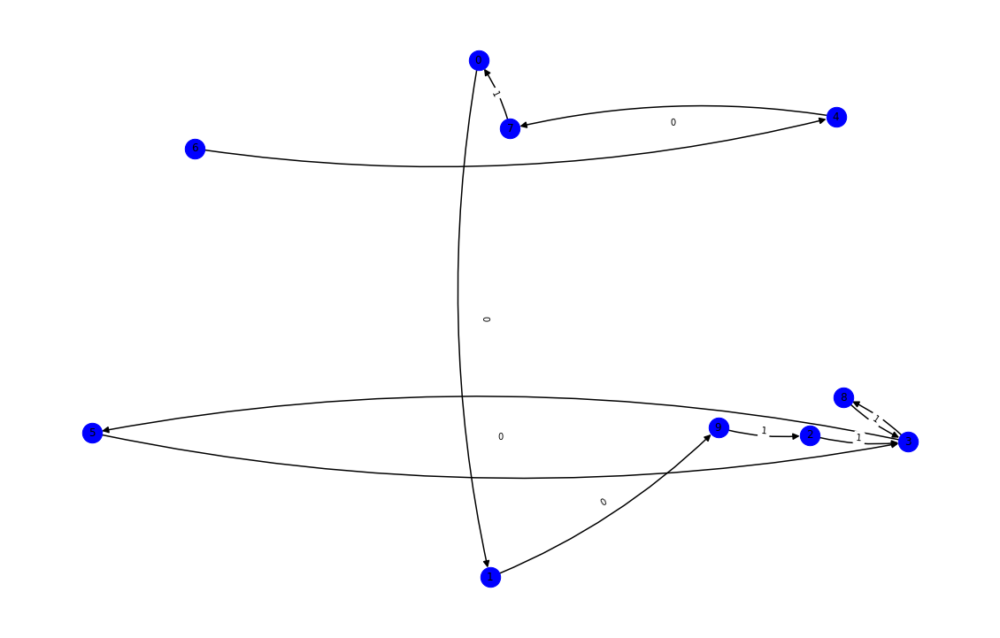

nft-id 48396
mark_dict {'0x32b8e0eba92c306382b037769abf2f6e5d8bdac6': 0, '0x2c5989076d2ede34461748093165ed9e8c984433': 1, '0x1fa47d9a793b9d517eb475a04b00f82b31e8c493': 2, '0x1feb5b84f4e4845ff98d016fba3f00b2e19677d3': 3, '0x5a004109ef6be609dd221ae9e7ac0b4a58bbfdc9': 4, '0x98a40c7682a770829a8ad9e88b58699aee83e78a': 5, '0x79a15c0e305f5c1a7212e9f75f15417ec8741740': 6, '0x249ff8f93211b196c817bf1aafa3a86aee5bf668': 7, '0x0000000000000000000000000000000000000000': 8, '0xd5d2ad5be5f03e51b6dab3dc301424a4db06d271': 9, '0xa6f5b6b68b59cc6381205da63de1061cb464c16f': 10, '0xf46e701ab53e18d270fb2c472f2eae275c01bddc': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


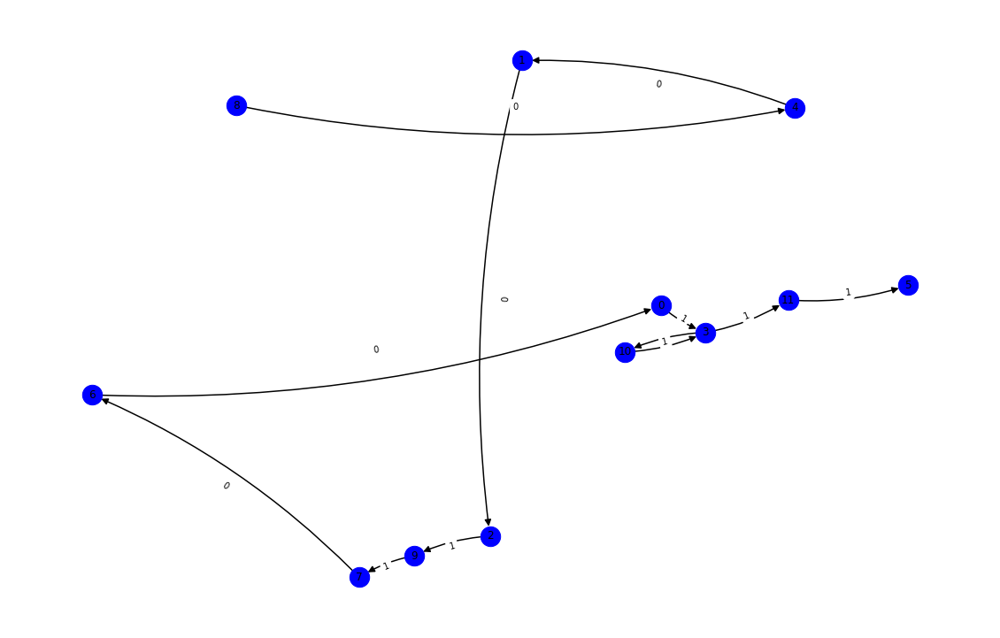

nft-id 95595
mark_dict {'0xe62c8f24f76c109fe7a8291c82b74c3e484d6fc3': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x460f6e1182f9cbe539884a1d859e5f296b59eb15': 2, '0xaa9aa561cb33c212ea3407385bc8b8da0318b7be': 3, '0x0000000000000000000000000000000000000000': 4, '0xecee3103a3675ed294400169ddaa5bbe3d6cf7b4': 5, '0x278bfd54e7e71346f92ef36c6e34145d14f017cd': 6, '0x609997f4e3ae2825cffa8e41f96ad60cc1d0bc8c': 7, '0x38361251439d48e3da0ccf1a55718073fcb45988': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


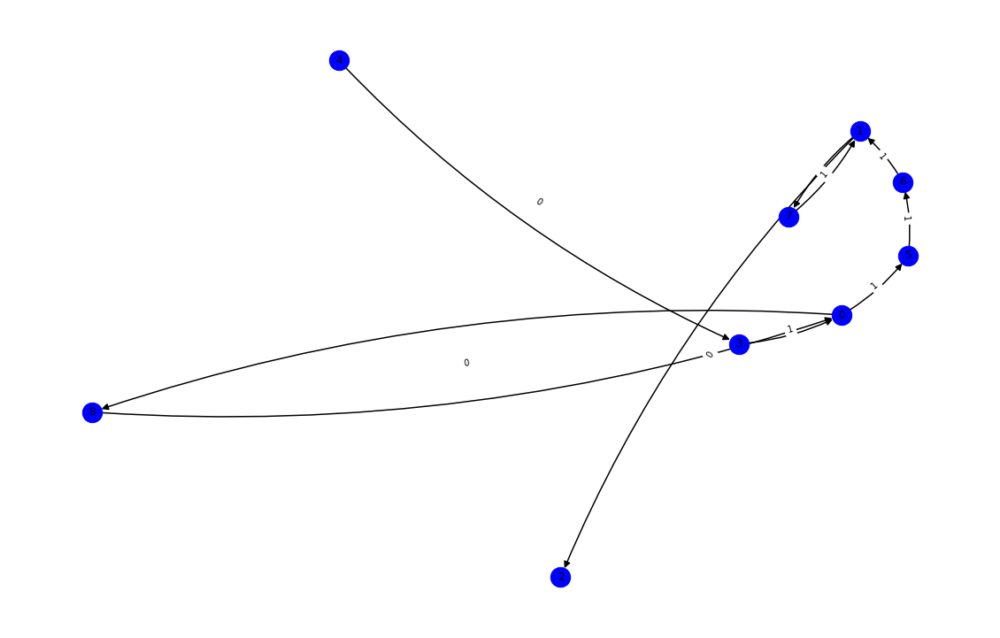

nft-id 48880
mark_dict {'0x66362b929c1a9aaf14c51aab9b455ad7fb8268c4': 0, '0x1a21231e3a92c129738bde1546f0fd4fe8a4b1b5': 1, '0x2c2ed4b3876c442fee80bee76ce0ee2ca2a512af': 2, '0x0000000000000000000000000000000000000000': 3, '0xc0738649740929ef714cc5c0229a1d5fa8138c29': 4, '0xaafa1fe3b8c0b2f0d0305bcc3641dfa326567bce': 5, '0xd79b31e43090fa967f5dd3495b7290aabeacb622': 6, '0x8d0943c238d8d0d3a6d5f2aaa4dafa869a8c3913': 7, '0xb29372607ba364b13d937e9854ace285ca34a9ea': 8, '0x21438493531dfd9ff94c9eee6786d5c22ec287cc': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


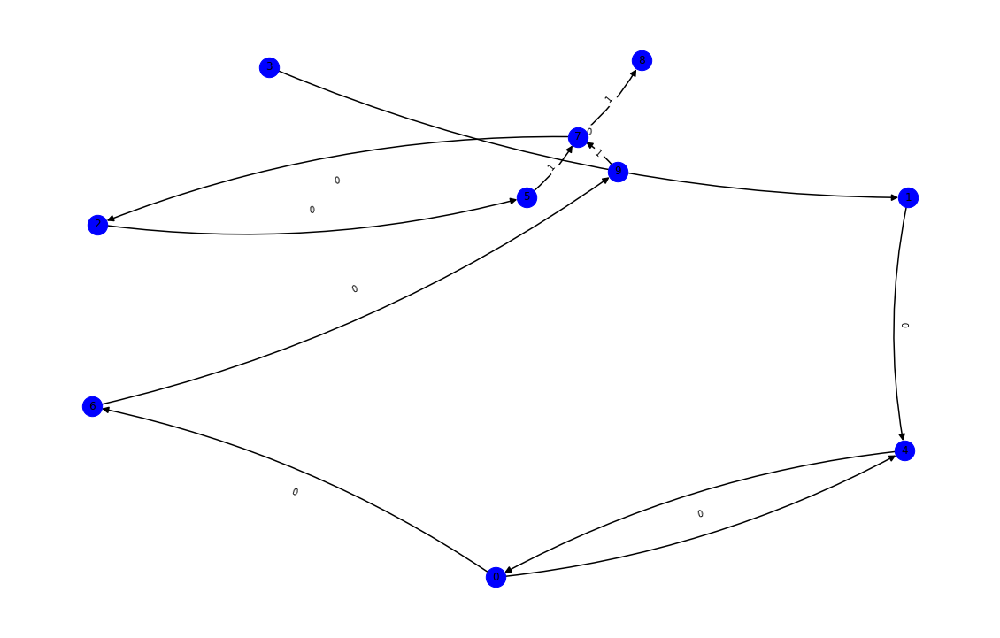

nft-id 72136
mark_dict {'0x20a67f2a6a3b98d10332eeb46493fa759ba52c38': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0x1fbd347cbd656273edc42cb2147a5ef8d1ce7b45': 3, '0x8f4e137decc9d2bcc67d5ec7f00d570b7fcfbf4b': 4, '0xf713ddafbbe6ac3b58679280e2588d0a8d19bec1': 5, '0x58907da38ea48659dcd31f40dbfde799cc2e3bf5': 6, '0x56c3f26268e76d09277fcf09b856ef8f782bcac1': 7, '0x3462d4f128e214f09a5483ab2613fbf13cd4e57e': 8, '0x0fb8891714e5ed8ba9ecc196fca59e76f682fe35': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


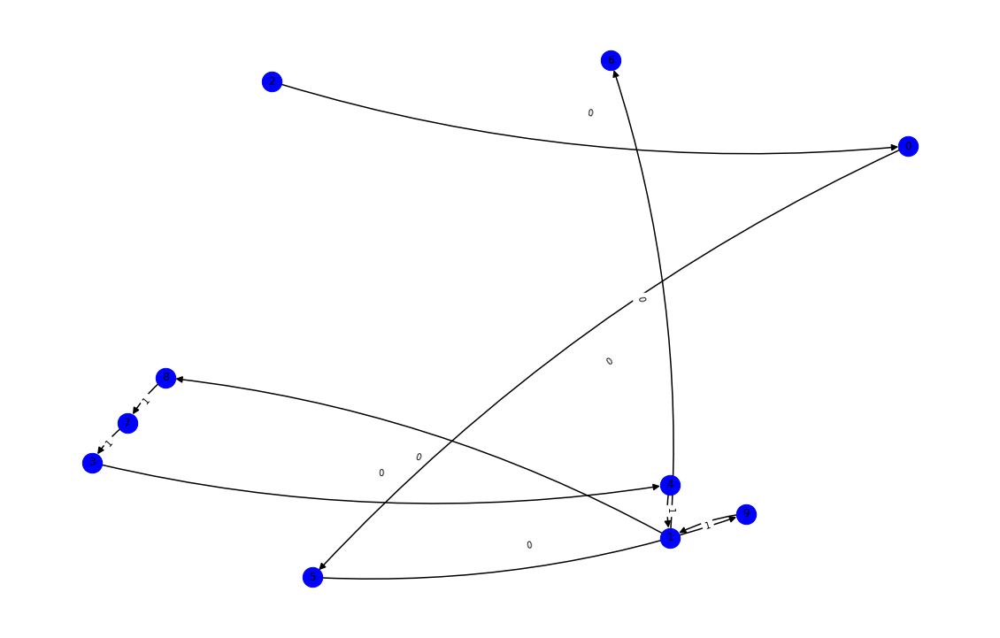

nft-id 76847
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x151c97fe90cb696eaf63a98d2bf73dd7eb464e3d': 2, '0xf179945e6d4b3c56f5b00c6d80ad3c184ccfe0d2': 3, '0x09e3b59d1825c1b439a20256711e44df65b52deb': 4, '0x0000000000000000000000000000000000000000': 5, '0xbf98b2b8e292f743643a8dc6b505c45e52d66238': 6, '0xb05cc045a1fb8979080bc4b226df4b0551855910': 7, '0xe1e7ba7f42a262069b8f296be7cbf9bff96f4ad8': 8, '0x8b98feb706c849ce5b754893a0e4ce375f9263ff': 9, '0xde94e9d2a3009341d1ba4813a7905a25cee118e6': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


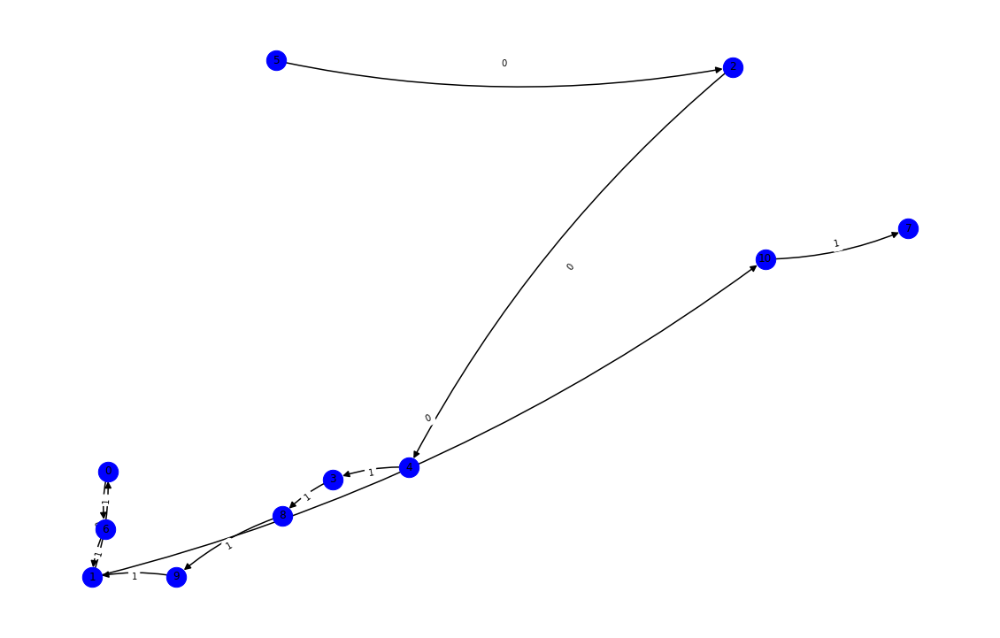

nft-id 64796
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x87e4e2733ba4e4c362027e06258988b34c1876e2': 1, '0x20f581893bb6c21288a081e440b39707b5a14e78': 2, '0xa2aa5cfd25211e613294d1c1494fcf98e92731bb': 3, '0x0000000000000000000000000000000000000000': 4, '0xa8f337cc631c8e7e8d9e966529b4bb41f209831a': 5, '0xec6286fb381761a4637305926a7ac215a2a50be8': 6, '0xaed0bd15e6b8fd728b2c3652453ef61d3bde2a0c': 7, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 8, '0x50f987259debd42d96273d08077d9667194423d2': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


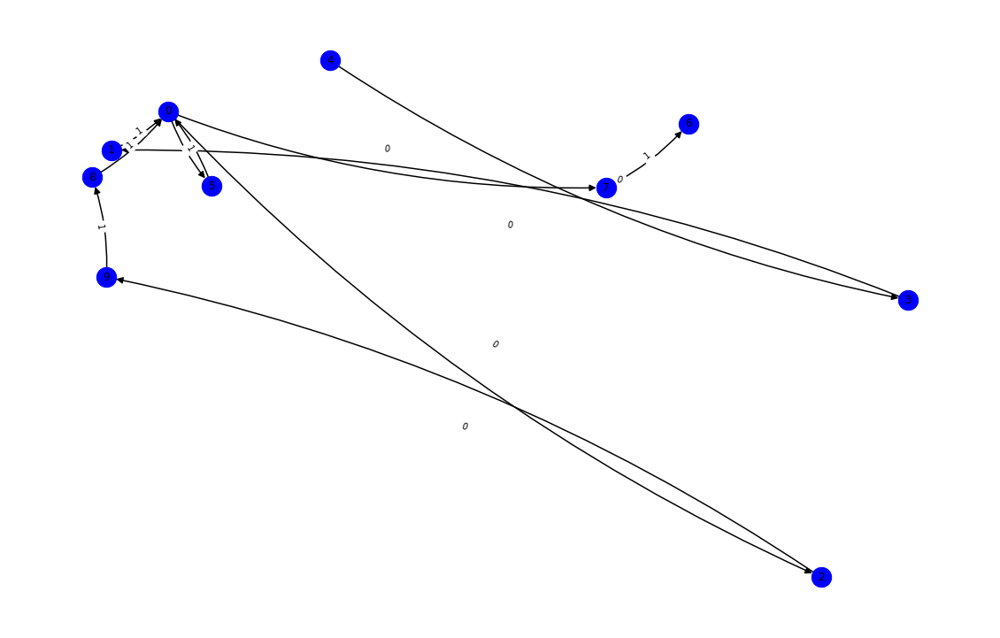

nft-id 74732
mark_dict {'0x00ea222a79d2e3bf9a0ca9430ed1c26ddf93e373': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x47c2ac06520722aaa3e32d99ec6a2352b48b1b8a': 2, '0x0000000000000000000000000000000000000000': 3, '0x14d702bd1ae7a48df5d33c7f873aa353bbc7446d': 4, '0xd387a6e4e84a6c86bd90c158c6028a58cc8ac459': 5, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 6, '0xec7adb95ce0053fe06baa05f0f18bb9787e7d475': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


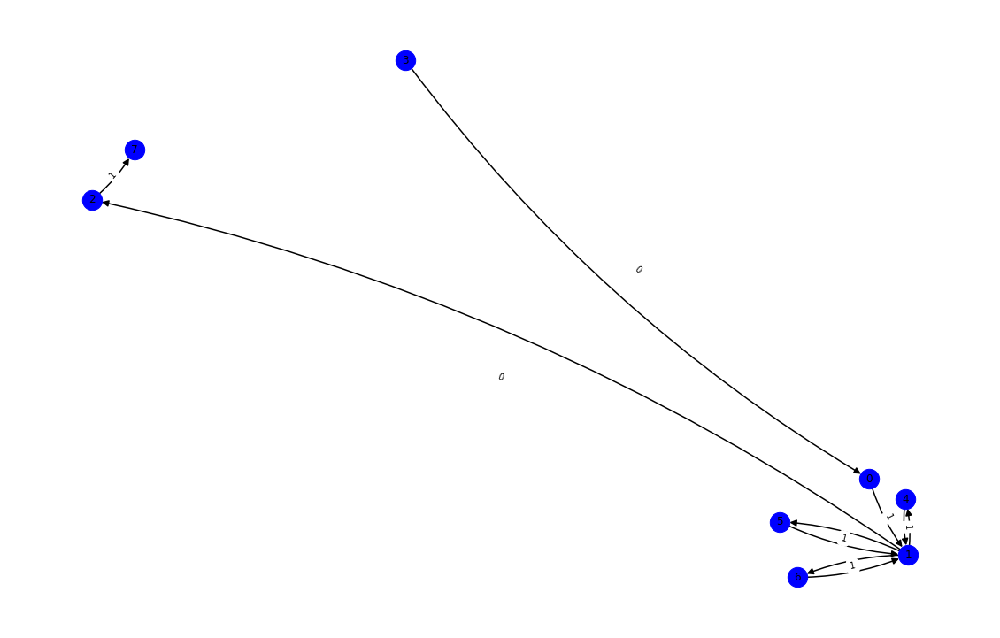

nft-id 76800
mark_dict {'0x43559cc29a955c3649baa503d1f9aad470dec7a8': 0, '0x18d82cc691754ea6db4018004de61fce8a63f392': 1, '0xa9ccbc59f2aee8050e1a36dedff13b504eb122ca': 2, '0x0000000000000000000000000000000000000000': 3, '0x3310fd13c6c55f054cc128439e1e51cd0cb16fed': 4, '0x08f7805c98d9201aab03297ec844466d24aea4d8': 5, '0xdbdadf9cab68cd2ad144363e13f05340653494f6': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


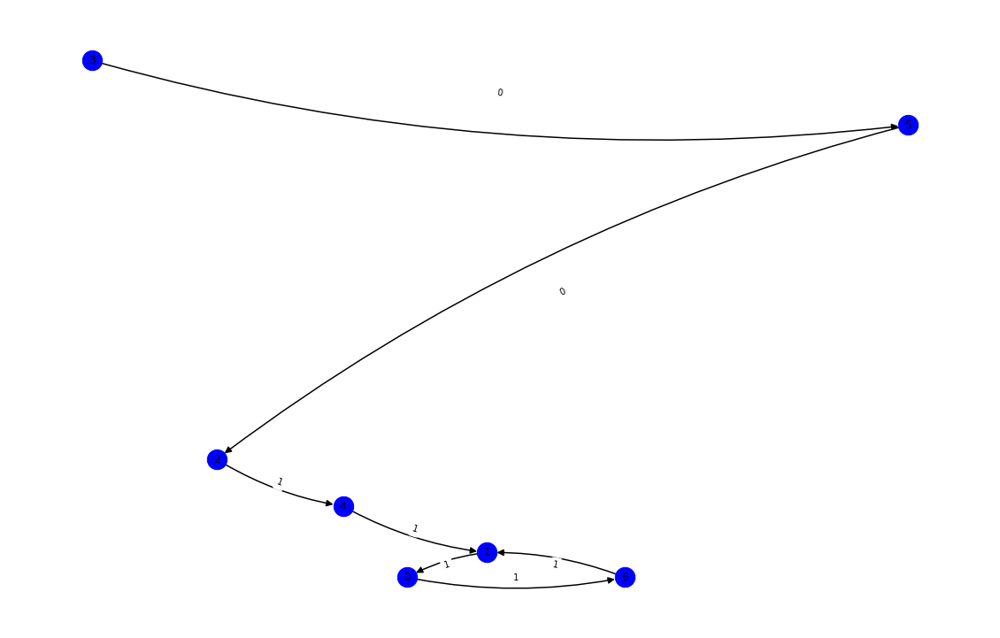

nft-id 91359
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x36c1625e5ee6fbfa9fadd4f75790275e5eab7107': 1, '0x2448247e25220ac04a9048ac563c5edd5b5644ce': 2, '0x76e6c5eb3eea55f153c69eca712f7af0fa13b4f0': 3, '0xa86accaec249da876240c786c30dae4602191504': 4, '0x939843151738488667dbf938276fe8705041d7ef': 5, '0xbbe008b31612277754e2fb915f18829949413371': 6, '0x428962848736afb8c671d3e074343b54842a1a7e': 7, '0xd595710aedaba1d2e18bfdbab46ab796664c6d89': 8, '0x0000000000000000000000000000000000000000': 9, '0x0279b630cd278250d57f7648843d3ab93f7e00f2': 10, '0x3a69175deb3fd7d4cca55b9f8ea4da9b819b79f2': 11, '0xa93e87c7d026598d8706dbe46a0d949848a2dd2f': 12, '0x43e0845c5fcb1688663e027d3d212a6e1b81fab3': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


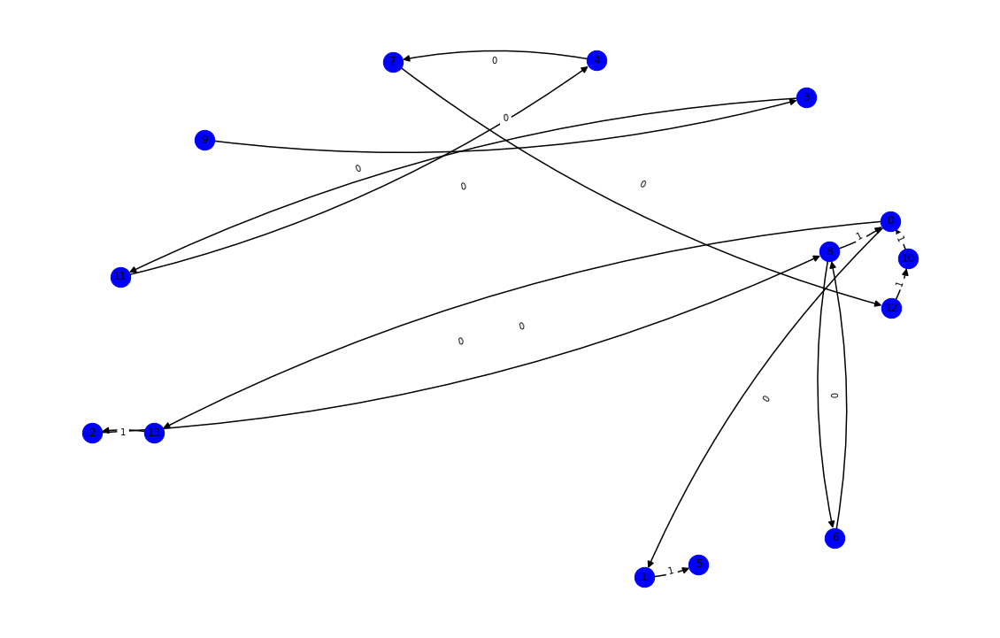

nft-id 77033
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x4d4d5236d1160698e21b44fcf6b35797081c8fdf': 1, '0x0000000000000000000000000000000000000000': 2, '0x1fbd347cbd656273edc42cb2147a5ef8d1ce7b45': 3, '0x85d4546af89b85160739c6ac22c00929268f7ff1': 4, '0x6bb51046fc5b71c5fe36074f5fe59dafdd3696cd': 5, '0x8f4e137decc9d2bcc67d5ec7f00d570b7fcfbf4b': 6, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 7, '0x238a43be559a812f0f0fefc7edeacedd766b9540': 8, '0x881749e413f9e67998bb9a49f1e068f1129942fa': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


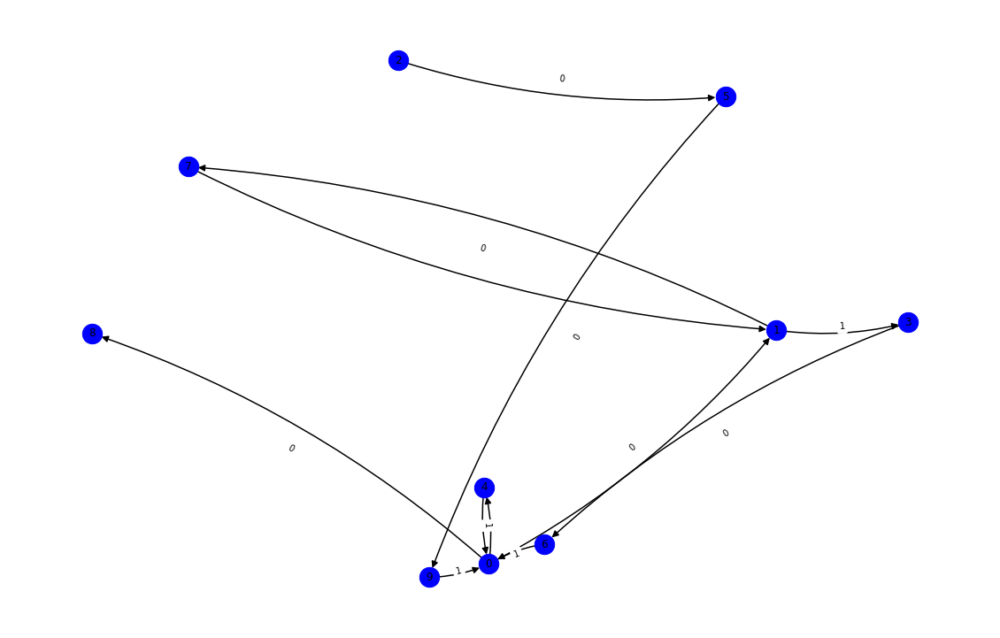

nft-id 52263
mark_dict {'0x1a5f1cc47f71067f736721360506b2a6250bcbdd': 0, '0xda9f28a1b0ce18b011a404f3372d98c3e3143569': 1, '0xdad19177128fc63b9de5aac7c9afb08ede8830dd': 2, '0x3b2da9b708e6c5d43d59d2d5014139f017028352': 3, '0x376ffeff9820826a564a1ba05a464b9923862418': 4, '0xbaa593844f49c01e42f3f691833905796c0d9565': 5, '0xc35a5fec6be6957899e15559be252db882220b37': 6, '0x3d5660e507c6028bd2ee8aeca0b829cb54e77498': 7, '0x41138dedb73de36150e778bf717a9316ed740ca3': 8, '0x0000000000000000000000000000000000000000': 9, '0x6b24a3135cea65fa25a5c8ab67c413c74e5eb50c': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


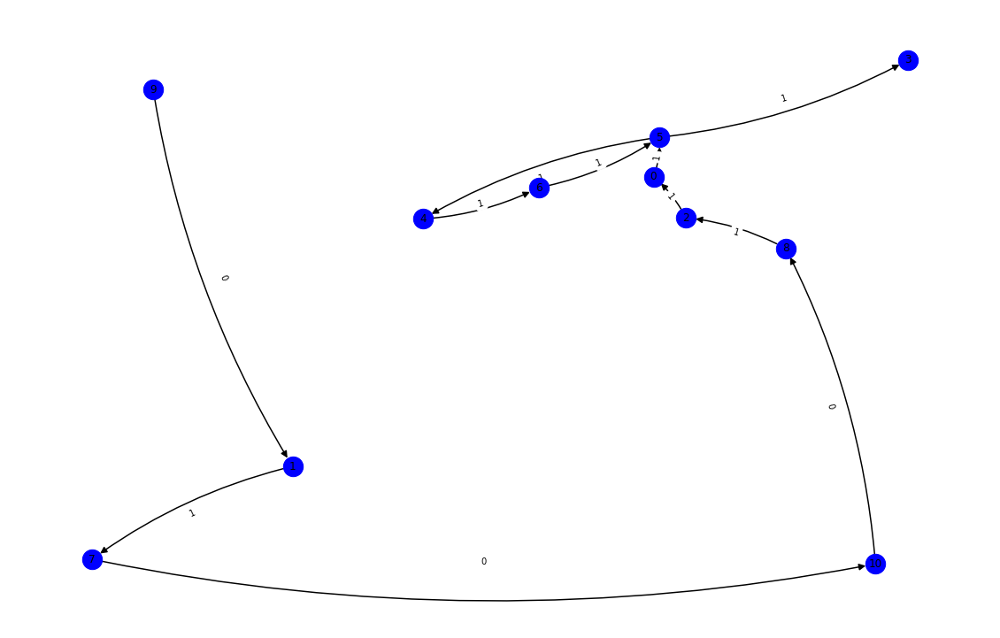

nft-id 59722
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x2a283f37dbe1438cb0e68e4d46bb4d145f762789': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x1a969604e7c715324906bccc5f82d609d2e0c0f2': 3, '0x3ce499f80579f121ab1588fe7ba30d534fc0c7c7': 4, '0x0000000000000000000000000000000000000000': 5, '0x223112140c2aea1a64e3bde5d765ab1f3d9c0897': 6, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 7, '0xa86f87983ab8300dfca4478a3bbb6814a628ca14': 8, '0x0ddd875f5f8ce6538ae02e7b823adf16a0235645': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


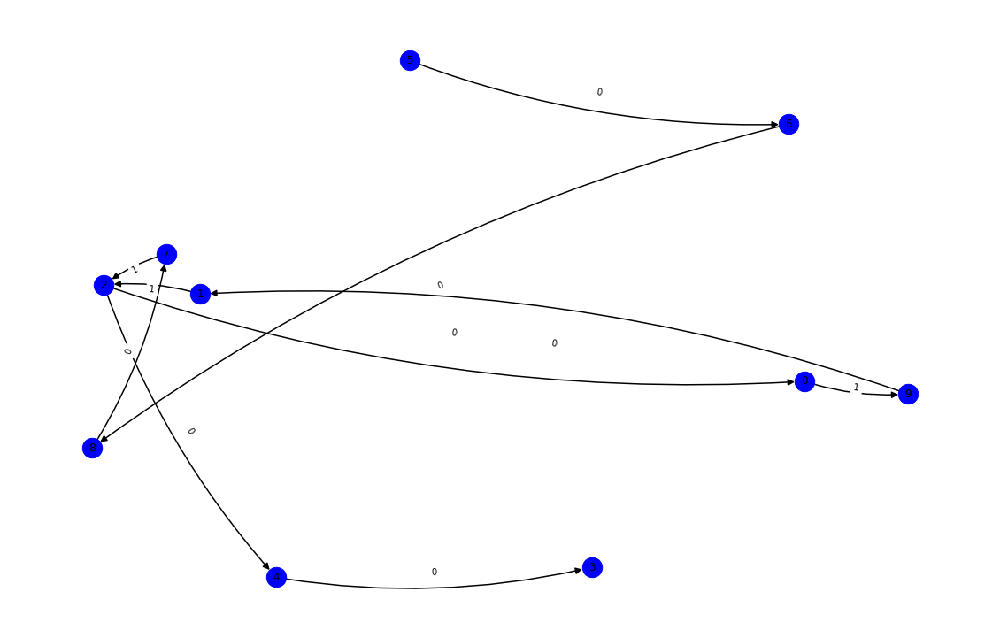

nft-id 17044
mark_dict {'0xd29719e02a1c7dd3363f96a7fc78610f71cf542d': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xd5588a1ba34a46dc0c5e75e886a3236ee2b6ac9c': 2, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 3, '0x334c036e3125dcb6d93e9b998f6d9d7a1be4b17f': 4, '0x53eb1a724fcc724b9e508095870c0f74937f9cab': 5, '0x5ef6ef38bf04859c48400d574e9c82125e92df76': 6, '0xa8a8a9d77568d922a1e47e6ed5fb67e8499a29ad': 7, '0x0000000000000000000000000000000000000000': 8, '0xc888c19a101979e0c29274895a86f0c3bab6cf7b': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


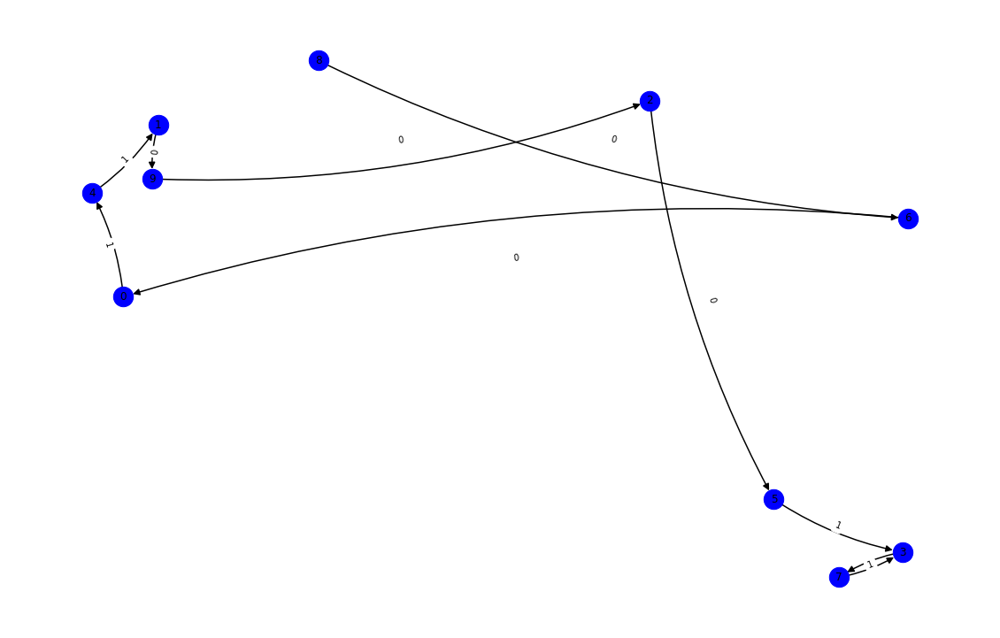

nft-id 20646
mark_dict {'0xbec5561346c9a8a64443c45a9ed79f7e3d875c35': 0, '0xc64c29e5fffa41941d579efde8a2840ab5e05067': 1, '0x0000000000000000000000000000000000000000': 2, '0xbeffddcf2e84106f77c2b60445dc257d65e19a26': 3, '0x7687edc7c806293ee5dd1d26541888598713f51e': 4, '0x388e4f1a87953f98ff91770dfe164b056d23b001': 5, '0x034af3740ed1791b3031a97d9dd3cdf30491dc85': 6, '0xfa0e027fcb7ce300879f3729432cd505826eaabc': 7, '0x4fd895a4559ca045d2174459a168c037816d03d1': 8, '0x91ddda87adbfecce62a5c803e0c1e7c91e8f37db': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


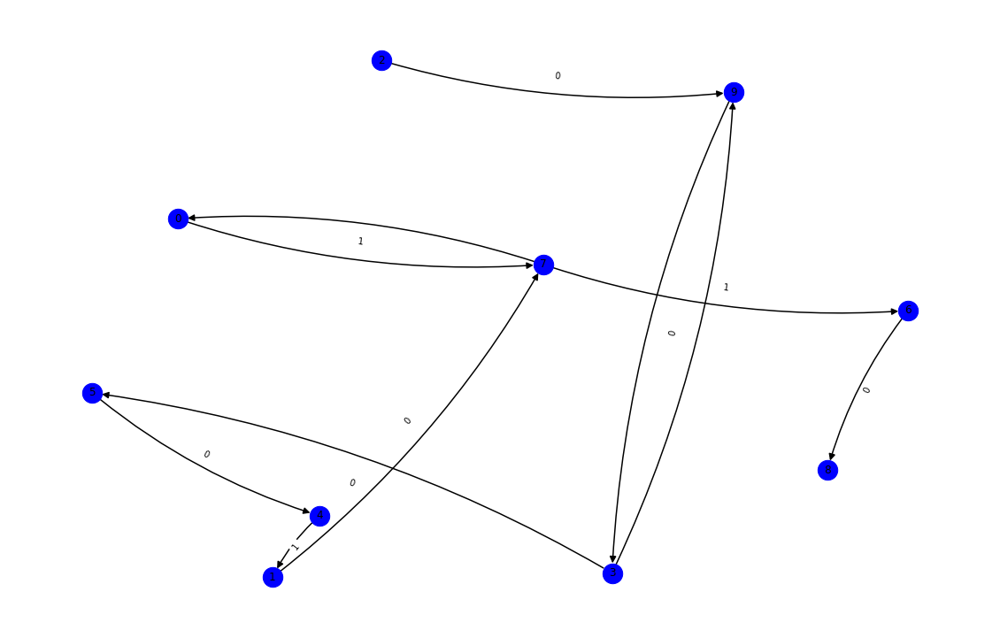

nft-id 16474
mark_dict {'0x894f392ce067e73e128284056e2f3d4ab7d652b3': 0, '0x8ad3668b088bf7abee6488da8f6570e8c3586c22': 1, '0x6f74f38cd701d3f6e8f6bacfe29dc65ce7d42d34': 2, '0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 3, '0x0000000000000000000000000000000000000000': 4, '0xd2d18409949978f22948f76ae584ebc09115145b': 5, '0xf14afa6a2960a3e79a9a1d617405907f67a7f9d4': 6, '0x188e700338e0c89b82f9171e93d0504ae0105eee': 7, '0x750acaeb9c1d61596694ea7bfe8458a74147fa45': 8, '0x0af290e54582992b27f7c54acb286db9f4f24fb9': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


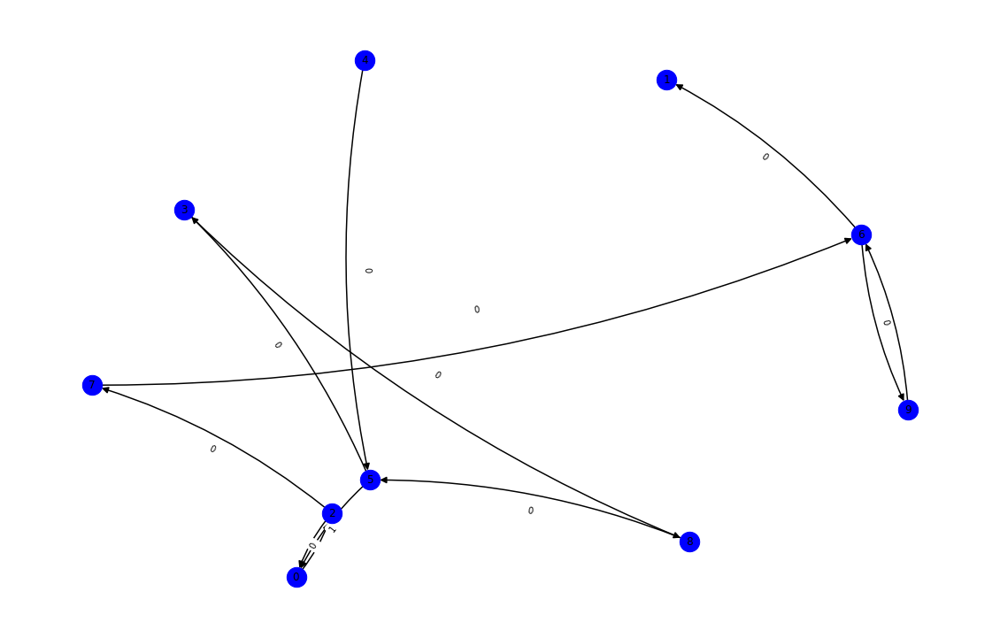

nft-id 77730
mark_dict {'0xb3c31df0aa5bc6511006719dbd4c7b8fde6a22d9': 0, '0x6505491adfe51412e65e0e4e2918865df1349183': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x645a569d3dd2a495312c5f806dc3c2a622cfef13': 4, '0x8c6c8f26b48549295c8ff74ee64f319468a9176e': 5, '0x6216a53dfb956e3f86056fc515f70e6c0c21217a': 6, '0x4bfb5a38fbf1c43891ed424817c18210c4463b9e': 7, '0x687de619b98a32d3a1f02f80a7bd494fe656eac4': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


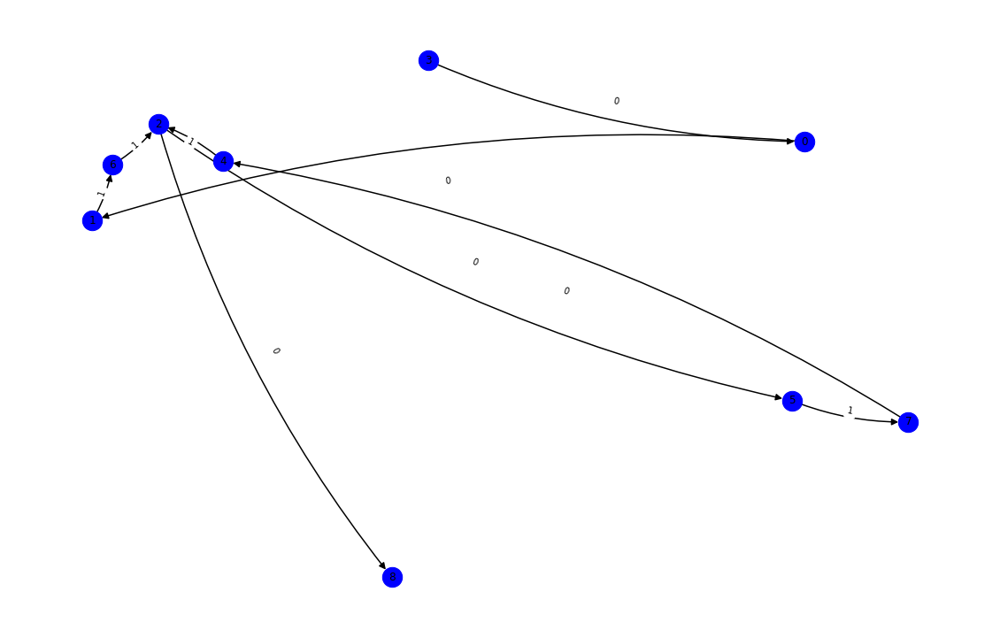

nft-id 98781
mark_dict {'0xc62184ac04a0610147bd890ba32d1918b67e017c': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xbd59e4b78fa4eb524261880cc430d8228ec83ac7': 2, '0x0000000000000000000000000000000000000000': 3, '0xd7b59587b7020616f66d1b7e27872cafa03e4e3d': 4, '0xa76a8e68cf6284543d19da9c12f446ab860cc831': 5, '0x26f0394e4ad5b9814f58eb078e7ea917fb828c6b': 6, '0xa2d76c09b86cf904f75672df51f859a876a88429': 7, '0x5ef8a647a6de87931a5aab22dc654abeee03ac97': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


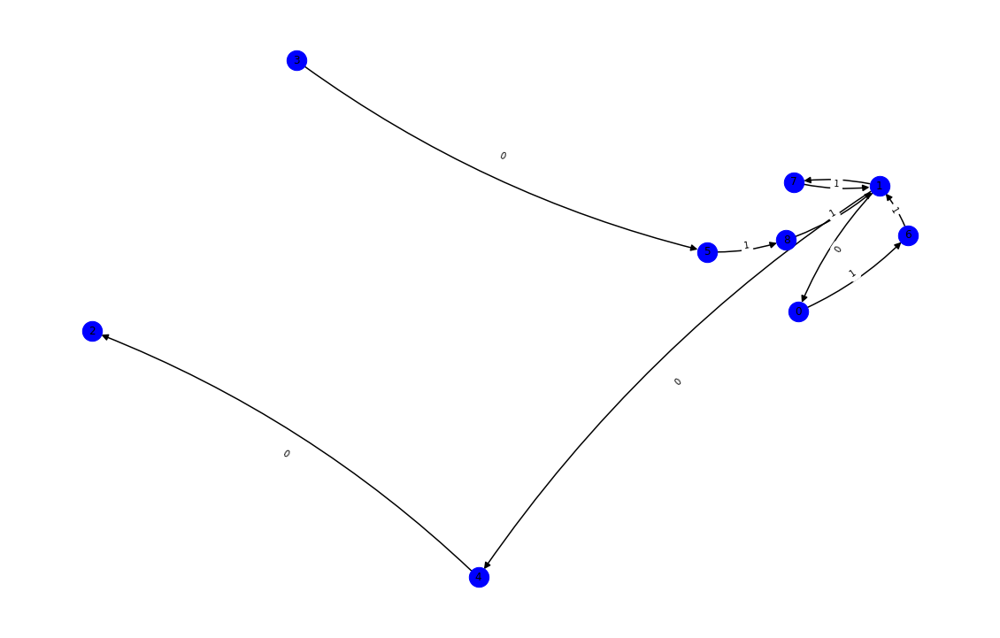

nft-id 64051
mark_dict {'0x39ae354027b99fbced00b6b8122113af5e8686d0': 0, '0x15e37293bcd44422b60c227568cd58403dec3e5e': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x36c1625e5ee6fbfa9fadd4f75790275e5eab7107': 3, '0x0000000000000000000000000000000000000000': 4, '0x12eea318976af59f266b99b8f2245c3cdb8c5cc2': 5, '0x1297ec905fb1720cf44c02aff8aba5c039b9f982': 6, '0x445ad7de9c9d811e4de582dc4bba766b9811e8d3': 7, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


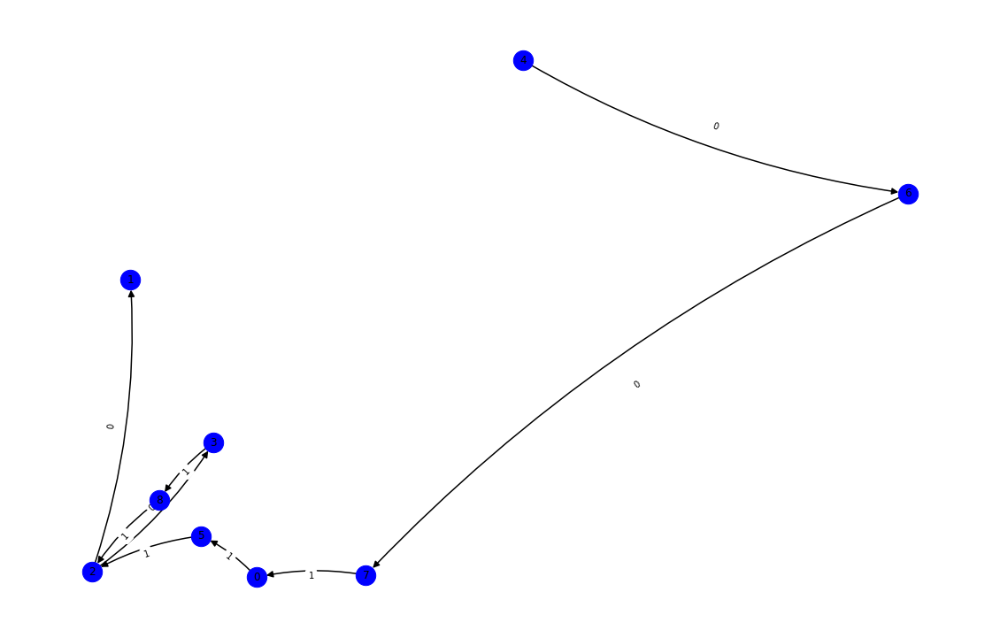

nft-id 98572
mark_dict {'0x69d2fd63f319abd7d736d49658e81129fb84404e': 0, '0xda215a4ec29e516eb1a4f3d7a168857e4132fcae': 1, '0x15e37293bcd44422b60c227568cd58403dec3e5e': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0xb0ffc78c832d2cf7fcc63f79238fdd720b5cee35': 5, '0x2443047e6ac82fe65035e36e971316d981492857': 6, '0x4682f2465436e97f25acf00484ae40eb60eb9a67': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


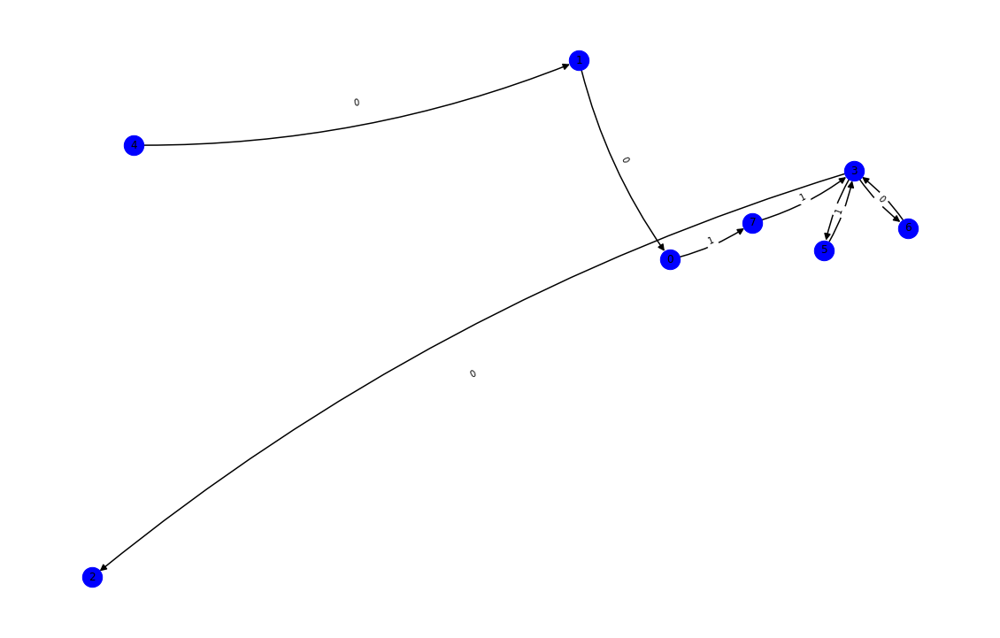

nft-id 55280
mark_dict {'0xa099ec99966fa615c29b1ec56ce403fe655bca40': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x1fbd347cbd656273edc42cb2147a5ef8d1ce7b45': 2, '0x38345b9d3b617e6125082963af9fc4255157366e': 3, '0xf83802f2a08e9905122cd05717fe62ebe9d1a759': 4, '0xc50a22db7d7d98e58a7ec76cf93aef5ffe1dd801': 5, '0x0637abee45a29b9d72b65e3b18142764789e94fe': 6, '0x6d8610a39d293e9397103f95a3e7562b8d1be186': 7, '0x2a47daa0b12a3bae26ab3b0392543dd4c3073994': 8, '0x7032739876e32b1256e62d17c88c011815d53362': 9, '0x0000000000000000000000000000000000000000': 10, '0x9b5debf0d20f7ecaac37f60b17492c3caa1e135a': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


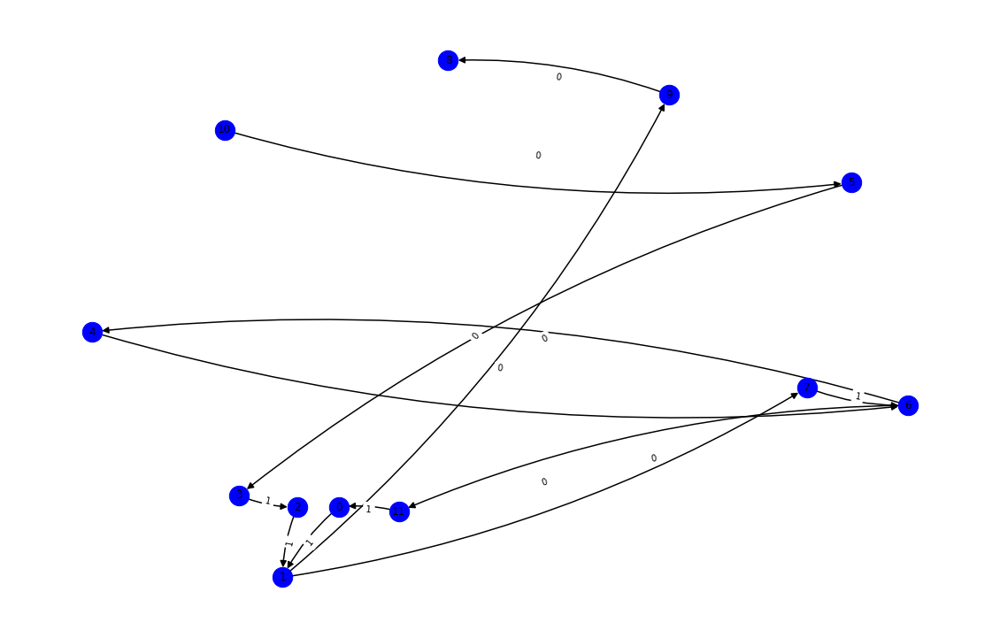

nft-id 55878
mark_dict {'0xf4a08f427b59308c81518ef2b3ca67e01b832365': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x0000000000000000000000000000000000000000': 2, '0xb4ad833d6f3b3c4426fea59ded207a952087f47c': 3, '0x50fc6a743045f15371098ad28547920c889c7866': 4, '0xa697f80ae3e365d232c656c189446a6b3dad6d35': 5, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 6, '0xe6787a6ea1c9faa825c26640cca4b43c3d8b8d95': 7, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


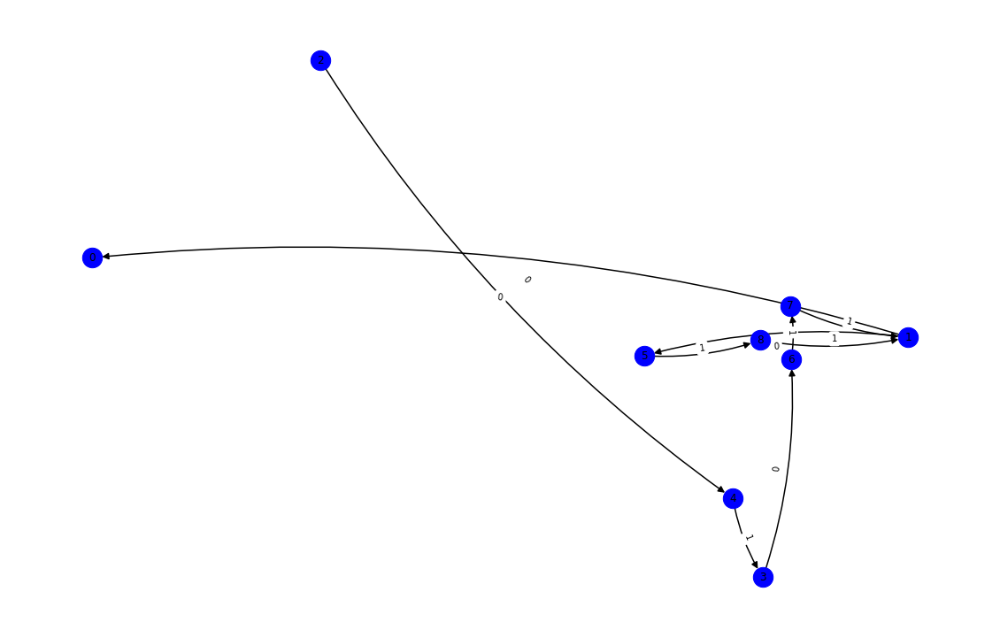

nft-id 54335
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x426dab4091b3848d0f06c56ccc4ea2dcc91ddb24': 1, '0xa61f21e490cadeec26d48e1bfed6393b753420a9': 2, '0x0000000000000000000000000000000000000000': 3, '0x2443047e6ac82fe65035e36e971316d981492857': 4, '0x84da4dcaac3287cdcbf50f70865143859dd15626': 5, '0xfc01a704f3223dba8fb7bafe0a0e9fb5325d6952': 6, '0xa2d76c09b86cf904f75672df51f859a876a88429': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


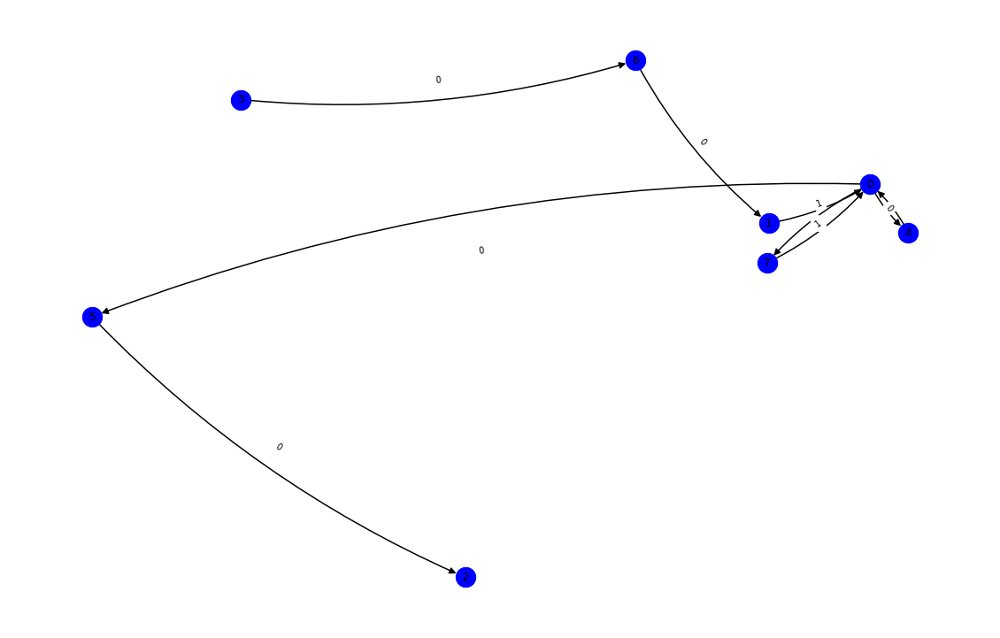

nft-id 68081
mark_dict {'0x3cbc3bed185b837d79ba18d36a3859ecbcfc3dc8': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xc823cffe9b3d746cb6a7bf23a052841004c41442': 2, '0x8c623c4de9e51dbe98a3c5fa298e03667a3c3149': 3, '0x4725eb88739b83d141cae12aa6ae71e7e68d411c': 4, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 5, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 6, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 7, '0x17374b2b0633b8227033fdb78912fc9cdd479b20': 8, '0xf33316440dc8f3302a4337c832700d16053fb3ef': 9, '0x0000000000000000000000000000000000000000': 10, '0x75f4cf79b563bb629c227fd95b989126be6d5fd6': 11, '0x2443047e6ac82fe65035e36e971316d981492857': 12, '0x6141ee2a0f53255c79b629e2830b9ab2617c76a0': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


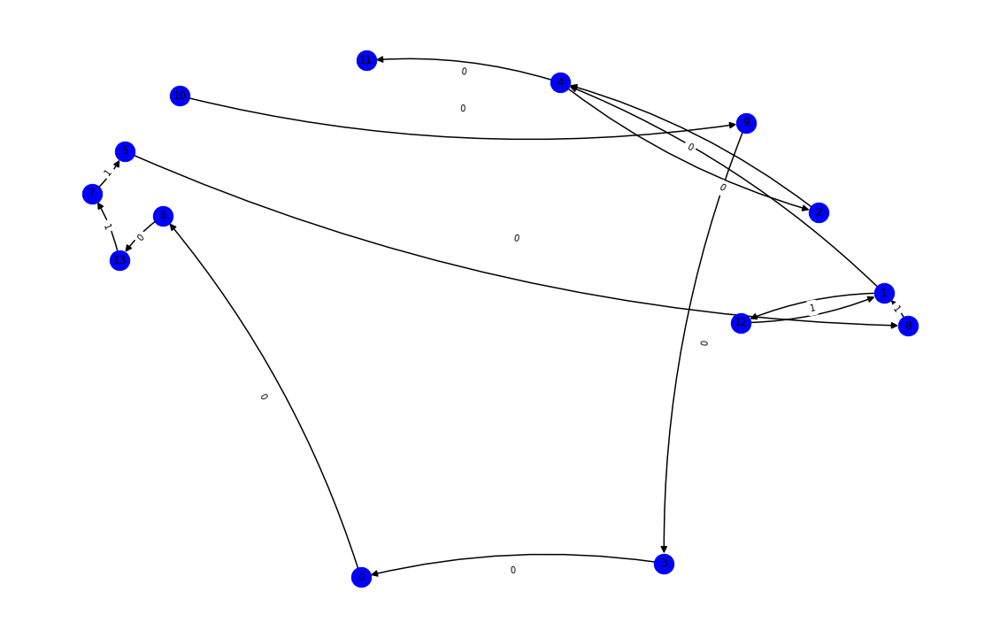

nft-id 71109
mark_dict {'0x0000000000000000000000000000000000000000': 0, '0x7f84e5c1b910b6cf82473bf0284622f6b219b888': 1, '0x5dd34bc1937f76380e9f1bdbc5638a38e2a33359': 2, '0xb68daa2725edb70f9389f0dce80a0c7f9b76ffc9': 3, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 4, '0xdefaa8232a0e30b84a5183a6e3bae0e8eca877cc': 5, '0x408a2b89232738f7a254d1d91df392a0316eb79b': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


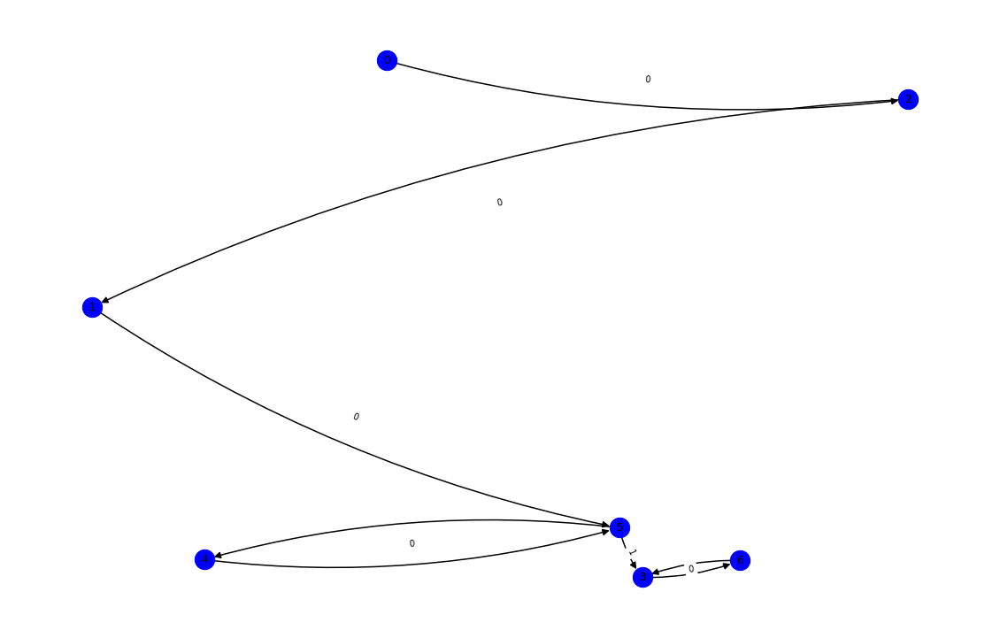

nft-id 46739
mark_dict {'0x706627e3e75b0603c4b6f9a1ebbfc635da712747': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xdda620afde205a136e335d7dca851837a4a2e2bd': 2, '0x66d4908e053f7150038b1bf3579cf384fde0ba72': 3, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 4, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 5, '0x0000000000000000000000000000000000000000': 6, '0x44b7ceba29244fa96ee87780e5a5304bc28d3de7': 7, '0xe8f6bd0fd3cb52fc8a548c6872884a07a2ac45c7': 8, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 9, '0x1e5c44a9e09d309d0294038aa2c4949ffa68b6a4': 10, '0xb65b7556e6be6f386d0e1438391ebbdb5dd7254d': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


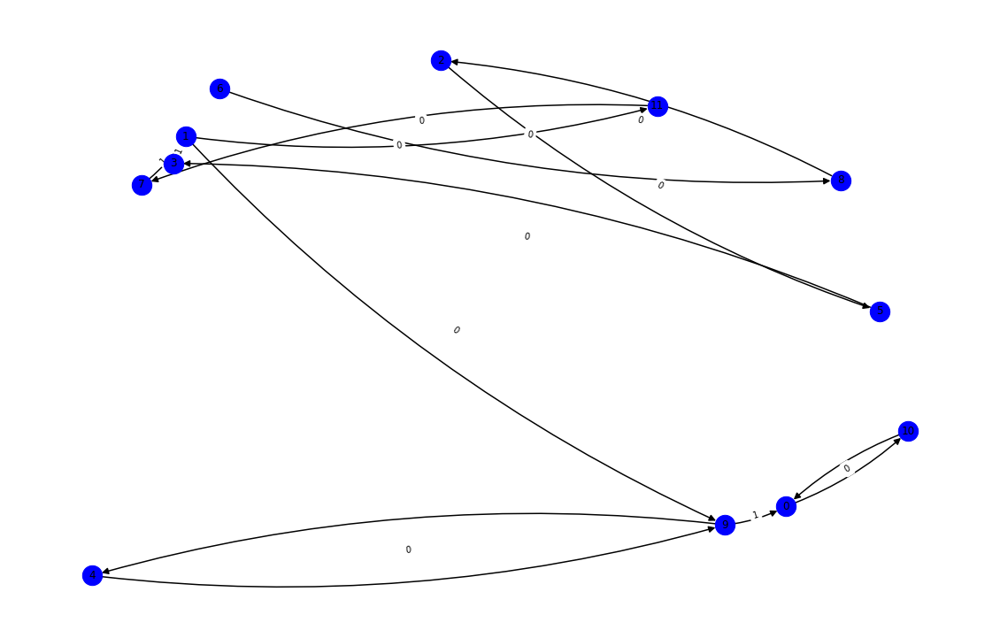

nft-id 45021
mark_dict {'0xbf298d660282a4c53372518859ac9f0f95da8f3f': 0, '0x0c55b13cec1df9a2acac90d16e80105fc3207344': 1, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x2443047e6ac82fe65035e36e971316d981492857': 5, '0x188e700338e0c89b82f9171e93d0504ae0105eee': 6, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 7, '0xa2d76c09b86cf904f75672df51f859a876a88429': 8, '0x70a16f2a51dd6a32b42c41afbe15772d652abaff': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


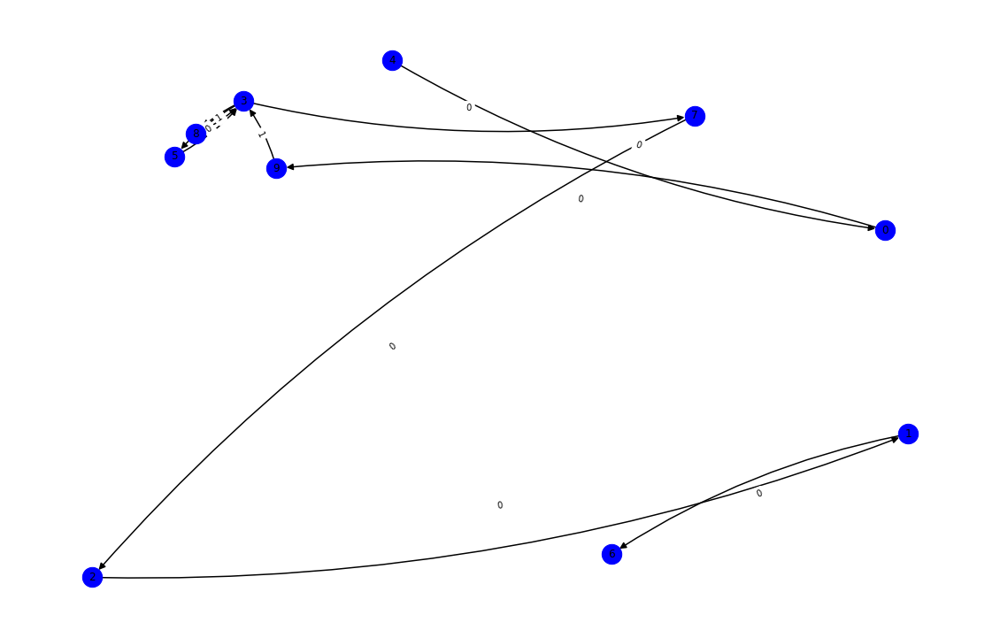

nft-id 62727
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x911286bc7560ea2a186964d705bee023122b3582': 1, '0xdb3be154aeb741867196a918fa2bd5f704dc022a': 2, '0x5162b984d8f25944c5ef72bd57449037d0b10534': 3, '0x8ae57a027c63fca8070d1bf38622321de8004c67': 4, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 5, '0x9b4793bdddf5abd0032683f3b4ecd182e3853729': 6, '0x0000000000000000000000000000000000000000': 7, '0x2443047e6ac82fe65035e36e971316d981492857': 8, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 9, '0xa2d76c09b86cf904f75672df51f859a876a88429': 10, '0x2f56e2a35305b8dbf1466182afb2cf4f457e65ec': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


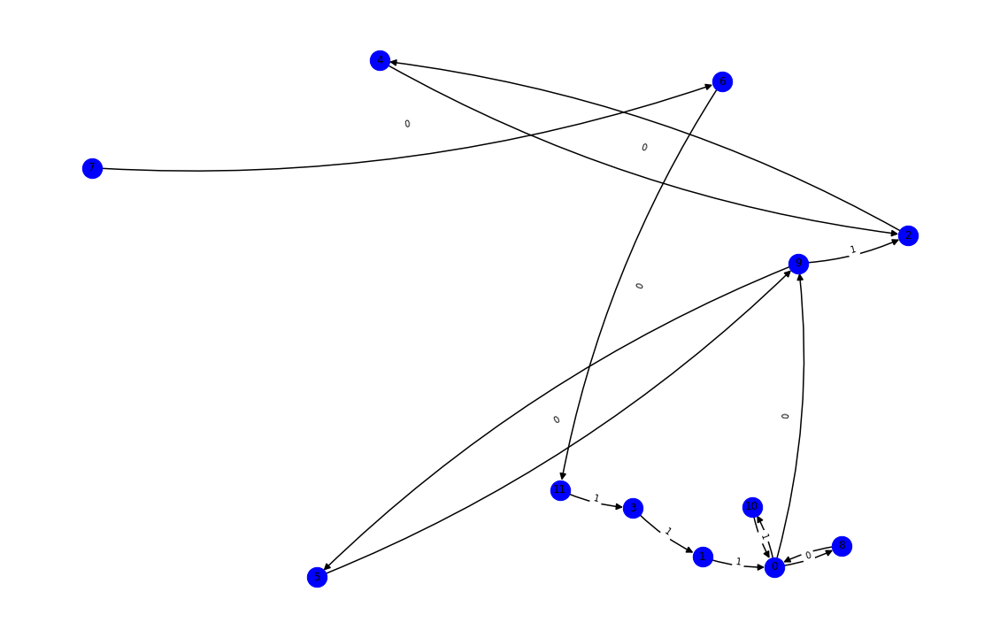

nft-id 69213
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x381f843271a9e710000e28f49a078130fa01a99e': 1, '0x2cf5cf9a7bfd6713c62812112ade9f7c2f3604be': 2, '0xe0fb8fc2e793848b8f98e22045f67071e0f67990': 3, '0xa135160a08330758090f75bb24a81c49c41f4d77': 4, '0x88140a43cbb6b43af84d239c5fedd5af693fdde6': 5, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 6, '0xe6b4cd8d3f0de86836f74c9e6ea24325219f2347': 7, '0x00000000a50bb64b4bbeceb18715748dface08af': 8, '0x0000000000000000000000000000000000000000': 9, '0x2443047e6ac82fe65035e36e971316d981492857': 10, '0x62f96ade4b6f90ccfa465a505bac74ee82d47315': 11, '0x61f2213187275105efce44e818627af2816cc0cb': 12, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


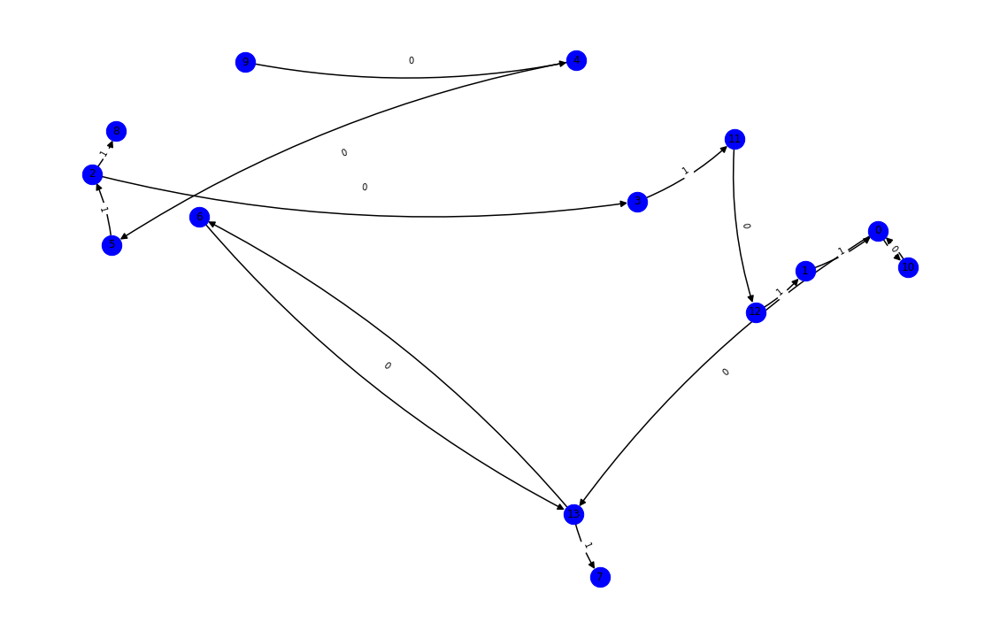

nft-id 75221
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xa2d76c09b86cf904f75672df51f859a876a88429': 1, '0x6218c88fa911c38f335cbda3b32205c8704fd721': 2, '0xf97e9727d8e7db7aa8f006d1742d107cf9411412': 3, '0x26b6475143d83d055321795a17df12d351647fb6': 4, '0x482979f11f17c853f3a526a28d5d9381cd8aa635': 5, '0x47013a72e4d91aeecc8befbe5881e0c34d6be887': 6, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 7, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 8, '0x0000000000000000000000000000000000000000': 9, '0x2443047e6ac82fe65035e36e971316d981492857': 10, '0x4682f2465436e97f25acf00484ae40eb60eb9a67': 11, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 12, '0x4c660ead9d1bc5f7cc52b4df80f0010d15cf7d3f': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


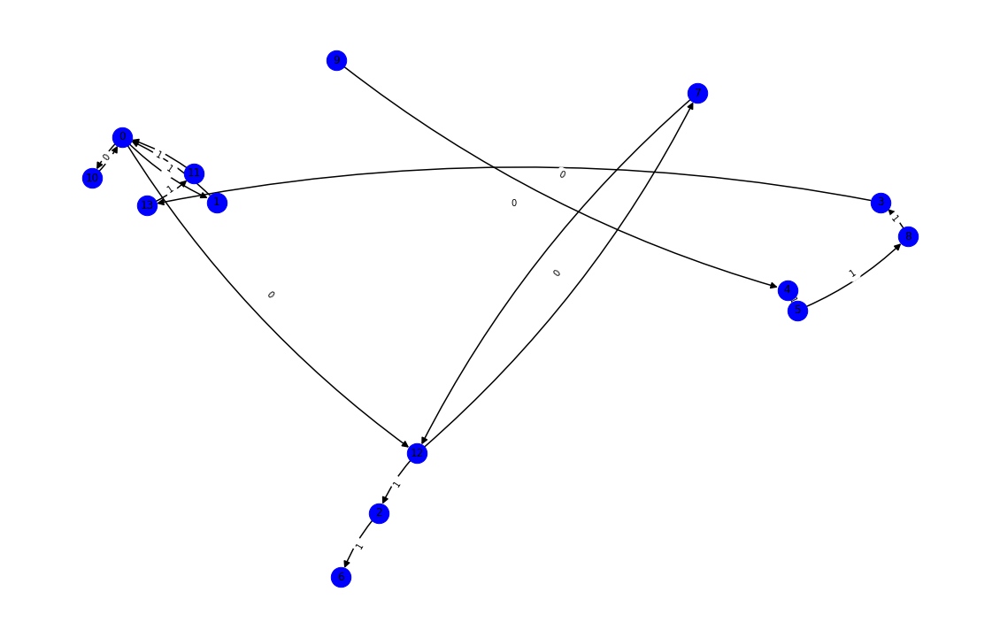

nft-id 77922
mark_dict {'0xb2b197c755dbc5db7b910784ab3b25614857ed4a': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xf7690afc8816bf9ef7f1db08271bb8c00a7e041b': 2, '0x9fb091820845dd2460083123253ff1636227cb8e': 3, '0xabd0829aa988e24bf1ab4c6c6d1c61fe29371a1b': 4, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 5, '0xb9260b99184967196c8d7ab3476da8737878ee78': 6, '0x0000000000000000000000000000000000000000': 7, '0x2443047e6ac82fe65035e36e971316d981492857': 8, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 9, '0x4fe265c496cb69f3e4b7cffb24dc4b5a1bef1c95': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


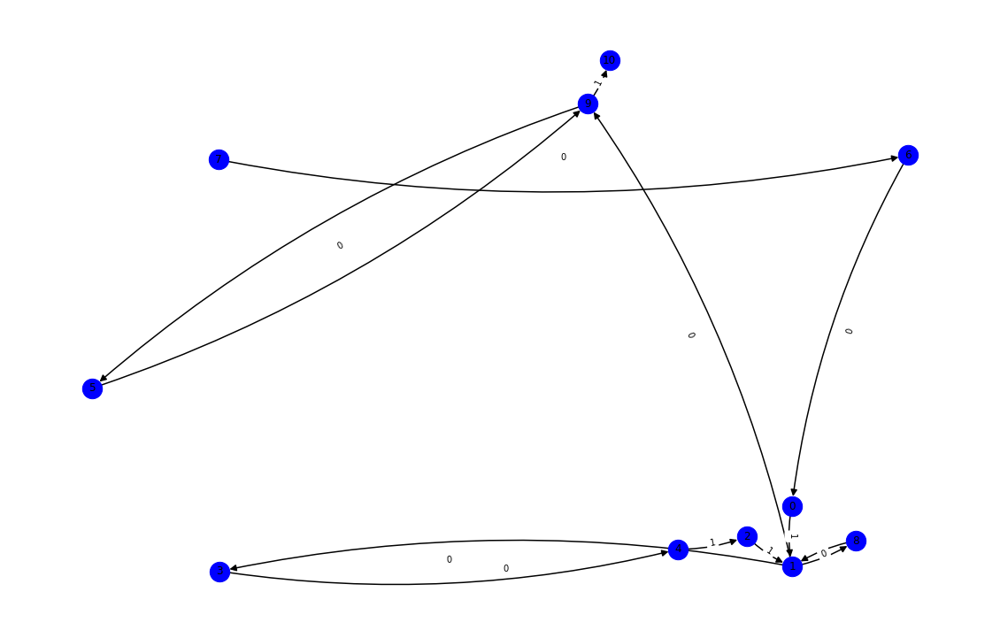

nft-id 78612
mark_dict {'0x0f6e851cf5cb80ac5021104077a49486ccfcc99a': 0, '0x706627e3e75b0603c4b6f9a1ebbfc635da712747': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x58b61e42aa936fb30e119d1aca2ed74917a823d8': 3, '0x7fba88d457ea4b888f10cbecc101f86e36281810': 4, '0x663d2fcc969cbb755de5aa3ef0c1bbf08f1ca077': 5, '0x0000000000000000000000000000000000000000': 6, '0x4a208b704e20f8f7881d68bc34339f63f48ace88': 7, '0x2443047e6ac82fe65035e36e971316d981492857': 8, '0xd37cd4a22beec6935bb0da437901258f8d8e19fa': 9, '0xca86d57519dbfe34a25eef0923b259ab07986b71': 10, '0x1e5c44a9e09d309d0294038aa2c4949ffa68b6a4': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


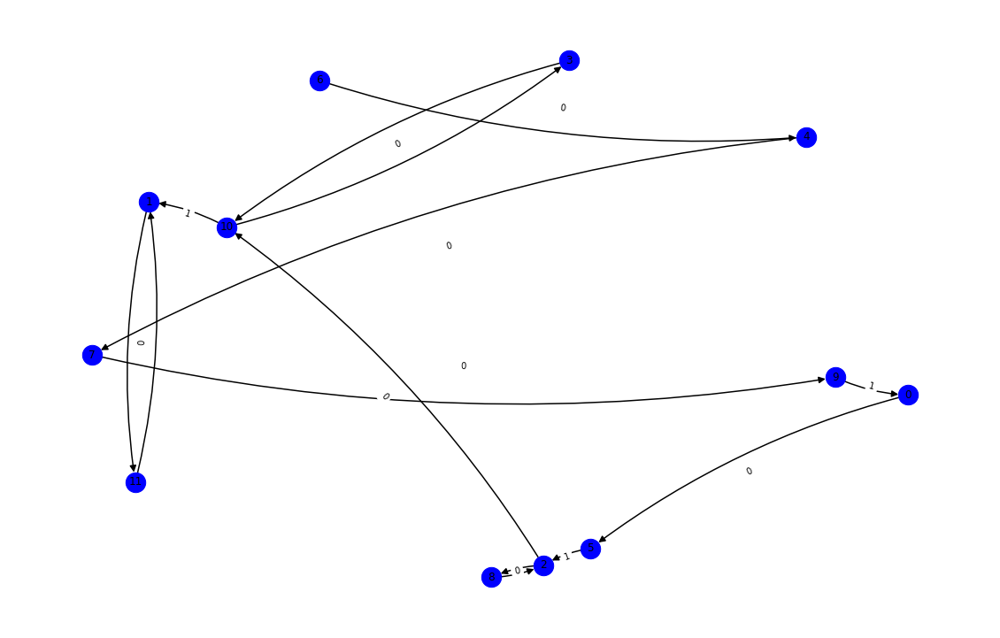

nft-id 45456
mark_dict {'0x98f6d93ba4f14517d3655f4481118182200d1d59': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xfd35624baf2f0b3755b7cfbefec7bf62f9761702': 2, '0x76ade2f654eb9490275114310fde8dac0d0eed87': 3, '0x77acc06250552c8a96e9560670328974386d632f': 4, '0x34bfe85e6fff28e0e98061b78e1fd6a6125f5ace': 5, '0x758e83c114e36a28ca1f31c4d2adb5ec7c04c578': 6, '0x5bbefac2828e25708bdee6bfaa8b33d8ebcebb39': 7, '0x0000000000000000000000000000000000000000': 8, '0xf89cfa2e6ee4f6e7a6887291751e9a88af591f8a': 9, '0xf1ed051f54a98d4e6ae7f7b87110cfbcd3ade686': 10, '0x0f2eb30fb51771e2636574d29e369b4f32d88731': 11, '0xe9adeec463bc30f0bd448c859d86339600cf3727': 12}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


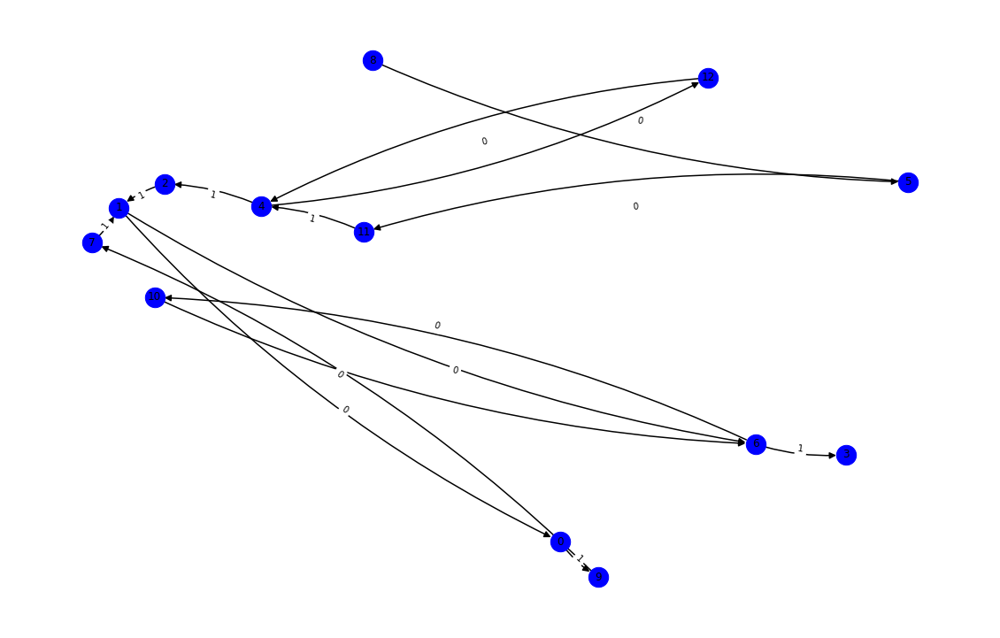

nft-id 96100
mark_dict {'0x5b310ff62f50259822d7b8e1af1b30b87a895ed7': 0, '0x17a511c56473690f7365097726874f8751f5e704': 1, '0x23c9b27441d2a0fc8c4606a56f77809d63428f8e': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x0000000000000000000000000000000000000000': 4, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 5, '0x9e69b59b8d2a094cb1117f92ff7dcf51ed467b41': 6, '0x60e14a901f9c940773ad09c781c0ce2de9f84efb': 7, '0x51c26879aadad81508294eedc50d07cf36bdd850': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


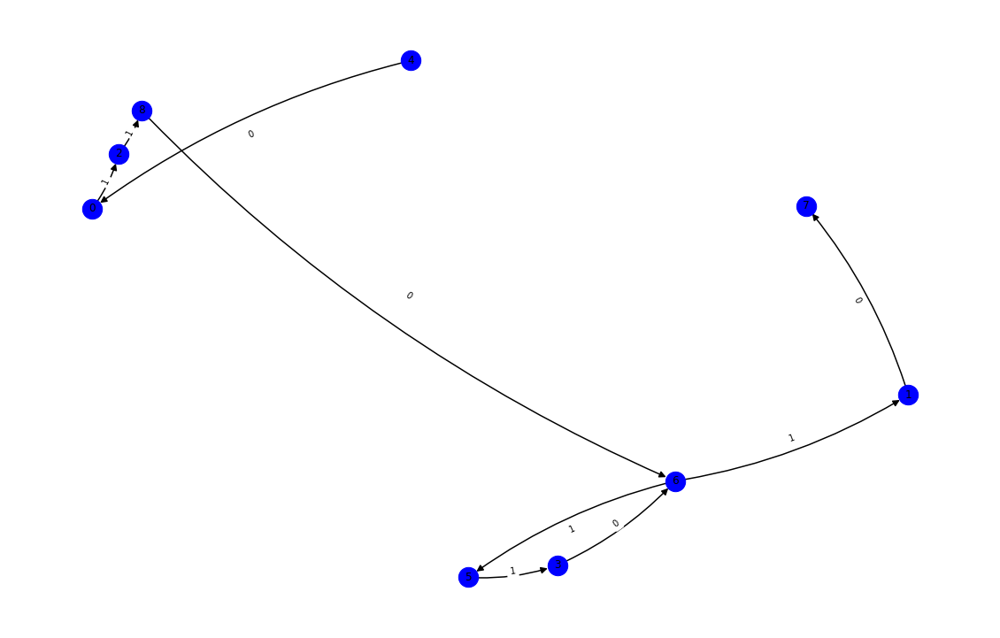

nft-id 65418
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0xfa37247d1d7bce34a162c698072dec04764ce788': 1, '0xee1aed8e69916889f45f4dc8b178ab9ff144d09f': 2, '0x23a3ef33067131973a9d1adfab7fbb2c05530999': 3, '0x90223301b5451c8280c1578bf8bd48c2780d9a76': 4, '0x0000000000000000000000000000000000000000': 5, '0xf14afa6a2960a3e79a9a1d617405907f67a7f9d4': 6, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 7, '0x2c81fc79d0f0fe91311bc4cdd3252e5062a58c24': 8, '0x0af290e54582992b27f7c54acb286db9f4f24fb9': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


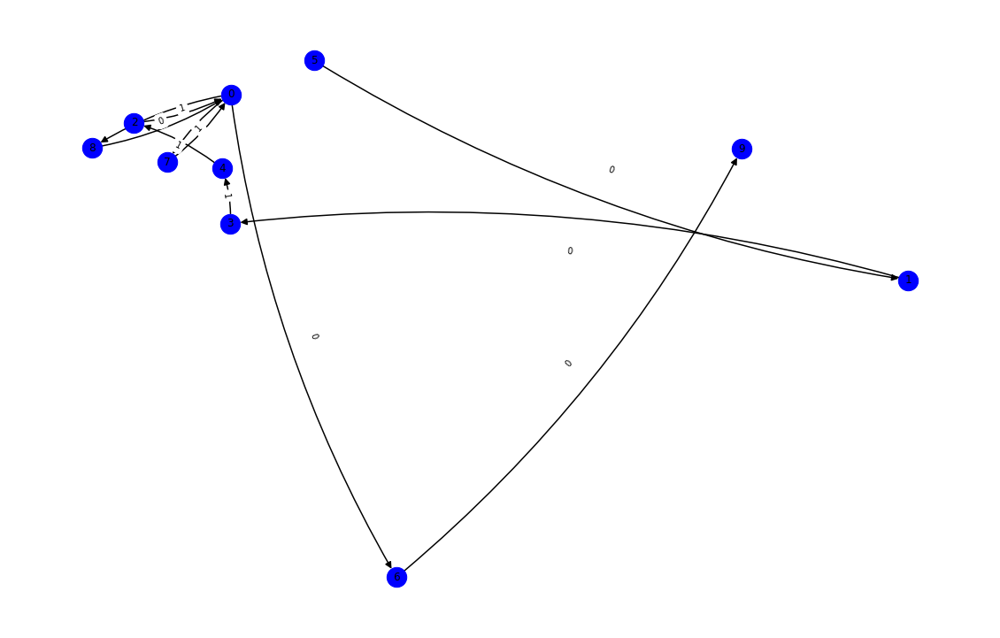

nft-id 97164
mark_dict {'0xf1f30d14b8a7b83e653911093ca89cbaed9a7071': 0, '0xd22dd299c2f9b97f8ccba291b3378d4918e51d95': 1, '0x1a5f1cc47f71067f736721360506b2a6250bcbdd': 2, '0x17e6bade6cdc24054b44d32f960f0ca4e6629a0b': 3, '0x6ade4b0aee249ff108da1ff39280ec1e46138f63': 4, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 5, '0x0000000000000000000000000000000000000000': 6, '0x3647629fbee1f949429b20e268e1e805c898cd89': 7, '0xae614e8ca8216823c66c2332e56673f0beb82bf7': 8, '0xe7b52935686bc5e44f9886ebf2bd994aedc29415': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


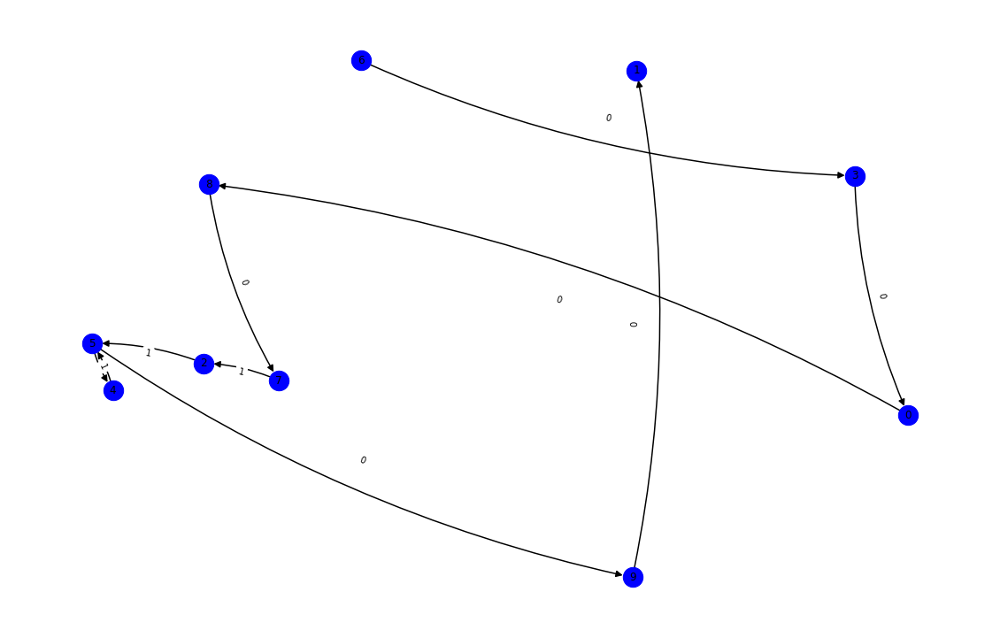

nft-id 95115
mark_dict {'0x87bc2f2ba8c83f412fed5c3151de0ffbdc959984': 0, '0x6fb76ad8a26835384c908a239d5b46edff1f93d1': 1, '0x0000000000000000000000000000000000000000': 2, '0xffb0659190edc797d9b43c12e026a0251648afc3': 3, '0x0725cf86d60e18993f6c4221c3a449968118f2ba': 4, '0x68da372a96aca53e159ae8d72d6ffa267780d3d6': 5, '0xbe8278db737147ae010c58b7f212a011f07e521a': 6, '0x18b610f6c9366c20d38d6bc667c7e18c951889c9': 7, '0xf1ecf475bfaa0405372cf4ce4b17b587aecb099b': 8, '0x6d1a95640b4998383b215ee27a59d6943d95d191': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


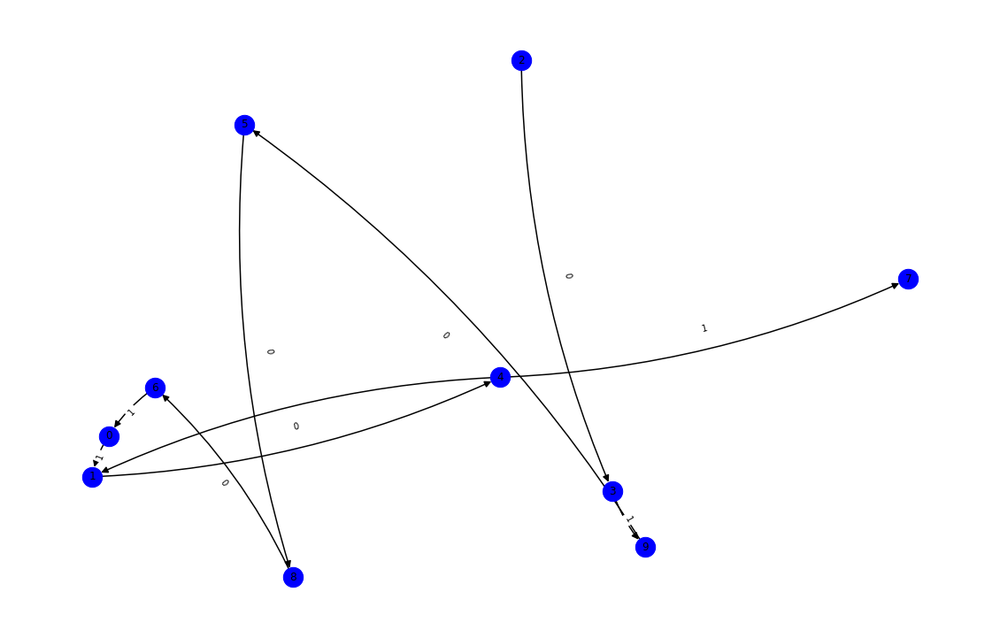

nft-id 56872
mark_dict {'0x0000000035634b55f3d99b071b5a354f48e10bef': 0, '0x1a5f1cc47f71067f736721360506b2a6250bcbdd': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xc8fd0dd210755bc6b53eca7afc4c59b7e7be9488': 3, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 4, '0x9803c744f8227fb9828b69e80de9615c15257028': 5, '0xc8b6bbe8a2e2c53cbbe887d0abc1ba97a3bf225f': 6, '0x67e23849bb29c304381a578bc9ffbee9dd7f869a': 7, '0x0000000000000000000000000000000000000000': 8, '0xa697f80ae3e365d232c656c189446a6b3dad6d35': 9, '0x611c67ec71202613da55d00ddc04ccdb02060fcc': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


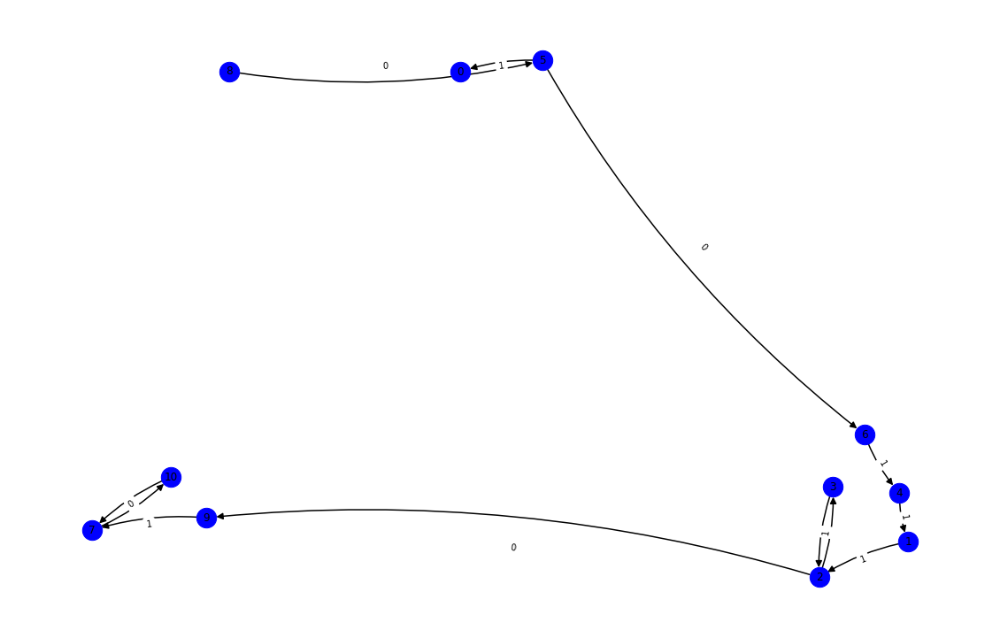

nft-id 95557
mark_dict {'0xca7510f2f00ec3e2b3e577a20d46195a8830d429': 0, '0x08af06862004e9e64b206ba79fb1a955718bc27f': 1, '0x3b0b809084e2a3a6793b37e3b913094e19d9e3e6': 2, '0x0000000000000000000000000000000000000000': 3, '0xb68daa2725edb70f9389f0dce80a0c7f9b76ffc9': 4, '0xb899fece6a94e5b7a321b6004bd034c67ce30b22': 5, '0xdfd143ae8592e8e3c13aa3e401f72e1ca7deaed0': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


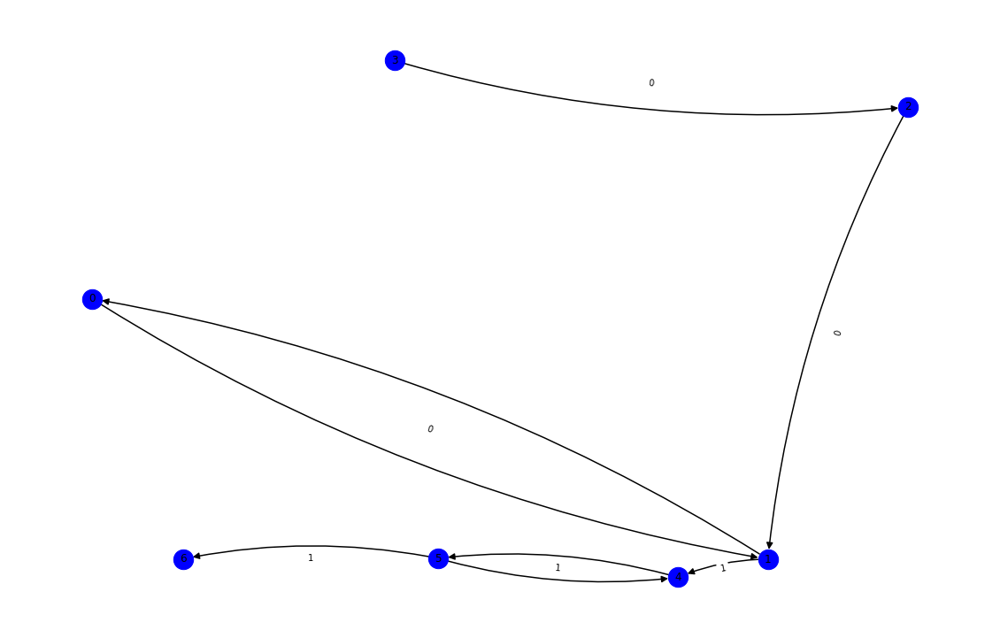

nft-id 84632
mark_dict {'0x70587b23844d672b37f9ac597d9d4b1c8d78abd6': 0, '0x60b96efe4203bbff69669cab77346c7b93ce2726': 1, '0xc8bbed5b568b2f08f3b775948f047f9dab5cb965': 2, '0x802cc07c65d8e6a66165dbf0e6994a1e2a6385e5': 3, '0xa5e45f443981fba491406d44131d13069316adf8': 4, '0x1cff994767f14073b5ac9cbe6b57532a6c41d024': 5, '0x327b9dee1830f8201efa751fd96f7b1ad0b300a1': 6, '0x5370bb6adc4818b1641d1105bfe0984b684e3661': 7, '0x0000000000000000000000000000000000000000': 8, '0x416a3bf5227b35985d975386215a47ca67f21dc9': 9, '0x088941f320d9980c02a73de3a56210206f819af1': 10, '0x611c67ec71202613da55d00ddc04ccdb02060fcc': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


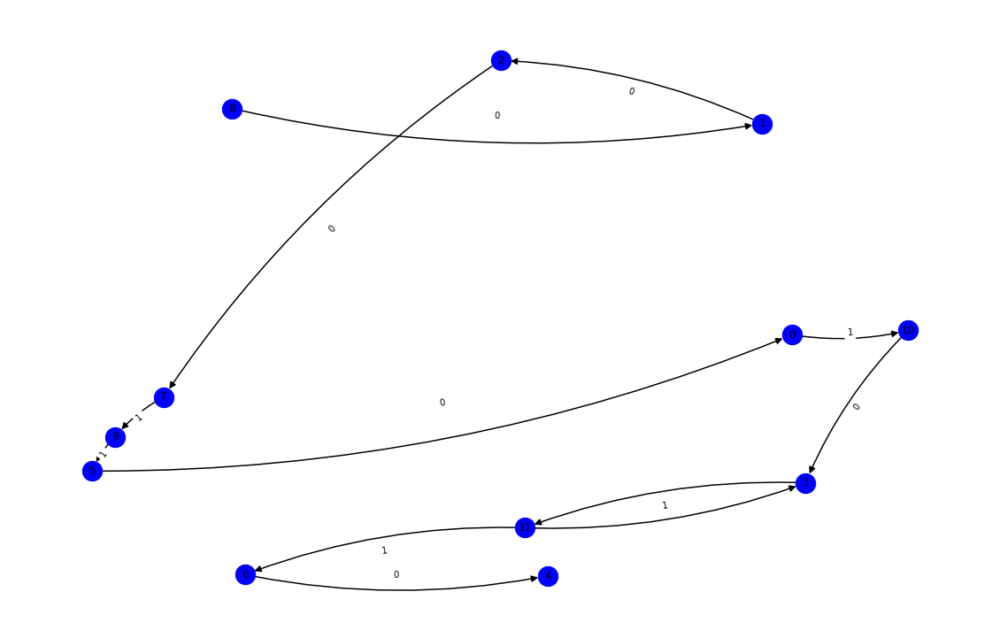

nft-id 52809
mark_dict {'0x7eb6dd4a0b074f405ac5d70afd13c0d56cb497b7': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x31231036ed51376a70b3824d7da1a4e036def5a4': 2, '0x8ae990228e3fb6b7a888b09c304d8d255c3e0fd1': 3, '0x0000000000000000000000000000000000000000': 4, '0x8e054e244952ad2a8614130a974a97fb6ed08887': 5, '0x38218ee10794c3b9a69e269e7c41b65667aae961': 6, '0x1f3450cbc1362f59d19b0e14d7b771a59963cd38': 7, '0x583b79c31cfb0f9c6680f0f1a7313c8bd18f1fb2': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


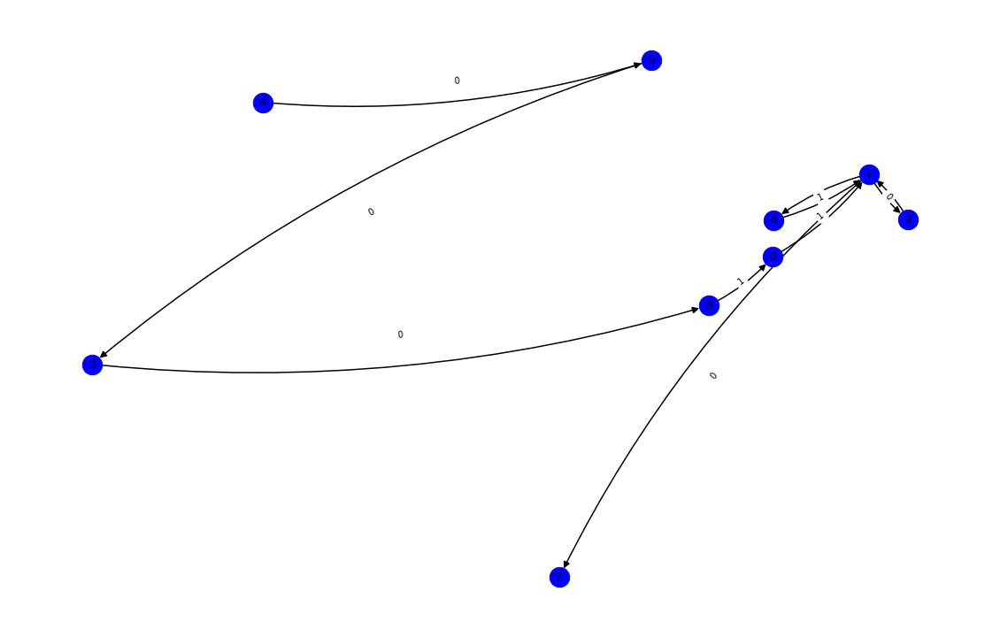

nft-id 57719
mark_dict {'0x4c240bbd3c10093830405a5aafd1f0aaefb27378': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x32b0aa0ab716908d95246e6ae7538a10b0d53d1a': 2, '0xabd6cfe1d3dfeef22a482cf9fea3b9dd59e8d989': 3, '0x0000000000000000000000000000000000000000': 4, '0x9f03387cdc7d060a2ffaca9ccadc51467b7cd7e3': 5, '0x11c692643323c1b9aae225a5d03de7c27ed06c02': 6, '0xed47015bb8080b9399f9d0ddfc427b9cee2caab1': 7, '0xbaa593844f49c01e42f3f691833905796c0d9565': 8, '0x9ec8e8f64ec6bb47d944b4b830130b5fcf2da182': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


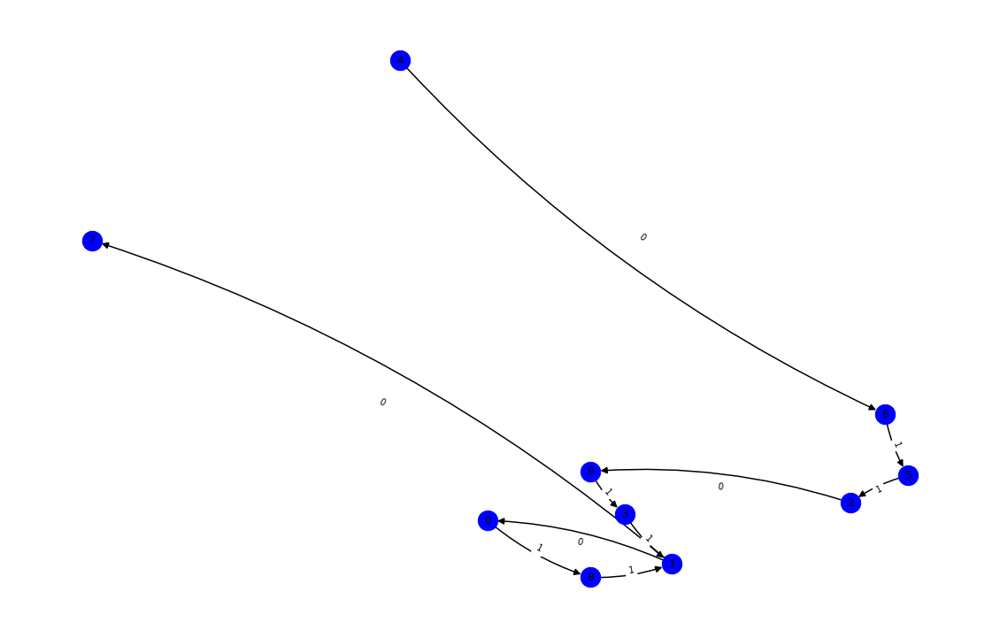

nft-id 84826
mark_dict {'0x7029ca08f84b3082c0216804ab5f6d73676c1787': 0, '0x1a969604e7c715324906bccc5f82d609d2e0c0f2': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x3ce499f80579f121ab1588fe7ba30d534fc0c7c7': 3, '0x0000000000000000000000000000000000000000': 4, '0x5c4866b521b5b9c7bb09eb924619ecefae5f541b': 5, '0xed47015bb8080b9399f9d0ddfc427b9cee2caab1': 6, '0xae577c977d0447e3619567efe15a85098da77b5d': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


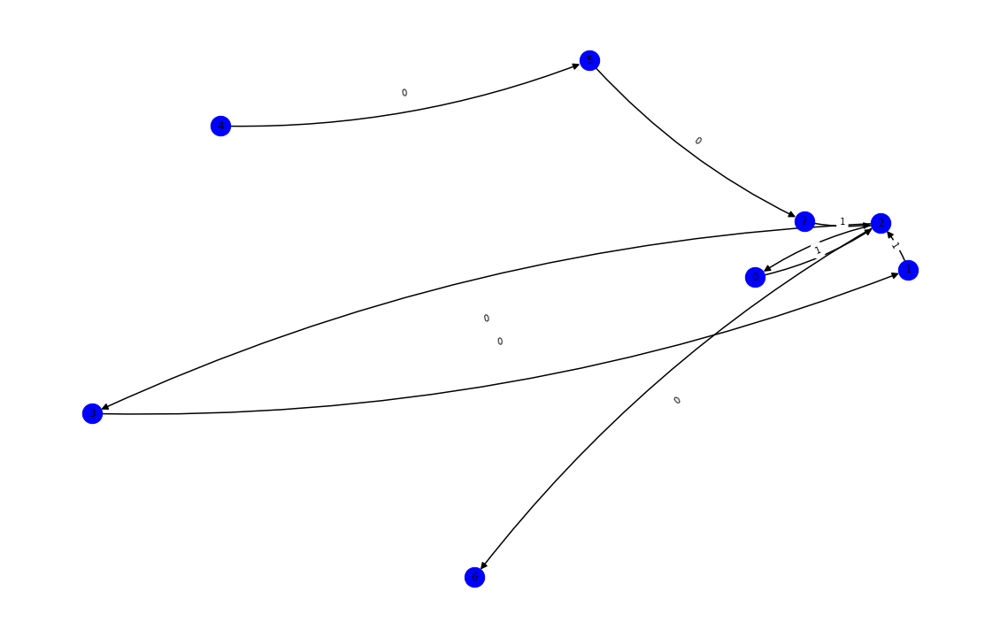

nft-id 46555
mark_dict {'0xfb9fc18028e4a89e3fba6d8931f522efd4c385b9': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x1a969604e7c715324906bccc5f82d609d2e0c0f2': 2, '0x3ce499f80579f121ab1588fe7ba30d534fc0c7c7': 3, '0xabadf6677a40604014c5f9c988c6503abd9b7692': 4, '0x0000000000000000000000000000000000000000': 5, '0x90a48781c7acad6e009827826d40a09b31ced002': 6, '0xec2f1e114f48f86292dc9fc4549243404f24f534': 7, '0xed47015bb8080b9399f9d0ddfc427b9cee2caab1': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


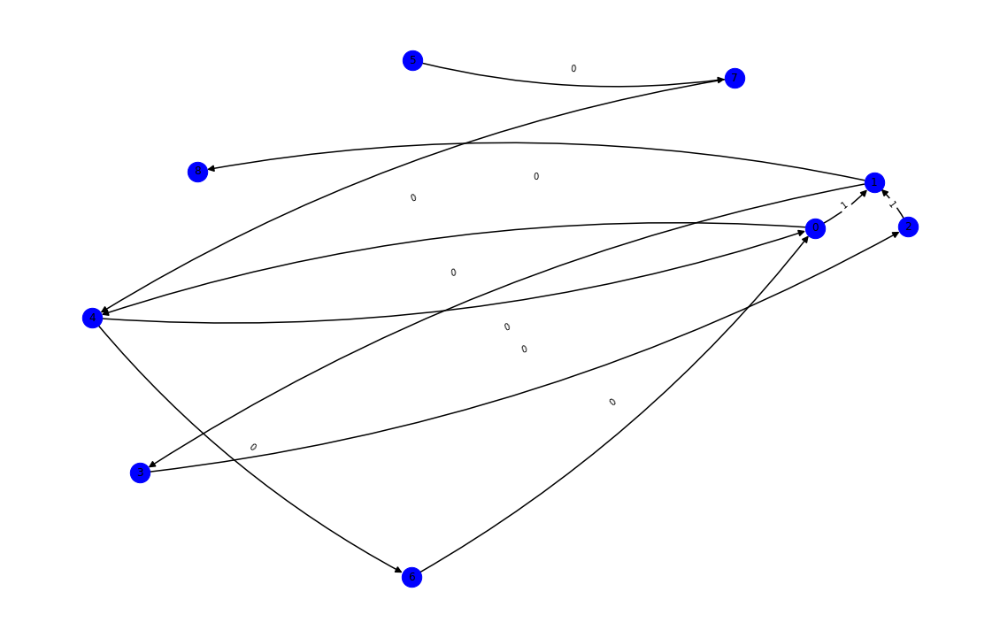

nft-id 63099
mark_dict {'0x808baf7be247ceda9b35c422faa380a55c9d7f0e': 0, '0x7586834e655ee2de6357b2c8423b76efc5fbcc6b': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xefac3f1eb93c27583dc7bea705f27be5c15f42d2': 3, '0x0000000000000000000000000000000000000000': 4, '0x2443047e6ac82fe65035e36e971316d981492857': 5, '0x76ade2f654eb9490275114310fde8dac0d0eed87': 6, '0xf3d12925349ee2c2f01105dbeed94d79f7bafd3d': 7, '0xed1b993b56e2006898ee6b779318c3cececceb0d': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


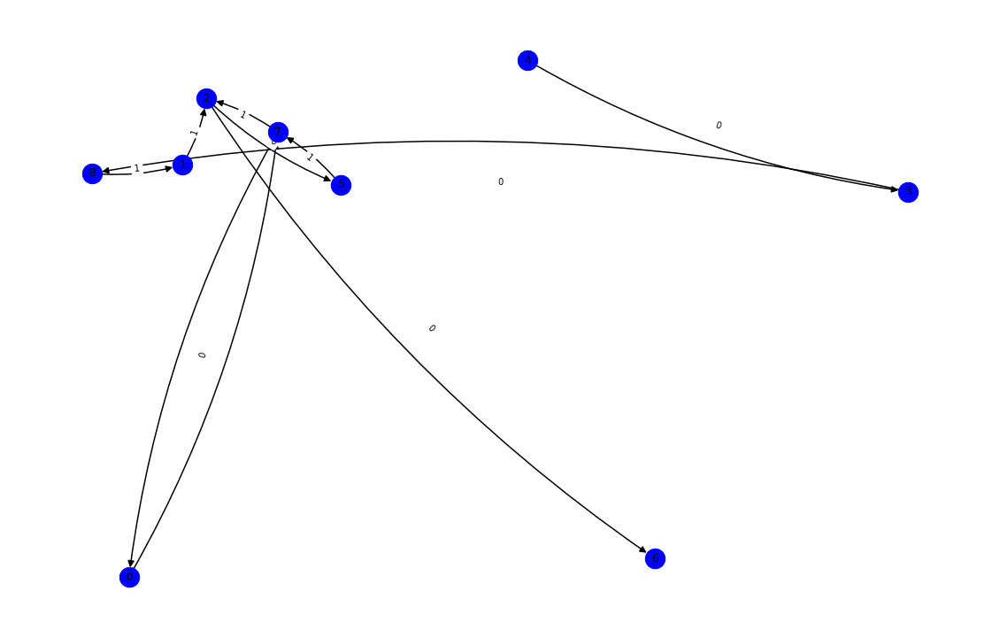

nft-id 64622
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x0000000000000000000000000000000000000000': 1, '0xd982987638b66e72a1241a81a965050687d09b24': 2, '0x97da20dc2bd46174da79d71a385b7248527fbee6': 3, '0x76ade2f654eb9490275114310fde8dac0d0eed87': 4, '0x06cf3a059c4b888c81d828ab9221f8e7dbf4e0f8': 5, '0x925c559c7a4015fd25b47db32c85a4902c021952': 6, '0x857847ecff42d28abe7f421074e45877b8030cdd': 7, '0x84097b17b5beab1a243311a6b7911dfcc522e4b5': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


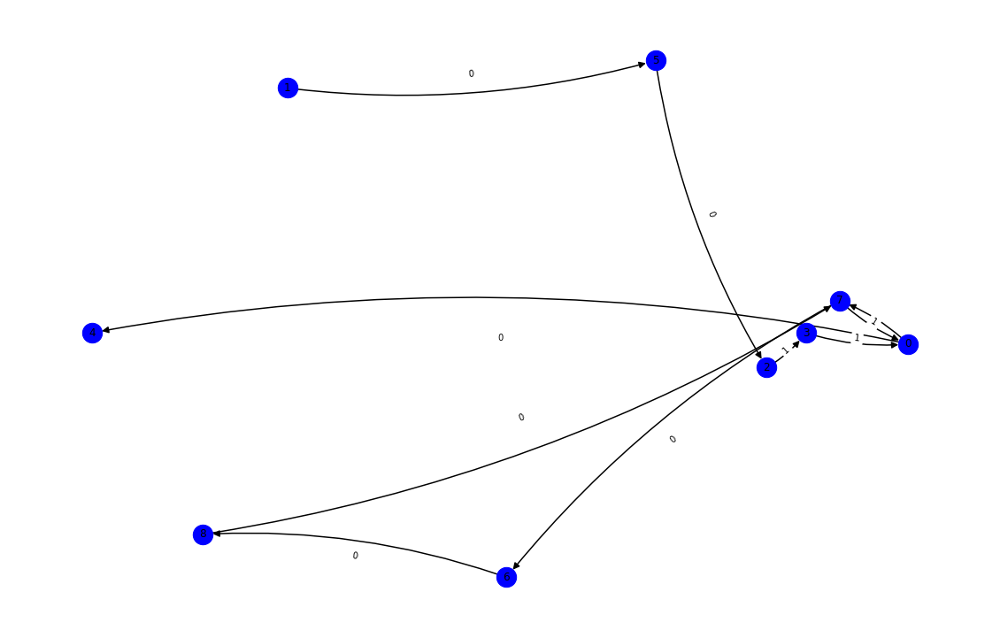

nft-id 79769
mark_dict {'0x300d65b82c39ca315cbd8c26c9e20d2267f8edee': 0, '0x779bd28ea4f6268e02b397736cc2d6537118182d': 1, '0xe69e3cb571084604528121448976cb08ea47e8eb': 2, '0x1dad1d2c851dc9a0622dbb0876f12dab68edc0c9': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x99d9cc271dcdb1ec44dad67d91a8fccea8f58b1a': 5, '0x407d131e7c9300e6865fa42b4d254e1d0ccfa6b7': 6, '0x0000000000000000000000000000000000000000': 7, '0x2ea5c9f2bcc7d4d3f3616d4a11ad86b4e377f342': 8, '0x6bc85f4db2f93cb0b17966c51061385b81cec71e': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


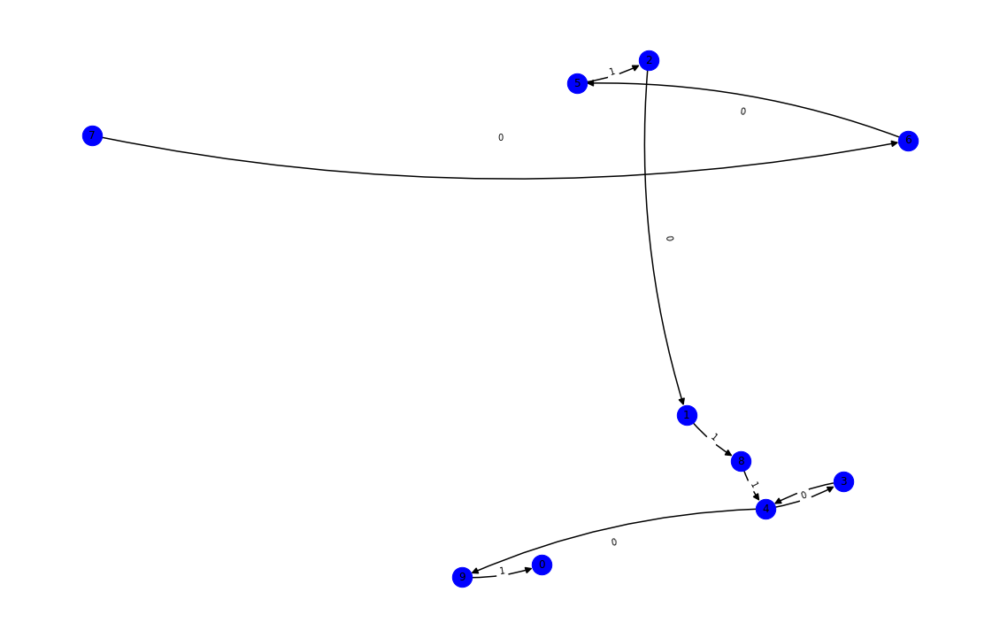

nft-id 99921
mark_dict {'0x9e52bec8fab7e500745a513f946d37207049ee05': 0, '0xcd85ef971c31c2e0b61e855c8e74bb7ead53d929': 1, '0x18d82cc691754ea6db4018004de61fce8a63f392': 2, '0x0000000000000000000000000000000000000000': 3, '0xc51ba6e3b703e7ba06a30b9c33c65edd6bfa3880': 4, '0x66625aa7f56da95678075ec2baddf7a5f1888888': 5, '0xf29fd45bbef001e64d168eada4301c7d3cbf2713': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


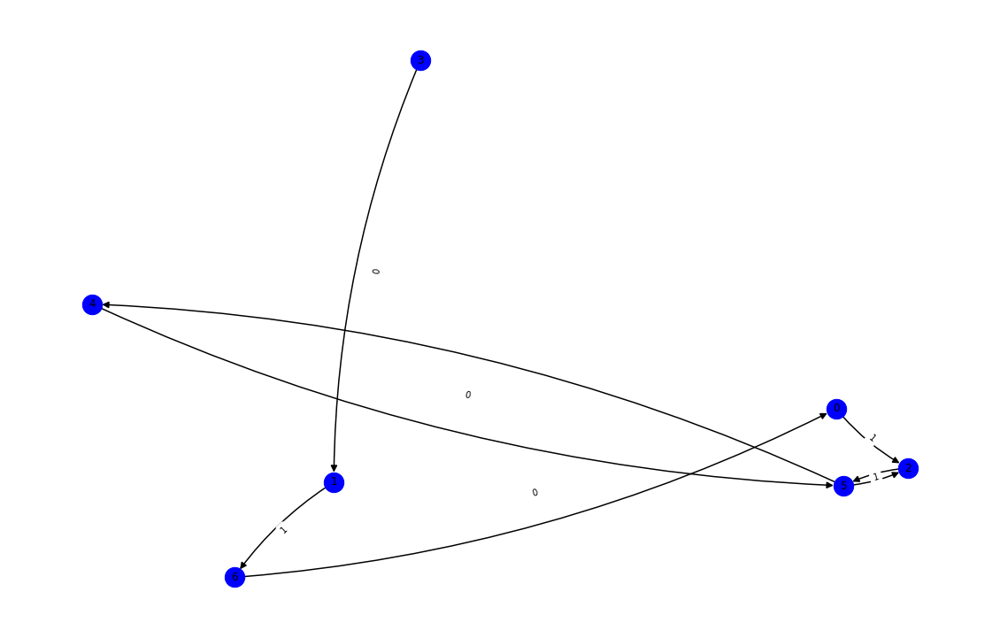

nft-id 54547
mark_dict {'0x1606ba8c1b5add84a43e66c8a650492ab59907ed': 0, '0x1d2c4cd9bee9dfe088430b95d274e765151c32db': 1, '0xab949cc484a0888da64aa45f8f8ceedc04625cb1': 2, '0x0000000000000000000000000000000000000000': 3, '0x0df7b3d545aaa5ba2e6669e9bf34d25b5e314398': 4, '0xa6e057a840a5907e840362f46d807b61d83a1ffa': 5, '0x7350a76df2890be2f75f9b2cd122fefe627a7679': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


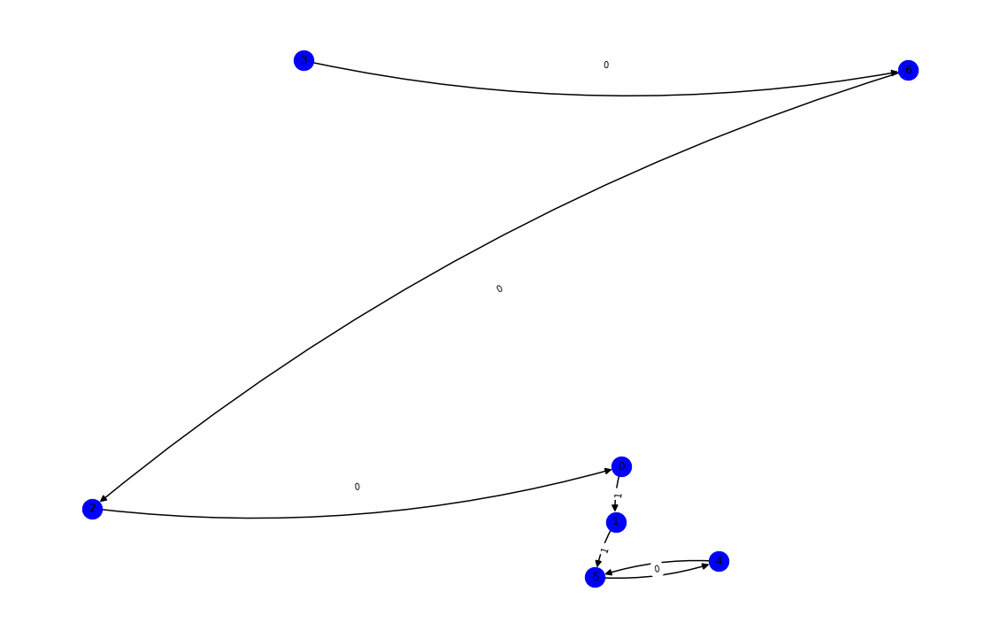

nft-id 64850
mark_dict {'0x4add85892f15b13d407bae215ab1fbec88487b82': 0, '0x31837aaf36961274a04b915697fdfca1af31a0c7': 1, '0xf342c0eb007359651efe7fb52ddb5aeacf57755d': 2, '0x6dd2a34795037d01d276cd1644a2ce664f15d49d': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0xbaa593844f49c01e42f3f691833905796c0d9565': 5, '0xfc0247cdaabc166423915077b666fa3bb9d1ee4d': 6, '0x4c240bbd3c10093830405a5aafd1f0aaefb27378': 7, '0x780c0c9e0a9ecdb6a5750406f1663236a45351d8': 8, '0x87e4e2733ba4e4c362027e06258988b34c1876e2': 9, '0x0000000000000000000000000000000000000000': 10, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 11, '0x19853d88e6bf95191eb91af1e8461cf4c29b9b19': 12, '0xba9d421401f1d7f001a3f8e1b64745c53044fc61': 13}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


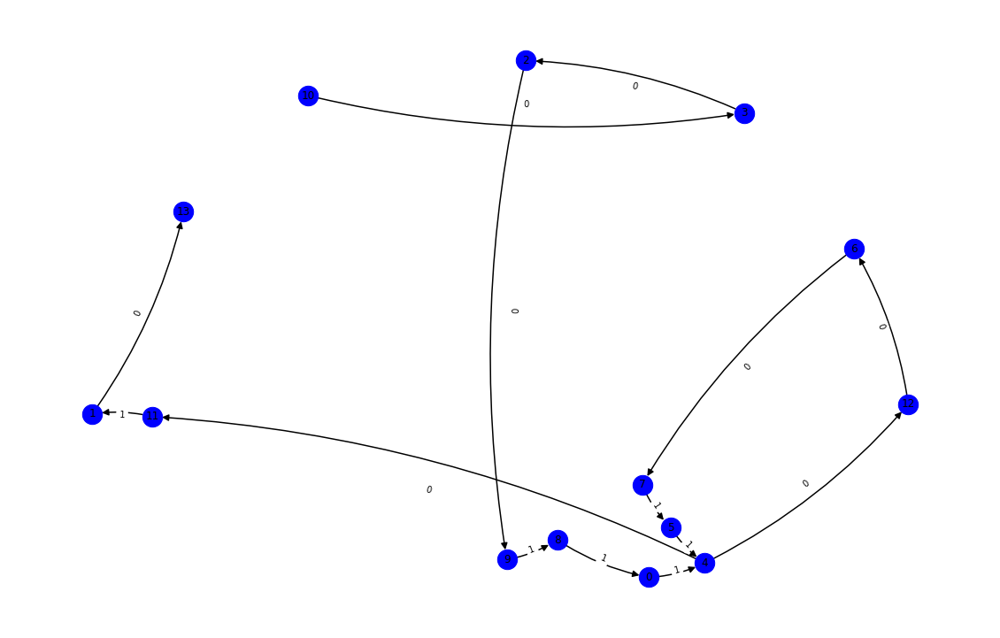

nft-id 76013
mark_dict {'0x31837aaf36961274a04b915697fdfca1af31a0c7': 0, '0x813d6e94cf379d9da155cceb1c3fba68d18709ea': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x34380456f50e013f1b8b2b9b5dc9d55fb0ca9c2b': 3, '0xd94ab7f8c65555fcb1c3d7a7b98f0017b6bc1bb6': 4, '0xbaa593844f49c01e42f3f691833905796c0d9565': 5, '0x4560bb2b9000751286bf9adf9d9c33be00a654d5': 6, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 7, '0x0000000000000000000000000000000000000000': 8, '0xa244312a1c313bd79f75dcfedcda850997fd356f': 9, '0xbe063b35610d72ba229687af82e60e9ba387d68f': 10, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 11, '0xba9d421401f1d7f001a3f8e1b64745c53044fc61': 12, '0xbe32c901491d57e54c39f45bc9b7568bf503a799': 13, '0xe0c7adf301831c61b0a3fb8753cf4f2ecc5ff469': 14}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


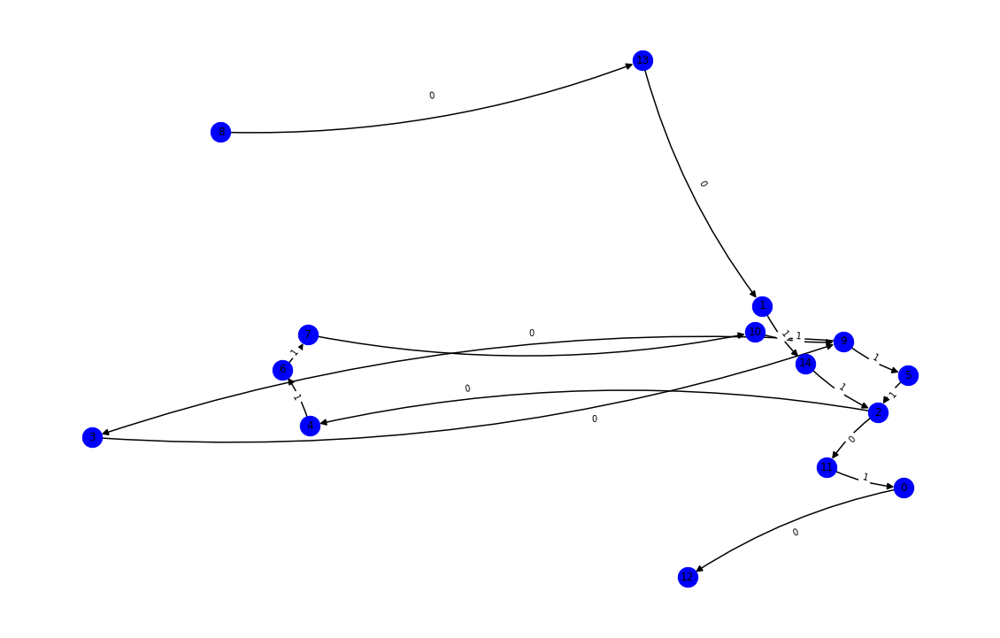

nft-id 73435
mark_dict {'0x9c33c0a2dd63e27a13a8e7a4f49e84e7eeb1af41': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0x470f5469aeaca55b7b415d14f5707278bddbbffe': 2, '0x2816397155c0e385e5a149647380e10d0edeb6e7': 3, '0xbaa593844f49c01e42f3f691833905796c0d9565': 4, '0x6e613599c95bfdcf2b8f660800ab48c8b7a9de1e': 5, '0xc5ee598634f5f83b677745410ec076a206ae35a6': 6, '0xbfc7e3604c3bb518a4a15f8ceeaf06ed48ac0de2': 7, '0x7e345a2a7c6ab50eeba694b4a5f98898eca59bcc': 8, '0x0000000000000000000000000000000000000000': 9, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


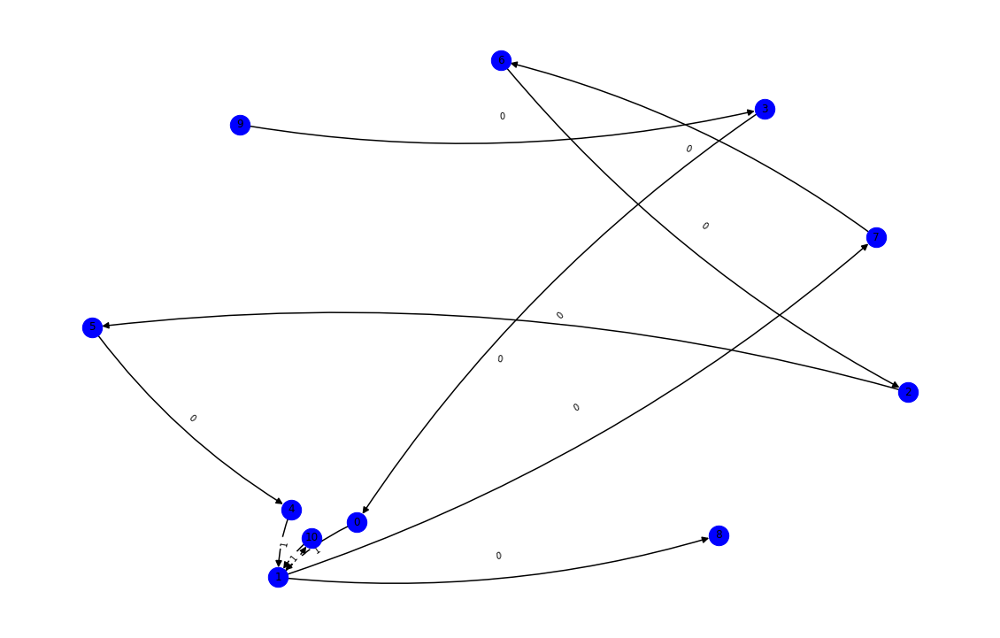

nft-id 54775
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x470f5469aeaca55b7b415d14f5707278bddbbffe': 1, '0xbaa593844f49c01e42f3f691833905796c0d9565': 2, '0x6eefa2edf2c33c2c9e7a261018faa9ef28377d18': 3, '0x827e72916ff625a3e302f256a1ffebe70c77727a': 4, '0x6e613599c95bfdcf2b8f660800ab48c8b7a9de1e': 5, '0x845af1930a85426868d2c87c9c176621cd4adff2': 6, '0x56dd5bbede9bfdb10a2845c4d70d4a2950163044': 7, '0x0000000000000000000000000000000000000000': 8, '0xbe063b35610d72ba229687af82e60e9ba387d68f': 9, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 10, '0x7f12455f910d20c87cef26a9c7ec3150584896a4': 11}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


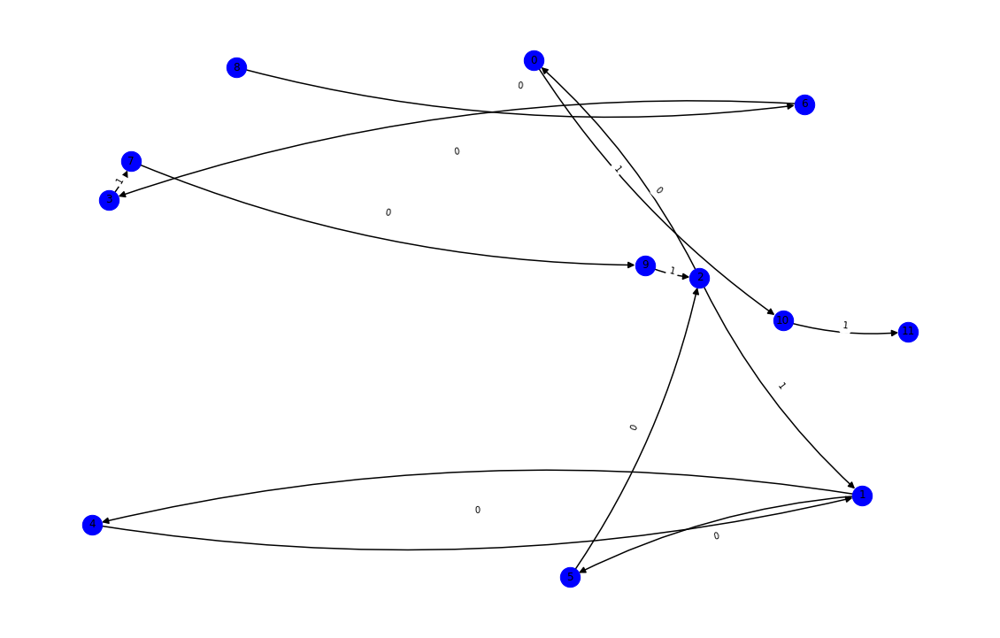

nft-id 66421
mark_dict {'0x88888888b0a018d28947b7fbde08e0b408de9f70': 0, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 1, '0xd8670e0ad4c12449a44e4208c7a40fcdcfe40b20': 2, '0x0a106ad7dc546fa0d255cfbfe27034d43f7a35f3': 3, '0x2eca0bbd9ea9ea5998c9803f5d56ac0088462b65': 4, '0xbaa593844f49c01e42f3f691833905796c0d9565': 5, '0xd3e0f44f99e95c5dea13c2f6974184c6c6f94f23': 6, '0x89b25b0eccfa69aa9235c0d5ca233e2aed2c187b': 7, '0x0000000000000000000000000000000000000000': 8, '0xa84be23eadd19c3f1115933c1c74f96986fa99dc': 9, '0x82bbcac5a8b81368a4a96f0265cb40e46020a1e1': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


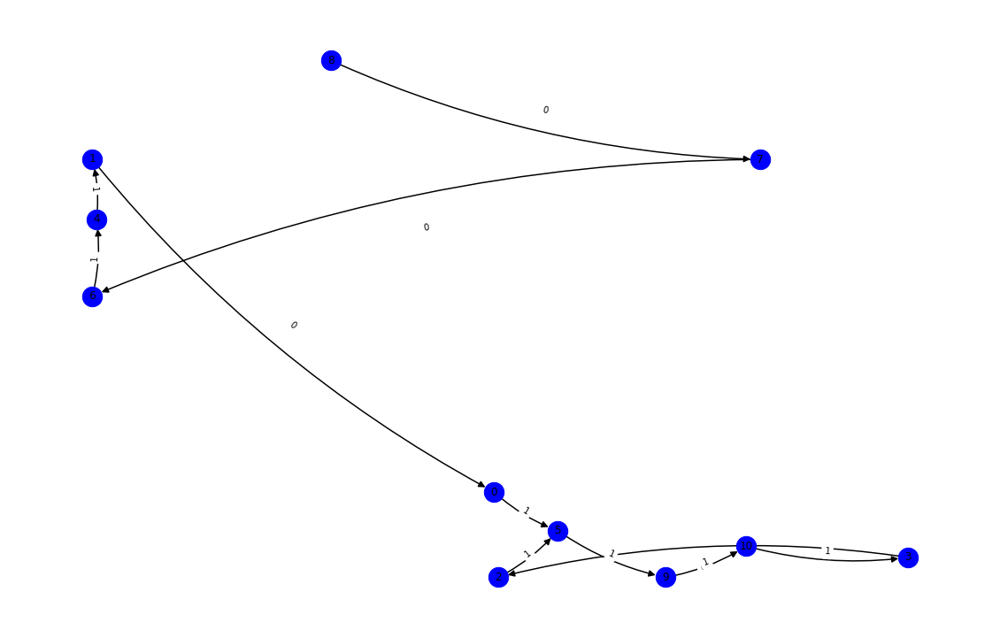

nft-id 67904
mark_dict {'0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 0, '0x756209b243b3c426b3449b560a76fcd6fef4cfcc': 1, '0x1cbabf5cae040215ab7e8204a741191c04a4a24f': 2, '0xfa8eb7fbe0b62e804e18036f96d3786b3bbd2c29': 3, '0xbaa593844f49c01e42f3f691833905796c0d9565': 4, '0x1cf1798fa87cf3debb2ddf280dc250df4947872a': 5, '0x102c4a85e061fafdf0613893e3a83060805235e5': 6, '0xe807bf72f9535822436ca4fe9619f5b743b1c076': 7, '0x0000000000000000000000000000000000000000': 8, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


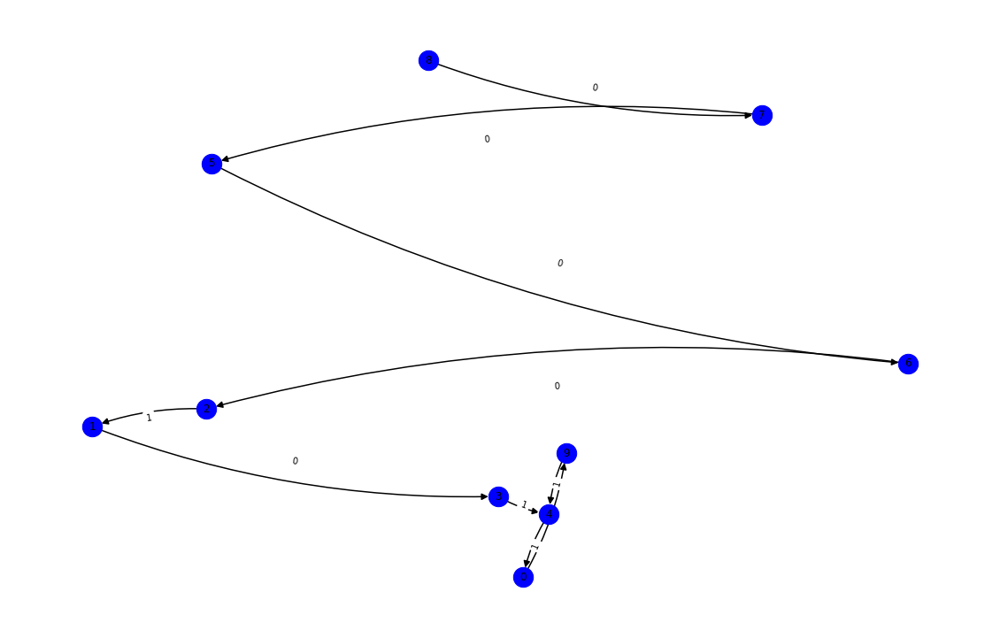

nft-id 60881
mark_dict {'0x1e09e711497328b4782b427ad03115647ee5c837': 0, '0xed947a0f9170de48e347f657762199f7e2992110': 1, '0x1a5f1cc47f71067f736721360506b2a6250bcbdd': 2, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 3, '0x59a5b524d7b009eecbb23324eeb984ac6e17d6e4': 4, '0x5d23b4ea39e274b23fdea9bfdb57b032aced47d4': 5, '0x0000000000000000000000000000000000000000': 6, '0xab5f9071d325b9b5844d52cd4e55ea6bbaceb021': 7, '0x7bc1b235ad2964d41f524ad4b39acae4f670c8bf': 8}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


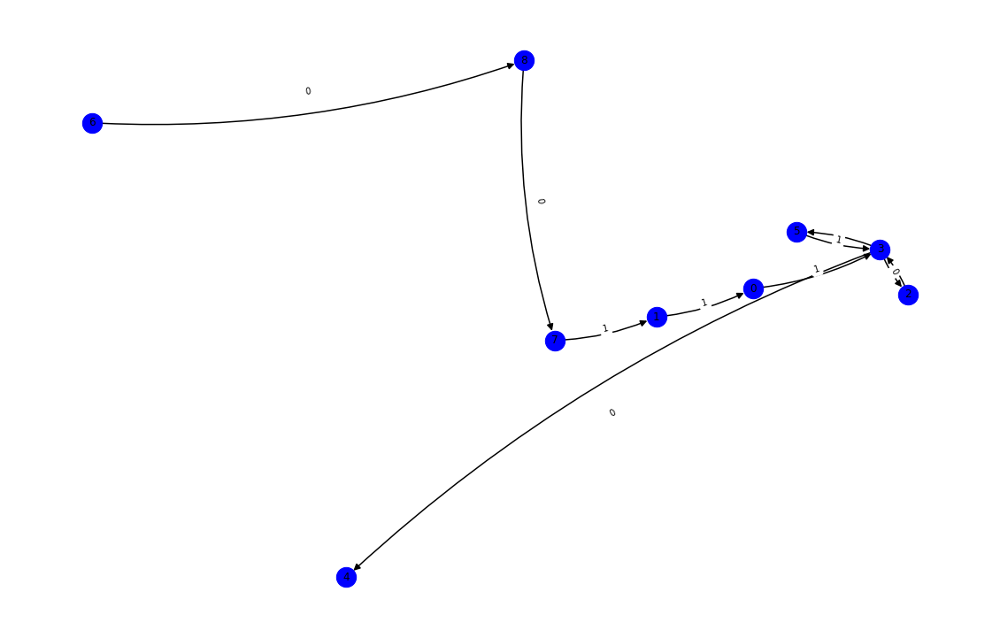

nft-id 76456
mark_dict {'0xc8f1a199eeb0eccedfb0f401b828ee6fb894aaa7': 0, '0x96c25a0cb20616780cb138e8f2aa556ef5a44d7c': 1, '0x483b613641720bdd7848f4d90a01883141b753db': 2, '0x14353a3dfa3de621056cea7ee30bd89604596a09': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x112e372bb5ec17c1ea6b1d679ea72afbd2a94404': 5, '0xa317617f32ce26040b4ed370a30aaedc9aaa157c': 6, '0x0000000000000000000000000000000000000000': 7, '0xa15aad03a4f9c46161783398fe6d93ba18fda366': 8, '0xcada0879e545d046eddc16838a69c8e6aab7d72c': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


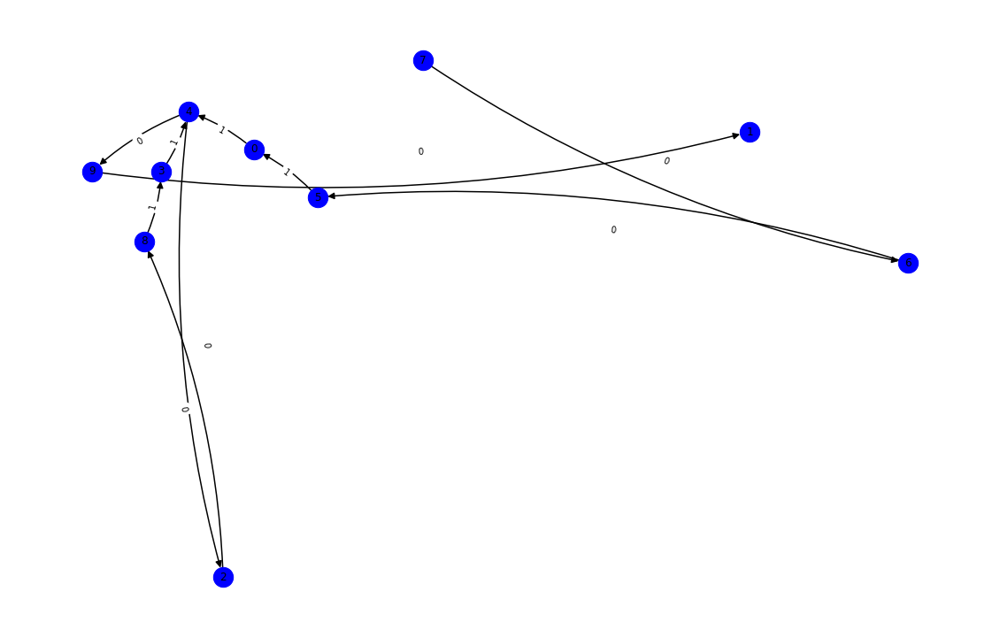

nft-id 67206
mark_dict {'0x4725eb88739b83d141cae12aa6ae71e7e68d411c': 0, '0x661f02733dccdcc8c83e3dfd334c9d96f80e1d69': 1, '0xa47ee69990a83d64e21d324a655be031e0b1a43c': 2, '0xd12f7211071a20ce76bf9fb8e069036b6fb63c6a': 3, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 4, '0x9cc534a25866c0c60598a2cc0fbc90aae3e096e7': 5, '0x0000000000000000000000000000000000000000': 6, '0x6dd4f692d264b8611a91ecb628ad13a1291b68ce': 7, '0x8e171a7e6237956872bf84c58f14cb8c74553e3e': 8, '0x3c05e68b43d248042368dddaea42d0f796d3d183': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


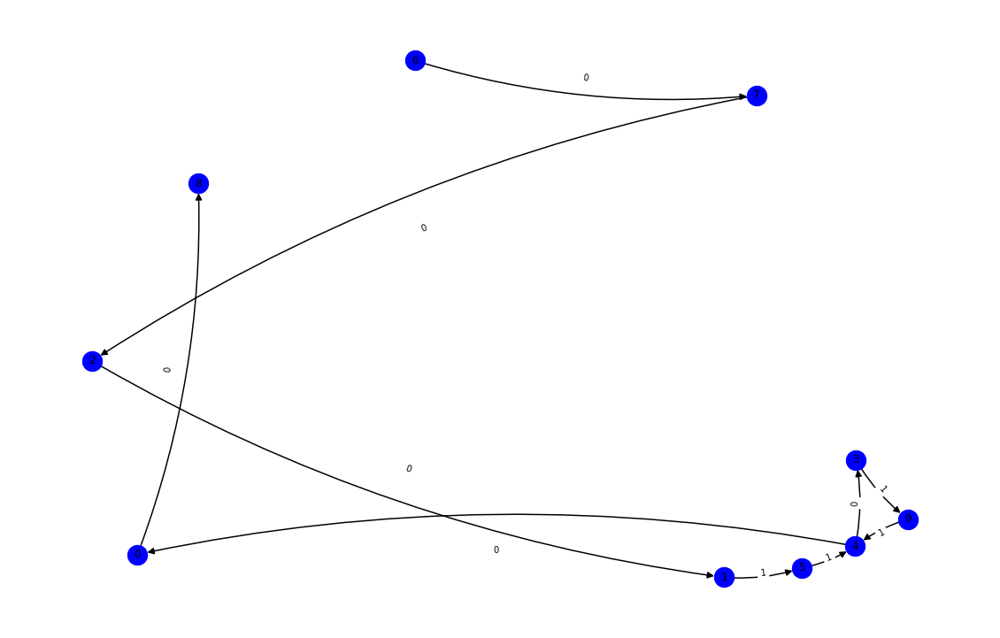

nft-id 97412
mark_dict {'0x483b613641720bdd7848f4d90a01883141b753db': 0, '0x88febd0a4ab094ef59954cb229235316a2d15952': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0x0000000000000000000000000000000000000000': 3, '0x6371d2309b7f79bb0fcaa6e7e8ceeef8f1d4c484': 4, '0xa1b51fa15e780989c1e33635709470fda333eeef': 5, '0x4242904c4fed61bbadb15f00ad59865a5e1f5f46': 6, '0xde9d3d972718a0deccebc4846496402d4dcb108d': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


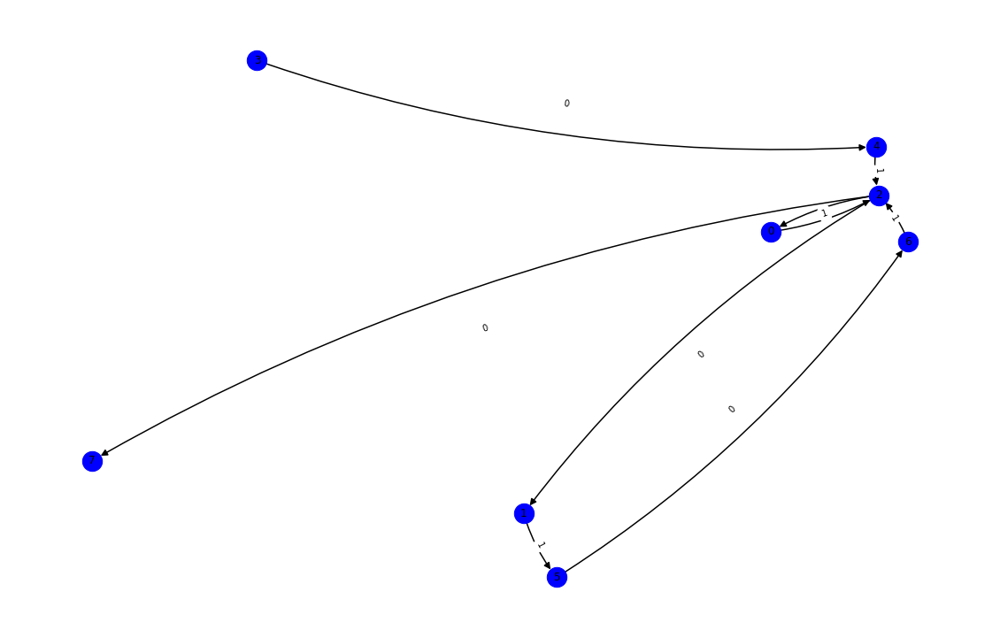

nft-id 75674
mark_dict {'0x5d4b1055a69eadaba6de6c537a17aeb01207dfda': 0, '0x0000000000000000000000000000000000000000': 1, '0xe301cf853fe92c96b8b57de84391774fb5ba56ff': 2, '0x6e8a96dee46b02ef2e02a9488096bcf9a8bce43d': 3, '0xedd5fb11ced4daad3087b4d95d884de9cc0dc426': 4, '0xbd0bfda2d1726f7fc2cb96bc73dda17ff6c1f95e': 5, '0x1e64fe6054611158e445b5adc0c231ff5c3d2dee': 6, '0xbaa593844f49c01e42f3f691833905796c0d9565': 7}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


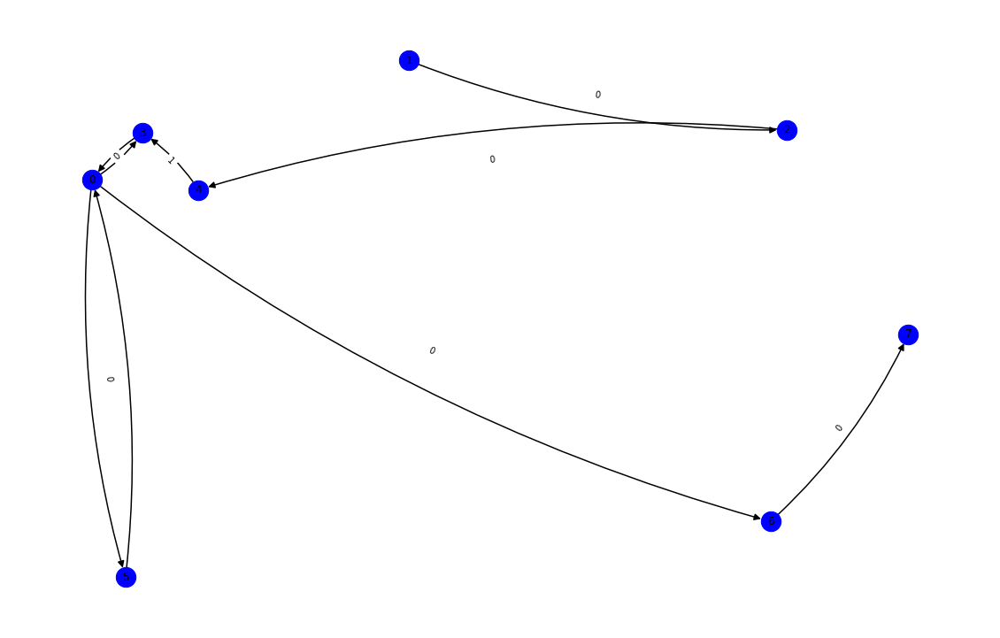

nft-id 46937
mark_dict {'0xa7c5c5afbe10defa6efec2ed559e6082d321b237': 0, '0xad31c65d25aad616479decdbc746efd597219d14': 1, '0x0000000000000000000000000000000000000000': 2, '0x0000000765306855601b70d930ac579b23a18d44': 3, '0x99e32e4fcea456c2d7b34d69ad456f403646ac93': 4, '0xf896527c49b44aab3cf22ae356fa3af8e331f280': 5, '0xbcea49e7acc8d35ba8006ccef3c7f55512e3cbb0': 6}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


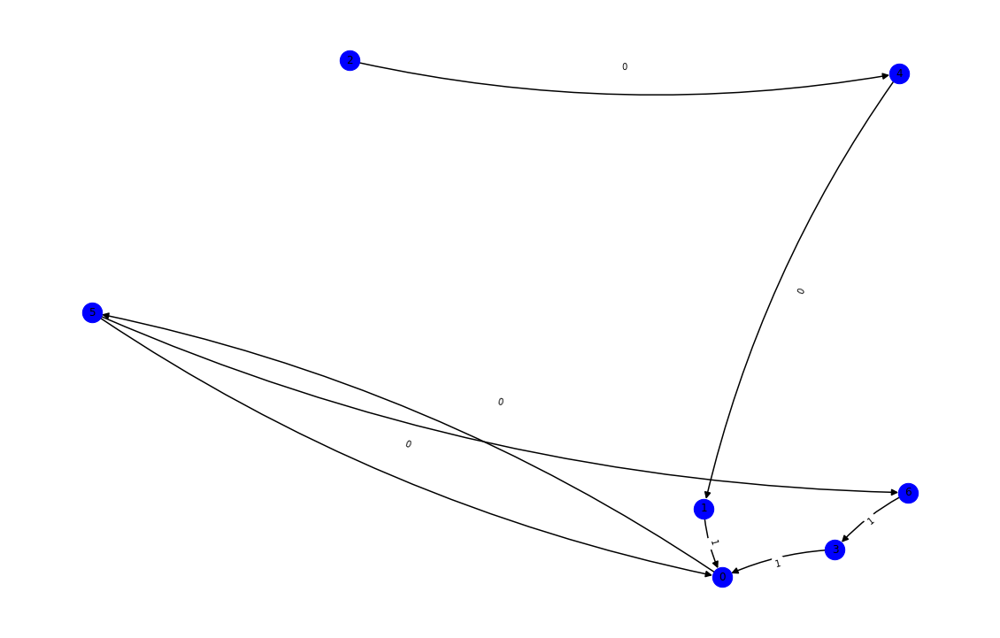

nft-id 77085
mark_dict {'0x283da82863c51fbfcda02322464d21da41cec8d2': 0, '0x31837aaf36961274a04b915697fdfca1af31a0c7': 1, '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2': 2, '0xbaa593844f49c01e42f3f691833905796c0d9565': 3, '0xb5f31eb9e70f88c5997a243dfb59b7097bcd84be': 4, '0xb5497427ac120c734a76be1b85a82156447c7e78': 5, '0xfb913c676549faaeb57846e83dd6433887be7b9c': 6, '0x0000000000000000000000000000000000000000': 7, '0xa32fcc1b3d4e2b597cf626f98228e68b63ef46f0': 8, '0xc7b4087483d7ade2904411ceb6ca4008260b2e1c': 9, '0xba9d421401f1d7f001a3f8e1b64745c53044fc61': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


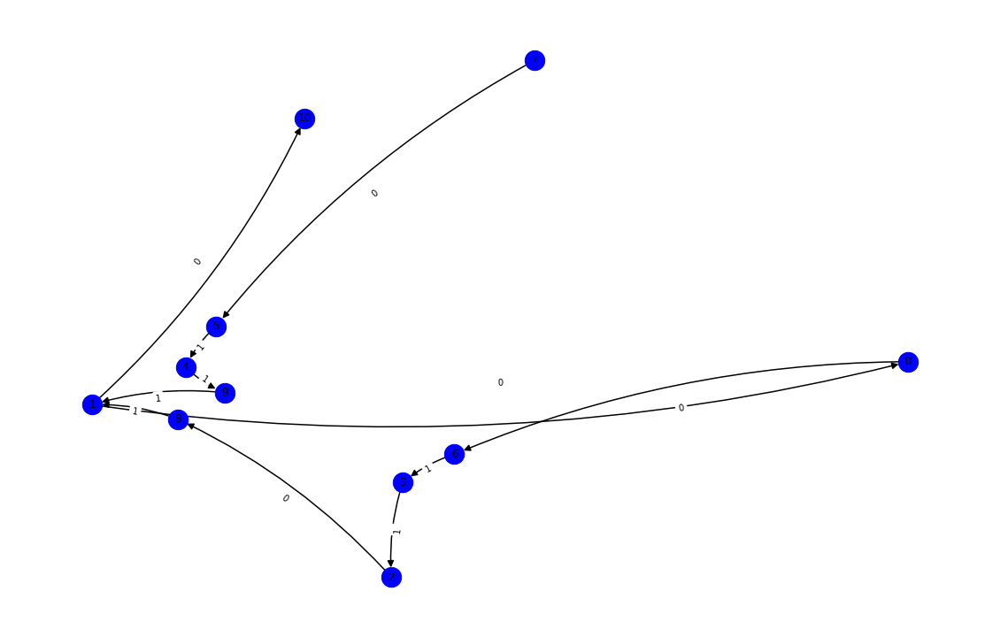

nft-id 19193
mark_dict {'0xa42e1debeba42786a4d2b8226927291462271e96': 0, '0x381f843271a9e710000e28f49a078130fa01a99e': 1, '0x2ff6f25454e6caa75e798ff092ae1faee5dff424': 2, '0x69c12176537160fcdb367547026e5593a22dc0ca': 3, '0x77acc06250552c8a96e9560670328974386d632f': 4, '0xfd56cc4979e33c2ef97d97b63fb664250f33c946': 5, '0x98c999630ef0607aae44c6409620876be9f81a05': 6, '0xfae7cb08719ebc70691d1965627aae8bc4691f1f': 7, '0x0000000000000000000000000000000000000000': 8, '0x2c3f500d7b743eae6a41831184ff1caae951ea12': 9, '0xe9adeec463bc30f0bd448c859d86339600cf3727': 10}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


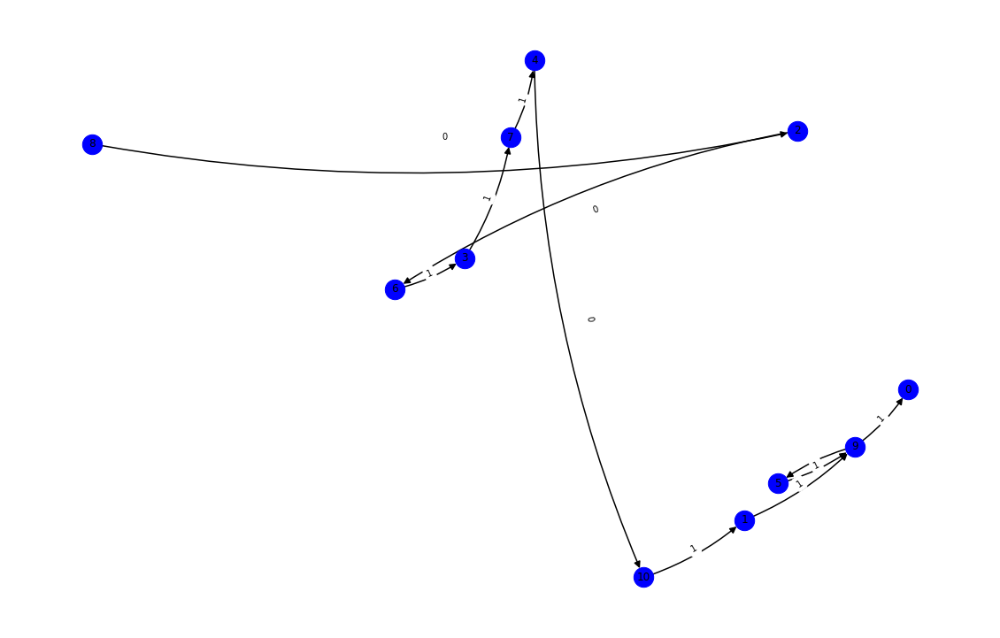

nft-id 65010
mark_dict {'0x18d82cc691754ea6db4018004de61fce8a63f392': 0, '0xbe4fa7df47229247eb551c67a8726004ee5a668d': 1, '0x2eb49b2f636054ce8d363834e93e740ae813be19': 2, '0x6331aeb9ac73bc1d812be8c2c4e7a7b5a16c037b': 3, '0xdea569c1536cd4b0d749e189221e9b41a320c97a': 4, '0x5bbe7fd830924ac9980bdcf1b341e98e662dc1cd': 5, '0x18f6487519ccb9d7b6d024d5741057c3ecfa4532': 6, '0x2c542ecbf7d73a629fe85607b05af83ede86f862': 7, '0x0000000000000000000000000000000000000000': 8, '0x4083d4ef32631ed3394cc1b11efb03ceebcd2f6c': 9}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


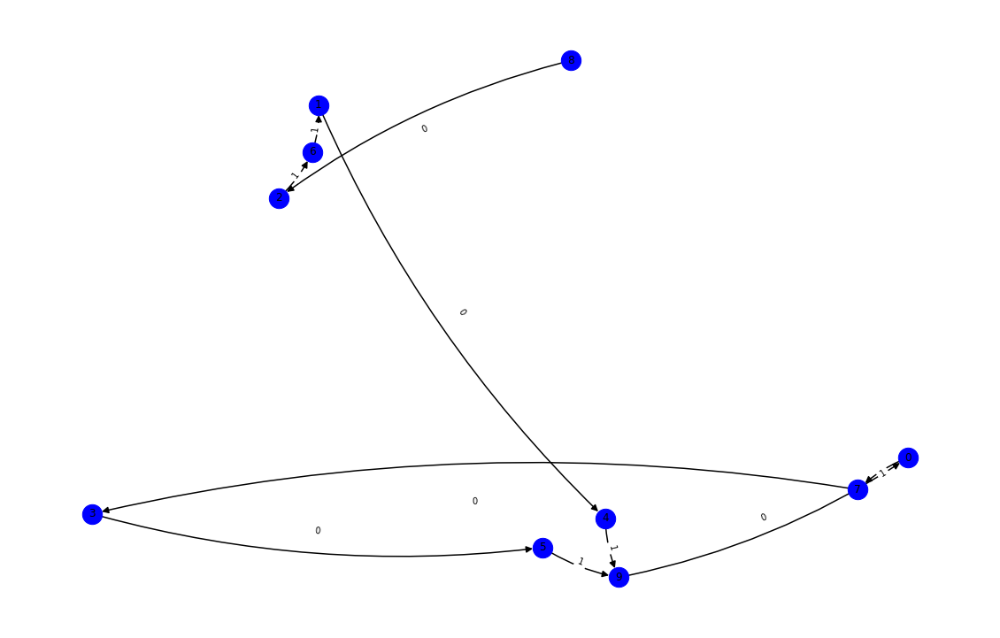

nft-id 74299
mark_dict {'0x2f5c3ad3fc1df53c33693b1f17a9bb5eb79c180c': 0, '0x60251579f5d1be1483ecac3519c9f0515dd9e023': 1, '0x21d32046de273c1a11251252ecb4bebd6f693819': 2, '0x0000000000000000000000000000000000000000': 3, '0x4388bc3f1452b3b344417e1432f56c570da1ecdc': 4, '0x73d30ba3dc4ffd17c28cc2d75d12e50df98f29cf': 5}


/tmp/ipykernel_5475/3884800010.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


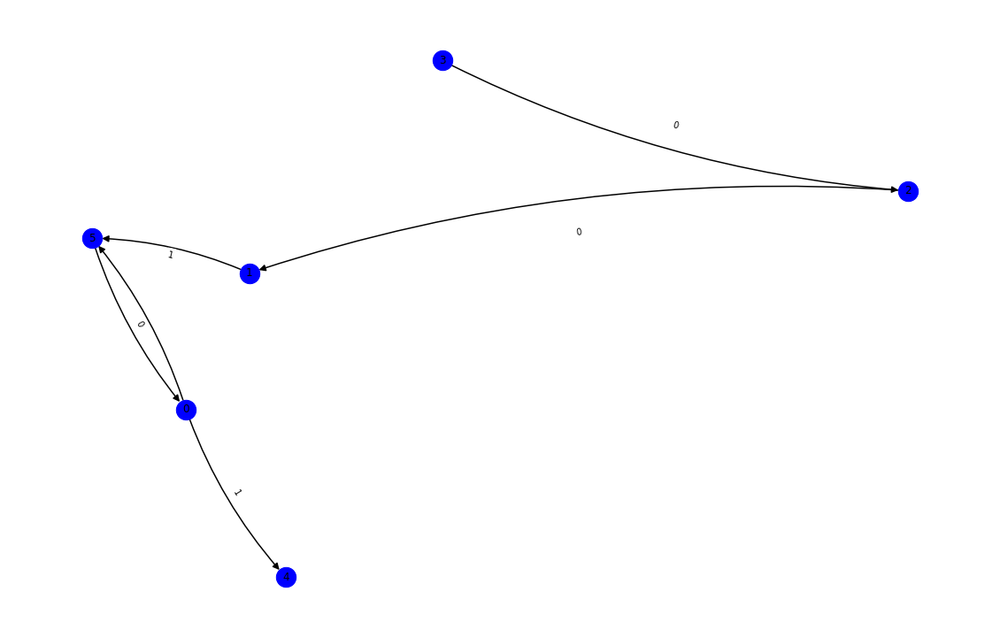

In [248]:
import networkx as nx
import networkx as nx
import matplotlib.pyplot as plt
from random import randint
%matplotlib inline
def plot_dg(df,col1,col2):
    DG = nx.from_pandas_edgelist(
        df=df,
        source=col1,
        target=col2,
        edge_attr=True,
        create_using=nx.DiGraph()
    )
    fig, ax = plt.subplots(figsize=(20, 13))
    fig.patch.set_facecolor('white')
    pos = nx.spring_layout(DG, iterations=50, seed=1721)
    nx.draw(
        G=DG,
        pos=pos,
        arrowsize=15,
        connectionstyle='arc3, rad = 0.1',
        node_color='blue',
        with_labels=True,
        node_size=500,
        width=1.5
        )
    nx.draw_networkx_edge_labels(
        DG,
        pos=pos,
        edge_labels=nx.get_edge_attributes(DG,'weight')
        )
    plt.show()
    
nft_list = nft_data_merge[(nft_data_merge['label_iso'] == -1) & (nft_data_merge['outer_label'] == 1) & (nft_data_merge['seller_address'] !=zero_nft)]['nft_token_id']

# tg_id = nft_list.tolist()[5]
def plot_flow(tg_id):
    print("="*30)
    print('nft-id',tg_id)
    tg_cols = ['seller_address','buyer_address']
    data4_cnt2 = nft_data[nft_data['nft_token_id'] == tg_id]
    data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)
    data4_cnt2 = data4_cnt2.groupby(tg_cols).agg({'amount_stu':'sum'})
    # data4_cnt2['amount'] = np.round(data4_cnt2['amount'],0)
    data4_cnt2 = data4_cnt2.rename(columns={'amount_stu':'weight'}).reset_index()
    add_mark = list(set(data4_cnt2['seller_address'])|set(data4_cnt2['buyer_address']))
    mark_dict = {}
    for i,v in enumerate(add_mark):
        mark_dict[v] = i

    data4_cnt2['seller_mark'] = data4_cnt2['seller_address'].map(mark_dict)
    data4_cnt2['buy_mark'] = data4_cnt2['buyer_address'].map(mark_dict)
    tg_cols1 = ['seller_mark','buy_mark']
    # tg_cols1 = ['seller_address','buyer_address']
    print("mark_dict",mark_dict)
    # data4_cnt2 = data4_cnt2.groupby(tg_cols).agg({'nft_token_id':'count'})
    # data4_cnt2 = data4_cnt2.rename(columns={'nft_token_id':'weight'}).reset_index()
    plot_dg(data4_cnt2,tg_cols1[0],tg_cols1[1])
    
for tg_id in nft_list.unique().tolist():
    plot_flow(tg_id)


In [259]:
cols_1 = ['transaction_hash','nft_token_id']

hash_list = nft_data_merge[(nft_data_merge['label_iso'] == -1) & (nft_data_merge['outer_label'] == 1) & (nft_data_merge['seller_address'] !=zero_nft)][cols_1]
hash_list = hash_list.drop_duplicates()
# hash_df = pd.DataFrame()
# hash_df['transaction_hash'] = hash_list
# hash_list.head()
hash_list.to_csv("/tmp/austen_file/Otherside_anomaly.csv",index=False)
'done'
# data2.iloc[20000:25000,:].to_csv('/tmp/austen_file/0815_v2_part4.csv')
# nft_data_merge['transaction_hash'].head()

'done'

In [258]:
hash_list.head()

,transaction_hash,nft_token_id
126418,0xd4d1f3048513ba832251de9aaeb0104ef343e6dd0f23...,75311
126561,0xb1101c9e88d879d0ca14c72cd3dc30300986d935dc64...,65693
136775,0xb29a92513dae82904ee5eeccc06017e039a1a861ca1c...,90951
139156,0x1b7e4b4da3a3284081f11395a49c819a05d465533947...,72166
146632,0xdb7c877c9411b38711b442881fbef78a7a5cfe9109ef...,88458


In [257]:
'done'

'done'

In [241]:
# nft_data_merge[(nft_data_merge['label_iso'] == -1)]['nft_token_id'].unique().tolist()[:20]

test_add = '0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2'

s_list = nft_data_merge[(nft_data_merge['label_iso'] == -1) & (nft_data_merge['outer_label'] == 1)]['seller_address']
b_list = nft_data_merge[(nft_data_merge['label_iso'] == -1) & (nft_data_merge['outer_label'] == 1)]['buyer_address']
test_add in s_list

False

In [242]:
test_add in b_list

False

In [138]:
nft_id = '54470'
test = nft_data[nft_data['nft_token_id'] == nft_id]
# test = test.groupby(['seller_address','buyer_address']).agg({'nft_token_id':'count'})
# test = test.rename(columns={'nft_token_id':'weight'}).reset_index()
test

,transaction_hash,log_index,nft_token_id,block_number,block_date,block_timestamp,seller_address,buyer_address,amount,rank11,rank1,rank2,rank_final,rank3,rank_gap
24787,0x5f43da80679a2db62efec9517e6d2bde230c31678a21...,116,54470,14688967,2022-05-01,2022-05-01 01:21:30,0x0000000000000000000000000000000000000000,0x2afc7b75b52260c27183fcfd7e902d70febd9017,0.00000,1.0,1.0,1.0,1.1,1.0,4.0
28790,0x30b8ee8be8b06979e1c2d84edc459cb8ca3805e4a77d...,32,54470,14689019,2022-05-01,2022-05-01 01:32:59,0x2afc7b75b52260c27183fcfd7e902d70febd9017,0x2a2258f2e6c3f75830f5b805623457a4ea38ca6d,4.99000,1.0,1.0,2.0,1.2,2.0,5.0
163388,0x6634abad562261ef9e3d08b1aabc1b23eb87cac281bc...,28,54470,14700983,2022-05-02,2022-05-02 22:41:15,0x2a2258f2e6c3f75830f5b805623457a4ea38ca6d,0xb08126344f4f78ffc09ac4a5a6ddadb5d1cfc23f,3.87000,1.0,1.0,3.0,1.3,3.0,6.0
187628,0xca6d3f9356501042123bb769a1c4ceaa7b9412255e10...,372,54470,14747064,2022-05-10,2022-05-10 06:30:17,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0xb44bdb0c63d543e536369fa94985350977264a61,0.00000,1.0,2.0,4.0,2.4,14.0,17.0
187635,0xca6d3f9356501042123bb769a1c4ceaa7b9412255e10...,370,54470,14747064,2022-05-10,2022-05-10 06:30:17,0xb08126344f4f78ffc09ac4a5a6ddadb5d1cfc23f,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,2.83000,1.0,1.0,4.0,1.4,4.0,7.0
196085,0x2d139186fab36fa67f9ddf6a8d8b908d9c6442041e13...,143,54470,14783554,2022-05-16,2022-05-16 02:06:55,0xb44bdb0c63d543e536369fa94985350977264a61,0xf896527c49b44aab3cf22ae356fa3af8e331f280,0.00000,1.0,1.0,5.0,1.5,5.0,8.0
201794,0x6b554279b0caba6c5889ade1bf028e506a3aebb31f12...,38,54470,14817066,2022-05-21,2022-05-21 11:42:32,0xf896527c49b44aab3cf22ae356fa3af8e331f280,0xb44bdb0c63d543e536369fa94985350977264a61,0.00000,1.0,1.0,6.0,1.6,6.0,9.0
201874,0x88cf3d28693157770d7e066fffd3780143292cd306d4...,361,54470,14817388,2022-05-21,2022-05-21 12:57:55,0xb44bdb0c63d543e536369fa94985350977264a61,0x4add85892f15b13d407bae215ab1fbec88487b82,3.10000,1.0,1.0,7.0,1.7,7.0,10.0
202203,0x8834e6b81332663e84f21b3fe3fe5892662426d537b9...,407,54470,14819503,2022-05-21,2022-05-21 21:08:00,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x1a5f1cc47f71067f736721360506b2a6250bcbdd,0.00000,1.0,2.0,8.0,2.8,19.5,22.5
202205,0x8834e6b81332663e84f21b3fe3fe5892662426d537b9...,404,54470,14819503,2022-05-21,2022-05-21 21:08:00,0x4add85892f15b13d407bae215ab1fbec88487b82,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,3.14000,1.0,1.0,8.0,1.8,8.0,11.0


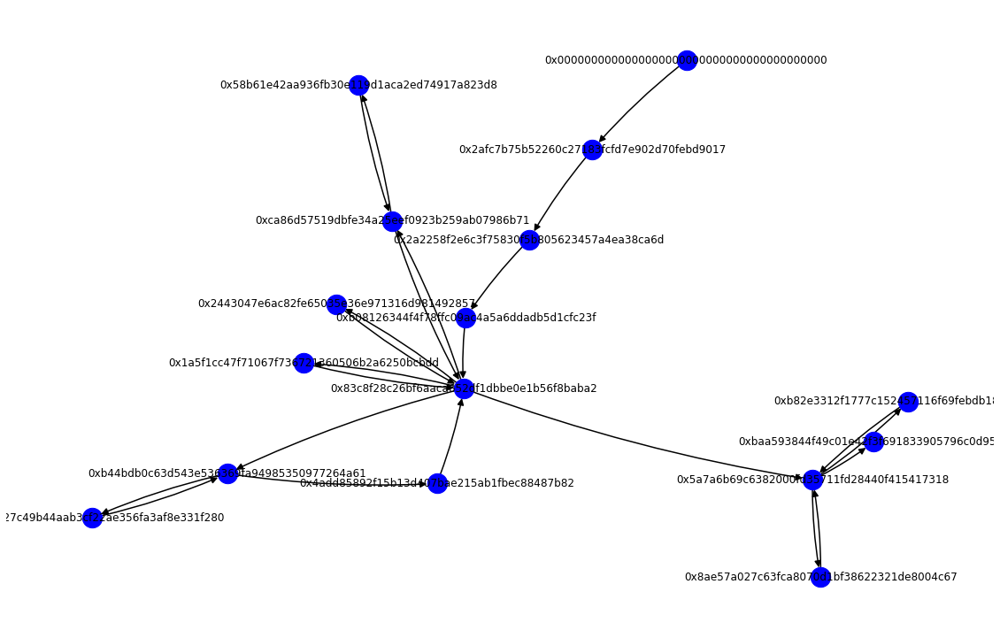

In [139]:
import networkx as nx
import matplotlib.pyplot as plt
from random import randint
%matplotlib inline

DG_3 = nx.from_pandas_edgelist(
    df=test,
    source='seller_address',
    target='buyer_address',
#     edge_attr=True,
    create_using=nx.DiGraph()
)
fig, ax = plt.subplots(figsize=(20, 13))
fig.patch.set_facecolor('white')
pos = nx.spring_layout(DG_3, iterations=30, seed=1721)
nx.draw(
    G=DG_3,
    pos=pos,
    arrowsize=15,
    connectionstyle='arc3, rad = 0.05',
    node_color='blue',
    with_labels=True,
    node_size=500,
    width=1.5
    )
nx.draw_networkx_edge_labels(
    DG_3,
    pos=pos,
    edge_labels=nx.get_edge_attributes(DG_3,'weight')
    )
# nx.draw_networkx(DG_3, pos=pos, ax=ax,    arrowsize=15,
#     connectionstyle='arc3, rad = 0.05',
#                  **plot_options)
# plt.title('Bored Ape Yacht Club: Asset ID 8099')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import sys 
sys.path.append('/utils/')
from connection import get_connection
conn = get_connection()


def get_data(sql_cont):
    data = pd.read_sql(sql_cont, con = conn)
    return data
sql_cont3 = '''
select * from `nft_transactions` where  lower(`nft_transactions`.`collection_contract_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258')
and `nft_transactions`.`nft_token_id`=54470
'''
sql_cont4 = '''
select * from `nft_transfers` where lower(`nft_transfers`.`token_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258') 
and `nft_transactions`.`nft_token_id`=54470
'''

print("get_data(sql_cont1)")
nft_tra_data3 = get_data(sql_cont3)
nft_tra_data3.head()

In [ ]:
sql_cont4 = '''
select * from `nft_transfers` where lower(`nft_transfers`.`token_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258') 
and `nft_token_id`=54470
'''
nft_tra_data4 = get_data(sql_cont4)
nft_tra_data4.head()
# nft_tsf_data.head()

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from random import randint
%matplotlib inline

DG_3 = nx.from_pandas_edgelist(
    df=nft_tra_data4,
    source='from_address',
    target='to_address',
#     edge_attr=True,
    create_using=nx.DiGraph()
)
fig, ax = plt.subplots(figsize=(20, 13))
fig.patch.set_facecolor('white')
pos = nx.spring_layout(DG_3, iterations=30, seed=1721)
nx.draw(
    G=DG_3,
    pos=pos,
    arrowsize=15,
    connectionstyle='arc3, rad = 0.05',
    node_color='blue',
    with_labels=True,
    node_size=500,
    width=1.5
    )
nx.draw_networkx_edge_labels(
    DG_3,
    pos=pos,
    edge_labels=nx.get_edge_attributes(DG_3,'weight')
    )
# nx.draw_networkx(DG_3, pos=pos, ax=ax,    arrowsize=15,
#     connectionstyle='arc3, rad = 0.05',
#                  **plot_options)
# plt.title('Bored Ape Yacht Club: Asset ID 8099')
plt.show()

In [ ]:
data4_cnt = nft_tra_data4.groupby(['from_address','to_address']).agg({'block_date':'count'})
data4_cnt = data4_cnt.rename(columns={'block_date':'weight'}).reset_index()

DG_3 = nx.from_pandas_edgelist(
    df=data4_cnt,
    source='from_address',
    target='to_address',
    edge_attr=True,
    create_using=nx.DiGraph()
)
fig, ax = plt.subplots(figsize=(20, 13))
fig.patch.set_facecolor('white')
pos = nx.spring_layout(DG_3, iterations=50, seed=1721)
nx.draw(
    G=DG_3,
    pos=pos,
    arrowsize=15,
    connectionstyle='arc3, rad = 0.05',
    node_color='blue',
    with_labels=True,
    node_size=500,
    width=1.5
    )
nx.draw_networkx_edge_labels(
    DG_3,
    pos=pos,
    edge_labels=nx.get_edge_attributes(DG_3,'weight')
    )
# nx.draw_networkx(DG_3, pos=pos, ax=ax,    arrowsize=15,
#     connectionstyle='arc3, rad = 0.05',
#                  **plot_options)
# plt.title('Bored Ape Yacht Club: Asset ID 8099')
plt.show()

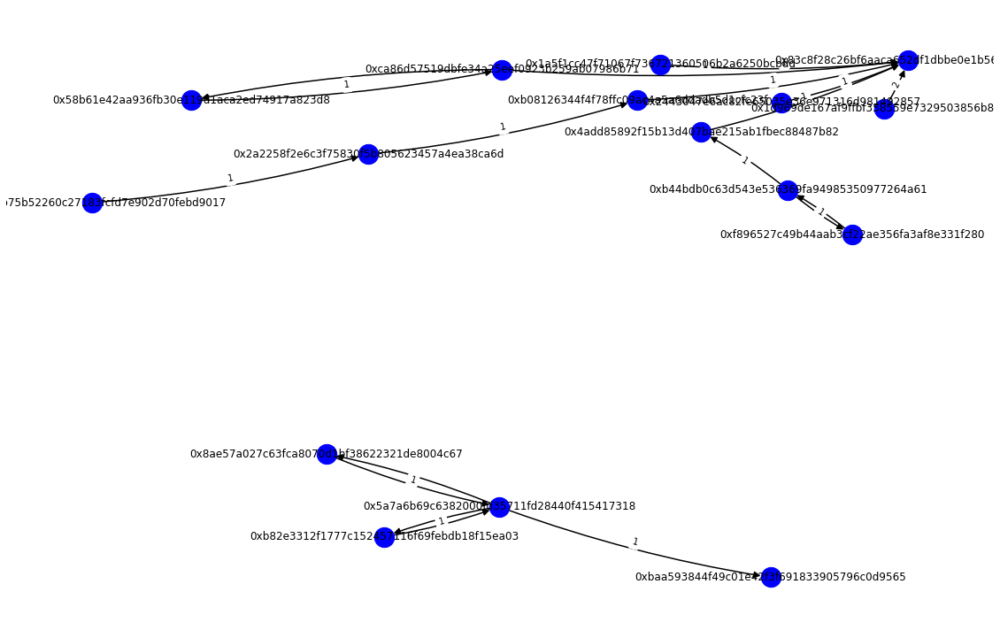

In [76]:
def plot_dg(df,col1,col2):
    DG = nx.from_pandas_edgelist(
        df=df,
        source=col1,
        target=col2,
        edge_attr=True,
        create_using=nx.DiGraph()
    )
    fig, ax = plt.subplots(figsize=(20, 13))
    fig.patch.set_facecolor('white')
    pos = nx.spring_layout(DG, iterations=50, seed=1721)
    nx.draw(
        G=DG_3,
        pos=pos,
        arrowsize=15,
        connectionstyle='arc3, rad = 0.05',
        node_color='blue',
        with_labels=True,
        node_size=500,
        width=1.5
        )
    nx.draw_networkx_edge_labels(
        DG_3,
        pos=pos,
        edge_labels=nx.get_edge_attributes(DG_3,'weight')
        )

    plt.show()
data4_cnt2 = nft_data_merge[nft_data_merge['nft_token_id'] == '54470']
data4_cnt2 = data4_cnt2.groupby(['seller_address','buyer_address']).agg({'nft_token_id':'count'})
data4_cnt2 = data4_cnt2.rename(columns={'nft_token_id':'weight'}).reset_index()
# data4_cnt2.
# plot_dg(data4_cnt2,'seller_address','buyer_address')
DG_3 = nx.from_pandas_edgelist(
    df=data4_cnt2,
    source='seller_address',
    target='buyer_address',
    edge_attr=True,
    create_using=nx.DiGraph()
)
fig, ax = plt.subplots(figsize=(20, 13))
fig.patch.set_facecolor('white')
pos = nx.spring_layout(DG_3, iterations=50, seed=1721)
nx.draw(
    G=DG_3,
    pos=pos,
    arrowsize=15,
    connectionstyle='arc3, rad = 0.05',
    node_color='blue',
    with_labels=True,
    node_size=500,
    width=1.5
    )
nx.draw_networkx_edge_labels(
    DG_3,
    pos=pos,
    edge_labels=nx.get_edge_attributes(DG_3,'weight')
    )
# nx.draw_networkx(DG_3, pos=pos, ax=ax,    arrowsize=15,
#     connectionstyle='arc3, rad = 0.05',
#                  **plot_options)
# plt.title('Bored Ape Yacht Club: Asset ID 8099')
plt.show()

In [ ]:
def plot_dg(df)
    DG = nx.from_pandas_edgelist(
        df=df,
        source='from_address',
        target='to_address',
        edge_attr=True,
        create_using=nx.DiGraph()
    )
    fig, ax = plt.subplots(figsize=(20, 13))
    fig.patch.set_facecolor('white')
    pos = nx.spring_layout(DG, iterations=50, seed=1721)
    nx.draw(
        G=DG_3,
        pos=pos,
        arrowsize=15,
        connectionstyle='arc3, rad = 0.05',
        node_color='blue',
        with_labels=True,
        node_size=500,
        width=1.5
        )
    nx.draw_networkx_edge_labels(
        DG_3,
        pos=pos,
        edge_labels=nx.get_edge_attributes(DG_3,'weight')
        )
    plt.show()


KeyboardInterrupt



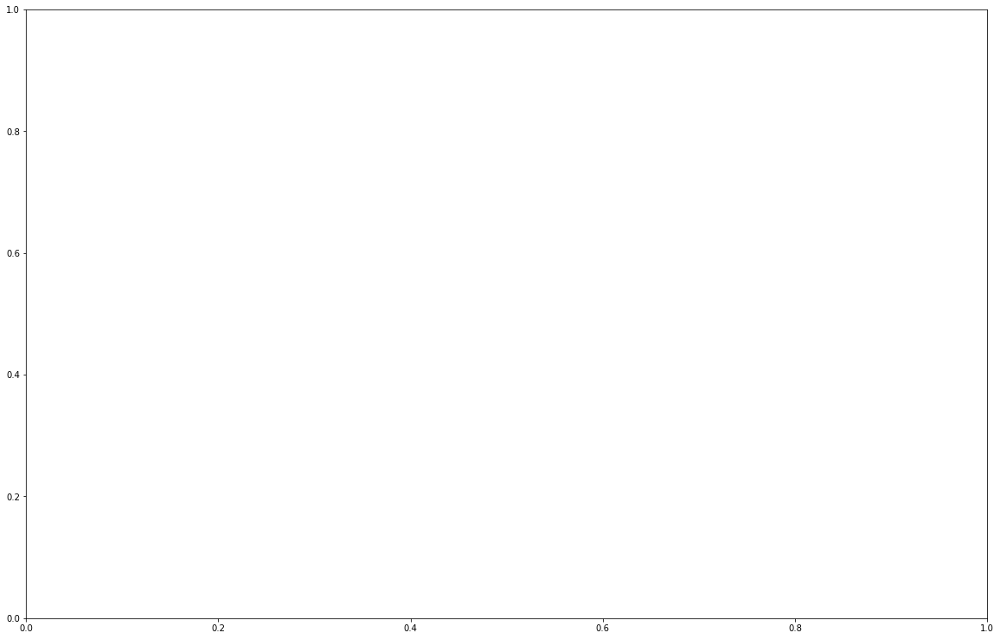

In [37]:
# import networkx as nx
# import matplotlib.pyplot as plt
# from random import randint
# %matplotlib inline

# DG_3 = nx.from_pandas_edgelist(
#     df=nft_tra_data11,
#     source='seller_address',
#     target='buyer_address',
# #     edge_attr=True,
#     create_using=nx.DiGraph()
# )
# fig, ax = plt.subplots(figsize=(20, 13))
# fig.patch.set_facecolor('white')
# pos = nx.spring_layout(DG_3, iterations=30, seed=1721)
# nx.draw(
#     G=DG_3,
#     pos=pos,
#     arrowsize=15,
#     connectionstyle='arc3, rad = 0.05',
#     node_color='blue',
#     with_labels=True,
#     node_size=500,
#     width=1.5
#     )
# nx.draw_networkx_edge_labels(
#     DG_3,
#     pos=pos,
#     edge_labels=nx.get_edge_attributes(DG_3,'weight')
#     )
# # nx.draw_networkx(DG_3, pos=pos, ax=ax,    arrowsize=15,
# #     connectionstyle='arc3, rad = 0.05',
# #                  **plot_options)
# # plt.title('Bored Ape Yacht Club: Asset ID 8099')
# plt.show()

In [44]:
nft_tra_data11 = nft_tra_data11[nft_tra_data11['nft_token_id'] == '54470']
nft_tra_data11 = nft_tra_data11.sort_values(by=['block_timestamp','block_number','log_index'])
nft_tra_data11

,transaction_hash,block_number,log_index,block_timestamp,chain,collection_contract_address,collection_slug,nft_token_id,marketplace_contract_address,marketplace_slug,...,buyer_address,seller_address,royalty_rate,royalty_amount,royalty_value,platform_fee_rate,platform_fees_amount,platform_fees_value,block_date,trade_type
24511,0x30b8ee8be8b06979e1c2d84edc459cb8ca3805e4a77d...,14689019,32,2022-05-01 01:32:59,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x7f268357a8c2552623316e2562d90e642bb538e5,opensea,...,0x2a2258f2e6c3f75830f5b805623457a4ea38ca6d,0x2afc7b75b52260c27183fcfd7e902d70febd9017,0.000000e+00,0.000000e+00,0.000000,0.075,0.374250,1024.419061,2022-05-01,single
33467,0x6634abad562261ef9e3d08b1aabc1b23eb87cac281bc...,14700983,28,2022-05-02 22:41:15,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x7f268357a8c2552623316e2562d90e642bb538e5,opensea,...,0xb08126344f4f78ffc09ac4a5a6ddadb5d1cfc23f,0x2a2258f2e6c3f75830f5b805623457a4ea38ca6d,0.000000e+00,0.000000e+00,0.000000,0.075,0.290250,831.149515,2022-05-02,single
8295,0xca6d3f9356501042123bb769a1c4ceaa7b9412255e10...,14747064,370,2022-05-10 06:30:17,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x59728544b08ab483533076417fbbb2fd0b17ce3a,looksrare,...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0xb08126344f4f78ffc09ac4a5a6ddadb5d1cfc23f,5.000000e-02,1.415000e-01,343.092438,0.020,0.056600,137.236975,2022-05-10,single
6579,0x88cf3d28693157770d7e066fffd3780143292cd306d4...,14817388,361,2022-05-21 12:57:55,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x59728544b08ab483533076417fbbb2fd0b17ce3a,looksrare,...,0x4add85892f15b13d407bae215ab1fbec88487b82,0xb44bdb0c63d543e536369fa94985350977264a61,5.000000e-02,1.550000e-01,304.830081,0.020,0.062000,121.932033,2022-05-21,single
38736,0x8834e6b81332663e84f21b3fe3fe5892662426d537b9...,14819503,403,2022-05-21 21:08:00,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x7f268357a8c2552623316e2562d90e642bb538e5,opensea,...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x1d969de167af9ffbf358559e7329503856b831df,0.000000e+00,0.000000e+00,0.000000,0.000,0.000000,0.000000,2022-05-21,single
14331,0x8834e6b81332663e84f21b3fe3fe5892662426d537b9...,14819503,404,2022-05-21 21:08:00,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x74312363e45dcaba76c59ec49a7aa8a65a67eed3,x2y2,...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x4add85892f15b13d407bae215ab1fbec88487b82,8.507879e-17,2.671474e-16,-30.976724,0.005,0.015700,30.992424,2022-05-21,single
38737,0x8834e6b81332663e84f21b3fe3fe5892662426d537b9...,14819503,407,2022-05-21 21:08:00,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x7f268357a8c2552623316e2562d90e642bb538e5,opensea,...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x1d969de167af9ffbf358559e7329503856b831df,0.000000e+00,0.000000e+00,0.000000,0.000,0.000000,0.000000,2022-05-21,single
16552,0xef79ea270fd9d6184599d8ecf78edbae3b019842e051...,14962302,604,2022-06-14 14:50:21,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x59728544b08ab483533076417fbbb2fd0b17ce3a,looksrare,...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x1a5f1cc47f71067f736721360506b2a6250bcbdd,5.000000e-02,9.900000e-02,120.629635,0.020,0.039600,48.251854,2022-06-14,single
21565,0x90d36d43b6684392ff1d33af4589aa10e2a26a4bbf9d...,15279849,434,2022-08-05 03:17:40,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x59728544b08ab483533076417fbbb2fd0b17ce3a,looksrare,...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x2443047e6ac82fe65035e36e971316d981492857,5.000000e-02,1.100000e-01,182.320061,0.020,0.044000,72.928025,2022-08-05,single
21715,0xcb6ae9c251fdbc0b28785e52cdf0e99c1554a8ae213c...,15304232,266,2022-08-08 22:21:04,Ethereum,0x34d85c9cdeb23fa97cb08333b511ac86e1c4e258,otherdeed,54470,0x59728544b08ab483533076417fbbb2fd0b17ce3a,looksrare,...,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0xca86d57519dbfe34a25ee

In [87]:
import pandas as pd
import numpy as np
import sys 
sys.path.append('/utils/')
from connection import get_connection
conn = get_connection()
sql_cont1 = '''

'''

def get_data(sql_cont):
    data = pd.read_sql(sql_cont, con = conn)
    return data
sql_cont1 = '''
select * from `nft_transactions` where  lower(`nft_transactions`.`collection_contract_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258')
'''
sql_cont2 = '''
select * from `nft_transfers` where lower(`nft_transfers`.`token_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258') 
'''

print("get_data(sql_cont1)")
nft_tra_data = get_data(sql_cont1)
print("get_data(sql_cont2)")
nft_tsf_data = get_data(sql_cont2)
col1 = ['transaction_hash','log_index','nft_token_id', 'block_number','block_date','block_timestamp','seller_address','buyer_address','amount']
col2 = ['transaction_hash','log_index','nft_token_id','block_number','block_date','block_timestamp','from_address','to_address']
nft_tsf_data_new = nft_tsf_data[col2]
nft_tsf_data_new = nft_tsf_data_new.rename(columns={'from_address':'seller_address',
                                                   'to_address':'buyer_address'})

tra_hash = nft_tra_data['transaction_hash'].unique().tolist()
# nft_tsf_data_new = nft_tsf_data_new[~nft_tsf_data_new['transaction_hash'].isin(tra_hash)]
nft_tsf_data_new['amount'] = 0
nft_tra_data_new = nft_tra_data[col1]
nft_data = pd.concat([nft_tsf_data_new,nft_tra_data_new],ignore_index=True)
nft_data = nft_data.sort_values(by=['block_timestamp','block_number'])
nft_data = nft_data.drop_duplicates()
nft_data.head()
# nft_data['rank1'] = nft_data.groupby(['nft_token_id','block_timestamp']).log_index.transform(lambda x:x.rank())
# nft_data_cp = nft_data[['nft_token_id','block_timestamp']].drop_duplicates()

# nft_data_cp['rank2'] = nft_data_cp.groupby(['nft_token_id']).block_timestamp.transform(lambda x:x.rank())
# nft_data = nft_data.merge(nft_data_cp,how='left',on=['nft_token_id','block_timestamp'])
# nft_data['rank_final'] = nft_data['rank1'] + nft_data['rank2']*0.1
# nft_data['rank3'] = nft_data.groupby(['nft_token_id']).rank_final.transform(lambda x:x.rank())
# print("rank finish")

# gap_v = 2
# save_cols = ['nft_token_id','seller_address', 'buyer_address','amount','rank_gap','block_timestamp']
# save_cols_or = ['nft_token_id','seller_address', 'buyer_address','amount','rank3','block_timestamp']

# def merge_gap_data(nft_data,gap_v):

#     nft_data['rank_gap'] = nft_data['rank3'] + gap_v
#     sv_nft_data = nft_data[save_cols_or]
#     sv_nft_data_new = nft_data[save_cols]
#     rename_col = {}
#     for col in ['seller_address', 'buyer_address','amount','block_timestamp']:
#         rename_col[col] = "%s_%s"%(col,gap_v)
#     rename_col['rank_gap'] = 'rank3'
#     sv_nft_data_new = sv_nft_data_new.rename(columns=rename_col)
# #     sv_nft_data = sv_nft_data.merge(sv_nft_data_new,how='left',on=['nft_token_id','rank3'])
#     return sv_nft_data_new

# range_num = 17
# half_v = int(range_num/2)
# gap_list = [i-half_v for i in range(range_num)]
# gap_list.remove(0)

# nft_data_merge = nft_data[save_cols_or+['transaction_hash']]


# for i in gap_list:
#     print("="*30)
#     print(i)
#     new_nft_data = merge_gap_data(nft_data,i)
#     nft_data_merge = nft_data_merge.merge(new_nft_data,how='left',on=['nft_token_id','rank3'])

# nft_data_merge.head()
# print("merge finish")




get_data(sql_cont1)
get_data(sql_cont2)


,transaction_hash,log_index,nft_token_id,block_number,block_date,block_timestamp,seller_address,buyer_address,amount
232362,0xe89f544d0a91ab101e390657688ec33706479ff33073...,13,30000,14679593,2022-04-29,2022-04-29 13:58:11,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0
232363,0xe89f544d0a91ab101e390657688ec33706479ff33073...,14,30001,14679593,2022-04-29,2022-04-29 13:58:11,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0
232364,0xe89f544d0a91ab101e390657688ec33706479ff33073...,15,30002,14679593,2022-04-29,2022-04-29 13:58:11,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0
232365,0xe89f544d0a91ab101e390657688ec33706479ff33073...,16,30003,14679593,2022-04-29,2022-04-29 13:58:11,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0
232366,0xe89f544d0a91ab101e390657688ec33706479ff33073...,17,30004,14679593,2022-04-29,2022-04-29 13:58:11,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0


/tmp/ipykernel_13691/1628568787.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


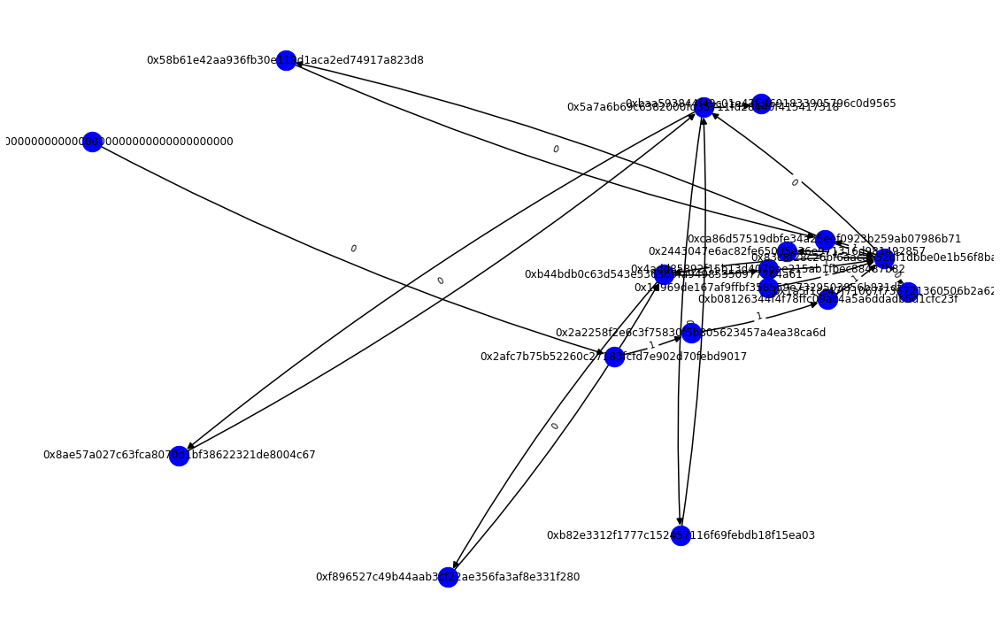

In [131]:

def plot_dg(df,col1,col2):
    DG = nx.from_pandas_edgelist(
        df=df,
        source=col1,
        target=col2,
        edge_attr=True,
        create_using=nx.DiGraph()
    )
    fig, ax = plt.subplots(figsize=(20, 13))
    fig.patch.set_facecolor('white')
    pos = nx.spring_layout(DG, iterations=50, seed=1721)
    nx.draw(
        G=DG,
        pos=pos,
        arrowsize=15,
        connectionstyle='arc3, rad = 0.05',
        node_color='blue',
        with_labels=True,
        node_size=500,
        width=1.5
        )
    nx.draw_networkx_edge_labels(
        DG,
        pos=pos,
        edge_labels=nx.get_edge_attributes(DG,'weight')
        )
    plt.show()
tg_cols = ['seller_address','buyer_address']
data4_cnt2 = nft_data[nft_data['nft_token_id'] == '54470']
data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)
data4_cnt2 = data4_cnt2.groupby(tg_cols).agg({'amount_stu':'sum'})
# data4_cnt2['amount'] = np.round(data4_cnt2['amount'],0)
data4_cnt2 = data4_cnt2.rename(columns={'amount_stu':'weight'}).reset_index()

# data4_cnt2 = data4_cnt2.groupby(tg_cols).agg({'nft_token_id':'count'})
# data4_cnt2 = data4_cnt2.rename(columns={'nft_token_id':'weight'}).reset_index()
plot_dg(data4_cnt2,tg_cols[0],tg_cols[1])

/tmp/ipykernel_5475/2938763318.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)


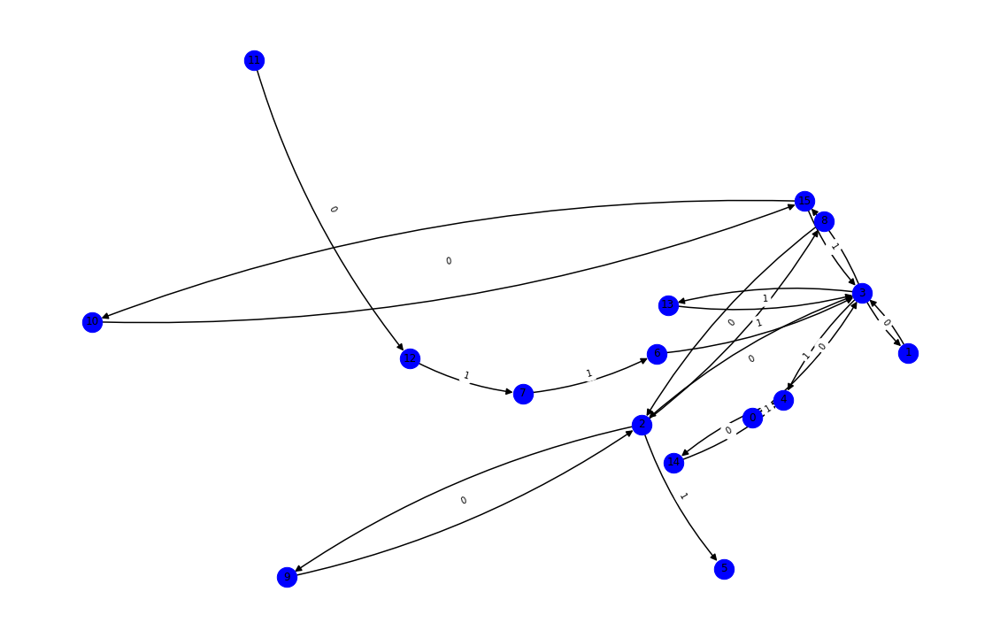

In [8]:
import networkx as nx
import networkx as nx
import matplotlib.pyplot as plt
from random import randint
%matplotlib inline
def plot_dg(df,col1,col2):
    DG = nx.from_pandas_edgelist(
        df=df,
        source=col1,
        target=col2,
        edge_attr=True,
        create_using=nx.DiGraph()
    )
    fig, ax = plt.subplots(figsize=(20, 13))
    fig.patch.set_facecolor('white')
    pos = nx.spring_layout(DG, iterations=25, seed=1721)
    nx.draw(
        G=DG,
        pos=pos,
        arrowsize=15,
        connectionstyle='arc3, rad = 0.1',
        node_color='blue',
        with_labels=True,
        node_size=500,
        width=1.5
        )
    nx.draw_networkx_edge_labels(
        DG,
        pos=pos,
        edge_labels=nx.get_edge_attributes(DG,'weight')
        )
    plt.show()

aa_v = ['46391',
 '51734',
 '51392',
 '50787',
 '46574',
 '51600',
 '53375',
 '48729',
 '54228',
 '54237',
 '46369',
 '49118',
 '49723',
 '51602',
 '48354',
 '57024',
 '53384',
 '54470',
 '51582',
 '56897']

tg_cols = ['seller_address','buyer_address']
data4_cnt2 = nft_data_merge[nft_data_merge['nft_token_id'] == aa_v[-3]]
# data4_cnt2 = data4_cnt2.sort_values(by=['block_timestamp','block_number','log_index'])


add_mark = list(set(data4_cnt2['seller_address'])|set(data4_cnt2['buyer_address']))
mark_dict = {}
for i,v in enumerate(add_mark):
    mark_dict[v] = i 

# data4_cnt2['rank11'] = data4_cnt2.groupby(['seller_address','buyer_address','block_timestamp']).amount.transform(lambda x:x.rank(ascending=False))
# data4_cnt2 = data4_cnt2[data4_cnt2['rank11']==1]
data4_cnt2['amount_stu'] = (data4_cnt2['amount'] > 0).astype(int)
data4_cnt2 = data4_cnt2.groupby(tg_cols).agg({'amount_stu':'sum'})
# data4_cnt2['amount'] = np.round(data4_cnt2['amount'],0)
data4_cnt2 = data4_cnt2.rename(columns={'amount_stu':'weight'}).reset_index()
data4_cnt2['seller_mark'] = data4_cnt2['seller_address'].map(mark_dict)
data4_cnt2['buy_mark'] = data4_cnt2['buyer_address'].map(mark_dict)

tg_cols1 = ['seller_mark','buy_mark']
# tg_cols1 = ['seller_address','buyer_address']
plot_dg(data4_cnt2,tg_cols1[0],tg_cols1[1])

In [96]:
data4_cnt2

,transaction_hash,log_index,nft_token_id,block_number,block_date,block_timestamp,seller_address,buyer_address,amount,rank11
35755,0x5f43da80679a2db62efec9517e6d2bde230c31678a21...,116,54470,14688967,2022-05-01,2022-05-01 01:21:30,0x0000000000000000000000000000000000000000,0x2afc7b75b52260c27183fcfd7e902d70febd9017,0.00000,1.0
269764,0x30b8ee8be8b06979e1c2d84edc459cb8ca3805e4a77d...,32,54470,14689019,2022-05-01,2022-05-01 01:32:59,0x2afc7b75b52260c27183fcfd7e902d70febd9017,0x2a2258f2e6c3f75830f5b805623457a4ea38ca6d,4.99000,1.0
278862,0x6634abad562261ef9e3d08b1aabc1b23eb87cac281bc...,28,54470,14700983,2022-05-02,2022-05-02 22:41:15,0x2a2258f2e6c3f75830f5b805623457a4ea38ca6d,0xb08126344f4f78ffc09ac4a5a6ddadb5d1cfc23f,3.87000,1.0
260858,0xca6d3f9356501042123bb769a1c4ceaa7b9412255e10...,370,54470,14747064,2022-05-10,2022-05-10 06:30:17,0xb08126344f4f78ffc09ac4a5a6ddadb5d1cfc23f,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,2.83000,1.0
197974,0xca6d3f9356501042123bb769a1c4ceaa7b9412255e10...,372,54470,14747064,2022-05-10,2022-05-10 06:30:17,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0xb44bdb0c63d543e536369fa94985350977264a61,0.00000,1.0
206368,0x2d139186fab36fa67f9ddf6a8d8b908d9c6442041e13...,143,54470,14783554,2022-05-16,2022-05-16 02:06:55,0xb44bdb0c63d543e536369fa94985350977264a61,0xf896527c49b44aab3cf22ae356fa3af8e331f280,0.00000,1.0
212032,0x6b554279b0caba6c5889ade1bf028e506a3aebb31f12...,38,54470,14817066,2022-05-21,2022-05-21 11:42:32,0xf896527c49b44aab3cf22ae356fa3af8e331f280,0xb44bdb0c63d543e536369fa94985350977264a61,0.00000,1.0
257094,0x88cf3d28693157770d7e066fffd3780143292cd306d4...,361,54470,14817388,2022-05-21,2022-05-21 12:57:55,0xb44bdb0c63d543e536369fa94985350977264a61,0x4add85892f15b13d407bae215ab1fbec88487b82,3.10000,1.0
267588,0x8834e6b81332663e84f21b3fe3fe5892662426d537b9...,404,54470,14819503,2022-05-21,2022-05-21 21:08:00,0x4add85892f15b13d407bae215ab1fbec88487b82,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,3.14000,1.0
212440,0x8834e6b81332663e84f21b3fe3fe5892662426d537b9...,407,54470,14819503,2022-05-21,2022-05-21 21:08:00,0x83c8f28c26bf6aaca652df1dbbe0e1b56f8baba2,0x1a5f1cc47f71067f736721360506b2a6250bcbdd,0.00000,1.0


In [2]:
nft_data_merge.head()

,nft_token_id,seller_address,buyer_address,amount,rank3,block_timestamp,transaction_hash,seller_address_-8,buyer_address_-8,amount_-8,...,amount_6,block_timestamp_6,seller_address_7,buyer_address_7,amount_7,block_timestamp_7,seller_address_8,buyer_address_8,amount_8,block_timestamp_8
0,30000,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
1,30001,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
2,30002,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
3,30003,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT
4,30004,0x0000000000000000000000000000000000000000,0xef9497439548c5967b179d80a49e829efa2a9300,0.0,1.0,2022-04-29 13:58:11,0xe89f544d0a91ab101e390657688ec33706479ff33073...,NaN,NaN,NaN,...,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT


In [82]:
nft_desc = nft_data.groupby(['nft_token_id']).agg({'amount':'count'})
nft_desc

,amount
nft_token_id,
0,1
1,1
10,5
100,1
1000,1
...,...
99995,2
99996,4
99997,1


In [83]:
nft_desc.describe()

,amount
count,100000.000000
mean,2.485070
std,2.151809
min,1.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,163.000000


In [84]:
np.percentile(nft_desc['amount'],90)

5.0

In [ ]:
import pandas as pd
import numpy as np
import sys 
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
sys.path.append('/utils/')
from connection import get_connection
from sklearn.ensemble import IsolationForest

save_cols = ['nft_token_id','seller_address', 'buyer_address','amount','rank_gap','block_timestamp']
save_cols_or = ['nft_token_id','seller_address', 'buyer_address','amount','rank3','block_timestamp']
conn = get_connection()
gap_v = 2

def get_data(sql_cont):
    data = pd.read_sql(sql_cont, con = conn)
    return data
sql_cont1 = '''
select * from `nft_transactions` where  lower(`nft_transactions`.`collection_contract_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258')
'''
sql_cont2 = '''
select * from `nft_transfers` where lower(`nft_transfers`.`token_address`)=lower('0x34d85c9CDeB23FA97cb08333b511ac86E1C4E258') 
'''
def get_nft_data(sql_cont1,sql_cont2):
    print("get_data(sql_cont1)")
    nft_tra_data = get_data(sql_cont1)
    print("get_data(sql_cont2)")
    nft_tsf_data = get_data(sql_cont2)
    col1 = ['transaction_hash','log_index','nft_token_id', 'block_number','block_date','block_timestamp','seller_address','buyer_address','amount']
    col2 = ['transaction_hash','log_index','nft_token_id','block_number','block_date','block_timestamp','from_address','to_address']
    nft_tsf_data_new = nft_tsf_data[col2]
    nft_tsf_data_new = nft_tsf_data_new.rename(columns={'from_address':'seller_address',
                                                       'to_address':'buyer_address'})



    # tra_hash = nft_tra_data['transaction_hash'].unique().tolist()
    # nft_tsf_data_new = nft_tsf_data_new[~nft_tsf_data_new['transaction_hash'].isin(tra_hash)]
    nft_tsf_data_new['amount'] = 0
    nft_tra_data_new = nft_tra_data[col1]
    nft_data = pd.concat([nft_tsf_data_new,nft_tra_data_new],ignore_index=True)
    print("开始排序")
    nft_data['rank11'] = nft_data.groupby(['seller_address','buyer_address','nft_token_id','block_timestamp']).amount.transform(lambda x:x.rank(ascending=False))
    nft_data = nft_data[nft_data['rank11']==1]

    print("排序完成")

    nft_data = nft_data.sort_values(by=['block_timestamp','block_number'])
    nft_data = nft_data.drop_duplicates()
    nft_data['rank1'] = nft_data.groupby(['nft_token_id','block_timestamp']).log_index.transform(lambda x:x.rank())
    nft_data_cp = nft_data[['nft_token_id','block_timestamp']].drop_duplicates()

    nft_data_cp['rank2'] = nft_data_cp.groupby(['nft_token_id']).block_timestamp.transform(lambda x:x.rank())
    nft_data = nft_data.merge(nft_data_cp,how='left',on=['nft_token_id','block_timestamp'])
    nft_data['rank_final'] = nft_data['rank1'] + nft_data['rank2']*0.1
    nft_data['rank3'] = nft_data.groupby(['nft_token_id']).rank_final.transform(lambda x:x.rank())
    print("rank finish")
    return nft_data



def merge_gap_data(nft_data,gap_v):

    nft_data['rank_gap'] = nft_data['rank3'] + gap_v
    sv_nft_data = nft_data[save_cols_or]
    sv_nft_data_new = nft_data[save_cols]
    rename_col = {}
    for col in ['seller_address', 'buyer_address','amount','block_timestamp']:
        rename_col[col] = "%s_%s"%(col,gap_v)
    rename_col['rank_gap'] = 'rank3'
    sv_nft_data_new = sv_nft_data_new.rename(columns=rename_col)
#     sv_nft_data = sv_nft_data.merge(sv_nft_data_new,how='left',on=['nft_token_id','rank3'])
    return sv_nft_data_new



def get_sell_len(df):
    sell_list = [df[col] for col in col_sell]
    return len(set(sell_list))


def get_buy_len(df):
    buy_list = [df[col] for col in col_buy]
    return len(set(buy_list))



def get_buyNsell_len(df):
    sell_list = [df[col] for col in col_sell]
    buy_list = [df[col] for col in col_buy]
    return len(set(sell_list) & set(buy_list))


def get_sell_ratio(df):
    sell_list = [df[col] for col in col_sell]
    return len(set(sell_list))/len(sell_list)


def get_buy_ratio(df):
    buy_list = [df[col] for col in col_buy]
    return len(set(buy_list))/len(buy_list)


def get_buyNsell_ratio(df):
    sell_list = [df[col] for col in col_sell]
    buy_list = [df[col] for col in col_buy]
    return len(set(sell_list) & set(buy_list))/len(sell_list+buy_list)



def get_sell_cnt(df):
    add_list = [df[col] for col in col_sell]
    amount_list = [df[col] for col in col_amount]
    tg_address = df['seller_address']
    s_cnt = 0
    for b,a in zip(add_list,amount_list):
        if (b==tg_address) & (a > 0):
            s_cnt +=1
    return s_cnt


def get_buy_cnt(df):
    add_list = [df[col] for col in col_buy]
    amount_list = [df[col] for col in col_amount]
    tg_address = df['buyer_address']
    s_cnt = 0
    for b,a in zip(add_list,amount_list):
        if (b==tg_address) & (a > 0):
            s_cnt +=1
    return s_cnt


def kmeans_outliers(data, clusters, is_scale = True):
    # 指定聚类个数，准备进行数据聚类
    kmeans = KMeans(n_clusters=clusters)
    # 用于存储聚类相关的结果
    cluster_res = []

    # 判断是否需要对数据做标准化处理
    if is_scale:
        std_data = scale(data) # 标准化
        kmeans.fit(std_data)  # 聚类拟合
        # 返回簇标签
        labels = kmeans.labels_
        # 返回簇中心
        centers = kmeans.cluster_centers_

        for label in set(labels):
            # 计算簇内样本点与簇中心的距离
            diff = std_data[np.array(labels) == label,] - \
                   - np.array(centers[label])
            dist = np.sum(np.square(diff), axis=1)
            # 计算判断异常的阈值
            UL = dist.mean() + 3*dist.std()
            # 识别异常值，1表示异常，0表示正常
            OutLine = np.where(dist > UL, 1, 0) 
            raw_data = data.loc[np.array(labels) == label,]
            new_data = pd.DataFrame({'Label':label,'Dist':dist,'OutLier':OutLine})
            # 重新修正两个数据框的行编号
            raw_data.index = new_data.index = range(raw_data.shape[0])
            # 数据的列合并
            cluster_res.append(pd.concat([raw_data,new_data], axis = 1))
    else:
        kmeans.fit(data)  # 聚类拟合
        # 返回簇标签
        labels = kmeans.labels_
        # 返回簇中心
        centers = kmeans.cluster_centers_

        for label in set(labels):
            # 计算簇内样本点与簇中心的距离
            diff = np.array(data.loc[np.array(labels) == label,]) - \
                   - np.array(centers[label])

            dist = np.sum(np.square(diff), axis=1)
            UL = dist.mean() + 3*dist.std()
            OutLine = np.where(dist > UL, 1, 0)
            raw_data = data.loc[np.array(labels) == label,]
            new_data = pd.DataFrame({
#                 'Label':label,
                'Dist':dist,'OutLier':OutLine})
            raw_data.index = new_data.index = range(raw_data.shape[0])
            cluster_res.append(pd.concat([raw_data,new_data], axis = 1))
    # 返回数据的行合并结果    
    return pd.concat(cluster_res)

def get_nft_data_merge(nft_data):
    range_num = 10
    half_v = int(range_num/2)
    gap_list = [i for i in range(1,range_num)]
    # gap_list.remove(0)
    nft_data_merge = nft_data[save_cols_or+['transaction_hash']]
    for i in gap_list:
        print("="*30)
        print(i)
        new_nft_data = merge_gap_data(nft_data,i)
        nft_data_merge = nft_data_merge.merge(new_nft_data,how='left',on=['nft_token_id','rank3'])


    col_sell = [col for col in nft_data_merge.columns.tolist() if 'seller' in col]
    col_buy = [col for col in nft_data_merge.columns.tolist() if 'buyer' in col]
    col_amount = [col for col in nft_data_merge.columns.tolist() if 'amount' in col]


    col_time = [col for col in nft_data_merge.columns.tolist() if 'block_timestamp' in col]
    col_time.remove("block_timestamp")
    nft_data_merge['block_timestamp'] = pd.to_datetime(nft_data_merge['block_timestamp'])
    for i,_ in enumerate(col_time):
        nft_data_merge[col_time[i]] = pd.to_datetime(nft_data_merge[col_time[i]])
        nft_data_merge['gap_time_%s'%(i)] = (nft_data_merge['block_timestamp'] - nft_data_merge[col_time[i]]).dt.seconds
    return nft_data_merge

nft_data = get_nft_data(sql_cont1,sql_cont2)
nft_data_merge = get_nft_data_merge(nft_data)
    

gap_time = [col for col in nft_data_merge.columns.tolist() if 'gap_time' in col]
nft_data_merge['sell_len'] = nft_data_merge.apply(get_sell_len,axis=1)
nft_data_merge['buy_len'] = nft_data_merge.apply(get_buy_len,axis=1)
nft_data_merge['buy_sell_len'] = nft_data_merge.apply(get_buyNsell_len,axis=1)

nft_data_merge['sell_ratio'] = nft_data_merge.apply(get_sell_ratio,axis=1)
nft_data_merge['buy_ratio'] = nft_data_merge.apply(get_buy_ratio,axis=1)
nft_data_merge['buy_sell_ratio'] = nft_data_merge.apply(get_buyNsell_ratio,axis=1)




nft_data_merge['sell_cnt'] = nft_data_merge.apply(get_sell_cnt,axis=1)
nft_data_merge['buy_cnt'] = nft_data_merge.apply(get_buy_cnt,axis=1)



nft_data_merge['s/bs'] = nft_data_merge['sell_len'] / nft_data_merge['buy_sell_len']
nft_data_merge['b/bs'] = nft_data_merge['buy_len'] / nft_data_merge['buy_sell_len']


nft_data_merge['amount_num'] = (nft_data_merge[col_amount] > 0).sum(axis=1)
nft_data_merge['amount_mean'] = nft_data_merge[col_amount].mean(axis=1)
nft_data_merge['amount_std'] = nft_data_merge[col_amount].std(axis=1)
# nft_data_merge['amount_num'] = (nft_data_merge[col_amount] > 0).sum(axis=1)
nft_data_merge['gap_time_mean'] = nft_data_merge[gap_time].mean(axis=1)
nft_data_merge['gap_time_std'] = nft_data_merge[gap_time].std(axis=1)



zero_nft = '0x0000000000000000000000000000000000000000'
# nft_data_merge = nft_data_merge[nft_data_merge['seller_address'] != zero_nft]
# nft_data_merge = nft_data_merge[nft_data_merge['amount_num'] >= 5]
# nft_data_merge = nft_data_merge[nft_data_merge['buy_sell_len'] <= 5]
# nft_data_merge.head()

# nft_data_merge.columns
from sklearn.preprocessing import StandardScaler
feat_cols = [
    'sell_len', 'buy_len', 'buy_sell_len', 
    'sell_cnt','buy_cnt'
#     'sell_ratio','buy_ratio','buy_sell_ratio','s/bs','b/bs',
#              'amount_num',
#              'gap_time_mean',
#              'gap_time_std'
            ]


sle = StandardScaler()
feat_v = sle.fit_transform(nft_data_merge[feat_cols].fillna(0))
feat_v = pd.DataFrame(feat_v)
feat_v.columns = feat_cols


K = range(1, 10)
mean_distortions = []
for k in K:
    print("k",k)
    kmeans = KMeans(n_clusters=k,random_state=2022)
    kmeans.fit(feat_v)
    mean_distortions.append(
        sum(
            np.min(
                cdist(feat_v, kmeans.cluster_centers_, metric='euclidean'), axis=1))
        / feat_v.shape[0])
plt.plot(K, mean_distortions, 'bx-')
plt.xlabel('k')


kmeans = KMeans(n_clusters=5,random_state=2022)
kmeans.fit(feat_v)
label_cluster = kmeans.predict(feat_v)
feat_v_cp = feat_v.copy(deep=True)
feat_v_cp['label'] = label_cluster



cluster_res_new = kmeans_outliers(feat_v_cp[feat_cols],5,False)
cluster_res_new = cluster_res_new.drop_duplicates()
feat_v_cp_new = feat_v_cp.merge(cluster_res_new,how='left',on=feat_cols)
nft_data_merge['cluster_label'] = label_cluster
nft_data_merge['outer_label'] = feat_v_cp_new['OutLier'].tolist()



model=IsolationForest(n_estimators=100, max_samples='auto', contamination=float(0.05))
model.fit(feat_v)
label2 = model.predict(feat_v)
nft_data_merge['label_iso'] = label2
nft_data_merge['label_iso'].value_counts()



